In [1]:
# Update pip and install dependencies
!pip install --upgrade pip
!pip install PyWavelets antropy ace_tools

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.1 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [antropy]m1/3 [PyWavelets]


In [6]:
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal, stats
from scipy.integrate import trapezoid
import pywt
import antropy as ant
from tqdm.auto import tqdm
from IPython.display import clear_output


# === Adjust this to the SHL data root ===
DATA_ROOT = '/net/tscratch/people/plgdusza/Sussex Dataset/train_4_locations'  # or 'test', 'validation'

# Define sensor locations and modalities
LOCATIONS = ['Bag', 'Hips', 'Torso', 'Hand']
MODALITIES = {
    'Acc': ['x','y','z'],
    'Gyr': ['x','y','z'],
    'Mag': ['x','y','z'],
    'Label': [''],
}

# Utility to find all .txt files
def gather_files(root):
    files = []
    for loc in LOCATIONS:
        loc_path = os.path.join(root, loc)
        for mod, axes in MODALITIES.items():
            for axis in axes:
                if mod == 'Label':
                    pattern = f"{mod}" + ".txt"
                else:
                    pattern = f"{mod}" + (f"_{axis}" if axis else "") + ".txt"
                files.extend(glob.glob(os.path.join(loc_path, pattern)))
    return files

all_txt_files = gather_files(DATA_ROOT)
print(f"Found {len(all_txt_files)} files across {LOCATIONS}")


Found 40 files across ['Bag', 'Hips', 'Torso', 'Hand']


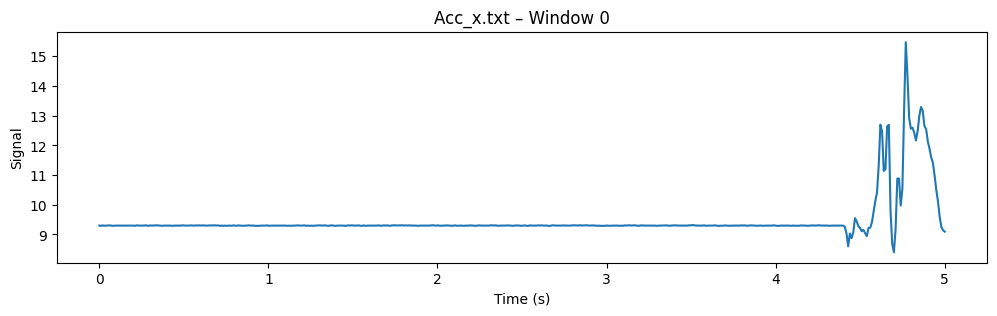

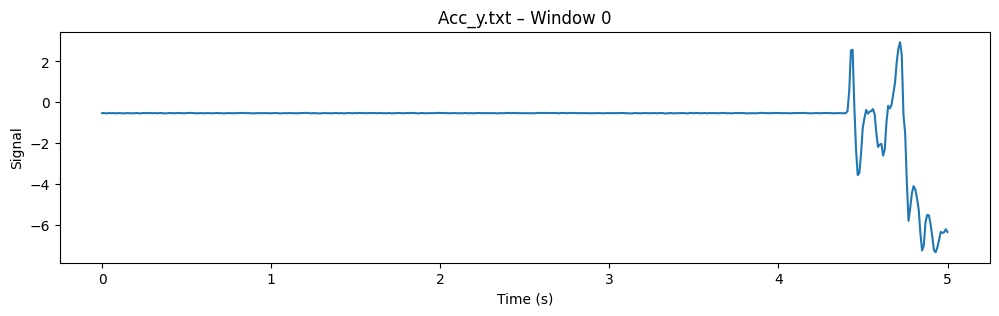

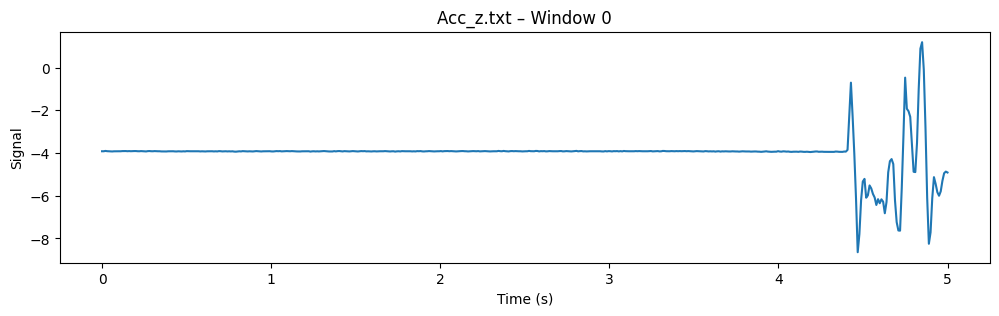

In [ ]:
def preview_window(file_path, window_idx=0):
    """Plot a single 5s window from a .txt file."""
    data = np.loadtxt(file_path)
    window = data[window_idx]    # shape (500,)
    plt.figure(figsize=(12,3))
    plt.plot(np.linspace(0,5,500), window)
    plt.title(os.path.basename(file_path) + f" – Window {window_idx}")
    plt.xlabel('Time (s)')
    plt.ylabel('Signal')
    plt.show()

# Preview first window of a few files
for f in all_txt_files[:3]:
    preview_window(f)


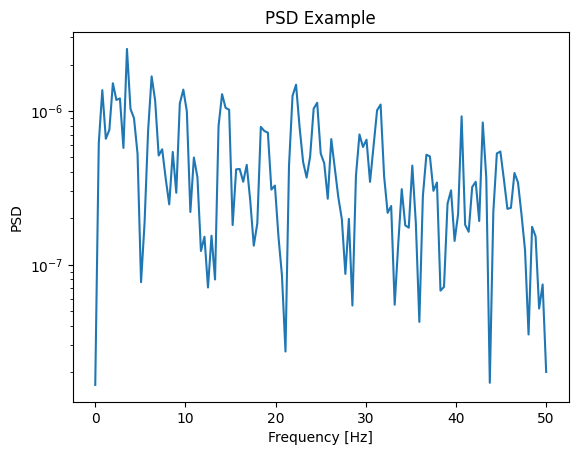

In [ ]:
# PSD of a single window
fs = 100  # from dataset spec
sig = np.loadtxt(all_txt_files[0])[0]
f, Pxx = signal.welch(sig, fs=fs, nperseg=256)
plt.semilogy(f, Pxx)
plt.title('PSD Example')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD')
plt.show()


In [2]:
# ── Cell 3: Helpers for entropy & band energy ─────────────────────────────────

def differential_entropy(x):
    """
    Gaussian differential entropy of a 1D array x (in nats):
        h = 0.5 * ln(2πe·σ²)
    """
    var = np.var(x)
    return 0.5 * np.log(2 * np.pi * np.e * var)


def band_energy(psd, freqs, band):
    """
    Integrate PSD (or any power spectrum) over a given [low, high) Hz band
    using trapezoidal rule.
    """
    mask = (freqs >= band[0]) & (freqs < band[1])
    return trapezoid(psd[mask], freqs[mask])


In [3]:
# Cell 4: Funkcje ekstrakcji cech (70+ na okno)

def znormalize(x):
    return (x - x.mean()) / x.std()  # normalizacja do średniej 0 i odchylenia 1

def spectral_features(x, fs=100):
    xz = znormalize(x)
    freqs, Pxx = signal.welch(xz, fs=fs, nperseg=fs*2)  # PSD: gęstość widmowa mocy
    Xd = np.abs(np.fft.rfft(xz))                       # magnituda DCT (FFT)
    fd = np.fft.rfftfreq(len(xz), 1/fs)                 # odpowiadające częstotliwości

    bands = [(0.1,0.5),(0.5,1),(1,1.5),(1.5,2),(2,2.5),(2.5,3),
             (3,4),(4,5),(5,6),(6,8),(8,12),(12,18),
             (18,24),(24,28),(28,32),(32,40),(40,50)]
    feats = {}
    for prefix, f_arr, p_arr in [('psd', freqs, Pxx), ('dct', fd, Xd)]:
        for b in bands:
            feats[f'{prefix}_band_{b[0]}_{b[1]}'] = band_energy(p_arr, f_arr, b)
            # energia w paśmie b[0]-b[1] Hz

        cen = (f_arr * p_arr).sum() / p_arr.sum()
        feats[f'{prefix}_centroid']  = cen                                      # centroid widma: środek ciężkości energii częstotliwościowej

        bw = np.sqrt(((f_arr-cen)**2 * p_arr).sum() / p_arr.sum())
        feats[f'{prefix}_bandwidth'] = bw                                       # szerokość pasma: rozproszenie mocy wokół centroidu

        top2 = np.sort(p_arr)[-2:]
        feats[f'{prefix}_top2_ratio'] = top2[-1] / (top2[-2] + 1e-12)           # stosunek dwóch największych amplitud

        feats[f'{prefix}_amp_max']  = p_arr.max()                               # maksymalna amplituda widma

        feats[f'{prefix}_amp_std']  = p_arr.std()                               # odchylenie standardowe amplitud

        feats[f'{prefix}_amp_skew'] = stats.skew(p_arr)                         # skośność rozkładu amplitud

        pk = f_arr[np.argmax(p_arr)]
        feats[f'{prefix}_peak_freq'] = pk                                       # częstotliwość szczytowa

        top5_idx = np.argsort(p_arr)[-5:]
        top5 = f_arr[top5_idx]
        feats[f'{prefix}_top5_mean'] = top5.mean()                              # średnia 5 dominujących częstotliwości

        feats[f'{prefix}_top5_std']  = top5.std()                               # odchylenie standardowe 5 dominujących częstotliwości

        feats[f'{prefix}_top5_skew'] = stats.skew(top5)                         # skośność 5 dominujących częstotliwości

    p_norm = Pxx / Pxx.sum()
    feats['spectral_entropy'] = -(p_norm * np.log2(p_norm+1e-12)).sum()         # entropia widmowa: miara nieuporządkowania rozkładu mocy

    return feats

def time_acf_features(x):
    x0 = x - x.mean()
    acf = np.correlate(x0, x0, mode='full')[len(x0)-1:]
    feats = {
        'acf_mean_abs':       np.abs(acf).mean(),                     # średnia wartość bezwzględna ACF

        'acf_std':            acf.std(),                              # odchylenie standardowe ACF

        'acf_skew':           stats.skew(acf),                        # skośność ACF

        'acf_zero_crossings': ((acf[:-1]*acf[1:])<0).sum(),           # liczba zmian znaku w ACF
    }
    f_acf, P_acf = signal.welch(acf, fs=1)
    feats['acf_prom_freq'] = f_acf[P_acf.argmax()]
    # dominująca częstotliwość ACF

    p_acf = P_acf / P_acf.sum()
    feats['acf_spectral_entropy'] = -(p_acf * np.log2(p_acf+1e-12)).sum()
    # entropia widmowa ACF

    return feats

def time_signal_features(x):
    return {
        'mean_crossing_rate': ((x[:-1]*x[1:])<0).sum()/len(x),        # częstość przekroczeń średniej wartości (sign changes)

        'diff_entropy':       differential_entropy(x),                # entropia różnicowa Gaussa h=0.5·ln(2πeσ²)

        'skew':               stats.skew(x),                          # skośność rozkładu wartości

        'kurtosis':           stats.kurtosis(x),                      # kurtoza – miara smukłości rozkładu

        'hjorth_mobility':    ant.hjorth_params(x)[0],                # mobilność Hjortha – średnia częstotliwość

        'hjorth_complexity':  ant.hjorth_params(x)[1],                # złożoność Hjortha – zmiana mobilności

        'katz_fd':            ant.katz_fd(x),                         # wymiar fraktalny Katz’a – złożoność czasowa
    }

def extra_features(x, fs=100):
    feats = {'ptp_amp': np.ptp(x)}                                  # peak-to-peak: max–min amplitudy
    coeffs = pywt.wavedec(x, 'db4', level=3)
    for i, c in enumerate(coeffs):
        feats[f'wavelet_energy_L{i}'] = np.sum(c**2)                # energia na poziomie falki

    feats['sample_entropy'] = ant.sample_entropy(x)                 # sample entropy: miara nieregularności sygnału

    return feats


# Wyjaśnienia terminów

**Autokorelacja (ACF):** miara podobieństwa sygnału do swojej opóźnionej kopii, pomaga wykryć powtarzalność i okresowość w danych czasowych

**Centroid widma:** „środek ciężkości” rozkładu mocy widmowej, wskazuje, gdzie koncentruje się energia częstotliwościowa sygnału.

**Szerokość pasma:** odchylenie standardowe energii widma wokół centroidu, obrazujące rozproszenie częstotliwości.

**Entropia widmowa:** mierzy „nieuporządkowanie” lub równomierność rozkładu mocy widmowej; wyższa wartość = bardziej płaski, „niepikowy” wykres.

**Wskaźnik przekroczeń zerowych (ZCR):** liczba zmian znaku sygnału (pozytyw–negatyw) na sekundę, używana np. w detekcji perkusyjnych dźwięków.

**Entropia różnicowa:** ciągły odpowiednik entropii, dla rozkładu Gaussa.

**Mobilność i złożoność Hjortha:** parametry czasowe mierzące wariancję sygnału i jego pochodnych – mobilność ≈ średnia częstotliwość, złożoność ≈ zmiana tej częstotliwości.

**Wymiar fraktalny Katz’a:** miara złożoności sygnału obliczana z odległości między kolejnymi punktami próbek; im wyższy, tym większa „chropowatość”.

**Entropia próbki (sample entropy):** miara złożoności i nieregularności sygnału na podstawie prawdopodobieństwa powtórzeń wzorców.

In [ ]:
# Cell 5: Gather signal files & load labels with tqdm

DATA_ROOT = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/train_4_locations'
LOCATIONS       = ['Bag','Hips','Torso','Hand']
SENSORS         = ['Acc','Gyr','Mag']
AXES            = ['x','y','z']
SAMPLES_PER_FILE = 1000    # ← number of windows to sample from each file

# 1) Gather all signal file paths
signal_files = []
for loc in LOCATIONS:
    for s in SENSORS:
        for ax in AXES:
            pattern = os.path.join(DATA_ROOT, loc, f"{s}_{ax}.txt")
            signal_files += glob.glob(pattern)
if not signal_files:
    raise FileNotFoundError(f"No .txt files under {DATA_ROOT}")

# 2) Extract fixed M samples per file
records = []
for fp in tqdm(signal_files, desc='Files', position=0, leave=False):
    data = np.loadtxt(fp)                # shape: (n_windows, 500)
    n_win = data.shape[0]
    # choose up to SAMPLES_PER_FILE unique indices
    picks = np.random.choice(n_win, size=min(SAMPLES_PER_FILE, n_win),
                             replace=False)
    loc    = os.path.basename(os.path.dirname(fp))
    sensor = os.path.splitext(os.path.basename(fp))[0]

    for i in tqdm(picks, desc=f'{sensor} windows',
                  position=1, leave=False):
        win = data[i]
        feats = {}
        feats.update(spectral_features(win))
        feats.update(time_acf_features(win))
        feats.update(time_signal_features(win))
        feats.update(extra_features(win))
        feats['location']    = loc
        feats['sensor_axis'] = sensor
        feats['window_id']   = i
        records.append(feats)

# 3) Build DataFrame
sample_df = pd.DataFrame(records)
print("Sampled feature set shape:", sample_df.shape)
sample_df.head()


Files:   0%|          | 0/36 [00:00<?, ?it/s]

Acc_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Acc_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Gyr_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_x windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_y windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Mag_z windows:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampled feature set shape: (36000, 77)


,psd_band_0.1_0.5,psd_band_0.5_1,psd_band_1_1.5,psd_band_1.5_2,psd_band_2_2.5,psd_band_2.5_3,psd_band_3_4,psd_band_4_5,psd_band_5_6,psd_band_6_8,...,katz_fd,ptp_amp,wavelet_energy_L0,wavelet_energy_L1,wavelet_energy_L2,wavelet_energy_L3,sample_entropy,location,sensor_axis,window_id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.001710,0.002630,0.005986,0.002859,...,3.979947,0.242166,2416.238630,0.020356,0.284872,0.211413,1.411098,Bag,Acc_x,4904
1,0.0,0.0,0.0,0.0,0.0,0.0,0.062259,0.004263,0.001302,0.003249,...,1.744960,20.578026,57041.464733,109.282208,14.295576,2.251187,0.293064,Bag,Acc_x,75167
2,0.0,0.0,0.0,0.0,0.0,0.0,0.006298,0.011313,0.007502,0.011027,...,4.056706,3.931250,46200.044051,18.125772,74.225675,35.562182,1.793301,Bag,Acc_x,130033
3,0.0,0.0,0.0,0.0,0.0,0.0,0.014906,0.006366,0.004420,0.027510,...,5.219011,0.057221,518.308206,0.008353,0.014965,0.028381,1.441748,Bag,Acc_x,92078
4,0.0,0.0,0.0,0.0,0.0,0.0,0.006495,0.017153,0.029920,0.031318,...,4.672659,0.042240,25416.319115,0.002686,0.009707,0.011010,1.577912,Bag,Acc_x,50775


Sampled feature set (first 20 rows):


,psd_band_0.1_0.5,psd_band_0.5_1,psd_band_1_1.5,psd_band_1.5_2,psd_band_2_2.5,psd_band_2.5_3,psd_band_3_4,psd_band_4_5,psd_band_5_6,psd_band_6_8,...,katz_fd,ptp_amp,wavelet_energy_L0,wavelet_energy_L1,wavelet_energy_L2,wavelet_energy_L3,sample_entropy,location,sensor_axis,window_id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.001710,0.002630,0.005986,0.002859,...,3.979947,0.242166,2416.238630,0.020356,0.284872,0.211413,1.411098,Bag,Acc_x,4904
1,0.0,0.0,0.0,0.0,0.0,0.0,0.062259,0.004263,0.001302,0.003249,...,1.744960,20.578026,57041.464733,109.282208,14.295576,2.251187,0.293064,Bag,Acc_x,75167
2,0.0,0.0,0.0,0.0,0.0,0.0,0.006298,0.011313,0.007502,0.011027,...,4.056706,3.931250,46200.044051,18.125772,74.225675,35.562182,1.793301,Bag,Acc_x,130033
3,0.0,0.0,0.0,0.0,0.0,0.0,0.014906,0.006366,0.004420,0.027510,...,5.219011,0.057221,518.308206,0.008353,0.014965,0.028381,1.441748,Bag,Acc_x,92078
4,0.0,0.0,0.0,0.0,0.0,0.0,0.006495,0.017153,0.029920,0.031318,...,4.672659,0.042240,25416.319115,0.002686,0.009707,0.011010,1.577912,Bag,Acc_x,50775
5,0.0,0.0,0.0,0.0,0.0,0.0,0.013074,0.009886,0.012876,0.041326,...,4.233336,0.042869,1409.604465,0.003422,0.003342,0.008361,0.887656,Bag,Acc_x,44362
6,0.0,0.0,0.0,0.0,0.0,0.0,0.004360,0.007405,0.004586,0.012777,...,2.618560,0.156967,1430.974708,0.002580,0.005981,0.042268,0.896538,Bag,Acc_x,43998
7,0.0,0.0,0.0,0.0,0.0,0.0,0.005023,0.000896,0.000180,0.002445,...,4.109686,1.459200,36618.133605,2.746762,9.691261,5.561262,2.034194,Bag,Acc_x,152185
8,0.0,0.0,0.0,0.0,0.0,0.0,0.011206,0.003128,0.001131,0.007963,...,2.852017,0.995119,37606.947270,0.747393,2.473137,0.762735,1.594417,Bag,Acc_x,60225
9,0.0,0.0,0.0,0.0,0.0,0.0,0.013891,0.011006,0.022056,0.021853,...,1.816348,13.366571,46643.099130,255.094354,33.205950,2.199335,0.488335,Bag,Acc_x,72553



Summary statistics:


,psd_band_0.1_0.5,psd_band_0.5_1,psd_band_1_1.5,psd_band_1.5_2,psd_band_2_2.5,psd_band_2.5_3,psd_band_3_4,psd_band_4_5,psd_band_5_6,psd_band_6_8,...,hjorth_mobility,hjorth_complexity,katz_fd,ptp_amp,wavelet_energy_L0,wavelet_energy_L1,wavelet_energy_L2,wavelet_energy_L3,sample_entropy,window_id
count,36000.0,36000.0,36000.0,36000.0,36000.0,36000.0,36000.000000,36000.000000,36000.000000,3.600000e+04,...,36000.000000,36000.000000,36000.000000,36000.000000,3.600000e+04,3.600000e+04,3.600000e+04,36000.000000,36000.000000,36000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.029120,0.021924,0.017426,3.686586e-02,...,0.375217,5.051167,2.321864,9.842418,2.140526e+06,8.794035e+02,2.178788e+02,44.775220,0.770146,98247.747556
std,0.0,0.0,0.0,0.0,0.0,0.0,0.035703,0.028818,0.023950,4.798151e-02,...,0.310193,6.678017,0.917845,27.497475,1.170933e+08,7.352397e+04,7.807516e+03,1092.208316,0.512929,56539.685270
min,0.0,0.0,0.0,0.0,0.0,0.0,0.000006,0.000002,0.000001,9.207850e-07,...,0.006021,1.004403,1.012230,0.001222,1.143324e-05,7.862803e-06,1.123123e-05,0.000007,0.000158,18.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.005430,0.003391,0.002346,4.887744e-03,...,0.148796,1.958220,1.767917,0.728424,4.847994e+01,6.111865e-01,2.592254e-01,0.038484,0.380175,49398.500000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.017046,0.011669,0.008729,1.902001e-02,...,0.296855,2.845105,2.140805,3.167750,9.195827e+03,1.925453e+01,6.025205e+00,1.513316,0.657761,98134.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.038835,0.029196,0.023096,5.116037e-02,...,0.490375,5.084395,2.598149,10.389743,7.669732e+04,4.113414e+01,1.079513e+01,3.729437,1.090006,147314.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.471713,0.359223,0.352491,6.358186e-01,...,1.927713,145.660439,20.063975,2736.766554,8.359151e+09,1.224476e+07,1.346816e+06,184036.849587,2.785893,196060.000000


<Figure size 800x800 with 0 Axes>

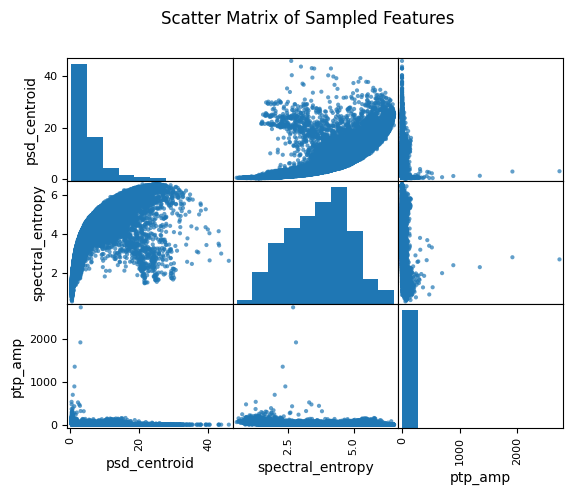

In [ ]:
# Cell 6: Visualize the sampled features without ace_tools

from IPython.display import display

# 1) Show the full DataFrame (or head)
print("Sampled feature set (first 20 rows):")
display(sample_df.head(20))

# 2) Simple summary stats
print("\nSummary statistics:")
display(sample_df.describe())

# 3) Scatter‐matrix plot
from pandas.plotting import scatter_matrix

fig = plt.figure(figsize=(8, 8))
scatter_matrix(
    sample_df[['psd_centroid', 'spectral_entropy', 'ptp_amp']],
    diagonal='hist',
    alpha=0.7
)
plt.suptitle('Scatter Matrix of Sampled Features')
plt.show()


In [ ]:
# Cell 7: Imports for advanced plotting
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from IPython.display import display


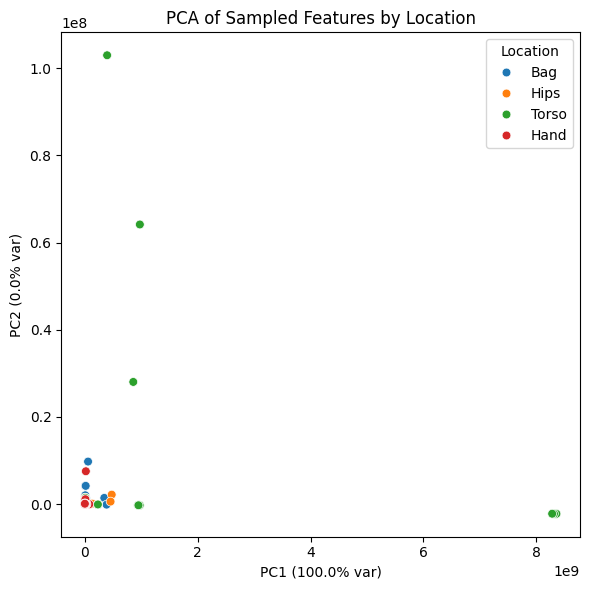

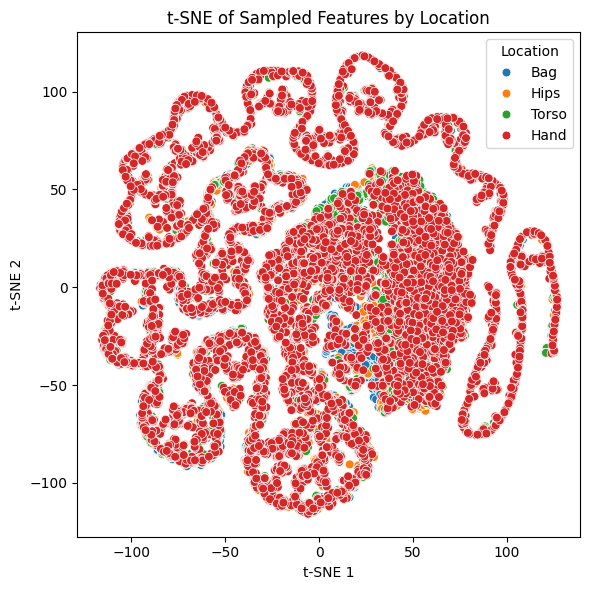

In [ ]:
# Cell 8: PCA + t-SNE colored by location

# Prepare feature matrix (drop metadata)
feat_cols = [c for c in sample_df.columns
             if c not in ('location','sensor_axis','window_id')]
X = sample_df[feat_cols].values

# 1) PCA to 2D
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(6,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1],
                hue=sample_df['location'], palette='tab10', s=40)
plt.title('PCA of Sampled Features by Location')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)')
plt.legend(title='Location')
plt.tight_layout()
plt.show()

# 2) t-SNE to 2D
tsne = TSNE(n_components=2, random_state=0, init='pca', learning_rate='auto')
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(6,6))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1],
                hue=sample_df['location'], palette='tab10', s=40)
plt.title('t-SNE of Sampled Features by Location')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(title='Location')
plt.tight_layout()
plt.show()


<ipython-input-27-68dd41d6412f>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='location', y=feat, data=sample_df, inner='quartile', palette='Pastel1')


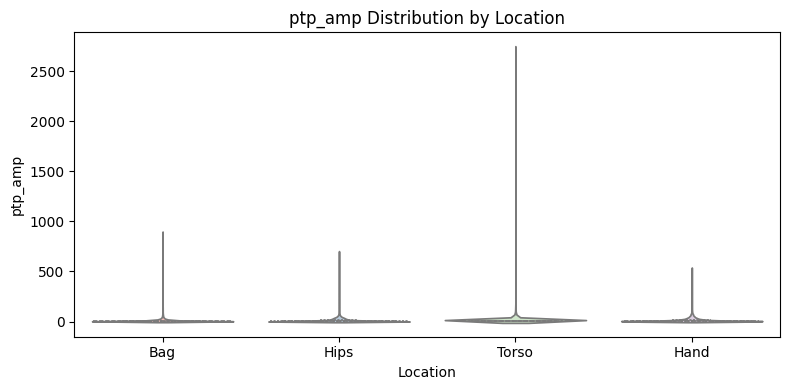

<ipython-input-27-68dd41d6412f>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='location', y=feat, data=sample_df, inner='quartile', palette='Pastel1')


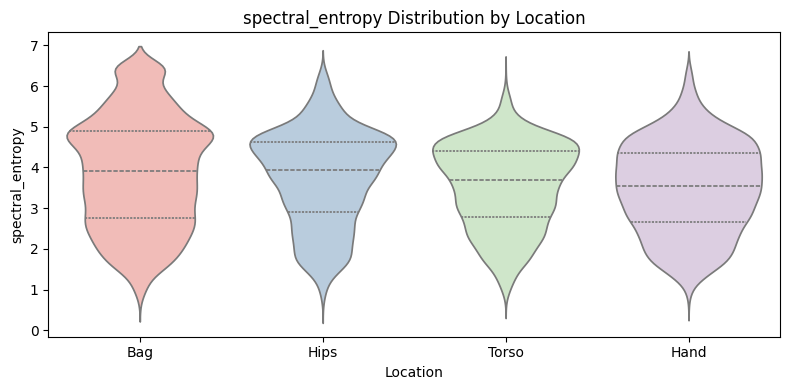

<ipython-input-27-68dd41d6412f>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='location', y=feat, data=sample_df, inner='quartile', palette='Pastel1')


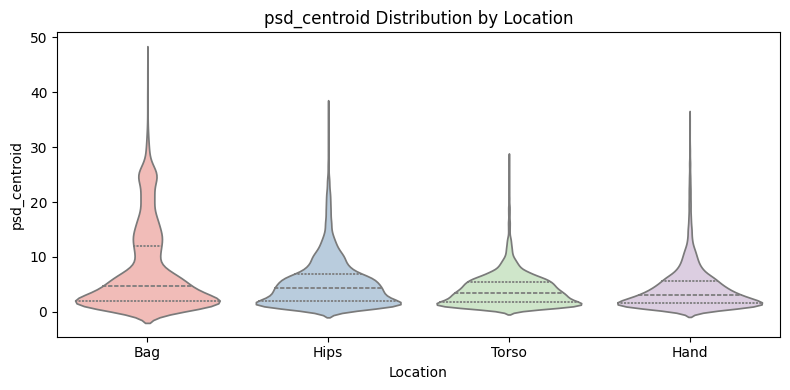

<ipython-input-27-68dd41d6412f>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='location', y=feat, data=sample_df, inner='quartile', palette='Pastel1')


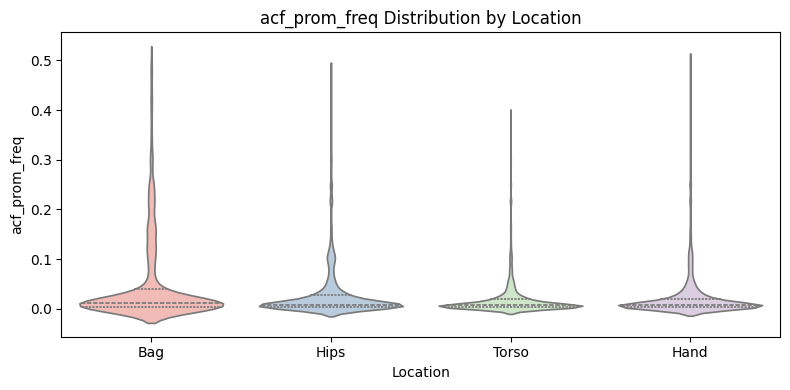

In [ ]:
# Cell 9: Feature distributions per location

# Pick a small set to visualize in detail
viz_feats = ['ptp_amp', 'spectral_entropy',
             'psd_centroid', 'acf_prom_freq']

for feat in viz_feats:
    plt.figure(figsize=(8,4))
    sns.violinplot(x='location', y=feat, data=sample_df, inner='quartile', palette='Pastel1')
    plt.title(f'{feat} Distribution by Location')
    plt.xlabel('Location')
    plt.ylabel(feat)
    plt.tight_layout()
    plt.show()


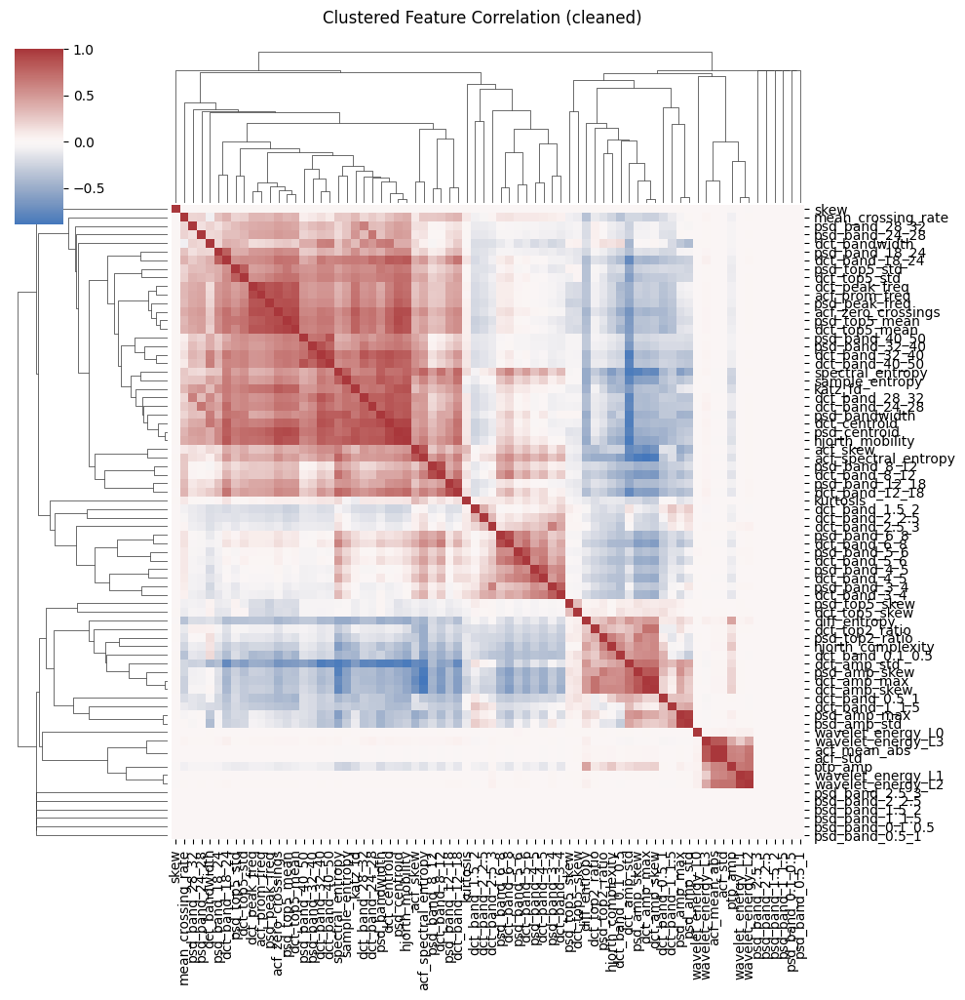

In [ ]:
# Cell 10: Clustered Heatmap of Feature Correlations (cleaned)

import numpy as np
from scipy.cluster.hierarchy import linkage  # <-- correct import :contentReference[oaicite:0]{index=0}
import scipy.spatial.distance as ssd
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Compute correlation matrix and clean non-finite values
corr = sample_df[feat_cols].corr()
corr_clean = corr.replace([np.inf, -np.inf], np.nan).fillna(0)

# 2) Build dissimilarity: D = 1 - corr
diss = 1.0 - corr_clean
np.fill_diagonal(diss.values, 0)

# 3) Condense for linkage
diss_condensed = ssd.squareform(diss.values)

# 4) Perform hierarchical clustering with scipy.cluster.hierarchy.linkage :contentReference[oaicite:1]{index=1}
Z = linkage(diss_condensed, method='average')

# 5) Plot clustered heatmap
sns.clustermap(
    corr_clean,
    row_linkage=Z,
    col_linkage=Z,
    cmap='vlag',
    center=0,
    figsize=(10, 10),
    xticklabels=True,
    yticklabels=True
)
plt.suptitle('Clustered Feature Correlation (cleaned)', y=1.02)
plt.show()


In [ ]:
# Cell 11: Summary tables per location

for loc in sample_df['location'].unique():
    sub = sample_df[sample_df['location']==loc]
    print(f'\n=== Summary for {loc} (n={len(sub)}) ===')
    display(sub[feat_cols].describe().T[['mean','std','min','max']])



=== Summary for Bag (n=9000) ===


,mean,std,min,max
psd_band_0.1_0.5,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_0.5_1,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_1_1.5,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_1.5_2,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_2_2.5,0.000000,0.000000e+00,0.000000,0.000000e+00
...,...,...,...,...
wavelet_energy_L0,372673.799332,5.664502e+06,0.000011,3.850071e+08
wavelet_energy_L1,206.066885,6.580059e+03,0.000008,6.095039e+05
wavelet_energy_L2,81.852100,9.628645e+02,0.000011,7.479018e+04
wavelet_energy_L3,21.071769,1.663096e+02,0.000007,4.295494e+03



=== Summary for Hips (n=9000) ===


,mean,std,min,max
psd_band_0.1_0.5,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_0.5_1,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_1_1.5,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_1.5_2,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_2_2.5,0.000000,0.000000e+00,0.000000,0.000000e+00
...,...,...,...,...
wavelet_energy_L0,378485.343239,7.274993e+06,0.000189,4.761915e+08
wavelet_energy_L1,481.271541,2.335269e+03,0.000054,5.787933e+04
wavelet_energy_L2,248.059168,1.707686e+03,0.000034,5.674916e+04
wavelet_energy_L3,66.188075,6.436443e+02,0.000013,2.623764e+04



=== Summary for Torso (n=9000) ===


,mean,std,min,max
psd_band_0.1_0.5,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
psd_band_0.5_1,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
psd_band_1_1.5,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
psd_band_1.5_2,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
psd_band_2_2.5,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
...,...,...,...,...
wavelet_energy_L0,7.621741e+06,2.339266e+08,0.001008,8.359151e+09
wavelet_energy_L1,2.481153e+03,1.468562e+05,0.000289,1.224476e+07
wavelet_energy_L2,3.175637e+02,1.532154e+04,0.000113,1.346816e+06
wavelet_energy_L3,3.992103e+01,1.984875e+03,0.000024,1.840368e+05



=== Summary for Hand (n=9000) ===


,mean,std,min,max
psd_band_0.1_0.5,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_0.5_1,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_1_1.5,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_1.5_2,0.000000,0.000000e+00,0.000000,0.000000e+00
psd_band_2_2.5,0.000000,0.000000e+00,0.000000,0.000000e+00
...,...,...,...,...
wavelet_energy_L0,189204.687530,1.114746e+06,0.000020,7.860429e+07
wavelet_energy_L1,349.122929,2.440106e+03,0.000017,8.063555e+04
wavelet_energy_L2,224.039985,2.286350e+03,0.000047,1.055981e+05
wavelet_energy_L3,51.920001,6.239487e+02,0.000021,4.051306e+04


# Zapisywanie Plików na Google Drive

In [ ]:
# Cell X: Parallel‐safe feature extraction with lock files

import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# === Settings ===
DATA_ROOT   = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/train_4_locations'
OUTPUT_ROOT = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/features'
LOCATIONS   = ['Bag', 'Hips', 'Torso', 'Hand']
SENSORS     = ['Acc', 'Gyr', 'Mag']
AXES        = ['x','y','z']

# Ensure output dirs
for loc in LOCATIONS:
    os.makedirs(os.path.join(OUTPUT_ROOT, loc), exist_ok=True)

def extract_features_from_file(fp):
    """Extract all windows’ features into a DataFrame."""
    data = np.loadtxt(fp)
    loc    = os.path.basename(os.path.dirname(fp))
    sensor = os.path.splitext(os.path.basename(fp))[0]
    records = []
    for i in tqdm(range(data.shape[0]),
                  desc=f'{sensor} windows',
                  position=1, leave=False):
        win = data[i]
        feats = {}
        feats.update(spectral_features(win))
        feats.update(time_acf_features(win))
        feats.update(time_signal_features(win))
        feats.update(extra_features(win))
        feats['location']    = loc
        feats['sensor_axis'] = sensor
        feats['window_id']   = i
        records.append(feats)
    return pd.DataFrame(records)

signal_files = []
for loc in LOCATIONS:
    for s in SENSORS:
        for ax in AXES:
            pattern = os.path.join(DATA_ROOT, loc, f"{s}_{ax}.txt")
            signal_files.extend(glob.glob(pattern))

for fp in tqdm(signal_files, desc='All signal files', position=0):
    loc    = os.path.basename(os.path.dirname(fp))
    sensor = os.path.splitext(os.path.basename(fp))[0]
    out_csv   = os.path.join(OUTPUT_ROOT, loc, f"{sensor}.csv")
    lock_file = out_csv + '.lock'

    # If features already exist, skip.
    if os.path.exists(out_csv):
        continue

    # If someone else is processing it, skip.
    if os.path.exists(lock_file):
        continue

    # Claim it by creating lock file
    open(lock_file, 'w').close()

    try:
        # Extract & save
        df = extract_features_from_file(fp)
        df.to_csv(out_csv, index=False)
        print(f"✔ Saved features for {sensor} → {out_csv}")
    finally:
        # Remove lock so others know it's done (or if an error occurred)
        if os.path.exists(lock_file):
            os.remove(lock_file)


All signal files:   0%|          | 0/36 [00:00<?, ?it/s]

Acc_y windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Acc_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_y.csv


Gyr_y windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Gyr_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Gyr_y.csv


Mag_z windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Mag_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Mag_z.csv


Gyr_x windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Gyr_x → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Gyr_x.csv


Mag_y windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Mag_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Mag_y.csv


Acc_z windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Acc_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Torso/Acc_z.csv


Gyr_z windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Gyr_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Torso/Gyr_z.csv


Mag_y windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Mag_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Torso/Mag_y.csv


Acc_x windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Acc_x → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hand/Acc_x.csv


Gyr_z windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Gyr_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hand/Gyr_z.csv


Mag_z windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Mag_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hand/Mag_z.csv


# Adding the mode of transport to teh files

In [3]:
df=pd.read_csv('/content/drive/MyDrive/Baza danych Challange Sussex 2025/train_4_locations/Bag/Label.txt', header=None, delimiter=' ')
df

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
1,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
2,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
3,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
4,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196067,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
196068,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
196069,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
196070,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5


In [4]:
df_np = np.array(df)
row_modes = []

for row in df_np:
    values, counts = np.unique(row, return_counts=True)

    most_frequent_value = values[np.argmax(counts)]
    row_modes.append(most_frequent_value)

print(row_modes[1])


4


In [5]:
# Cell X: Add 'mode' only if missing (raw + sensor fusion) with lock files

import os
import glob
import pandas as pd
from tqdm.auto import tqdm

# === Settings ===
DATA_ROOT      = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/features'
LOCATIONS      = ['Bag', 'Hips', 'Torso', 'Hand']
RAW_SENSORS    = ['Acc', 'Gyr', 'Mag']
RAW_AXES       = ['x', 'y', 'z']
FUSION_SENSORS = ['Acc_rot_x', 'Acc_rot_y', 'Acc_rot_z', 'Acc_solo_mag']

# Assume row_modes is defined and contains the correct mode for each window
# e.g. row_modes = [...]

# Collect all feature files
signal_files = []
for loc in LOCATIONS:
    for s in RAW_SENSORS:
        for ax in RAW_AXES:
            pattern = os.path.join(DATA_ROOT, loc, f"{s}_{ax}.csv")
            signal_files.extend(glob.glob(pattern))
    for fs in FUSION_SENSORS:
        pattern = os.path.join(DATA_ROOT, loc, f"{fs}.csv")
        signal_files.extend(glob.glob(pattern))

# Process each file
for fp in tqdm(signal_files, desc='All signal files', position=0):
    sensor   = os.path.splitext(os.path.basename(fp))[0]
    lock_file = fp + '.lock'

    # skip if already locked
    if os.path.exists(lock_file):
        continue

    # check header for 'mode'
    df_header = pd.read_csv(fp, nrows=0)
    if 'mode' in df_header.columns:
        continue

    # claim lock
    open(lock_file, 'w').close()
    try:
        # read full file, add mode column
        df_temp = pd.read_csv(fp)
        for i in range(len(df_temp)):
            df_temp.loc[i, 'mode'] = row_modes[i]
        df_temp.to_csv(fp, index=False)
        print(f"✔ Added mode to {sensor} → {fp}")
    finally:
        if os.path.exists(lock_file):
            os.remove(lock_file)


All signal files:   0%|          | 0/52 [00:00<?, ?it/s]

✔ Added mode to Acc_rot_x → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_rot_x.csv
✔ Added mode to Acc_rot_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_rot_y.csv
✔ Added mode to Acc_rot_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_rot_z.csv
✔ Added mode to Acc_solo_mag → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_solo_mag.csv
✔ Added mode to Acc_rot_x → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Acc_rot_x.csv
✔ Added mode to Acc_rot_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Acc_rot_y.csv
✔ Added mode to Acc_rot_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Acc_rot_z.csv
✔ Added mode to Acc_solo_mag → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Acc_solo_mag.csv
✔ Added mode to Acc_rot_x → /content/drive/MyDrive/Baza danych Challange Sussex 2025/fea

In [6]:
!zip -r /content/features.zip "/content/drive/MyDrive/Baza danych Challange Sussex 2025/features"

  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/ (stored 0%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/ (stored 0%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_x.csv (deflated 55%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_y.csv (deflated 55%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_z.csv (deflated 54%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Gyr_x.csv (deflated 55%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Gyr_y.csv (deflated 55%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Gyr_z.csv (deflated 55%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Mag_x.csv (deflated 55%)
  adding: content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Mag_y.csv (de

In [7]:
from google.colab import files
files.download('/content/features.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Code ammended to include sensor_fusion data

In [13]:
# Cell X: Parallel‐safe feature extraction over two data sources,
# preserving blank lines as NaN‐only feature rows, and printing output shape.

import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# === Settings ===
DATA_ROOTS = {
    'raw':    '/content/drive/MyDrive/Baza danych Challange Sussex 2025/train_4_locations',
    'fusion': '/content/drive/MyDrive/Baza danych Challange Sussex 2025/sensor_fusion/train'
}
OUTPUT_ROOT = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/features'
LOCATIONS   = ['Bag', 'Hips', 'Torso', 'Hand']

RAW_SENSORS    = ['Acc', 'Gyr', 'Mag']
RAW_AXES       = ['x', 'y', 'z']
FUSION_SENSORS = ['Acc_rot_x', 'Acc_rot_y', 'Acc_rot_z', 'Acc_solo_mag']

# Ensure output directories exist
for loc in LOCATIONS:
    os.makedirs(os.path.join(OUTPUT_ROOT, loc), exist_ok=True)


def extract_features_from_file(fp):
    """
    Read `fp` line by line (so blank lines are preserved).
    For each line:
      - If blank, emit NaN for every feature.
      - Otherwise, run the four feature‐extraction functions.
    Always include 'location', 'sensor_axis', 'window_id'.
    """
    # 1) Read all lines (including blank ones)
    with open(fp, 'r') as f:
        lines = f.readlines()

    # 2) Find the first non-blank to discover feature names
    first_vals = None
    for l in lines:
        if l.strip():
            first_vals = np.fromstring(l, sep=' ')
            break
    if first_vals is None:
        raise ValueError(f"No valid data lines in {fp!r}")

    # 3) Build a template dict to get feature column names
    template = {}
    template.update(spectral_features(first_vals))
    template.update(time_acf_features(first_vals))
    template.update(time_signal_features(first_vals))
    template.update(extra_features(first_vals))
    feature_keys = list(template.keys())

    # 4) Iterate every line and fill features (or NaNs)
    loc    = os.path.basename(os.path.dirname(fp))
    sensor = os.path.splitext(os.path.basename(fp))[0]
    records = []

    for i, raw in enumerate(tqdm(lines,
                                 desc=f'{sensor} windows',
                                 position=1,
                                 leave=False)):
        feats = {}
        if not raw.strip():
            # blank → NaN for every feature
            for k in feature_keys:
                feats[k] = np.nan
        else:
            win = np.fromstring(raw.strip(), sep=' ')
            feats.update(spectral_features(win))
            feats.update(time_acf_features(win))
            feats.update(time_signal_features(win))
            feats.update(extra_features(win))

        # metadata columns
        feats['location']    = loc
        feats['sensor_axis'] = sensor
        feats['window_id']   = i

        records.append(feats)

    return pd.DataFrame(records)


# 5) Gather all .txt files
signal_files = []

# raw sensors
for loc in LOCATIONS:
    for sensor in RAW_SENSORS:
        for ax in RAW_AXES:
            pattern = os.path.join(DATA_ROOTS['raw'], loc, f"{sensor}_{ax}.txt")
            signal_files.extend(glob.glob(pattern))

# fusion sensors
for loc in LOCATIONS:
    for sensor in FUSION_SENSORS:
        pattern = os.path.join(DATA_ROOTS['fusion'], loc, f"{sensor}.txt")
        signal_files.extend(glob.glob(pattern))


# 6) Process with lock files and print output shape
for fp in tqdm(signal_files, desc='All signal files', position=0):
    loc    = os.path.basename(os.path.dirname(fp))
    sensor = os.path.splitext(os.path.basename(fp))[0]
    out_csv   = os.path.join(OUTPUT_ROOT, loc, f"{sensor}.csv")
    lock_file = out_csv + '.lock'

    if os.path.exists(out_csv) or os.path.exists(lock_file):
        continue

    # claim it
    open(lock_file, 'w').close()
    try:
        df = extract_features_from_file(fp)
        df.to_csv(out_csv, index=False)
        print(f"✔ Saved features for {sensor} → {out_csv}")
        print(f"   → Output shape: {df.shape}")  # rows, cols
    finally:
        if os.path.exists(lock_file):
            os.remove(lock_file)


All signal files:   0%|          | 0/52 [00:00<?, ?it/s]

Acc_rot_y windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Acc_rot_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Bag/Acc_rot_y.csv
   → Output shape: (196072, 77)


Acc_rot_y windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Acc_rot_y → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Hips/Acc_rot_y.csv
   → Output shape: (196072, 77)


Acc_rot_z windows:   0%|          | 0/196072 [00:00<?, ?it/s]

✔ Saved features for Acc_rot_z → /content/drive/MyDrive/Baza danych Challange Sussex 2025/features/Torso/Acc_rot_z.csv
   → Output shape: (196072, 77)


In [ ]:
#Total combined feature extraction

In [19]:
# Cell X: Parallel‐safe feature extraction + per‐location Label.txt import,
# printing shape, and appending 'mode' if missing.

import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# === Settings ===
DATA_ROOTS = {
    'raw':    '/net/tscratch/people/plgdusza/Sussex Dataset/validation',
    'fusion': '/net/tscratch/people/plgdusza/Sussex Dataset/sensor_fusion/validation'
}
OUTPUT_ROOT = '/net/tscratch/people/plgdusza/Sussex Dataset/features/validation'
LOCATIONS   = ['Bag', 'Hips', 'Torso', 'Hand']

RAW_SENSORS    = ['Acc', 'Gyr', 'Mag']
RAW_AXES       = ['x', 'y', 'z']
FUSION_SENSORS = ['Acc_rot_x', 'Acc_rot_y', 'Acc_rot_z', 'Acc_solo_mag']

# Ensure output directories exist
for loc in LOCATIONS:
    os.makedirs(os.path.join(OUTPUT_ROOT, loc), exist_ok=True)


def extract_features_from_file(fp):
    # read all lines (blank ones too)
    with open(fp, 'r') as f:
        lines = f.readlines()

    # find first non‐blank to figure out window length & template
    first_vals = None
    for l in lines:
        if l.strip():
            first_vals = np.fromstring(l, sep=' ')
            break
    if first_vals is None:
        raise ValueError(f"No data in {fp!r}")

    # build feature‐extract template
    template = {}
    template.update(spectral_features(first_vals))
    template.update(time_acf_features(first_vals))
    template.update(time_signal_features(first_vals))
    template.update(extra_features(first_vals))
    feature_keys = list(template.keys())

    loc    = os.path.basename(os.path.dirname(fp))
    sensor = os.path.splitext(os.path.basename(fp))[0]
    records = []

    for i, raw in enumerate(tqdm(lines,
                                 desc=f'{sensor} windows',
                                 position=1,
                                 leave=False)):
        feats = {}
        if not raw.strip():
            # blank window → NaNs
            for k in feature_keys:
                feats[k] = np.nan
        else:
            win = np.fromstring(raw.strip(), sep=' ')
            feats.update(spectral_features(win))
            feats.update(time_acf_features(win))
            feats.update(time_signal_features(win))
            feats.update(extra_features(win))

        # metadata
        feats['location']    = loc
        feats['sensor_axis'] = sensor
        feats['window_id']   = i
        records.append(feats)

    return pd.DataFrame(records), len(first_vals)


# pre‐load raw Label.txt arrays
location_labels = {}
for loc in LOCATIONS:
    lab_fp = os.path.join(DATA_ROOTS['raw'], loc, 'Label.txt')
    if not os.path.exists(lab_fp):
        raise FileNotFoundError(f"Missing labels: {lab_fp}")
    # read as flat array
    df_lbls = pd.read_csv(lab_fp, header=None, delim_whitespace=True)
    flat = df_lbls.values.flatten()
    location_labels[loc] = flat


# gather all .txt signals
signal_files = []
for loc in LOCATIONS:
    for sensor in RAW_SENSORS:
        for ax in RAW_AXES:
            signal_files += glob.glob(os.path.join(DATA_ROOTS['raw'],   loc, f"{sensor}_{ax}.txt"))
    for sensor in FUSION_SENSORS:
        signal_files += glob.glob(os.path.join(DATA_ROOTS['fusion'], loc, f"{sensor}.txt"))


# process each file
for fp in tqdm(signal_files, desc='All signal files', position=0):
    loc      = os.path.basename(os.path.dirname(fp))
    sensor   = os.path.splitext(os.path.basename(fp))[0]
    out_csv  = os.path.join(OUTPUT_ROOT, loc, f"{sensor}.csv")
    lock_fp  = out_csv + '.lock'

    if os.path.exists(out_csv) or os.path.exists(lock_fp):
        continue

    # claim
    open(lock_fp,'w').close()
    try:
        df, win_len = extract_features_from_file(fp)

        # only add mode if missing
        if 'mode' not in df.columns:
            labels = location_labels[loc]
            total_windows = len(df)
            expected_len = win_len * total_windows
            if len(labels) != expected_len:
                raise ValueError(
                    f"{loc}: expected {expected_len} labels "
                    f"(win_len={win_len}×{total_windows}), got {len(labels)}"
                )

            # split and compute mode per chunk
            row_modes = []
            for i in range(total_windows):
                chunk = labels[i*win_len:(i+1)*win_len]
                vals, counts = np.unique(chunk, return_counts=True)
                row_modes.append(vals[np.argmax(counts)])
            df['mode'] = row_modes

        df.to_csv(out_csv, index=False)
        print(f"✔ Saved {loc}/{sensor} → {out_csv}  shape={df.shape}")
    finally:
        if os.path.exists(lock_fp):
            os.remove(lock_fp)

/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/380098174.py:85: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_lbls = pd.read_csv(lab_fp, header=None, delim_whitespace=True)
/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/380098174.py:85: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_lbls = pd.read_csv(lab_fp, header=None, delim_whitespace=True)
/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/380098174.py:85: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_lbls = pd.read_csv(lab_fp, header=None, delim_whitespace=True)
/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/380

All signal files:   0%|          | 0/36 [00:00<?, ?it/s]

In [ ]:
#Here is all for test

In [ ]:
# Cell X: Parallel‐safe feature extraction over raw + fusion TEST set,
# replacing zeros with window-mean and skipping too-short signals entirely.

import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# === Settings for TEST ===
DATA_ROOTS = {
    'raw':    '/net/tscratch/people/plgdusza/Sussex Dataset/test',
    'fusion': '/net/tscratch/people/plgdusza/Sussex Dataset/sensor_fusion/test'
}
OUTPUT_ROOT = '/net/tscratch/people/plgdusza/Sussex Dataset/features/test'

# Ensure output directory exists
os.makedirs(OUTPUT_ROOT, exist_ok=True)


def extract_features_from_file(fp):
    # 1) Read all lines (including blank ones)
    with open(fp, 'r') as f:
        lines = f.readlines()

    # 2) Find first non-blank for template
    first_vals = None
    for l in lines:
        if l.strip():
            first_vals = np.fromstring(l, sep=' ')
            break

    # 3) Handle entirely-blank files by faking a very short template
    if first_vals is None or first_vals.size < 2:
        # create a dummy window of length 2 so spectral_features won't error
        first_vals = np.array([0.0, 0.0])

    # 4) Build feature-template safely
    #    We know first_vals has length >=2, so no IndexError in spectral_features
    template = {}
    template.update(spectral_features(first_vals))
    template.update(time_acf_features(first_vals))
    template.update(time_signal_features(first_vals))
    template.update(extra_features(first_vals))
    feature_keys = list(template.keys())

    # 5) Extract per-window
    sensor = os.path.splitext(os.path.basename(fp))[0]
    records = []
    for i, raw in enumerate(tqdm(lines, desc=f'{sensor} windows', leave=False)):
        feats = {}
        if not raw.strip():
            # blank → NaNs
            for k in feature_keys:
                feats[k] = np.nan
        else:
            win = np.fromstring(raw.strip(), sep=' ')

            # Replace zeros with the mean of non-zero entries
            zeros = (win == 0)
            if np.any(zeros):
                non_zero = win[~zeros]
                mean_val = non_zero.mean() if non_zero.size else 0.0
                win[zeros] = mean_val

            # Now win has length >=1; we only call spectral_features if len>=2
            if win.size >= 2:
                feats.update(spectral_features(win))
            else:
                # too short → NaNs for spectrum keys
                for k in spectral_features(first_vals).keys():
                    feats[k] = np.nan

            feats.update(time_acf_features(win))
            feats.update(time_signal_features(win))
            feats.update(extra_features(win))

        # metadata
        feats['sensor_axis'] = sensor
        feats['window_id']   = i
        records.append(feats)

    return pd.DataFrame(records), first_vals.size


# 6) Gather all .txt in raw + fusion test roots
signal_files = (
    glob.glob(os.path.join(DATA_ROOTS['raw'],    '*.txt')) +
    glob.glob(os.path.join(DATA_ROOTS['fusion'], '*.txt'))
)

# 7) Process with lock-files
for fp in tqdm(signal_files, desc='All test signal files', position=0):
    sensor  = os.path.splitext(os.path.basename(fp))[0]
    out_csv = os.path.join(OUTPUT_ROOT, f"{sensor}.csv")
    lock_fp = out_csv + '.lock'

    if os.path.exists(out_csv) or os.path.exists(lock_fp):
        continue

    open(lock_fp, 'w').close()
    try:
        df, win_len = extract_features_from_file(fp)
        df.to_csv(out_csv, index=False)
        print(f"✔ Saved {sensor} → {out_csv}  shape={df.shape}")
    finally:
        if os.path.exists(lock_fp):
            os.remove(lock_fp)


All test signal files:   0%|          | 0/13 [00:00<?, ?it/s]

/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/491857061.py:30: DeprecationWarning: string or file could not be read to its end due to unmatched data; this will raise a ValueError in the future.
  first_vals = np.fromstring(l, sep=' ')
/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/1885695328.py:4: RuntimeWarning: invalid value encountered in divide
  return (x - x.mean()) / x.std()  # normalizacja do średniej 0 i odchylenia 1
/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:600: UserWarning: nperseg = 200 is greater than input length  = 2, using nperseg = 2
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:600: UserWarning: nperseg = 256 is greater than input length  = 2, using nperseg = 2
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/net/

Gyr_x windows:   0%|          | 0/92726 [00:00<?, ?it/s]

/net/tscratch/people/plgdusza/slurm_jobdir/1478276/tmp.t0007/ipykernel_3698934/491857061.py:57: DeprecationWarning: string or file could not be read to its end due to unmatched data; this will raise a ValueError in the future.
  win = np.fromstring(raw.strip(), sep=' ')
/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:600: UserWarning: nperseg = 256 is greater than input length  = 1, using nperseg = 1
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


✔ Saved Gyr_x → /net/tscratch/people/plgdusza/Sussex Dataset/features/test/Gyr_x.csv  shape=(92726, 76)


Mag_y windows:   0%|          | 0/92726 [00:00<?, ?it/s]

✔ Saved Mag_y → /net/tscratch/people/plgdusza/Sussex Dataset/features/test/Mag_y.csv  shape=(92726, 76)


Acc_x windows:   0%|          | 0/92726 [00:00<?, ?it/s]

✔ Saved Acc_x → /net/tscratch/people/plgdusza/Sussex Dataset/features/test/Acc_x.csv  shape=(92726, 76)


Mag_z windows:   0%|          | 0/92726 [00:00<?, ?it/s]

✔ Saved Mag_z → /net/tscratch/people/plgdusza/Sussex Dataset/features/test/Mag_z.csv  shape=(92726, 76)


Acc_y windows:   0%|          | 0/92726 [00:00<?, ?it/s]

# Simple RandomForest CLassifier

In [ ]:
print("test")

In [ ]:
# Cell 1: Imports
import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# === Settings ===
DATA_ROOT = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/features'
glob_pattern = os.path.join(DATA_ROOT, '*', '*.csv')

# === 1. Load + Concatenate All Feature CSVs (with tqdm) ===
all_files = glob.glob(glob_pattern)
print(f"Found {len(all_files)} feature files.")  # Should be 36

dfs = []
for fp in tqdm(all_files, desc='Loading feature CSVs', unit='file'):
    df_tmp = pd.read_csv(fp)
    dfs.append(df_tmp)

df_all = pd.concat(dfs, axis=0, ignore_index=True)
df_all = df_all.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle

print("Combined shape (before sampling):", df_all.shape)
print("Mode distribution:\n", df_all['mode'].value_counts())

# === 2. Take a 10% Random Sample (for speed) ===
df_sample = df_all.sample(frac=0.010, random_state=42).reset_index(drop=True)
print("Sampled shape (10%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 3. One-Hot Encode 'location' and 'sensor_axis' ===
df_encoded = pd.get_dummies(
    df_sample.drop(columns=['mode']),
    columns=['location', 'sensor_axis'],
    prefix=['loc', 'axis'],
    drop_first=False,
    dtype=np.uint8
)
print("Shape after one-hot encoding:", df_encoded.shape)

# === 4. Split into Features (X) and Target (y) ===
X = df_encoded
y = df_sample['mode']

# === 5. Train/Test Split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Training size:", X_train.shape, "| Testing size:", X_test.shape)

# === 6a. Train a Larger Random Forest ===
rf_large = RandomForestClassifier(
    n_estimators=10,       # More trees
    max_depth=20,           # Limit depth to prevent overfitting
    random_state=42,
    n_jobs=-1,
    verbose=1               # Show per-tree progress
)
print("\nTraining Random Forest with n_estimators=200, max_depth=20 …")
rf_large.fit(X_train, y_train)


# === 7a. Evaluate Random Forest ===
y_pred_rf = rf_large.predict(X_test)
print("\n=== Random Forest: Classification Report ===")
print(classification_report(y_test, y_pred_rf, digits=4))
print("=== Random Forest: Confusion Matrix ===")
print(confusion_matrix(y_test, y_pred_rf))


# === 6b. Train a Gradient Boosting Classifier ===
gbt = GradientBoostingClassifier(
    n_estimators=10,
    learning_rate=0.1,
    max_depth=5,
    random_state=42,
    verbose=1
)
print("\nTraining Gradient Boosting (n_estimators=100, learning_rate=0.1, max_depth=5) …")
gbt.fit(X_train, y_train)



# === 7b. Evaluate Gradient Boosting ===
y_pred_gbt = gbt.predict(X_test)
print("\n=== Gradient Boosting: Classification Report ===")
print(classification_report(y_test, y_pred_gbt, digits=4))
print("=== Gradient Boosting: Confusion Matrix ===")
print(confusion_matrix(y_test, y_pred_gbt))


Found 36 feature files.


Loading feature CSVs:   0%|          | 0/36 [00:00<?, ?file/s]

Combined shape (before sampling): (7058592, 78)
Mode distribution:
 mode
5.0    1142388
7.0    1125108
6.0    1019736
2.0     883584
1.0     880416
8.0     858024
4.0     845028
3.0     304308
Name: count, dtype: int64
Sampled shape (10%): (70586, 78)
Mode distribution in sample:
 mode
7.0    11347
5.0    11215
6.0    10281
2.0     8853
1.0     8735
8.0     8603
4.0     8526
3.0     3026
Name: count, dtype: int64
Shape after one-hot encoding: (70586, 88)
Training size: (56468, 88) | Testing size: (14118, 88)

Training Random Forest with n_estimators=200, max_depth=20 …


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    1.8s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.0s finished



=== Random Forest: Classification Report ===
              precision    recall  f1-score   support

         1.0     0.5170    0.5318    0.5243      1747
         2.0     0.6922    0.7239    0.7077      1771
         3.0     0.8852    0.7901    0.8349       605
         4.0     0.6659    0.6393    0.6523      1705
         5.0     0.6193    0.6549    0.6366      2243
         6.0     0.5013    0.4859    0.4935      2056
         7.0     0.4124    0.4586    0.4343      2270
         8.0     0.3336    0.2719    0.2996      1721

    accuracy                         0.5494     14118
   macro avg     0.5784    0.5695    0.5729     14118
weighted avg     0.5475    0.5494    0.5476     14118

=== Random Forest: Confusion Matrix ===
[[ 929   23    0   22  121  180  279  193]
 [  23 1282   17  190   45   46   93   75]
 [   0   46  478   61    6    3    9    2]
 [  25  254   23 1090   76   75  100   62]
 [ 132   70   11   56 1469  291  135   79]
 [ 190   45    2   49  371  999  270  130]
 [ 26


Training Random Forest with n_estimators=200, max_depth=20 …


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   15.8s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished



=== Random Forest: Classification Report ===
              precision    recall  f1-score   support

         1.0     0.5758    0.6045    0.5898      1747
         2.0     0.7697    0.7815    0.7756      1771
         3.0     0.9461    0.8413    0.8906       605
         4.0     0.7351    0.7015    0.7179      1705
         5.0     0.6762    0.7205    0.6976      2243
         6.0     0.5676    0.5516    0.5594      2056
         7.0     0.4564    0.5423    0.4957      2270
         8.0     0.4159    0.2987    0.3476      1721

    accuracy                         0.6120     14118
   macro avg     0.6428    0.6302    0.6343     14118
weighted avg     0.6113    0.6120    0.6095     14118

=== Random Forest: Confusion Matrix ===
[[1056   19    0   17   90  181  245  139]
 [  19 1384    6  141   35   42   78   66]
 [   0   35  509   43    8    0    9    1]
 [  23  194   14 1196   64   53   95   66]
 [ 113   36    6   54 1616  232  136   50]
 [ 172   33    2   40  323 1134  258   94]
 [ 24

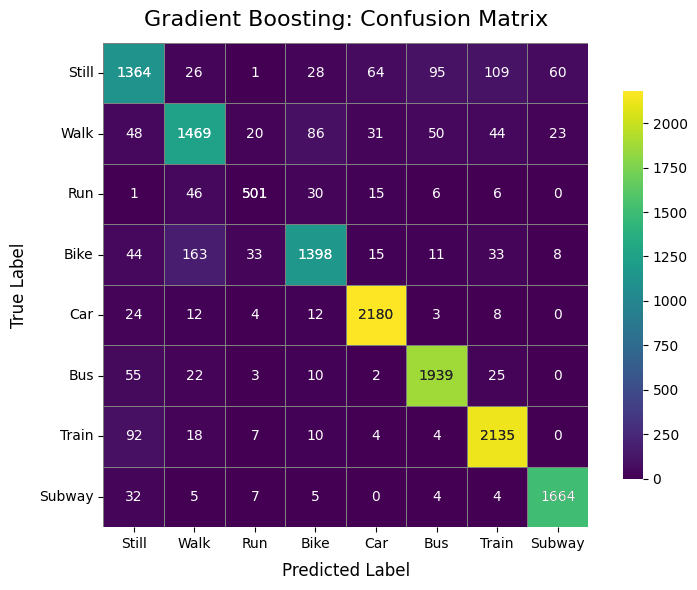

In [ ]:
import seaborn as sns
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]
cmap_choice = plt.cm.viridis


# === 6a. Train a Larger Random Forest ===
rf_large = RandomForestClassifier(
    n_estimators=100,       # More trees
    max_depth=50,           # Limit depth to prevent overfitting
    random_state=42,
    n_jobs=-1,
    verbose=1               # Show per-tree progress
)
print("\nTraining Random Forest with n_estimators=200, max_depth=20 …")
rf_large.fit(X_train, y_train)


# === 7a. Evaluate Random Forest ===
y_pred_rf = rf_large.predict(X_test)
print("\n=== Random Forest: Classification Report ===")
print(classification_report(y_test, y_pred_rf, digits=4))
print("=== Random Forest: Confusion Matrix ===")
print(confusion_matrix(y_test, y_pred_rf))


# === 6b. Train a Gradient Boosting Classifier ===
gbt = GradientBoostingClassifier(
    n_estimators=12,
    learning_rate=0.3,
    max_depth=7,
    random_state=42,
    verbose=1
)
print("\nTraining Gradient Boosting (n_estimators=12, learning_rate=0.3, max_depth=7) …")
gbt.fit(X_train, y_train)



# === 7b. Evaluate Gradient Boosting ===
y_pred_gbt = gbt.predict(X_test)
print("\n=== Gradient Boosting: Classification Report ===")
print(classification_report(y_test, y_pred_gbt, digits=4))

# Plot the GBT confusion matrix similarly
cm_gbt = confusion_matrix(y_test, y_pred_gbt)  # 8×8 array
cm_gbt_df = pd.DataFrame(cm_gbt, index=labels, columns=labels)

fig2, ax2 = plt.subplots(figsize=(8, 6), dpi=100)
sns.heatmap(
    cm_gbt_df,
    annot=True,
    fmt="d",
    cmap=cmap_choice,
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={"shrink": 0.8},
    ax=ax2
)

mask2 = np.zeros_like(cm_gbt_df, dtype=bool)
for i in range(len(cm_gbt_df)):
    for j in range(len(cm_gbt_df)):
        if i != j:
            mask2[i, j] = True

sns.heatmap(
    cm_gbt_df,
    mask=mask2,
    cmap=cmap_choice,
    annot=True,
    fmt="d",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar=False,
    ax=ax2
)

ax2.set_title("Gradient Boosting: Confusion Matrix", fontsize=16, pad=12)
ax2.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax2.set_ylabel("True Label", fontsize=12, labelpad=8)

ax2.set_xticklabels(ax2.get_xticklabels(), rotation=0, fontsize=10)
ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

# Above had the issue of window_id not being excluded, and it learned that specific window_id ranges differ in transport, just because they are sequentially given from beginning to end of recording

# More Data **1% -> 5%**

In [ ]:
pip install --q xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.1/318.1 MB 3.4 MB/s eta 0:00:00


Found 36 feature files.


Loading feature CSVs:   0%|          | 0/36 [00:00<?, ?file/s]

Combined shape (before sampling): (7058592, 78)
Mode distribution:
 mode
5.0    1142388
7.0    1125108
6.0    1019736
2.0     883584
1.0     880416
8.0     858024
4.0     845028
3.0     304308
Name: count, dtype: int64
Sampled shape (5%): (352930, 78)
Mode distribution in sample:
 mode
5.0    56841
7.0    56242
6.0    51077
2.0    44378
1.0    43944
8.0    42867
4.0    42407
3.0    15174
Name: count, dtype: int64
Shape after one-hot encoding (and dropping window_id): (352930, 78)
Training size: (282344, 78) | Testing size: (70586, 78)

Training XGBoost (n_estimators=80, max_depth=8, learning_rate=0.1) …


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [22:06:27] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



=== XGBoost: Classification Report ===
              precision    recall  f1-score   support

           0     0.5535    0.6467    0.5965      8789
           1     0.8279    0.8220    0.8249      8876
           2     0.9510    0.9265    0.9386      3035
           3     0.7720    0.7704    0.7712      8481
           4     0.6836    0.7293    0.7057     11368
           5     0.5975    0.5709    0.5839     10215
           6     0.4930    0.5057    0.4993     11249
           7     0.4276    0.3319    0.3737      8573

    accuracy                         0.6373     70586
   macro avg     0.6632    0.6629    0.6617     70586
weighted avg     0.6337    0.6373    0.6341     70586



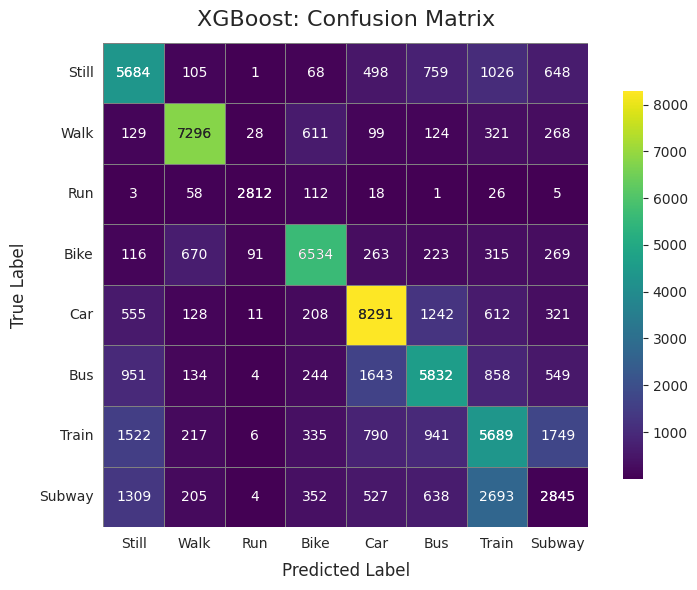


Top 10 Features – XGBoost (by gain):
              feature  importance
0        diff_entropy    0.063238
1             acf_std    0.060023
2       psd_peak_freq    0.057823
3       dct_peak_freq    0.048737
4             ptp_amp    0.038132
5   wavelet_energy_L1    0.036341
6        acf_mean_abs    0.034272
7  mean_crossing_rate    0.034255
8      sample_entropy    0.030987
9         dct_amp_std    0.030615


<ipython-input-17-8ca34407ba05>:283: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


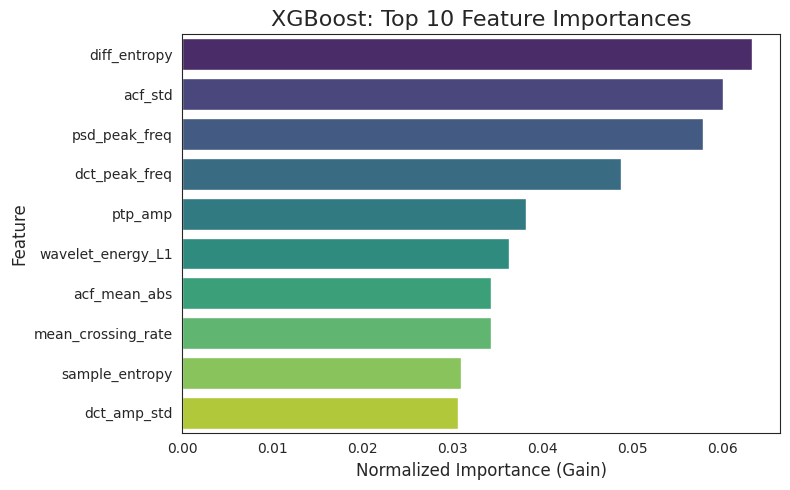

In [ ]:
# Cell 1: Imports
import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# Machine Learning Imports
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import xgboost as xgb

# Plotting Imports
import matplotlib.pyplot as plt
import seaborn as sns

# === Settings ===
DATA_ROOT = '/content/drive/MyDrive/Baza danych Challange Sussex 2025/features'
glob_pattern = os.path.join(DATA_ROOT, '*', '*.csv')

# === 1. Load + Concatenate All Feature CSVs (with tqdm) ===
all_files = glob.glob(glob_pattern)
print(f"Found {len(all_files)} feature files.")  # Expect 36

dfs = []
for fp in tqdm(all_files, desc='Loading feature CSVs', unit='file'):
    df_tmp = pd.read_csv(fp)   # Each CSV: numeric features + 'location' + 'sensor_axis' + 'mode'
    dfs.append(df_tmp)

df_all = pd.concat(dfs, axis=0, ignore_index=True)
df_all = df_all.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle

print("Combined shape (before sampling):", df_all.shape)
print("Mode distribution:\n", df_all['mode'].value_counts())

# === 2. Take a 5% Random Sample (for speed) ===
df_sample = df_all.sample(frac=0.05, random_state=42).reset_index(drop=True)
print("Sampled shape (5%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 3. One-Hot Encode 'location' and 'sensor_axis' ===
df_encoded = pd.get_dummies(
    df_sample.drop(columns=['mode', 'sensor_axis']),
    columns=['location'],
    prefix=['loc'],
    drop_first=False,
    dtype=np.uint8
).drop(columns=['window_id'])  # ← drop window_id here

print("Shape after one-hot encoding (and dropping window_id):", df_encoded.shape)

# === 4. Split into Features (X) and Target (y) ===
X = df_encoded
y = df_sample['mode']

# === 5. Train/Test Split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Training size:", X_train.shape, "| Testing size:", X_test.shape)

# Pre-define plotting parameters and labels
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]
sns.set_style("white")
cmap_choice = plt.cm.viridis


'''
# === 6a. Train a Random Forest ===
rf_large = RandomForestClassifier(
    n_estimators=100,      # More trees for better generalization
    max_depth=50,          # Limit depth to reduce overfitting
    random_state=42,
    n_jobs=-1,
    verbose=1              # Show per-tree progress
)
print("\nTraining Random Forest (n_estimators=100, max_depth=50) …")
rf_large.fit(X_train, y_train)  # Already-fitted model stores feature_importances_

# === 7a. Evaluate Random Forest ===
y_pred_rf = rf_large.predict(X_test)
print("\n=== Random Forest: Classification Report ===")
print(classification_report(y_test, y_pred_rf, digits=4))

# Plot RF confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_rf_df = pd.DataFrame(cm_rf, index=labels, columns=labels)

fig, ax = plt.subplots(figsize=(8, 6), dpi=100)
sns.heatmap(
    cm_rf_df,
    annot=True,
    fmt="d",
    cmap=cmap_choice,
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={"shrink": 0.8},
    ax=ax
)

mask = np.zeros_like(cm_rf_df, dtype=bool)
for i in range(len(cm_rf_df)):
    for j in range(len(cm_rf_df)):
        if i != j:
            mask[i, j] = True

sns.heatmap(
    cm_rf_df,
    mask=mask,
    cmap=cmap_choice,
    annot=True,
    fmt="d",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar=False,
    ax=ax
)

ax.set_title("Random Forest: Confusion Matrix", fontsize=16, pad=12)
ax.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax.set_ylabel("True Label", fontsize=12, labelpad=8)

ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

# === 6b. Train a Gradient Boosting Classifier ===
gbt = GradientBoostingClassifier(
    n_estimators=12,
    learning_rate=0.3,
    max_depth=7,
    random_state=42,
    verbose=1
)
print("\nTraining Gradient Boosting (n_estimators=12, learning_rate=0.3, max_depth=7) …")
gbt.fit(X_train, y_train)

# === 7b. Evaluate Gradient Boosting ===
y_pred_gbt = gbt.predict(X_test)
print("\n=== Gradient Boosting: Classification Report ===")
print(classification_report(y_test, y_pred_gbt, digits=4))

# Plot GBT confusion matrix
cm_gbt = confusion_matrix(y_test, y_pred_gbt)
cm_gbt_df = pd.DataFrame(cm_gbt, index=labels, columns=labels)

fig2, ax2 = plt.subplots(figsize=(8, 6), dpi=100)
sns.heatmap(
    cm_gbt_df,
    annot=True,
    fmt="d",
    cmap=cmap_choice,
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={"shrink": 0.8},
    ax=ax2
)

mask2 = np.zeros_like(cm_gbt_df, dtype=bool)
for i in range(len(cm_gbt_df)):
    for j in range(len(cm_gbt_df)):
        if i != j:
            mask2[i, j] = True

sns.heatmap(
    cm_gbt_df,
    mask=mask2,
    cmap=cmap_choice,
    annot=True,
    fmt="d",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar=False,
    ax=ax2
)

ax2.set_title("Gradient Boosting: Confusion Matrix", fontsize=16, pad=12)
ax2.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax2.set_ylabel("True Label", fontsize=12, labelpad=8)

ax2.set_xticklabels(ax2.get_xticklabels(), rotation=0, fontsize=10)
ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0, fontsize=10)

plt.tight_layout()
plt.show()
'''





# === 9. XGBoost ===
# Encode y labels from 1–8 to 0–7 for XGBoost compatibility
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

xgb_model = xgb.XGBClassifier(
    booster='gbtree',
    n_estimators=80,
    max_depth=8,
    learning_rate=0.3,
    random_state=42,
    n_jobs=-1,
    verbose =1
)
print("\nTraining XGBoost (n_estimators=80, max_depth=8, learning_rate=0.1) …")
xgb_model.fit(X_train, y_train_enc)

# XGB Evaluation (on encoded labels)
y_pred_xgb_enc = xgb_model.predict(X_test)
print("\n=== XGBoost: Classification Report ===")
print(classification_report(y_test_enc, y_pred_xgb_enc, digits=4))

# Build confusion matrix and map back to original class names
cm_xgb = confusion_matrix(y_test_enc, y_pred_xgb_enc)
cm_xgb_df = pd.DataFrame(cm_xgb, index=labels, columns=labels)

fig3, ax3 = plt.subplots(figsize=(8, 6), dpi=100)
sns.heatmap(
    cm_xgb_df,
    annot=True,
    fmt="d",
    cmap=cmap_choice,
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={"shrink": 0.8},
    ax=ax3
)
mask3 = np.zeros_like(cm_xgb_df, dtype=bool)
for i in range(len(cm_xgb_df)):
    for j in range(len(cm_xgb_df)):
        if i != j:
            mask3[i, j] = True

sns.heatmap(
    cm_xgb_df,
    mask=mask3,
    cmap=cmap_choice,
    annot=True,
    fmt="d",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar=False,
    ax=ax3
)
ax3.set_title("XGBoost: Confusion Matrix", fontsize=16, pad=12)
ax3.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax3.set_ylabel("True Label", fontsize=12, labelpad=8)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=0, fontsize=10)
ax3.set_yticklabels(ax3.get_yticklabels(), rotation=0, fontsize=10)
plt.tight_layout()
plt.show()




# === 10. XGBoost Feature Importances (no retraining) ===
xgb_importances = xgb_model.feature_importances_
feature_names = X_train.columns.tolist()

importance_df_xgb = pd.DataFrame({
    'feature': feature_names,
    'importance': xgb_importances
}).sort_values(by='importance', ascending=False).reset_index(drop=True)

print("\nTop 10 Features – XGBoost (by gain):")
print(importance_df_xgb.head(10))

plt.figure(figsize=(8, 5), dpi=100)
sns.barplot(
    data=importance_df_xgb.head(10),
    x='importance',
    y='feature',
    palette='viridis'
)
plt.title("XGBoost: Top 10 Feature Importances", fontsize=16)
plt.xlabel("Normalized Importance (Gain)", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()

# Test with sensor_fusion

In [10]:
pip install --q xgboost seaborn ipywidgets==7.7.5



[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
!pip install --upgrade ipywidgets==7.7.5
!pip install --upgrade jupyterlab>=4.0
!pip install --upgrade ipywidgets

Defaulting to user installation because normal site-packages is not writeable
  Using cached ipywidgets-7.7.5-py2.py3-none-any.whl.metadata (1.9 kB)
  Using cached widgetsnbextension-3.6.10-py2.py3-none-any.whl.metadata (1.3 kB)
  Using cached jupyterlab_widgets-1.1.11-py3-none-any.whl.metadata (3.7 kB)
Using cached ipywidgets-7.7.5-py2.py3-none-any.whl (123 kB)
Using cached jupyterlab_widgets-1.1.11-py3-none-any.whl (246 kB)
Using cached widgetsnbextension-3.6.10-py2.py3-none-any.whl (1.6 MB)

[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
poetry 1.1.13 requires packaging<21.0,>=20.4, but you have packaging 25.0 which is incompatible.
virtualenv 20.14.1 requires platformdirs<3,>=2, but you have platformdirs 4.3.8 which is incompatible.

[notice] A new

In [7]:
from tqdm.auto import tqdm
a=0
for i in tqdm(range(1,1000,1)):
              a=a+2
print(a)

  0%|          | 0/999 [00:00<?, ?it/s]

1998


In [6]:
print("Done")

Done


import complete
Found 52 feature files.


Loading feature CSVs:   0%|          | 0/52 [00:00<?, ?file/s]

Read file number 1
Read file number 2
Read file number 3
Read file number 4
Read file number 5
Read file number 6
Read file number 7
Read file number 8
Read file number 9
Read file number 10
Read file number 11
Read file number 12
Read file number 13
Read file number 14
Read file number 15
Read file number 16
Read file number 17
Read file number 18
Read file number 19
Read file number 20
Read file number 21
Read file number 22
Read file number 23
Read file number 24
Read file number 25
Read file number 26
Read file number 27
Read file number 28
Read file number 29
Read file number 30
Read file number 31
Read file number 32
Read file number 33
Read file number 34
Read file number 35
Read file number 36
Read file number 37
Read file number 38
Read file number 39
Read file number 40
Read file number 41
Read file number 42
Read file number 43
Read file number 44
Read file number 45
Read file number 46
Read file number 47
Read file number 48
Read file number 49
Read file number 50
Read file

/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [23:42:37] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



=== XGBoost: Classification Report ===
              precision    recall  f1-score   support

           0     0.7083    0.8500    0.7727        20
           1     0.8500    0.8947    0.8718        19
           2     1.0000    0.8333    0.9091         6
           3     1.0000    0.7857    0.8800        14
           4     0.7000    0.8400    0.7636        25
           5     0.5789    0.4231    0.4889        26
           6     0.5517    0.6667    0.6038        24
           7     0.4737    0.3913    0.4286        23

    accuracy                         0.6815       157
   macro avg     0.7328    0.7106    0.7148       157
weighted avg     0.6816    0.6815    0.6748       157



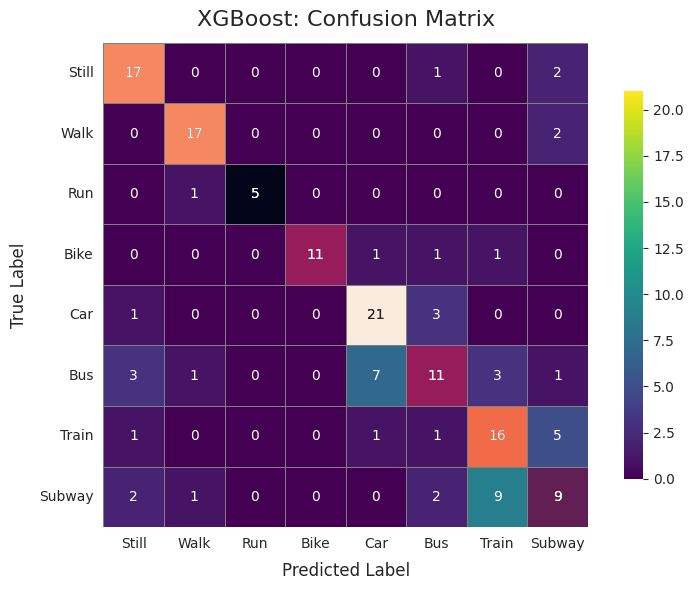


Top 10 Features – XGBoost:
                    feature  importance
0   Hand_Gyr_x_acf_mean_abs    0.021619
1        Hips_Mag_y_ptp_amp    0.021488
2  Torso_Gyr_z_psd_band_5_6    0.016191
3    Bag_Mag_x_psd_centroid    0.016050
4  Torso_Mag_y_diff_entropy    0.015189
5  Hips_Acc_y_psd_peak_freq    0.012976
6        Hand_Gyr_x_katz_fd    0.012013
7    Bag_Gyr_y_diff_entropy    0.011611
8   Torso_Acc_z_psd_amp_std    0.011576
9  Hand_Mag_y_psd_bandwidth    0.010892


/net/tscratch/people/plgdusza/slurm_jobdir/1467920/tmp.t0039/ipykernel_946022/3458645981.py:141: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')


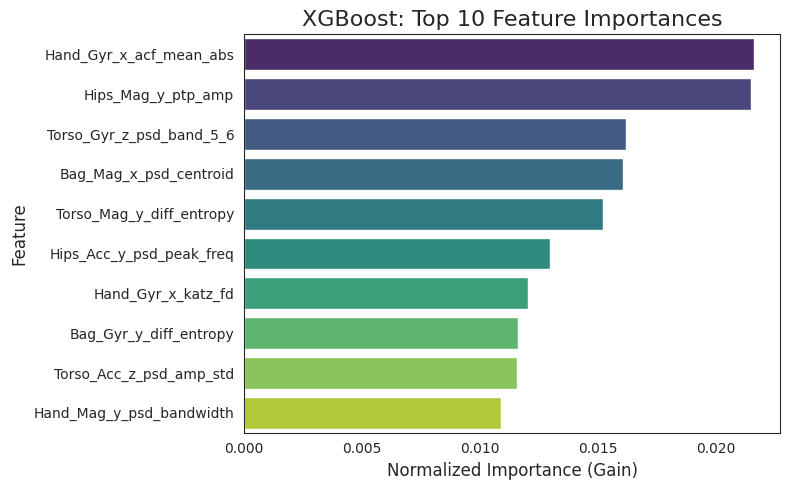

In [3]:
# Cell 1: Imports
import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# Machine Learning Imports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb

# Plotting Imports
import matplotlib.pyplot as plt
import seaborn as sns

print("import complete")

# === Settings ===
DATA_ROOT    = '/net/tscratch/people/plgdusza/Image Dataset/Baza danych Challange Sussex 2025/features'
glob_pattern = os.path.join(DATA_ROOT, '*', '*.csv')

# === 1. Load + Concatenate All Feature CSVs ===
all_files = glob.glob(glob_pattern)
print(f"Found {len(all_files)} feature files.")  # e.g. 52 now

dfs = []
number_file=0
for fp in tqdm(all_files, desc='Loading feature CSVs', unit='file'):
    dfs.append(pd.read_csv(fp))
    number_file+=1
    print("Read file number", number_file)
df_all = pd.concat(dfs, ignore_index=True)
df_all = df_all.sample(frac=1, random_state=42).reset_index(drop=True)
print("Combined long shape:", df_all.shape)
print("Mode distribution:\n", df_all['mode'].value_counts())

# === 2. Pivot to Wide: one row per (location, window_id) with 13 sensors side by side ===
wide_frames = []
number_folder=0
for loc in df_all['location'].unique():
    df_loc = df_all[df_all['location'] == loc]
    # mode per window
    mode_map = df_loc[['window_id','mode']].drop_duplicates().set_index('window_id')['mode']
    # pivot so each sensor_axis’s features become their own block of columns
    df_p = (
        df_loc
        .drop(columns=['location','mode'])
        .set_index(['window_id','sensor_axis'])
        .unstack('sensor_axis')
    )
    # flatten columns: e.g. ('mean','Acc_x') → 'Bag_Acc_x_mean'
    df_p.columns = [
        f"{loc}_{sensor}_{feat}"
        for feat, sensor in df_p.columns
    ]
    df_p = df_p.reset_index()
    df_p['mode'] = df_p['window_id'].map(mode_map)
    wide_frames.append(df_p)
    number_folder+=1
    print("Combined df folder number", number_folder)
    
    
df_wide = pd.concat(wide_frames, ignore_index=True)
print("Wide shape (rows=windows, cols=13 sensors×features + window_id + mode):", df_wide.shape)
print("Mode distribution:\n", df_wide['mode'].value_counts())

# === 3. Take a 5% Random Sample (for speed) ===
df_sample = df_wide.sample(frac=0.005, random_state=42).reset_index(drop=True)
print("Sampled shape (5%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 4. Prepare X and y ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 5. Train/Test Split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Training size:", X_train.shape, "| Testing size:", X_test.shape)

# Plotting style
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 6. XGBoost ===
# XGBoost needs 0–7 labels rather than 1–8
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

xgb_model = xgb.XGBClassifier(
    booster='gbtree',
    n_estimators=80,
    max_depth=8,
    learning_rate=0.3,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
print("\nTraining XGBoost …")
xgb_model.fit(X_train, y_train_enc)

# === 7. XGBoost Evaluation ===
y_pred_xgb_enc = xgb_model.predict(X_test)
print("\n=== XGBoost: Classification Report ===")
print(classification_report(y_test_enc, y_pred_xgb_enc, digits=4))

cm = confusion_matrix(y_test_enc, y_pred_xgb_enc)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

fig, ax = plt.subplots(figsize=(8,6), dpi=100)
sns.heatmap(cm_df, annot=True, fmt="d", cmap=cmap_choice, linewidths=0.5,
            linecolor="gray", square=True, cbar_kws={"shrink":0.8}, ax=ax)
mask = np.ones_like(cm_df, dtype=bool)
np.fill_diagonal(mask, False)
sns.heatmap(cm_df, mask=mask, annot=True, fmt="d", linewidths=0.5,
            linecolor="gray", square=True, cbar=False, ax=ax)
ax.set_title("XGBoost: Confusion Matrix", fontsize=16, pad=12)
ax.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax.set_ylabel("True Label", fontsize=12, labelpad=8)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

# === 8. XGBoost Feature Importances ===
imp = xgb_model.feature_importances_
feat_names = X_train.columns.tolist()
imp_df = pd.DataFrame({'feature':feat_names, 'importance':imp})\
            .sort_values('importance', ascending=False).reset_index(drop=True)

print("\nTop 10 Features – XGBoost:")
print(imp_df.head(10))

plt.figure(figsize=(8,5), dpi=100)
sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')
plt.title("XGBoost: Top 10 Feature Importances", fontsize=16)
plt.xlabel("Normalized Importance (Gain)", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()


Sampled shape (1%): (78429, 3850)
Mode distribution in sample:
 mode
5.0    12612
7.0    12504
6.0    11489
2.0     9832
1.0     9806
8.0     9522
4.0     9228
3.0     3436
Name: count, dtype: int64
Training size: (62743, 3848) | Testing size: (15686, 3848)

Training XGBoost on GPU …


/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [22:50:52] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "predictor" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



=== XGBoost: Classification Report ===
              precision    recall  f1-score   support

           0     0.8028    0.8929    0.8455      1961
           1     0.9662    0.9583    0.9622      1966
           2     0.9985    0.9854    0.9919       687
           3     0.9743    0.9648    0.9695      1846
           4     0.9340    0.9366    0.9353      2523
           5     0.8810    0.8538    0.8672      2298
           6     0.7605    0.7541    0.7573      2501
           7     0.7395    0.7038    0.7212      1904

    accuracy                         0.8698     15686
   macro avg     0.8821    0.8812    0.8813     15686
weighted avg     0.8702    0.8698    0.8696     15686



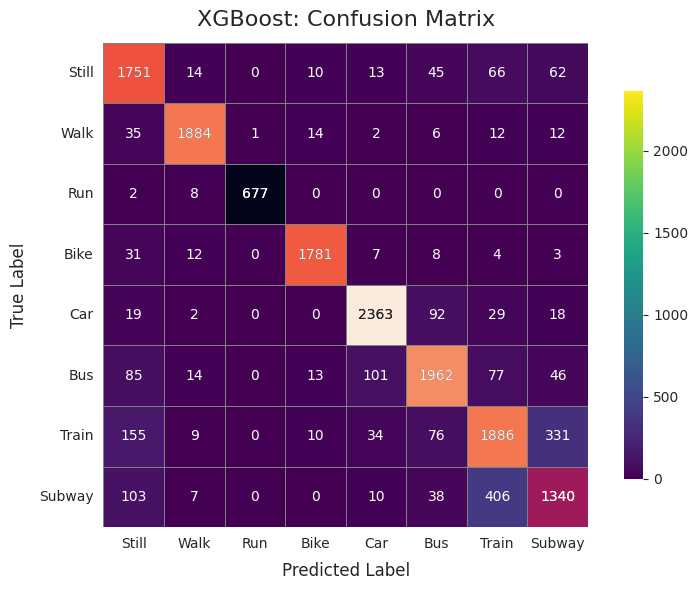


Top 10 Features – XGBoost:
                               feature  importance
0            Torso_Acc_y_psd_peak_freq    0.013656
1       Torso_Acc_z_mean_crossing_rate    0.010971
2          Bag_Acc_x_wavelet_energy_L2    0.010521
3                   Hips_Acc_y_acf_std    0.009904
4            Bag_Mag_x_hjorth_mobility    0.009833
5                  Torso_Acc_y_acf_std    0.009590
6   Bag_Acc_solo_mag_wavelet_energy_L0    0.009053
7  Hips_Acc_solo_mag_wavelet_energy_L3    0.008338
8              Hand_Gyr_z_acf_mean_abs    0.007781
9        Bag_Acc_solo_mag_psd_band_4_5    0.007188


/net/tscratch/people/plgdusza/slurm_jobdir/1467920/tmp.t0039/ipykernel_907352/2775367664.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')


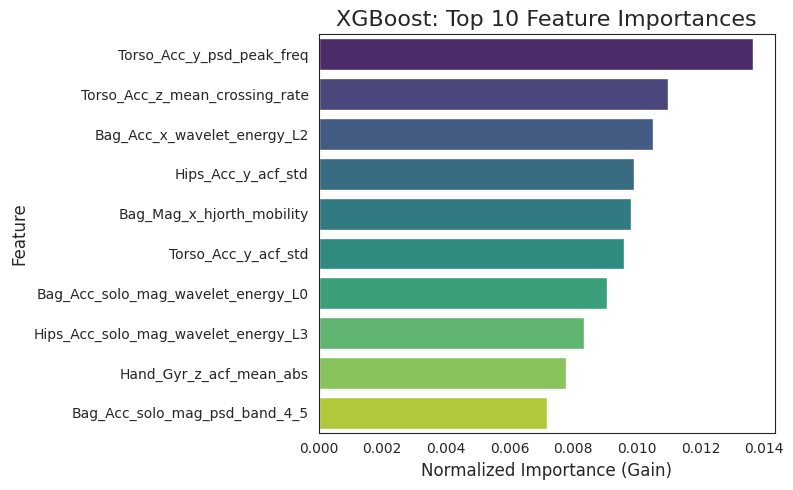

In [9]:

# === 3. Take a 1% Random Sample (for speed) ===
df_sample = df_wide.sample(frac=0.1, random_state=42).reset_index(drop=True)
print("Sampled shape (1%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 4. Prepare X and y ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 5. Train/Test Split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Training size:", X_train.shape, "| Testing size:", X_test.shape)

# Plotting style
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 6. XGBoost with GPU ===
# Shift labels from 1–8 to 0–7
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

xgb_model = xgb.XGBClassifier(
    tree_method='hist',           # CPU histogram or GPU, depending on `device`
    predictor='gpu_predictor',
    device='cuda:0',              # first GPU; omit gpu_id
    n_estimators=80,
    max_depth=8,
    learning_rate=0.3,
    random_state=42,
    n_jobs=-1,
    verbosity=1
)


print("\nTraining XGBoost on GPU …")
xgb_model.fit(X_train, y_train_enc)

# === 7. Evaluation (unchanged) ===
y_pred_xgb_enc = xgb_model.predict(X_test)
print("\n=== XGBoost: Classification Report ===")
print(classification_report(y_test_enc, y_pred_xgb_enc, digits=4))

cm = confusion_matrix(y_test_enc, y_pred_xgb_enc)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

fig, ax = plt.subplots(figsize=(8,6), dpi=100)
sns.heatmap(cm_df, annot=True, fmt="d", cmap=cmap_choice, linewidths=0.5,
            linecolor="gray", square=True, cbar_kws={"shrink":0.8}, ax=ax)
mask = np.ones_like(cm_df, dtype=bool)
np.fill_diagonal(mask, False)
sns.heatmap(cm_df, mask=mask, annot=True, fmt="d", linewidths=0.5,
            linecolor="gray", square=True, cbar=False, ax=ax)
ax.set_title("XGBoost: Confusion Matrix", fontsize=16, pad=12)
ax.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax.set_ylabel("True Label", fontsize=12, labelpad=8)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

# === 8. Feature Importances (unchanged) ===
imp = xgb_model.feature_importances_
feat_names = X_train.columns.tolist()
imp_df = pd.DataFrame({'feature':feat_names, 'importance':imp})\
            .sort_values('importance', ascending=False).reset_index(drop=True)

print("\nTop 10 Features – XGBoost:") 
print(imp_df.head(10))

plt.figure(figsize=(8,5), dpi=100)
sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')
plt.title("XGBoost: Top 10 Feature Importances", fontsize=16)
plt.xlabel("Normalized Importance (Gain)", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()


Training size: (62743, 3848) | Testing size: (15686, 3848)

Training XGBoost on GPU …


/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [22:53:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "predictor" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



=== XGBoost: Classification Report ===
              precision    recall  f1-score   support

           0     0.8045    0.9046    0.8517      1961
           1     0.9696    0.9578    0.9637      1966
           2     0.9985    0.9898    0.9942       687
           3     0.9686    0.9680    0.9683      1846
           4     0.9470    0.9481    0.9475      2523
           5     0.9038    0.8708    0.8870      2298
           6     0.7896    0.7789    0.7842      2501
           7     0.7741    0.7342    0.7536      1904

    accuracy                         0.8838     15686
   macro avg     0.8945    0.8940    0.8938     15686
weighted avg     0.8844    0.8838    0.8836     15686



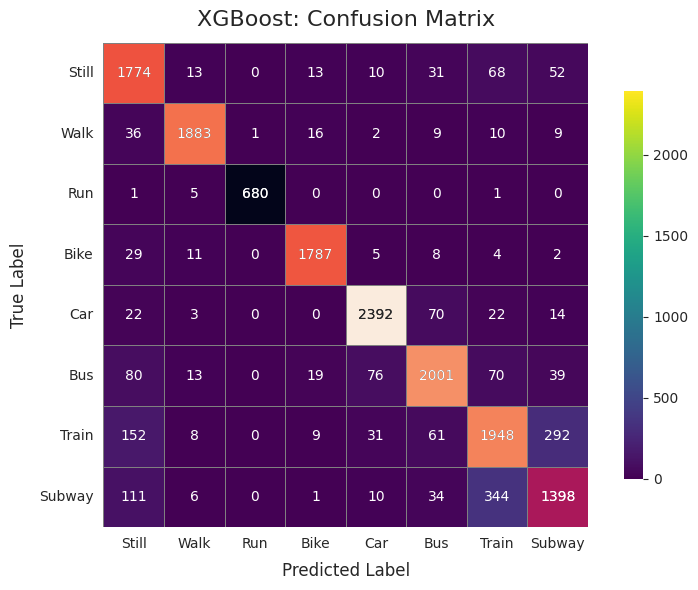


Top 10 Features – XGBoost:
                               feature  importance
0       Torso_Acc_z_mean_crossing_rate    0.018214
1            Torso_Acc_y_psd_peak_freq    0.016839
2             Hand_Gyr_y_acf_prom_freq    0.012779
3               Bag_Gyr_z_diff_entropy    0.012619
4                   Hips_Acc_y_acf_std    0.012485
5                  Torso_Acc_y_acf_std    0.012053
6        Hips_Acc_z_mean_crossing_rate    0.010257
7   Bag_Acc_solo_mag_wavelet_energy_L0    0.009706
8  Hips_Acc_solo_mag_wavelet_energy_L3    0.009523
9        Bag_Acc_solo_mag_psd_band_4_5    0.009100


/net/tscratch/people/plgdusza/slurm_jobdir/1467920/tmp.t0039/ipykernel_907352/2854422082.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')


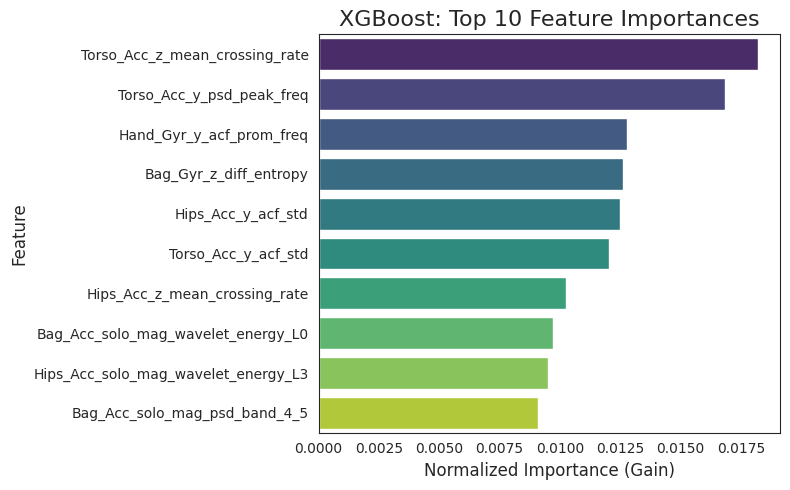

In [14]:
# === 5. Train/Test Split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Training size:", X_train.shape, "| Testing size:", X_test.shape)

# Plotting style
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 6. XGBoost with GPU ===
# Shift labels from 1–8 to 0–7
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

xgb_model = xgb.XGBClassifier(
    tree_method='hist',           # CPU histogram or GPU, depending on `device`
    predictor='gpu_predictor',
    device='cuda:0',              # first GPU; omit gpu_id
    n_estimators=180,
    max_depth=8,
    learning_rate=0.4,
    random_state=42,
    n_jobs=-1,
    verbosity=1
)


print("\nTraining XGBoost on GPU …")
xgb_model.fit(X_train, y_train_enc)

# === 7. Evaluation (unchanged) ===
y_pred_xgb_enc = xgb_model.predict(X_test)
print("\n=== XGBoost: Classification Report ===")
print(classification_report(y_test_enc, y_pred_xgb_enc, digits=4))

cm = confusion_matrix(y_test_enc, y_pred_xgb_enc)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

fig, ax = plt.subplots(figsize=(8,6), dpi=100)
sns.heatmap(cm_df, annot=True, fmt="d", cmap=cmap_choice, linewidths=0.5,
            linecolor="gray", square=True, cbar_kws={"shrink":0.8}, ax=ax)
mask = np.ones_like(cm_df, dtype=bool)
np.fill_diagonal(mask, False)
sns.heatmap(cm_df, mask=mask, annot=True, fmt="d", linewidths=0.5,
            linecolor="gray", square=True, cbar=False, ax=ax)
ax.set_title("XGBoost: Confusion Matrix", fontsize=16, pad=12)
ax.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax.set_ylabel("True Label", fontsize=12, labelpad=8)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

# === 8. Feature Importances (unchanged) ===
imp = xgb_model.feature_importances_
feat_names = X_train.columns.tolist()
imp_df = pd.DataFrame({'feature':feat_names, 'importance':imp})\
            .sort_values('importance', ascending=False).reset_index(drop=True)

print("\nTop 10 Features – XGBoost:") 
print(imp_df.head(10))

plt.figure(figsize=(8,5), dpi=100)
sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')
plt.title("XGBoost: Top 10 Feature Importances", fontsize=16)
plt.xlabel("Normalized Importance (Gain)", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()


Sampled shape (20%): (156858, 3850)
Mode distribution in sample:
 mode
5.0    25284
7.0    25052
6.0    22702
2.0    19737
1.0    19539
8.0    18987
4.0    18820
3.0     6737
Name: count, dtype: int64
Train size: (125486, 3848) | Test size: (31372, 3848)

=== Run 1/1 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0.01, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0.3, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.9118

Classification Report:
              precision    recall  f1-score   support

       Still     0.8363    0.9138    0.8733      3908
        Walk     0.9661    0.9592    0.9626      3947
         Run     0.9970    0.9889    0.9929      1347
        Bike     0.9746    0.9676    0.9711      3764
         Car     0.9592    0.9539    0.9566      5057
         Bus     0.9186    0.9027    0.9106      4541
       Train     0.8357    0.8180    0.8267      5011
      Subway     0.8096    0.7919    0.8007      3797


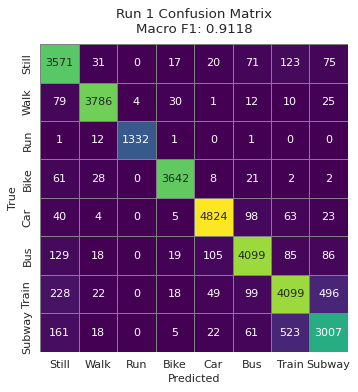


Best hyperparameters (by macro F1):
{'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0.01, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0.3, 'colsample_bytree': 0.5}
Best test-set macro F1: 0.9118
Saved best model to: best_xgb_model_by_macro_f1.joblib


In [18]:
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 10   # ← set this to however many runs you want

# === 1. Sample your data (2% for speed) ===
df_sample = df_wide.sample(frac=0.2, random_state=42).reset_index(drop=True)
print("Sampled shape (20%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [50, 100, 150, 200, 300],           # number of boosting rounds 
    "max_depth":        [7, 9, 12, 14],                  # tree complexity
    "learning_rate":    [0.01, 0.05, 0.1, 0.2, 0.3],       # shrinkage factor
    "subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],          # row sampling
    "colsample_bytree": [0.5, 0.7, 0.8, 1.0],               # feature sampling
    "gamma":            [0, 0.1, 0.2, 0.3, 0.5],            # min loss reduction
    "min_child_weight": [1, 3, 5, 7],                      # minimum leaf instance
    "reg_alpha":        [0, 0.01, 0.1, 1],                  # L1 regularization
    "reg_lambda":       [1, 1.5, 2, 3]                      # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1    = -1.0
best_model = None
best_params= None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1    = f1
        best_model = model
        best_params= params

# After loop
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)

# Save the best model to disk with joblib
output_path = "best_xgb_model_by_macro_f1.joblib"
joblib.dump(best_model, output_path)
print(f"Saved best model to: {output_path}")


In [4]:
pip install numba

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 MB 80.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 83.3 MB/s eta 0:00:00:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.0
    Uninstalling numpy-1.23.0:
      Successfully uninstalled numpy-1.23.0
  You can safely remove it manually.
  You can safely remove it manually.

[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install --upgrade "numpy==1.24.3"

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 66.1 MB/s eta 0:00:00ta 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.0
    Uninstalling numpy-1.24.0:
      Successfully uninstalled numpy-1.24.0

[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.



=== Run 1/10 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0.01, 'n_estimators': 50, 'min_child_weight': 3, 'max_depth': 10, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.8563

Classification Report:
              precision    recall  f1-score   support

       Still     0.7712    0.8721    0.8185      3908
        Walk     0.9543    0.9521    0.9532      3947
         Run     0.9977    0.9852    0.9914      1347
        Bike     0.9626    0.9567    0.9596      3764
         Car     0.8987    0.8875    0.8930      5057
         Bus     0.8222    0.8267    0.8244      4541
       Train     0.7333    0.7434    0.7383      5011
      Subway     0.7222    0.6284    0.6720      3797

    accuracy                         0.8430     31372
   macro avg     0.8578    0.8565    0.8563     31372
weighted avg     0.8429    0.8430    0.8421     31372



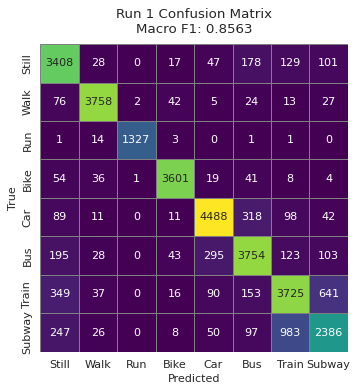


=== Run 2/10 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 1, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9060

Classification Report:
              precision    recall  f1-score   support

       Still     0.8229    0.9158    0.8669      3908
        Walk     0.9651    0.9602    0.9627      3947
         Run     0.9970    0.9881    0.9925      1347
        Bike     0.9743    0.9652    0.9697      3764
         Car     0.9535    0.9478    0.9506      5057
         Bus     0.9052    0.8939    0.8995      4541
       Train     0.8334    0.8096    0.8213      5011
      Subway     0.8004    0.7701    0.7850      3797

    accuracy                         0.8978     31372
   macro avg     0.9065    0.9063    0.9060     31372
weighted avg     0.8984    0.8978    0.8977     31372



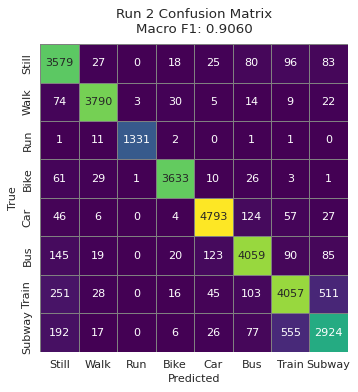


=== Run 3/10 — Params: {'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9011

Classification Report:
              precision    recall  f1-score   support

       Still     0.8250    0.9058    0.8635      3908
        Walk     0.9659    0.9554    0.9606      3947
         Run     0.9963    0.9881    0.9922      1347
        Bike     0.9740    0.9665    0.9703      3764
         Car     0.9542    0.9444    0.9493      5057
         Bus     0.9013    0.8890    0.8951      4541
       Train     0.8107    0.8034    0.8071      5011
      Subway     0.7856    0.7564    0.7707      3797

    accuracy                         0.8922     31372
   macro avg     0.9016    0.9011    0.9011     31372
weighted avg     0.8928    0.8922    0.8922     31372



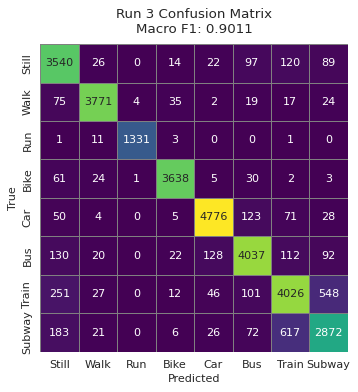


=== Run 4/10 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 1, 'n_estimators': 50, 'min_child_weight': 7, 'max_depth': 7, 'learning_rate': 0.01, 'gamma': 0.5, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.7988

Classification Report:
              precision    recall  f1-score   support

       Still     0.7403    0.7958    0.7670      3908
        Walk     0.9124    0.9291    0.9207      3947
         Run     0.9962    0.9755    0.9857      1347
        Bike     0.9259    0.9129    0.9193      3764
         Car     0.8106    0.8280    0.8192      5057
         Bus     0.7516    0.7065    0.7283      4541
       Train     0.6459    0.6917    0.6680      5011
      Subway     0.6238    0.5460    0.5823      3797

    accuracy                         0.7797     31372
   macro avg     0.8009    0.7982    0.7988     31372
weighted avg     0.7790    0.7797    0.7787     31372



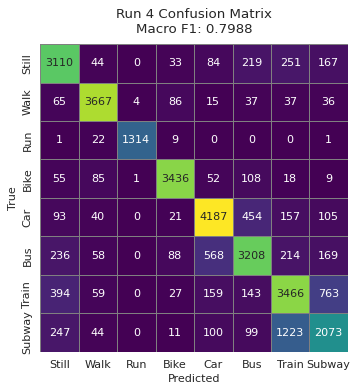


=== Run 5/10 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 200, 'min_child_weight': 3, 'max_depth': 9, 'learning_rate': 0.1, 'gamma': 0.3, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9033

Classification Report:
              precision    recall  f1-score   support

       Still     0.8175    0.9179    0.8648      3908
        Walk     0.9645    0.9577    0.9611      3947
         Run     0.9977    0.9874    0.9925      1347
        Bike     0.9717    0.9671    0.9694      3764
         Car     0.9516    0.9454    0.9485      5057
         Bus     0.9042    0.8879    0.8960      4541
       Train     0.8283    0.8036    0.8158      5011
      Subway     0.7948    0.7622    0.7782      3797

    accuracy                         0.8948     31372
   macro avg     0.9038    0.9036    0.9033     31372
weighted avg     0.8954    0.8948    0.8946     31372



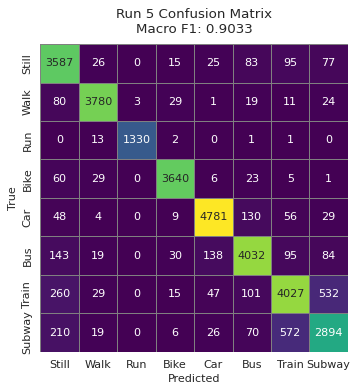


=== Run 6/10 — Params: {'subsample': 1.0, 'reg_lambda': 3, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 5, 'max_depth': 7, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.8643

Classification Report:
              precision    recall  f1-score   support

       Still     0.7749    0.8754    0.8221      3908
        Walk     0.9503    0.9549    0.9526      3947
         Run     0.9970    0.9866    0.9918      1347
        Bike     0.9590    0.9567    0.9578      3764
         Car     0.9012    0.9041    0.9027      5057
         Bus     0.8490    0.8274    0.8381      4541
       Train     0.7648    0.7444    0.7544      5011
      Subway     0.7214    0.6703    0.6949      3797

    accuracy                         0.8518     31372
   macro avg     0.8647    0.8650    0.8643     31372
weighted avg     0.8516    0.8518    0.8512     31372



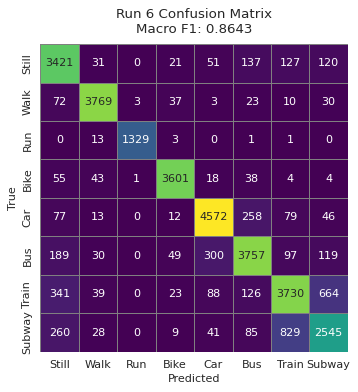


=== Run 7/10 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9062

Classification Report:
              precision    recall  f1-score   support

       Still     0.8198    0.9153    0.8649      3908
        Walk     0.9675    0.9569    0.9622      3947
         Run     0.9963    0.9881    0.9922      1347
        Bike     0.9743    0.9668    0.9705      3764
         Car     0.9585    0.9512    0.9548      5057
         Bus     0.9111    0.8912    0.9010      4541
       Train     0.8303    0.8074    0.8187      5011
      Subway     0.7952    0.7751    0.7850      3797

    accuracy                         0.8979     31372
   macro avg     0.9066    0.9065    0.9062     31372
weighted avg     0.8988    0.8979    0.8980     31372



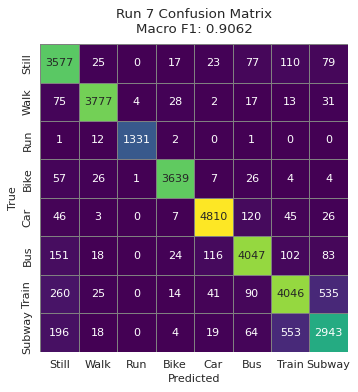


=== Run 8/10 — Params: {'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 150, 'min_child_weight': 3, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9047

Classification Report:
              precision    recall  f1-score   support

       Still     0.8263    0.9120    0.8670      3908
        Walk     0.9684    0.9549    0.9616      3947
         Run     0.9970    0.9896    0.9933      1347
        Bike     0.9725    0.9668    0.9696      3764
         Car     0.9560    0.9488    0.9524      5057
         Bus     0.9081    0.8943    0.9011      4541
       Train     0.8192    0.8066    0.8129      5011
      Subway     0.7939    0.7659    0.7796      3797

    accuracy                         0.8961     31372
   macro avg     0.9052    0.9049    0.9047     31372
weighted avg     0.8967    0.8961    0.8961     31372



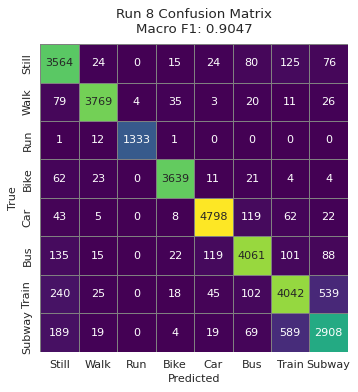


=== Run 9/10 — Params: {'subsample': 0.7, 'reg_lambda': 1.5, 'reg_alpha': 0, 'n_estimators': 150, 'min_child_weight': 7, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0.2, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.9004

Classification Report:
              precision    recall  f1-score   support

       Still     0.8223    0.9092    0.8635      3908
        Walk     0.9620    0.9557    0.9588      3947
         Run     0.9963    0.9896    0.9929      1347
        Bike     0.9737    0.9641    0.9689      3764
         Car     0.9490    0.9488    0.9489      5057
         Bus     0.9099    0.8899    0.8998      4541
       Train     0.8131    0.7875    0.8001      5011
      Subway     0.7785    0.7617    0.7700      3797

    accuracy                         0.8914     31372
   macro avg     0.9006    0.9008    0.9004     31372
weighted avg     0.8918    0.8914    0.8913     31372



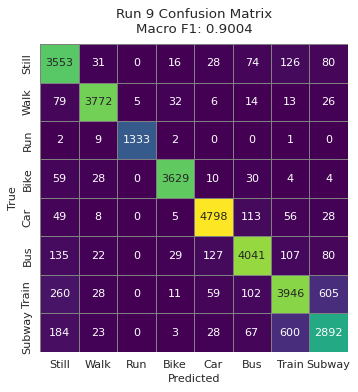


=== Run 10/10 — Params: {'subsample': 0.8, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 50, 'min_child_weight': 3, 'max_depth': 10, 'learning_rate': 0.01, 'gamma': 0.2, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.8445

Classification Report:
              precision    recall  f1-score   support

       Still     0.7606    0.8477    0.8018      3908
        Walk     0.9434    0.9460    0.9447      3947
         Run     0.9985    0.9852    0.9918      1347
        Bike     0.9452    0.9527    0.9489      3764
         Car     0.8704    0.8738    0.8721      5057
         Bus     0.8035    0.7926    0.7980      4541
       Train     0.7312    0.7238    0.7275      5011
      Subway     0.7081    0.6376    0.6710      3797

    accuracy                         0.8296     31372
   macro avg     0.8451    0.8449    0.8445     31372
weighted avg     0.8288    0.8296    0.8287     31372



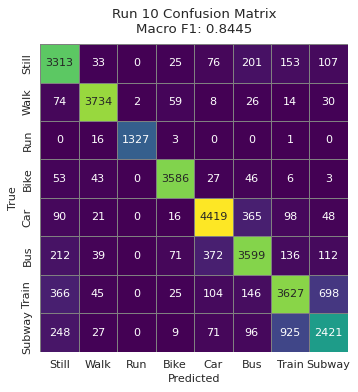


Best hyperparameters (by macro F1):
{'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.7}
Best test-set macro F1: 0.9062


In [10]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 10   # ← set this to however many runs you want
'''
# === 1. Sample your data (20% for speed) ===
df_sample = df_wide.sample(frac=0.2, random_state=42).reset_index(drop=True)
print("Sampled shape (20%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1
'''
# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [150, 200, 250],           # number of boosting rounds 
    "max_depth":        [7, 9, 10],                  # tree complexity
    "learning_rate":    [0.1, 0.2, 0.3, 0.4],       # shrinkage factor
    "subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],          # row sampling
    "colsample_bytree": [0.5, 0.7, 0.8, 1.0],               # feature sampling
    "gamma":            [0, 0.1, 0.2, 0.3, 0.5],            # min loss reduction
    "min_child_weight": [1, 3, 5, 7],                      # minimum leaf instance
    "reg_alpha":        [0, 0.01, 0.1, 1],                  # L1 regularization
    "reg_lambda":       [1, 1.5, 2, 3]                      # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1    = -1.0
best_model = None
best_params= None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# After loop
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)



=== Run 1/30 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9073

Classification Report:
              precision    recall  f1-score   support

       Still     0.8276    0.9186    0.8707      3908
        Walk     0.9662    0.9564    0.9613      3947
         Run     0.9970    0.9881    0.9925      1347
        Bike     0.9774    0.9668    0.9721      3764
         Car     0.9607    0.9512    0.9559      5057
         Bus     0.9108    0.8950    0.9028      4541
       Train     0.8288    0.8084    0.8185      5011
      Subway     0.7936    0.7759    0.7847      3797

    accuracy                         0.8991     31372
   macro avg     0.9078    0.9075    0.9073     31372
weighted avg     0.8999    0.8991    0.8991     31372



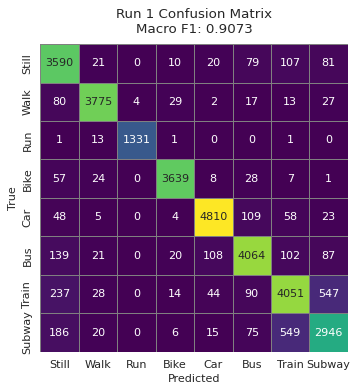


=== Run 2/30 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9113

Classification Report:
              precision    recall  f1-score   support

       Still     0.8338    0.9181    0.8739      3908
        Walk     0.9658    0.9582    0.9620      3947
         Run     0.9955    0.9881    0.9918      1347
        Bike     0.9730    0.9676    0.9703      3764
         Car     0.9601    0.9516    0.9558      5057
         Bus     0.9147    0.9002    0.9074      4541
       Train     0.8402    0.8182    0.8290      5011
      Subway     0.8095    0.7914    0.8004      3797

    accuracy                         0.9036     31372
   macro avg     0.9116    0.9117    0.9113     31372
weighted avg     0.9042    0.9036    0.9036     31372



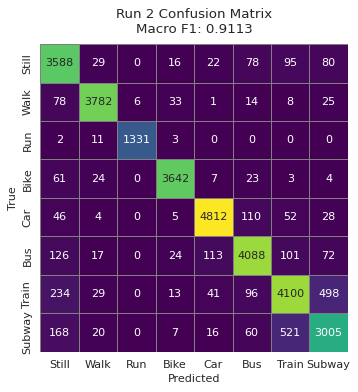


=== Run 3/30 — Params: {'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 250, 'min_child_weight': 3, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9114

Classification Report:
              precision    recall  f1-score   support

       Still     0.8291    0.9202    0.8723      3908
        Walk     0.9670    0.9587    0.9628      3947
         Run     0.9978    0.9881    0.9929      1347
        Bike     0.9751    0.9687    0.9719      3764
         Car     0.9636    0.9529    0.9582      5057
         Bus     0.9189    0.9027    0.9107      4541
       Train     0.8381    0.8148    0.8263      5011
      Subway     0.8051    0.7877    0.7963      3797

    accuracy                         0.9036     31372
   macro avg     0.9118    0.9117    0.9114     31372
weighted avg     0.9044    0.9036    0.9037     31372



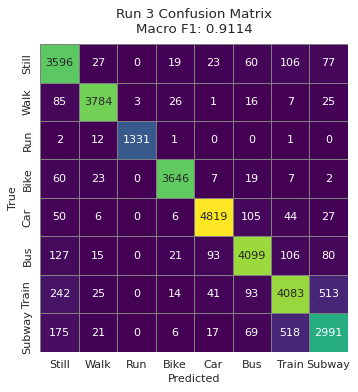


=== Run 4/30 — Params: {'subsample': 1.0, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 150, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.5, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.8878

Classification Report:
              precision    recall  f1-score   support

       Still     0.7983    0.8994    0.8459      3908
        Walk     0.9574    0.9574    0.9574      3947
         Run     0.9963    0.9874    0.9918      1347
        Bike     0.9685    0.9633    0.9659      3764
         Car     0.9323    0.9343    0.9333      5057
         Bus     0.8842    0.8677    0.8758      4541
       Train     0.8054    0.7705    0.7876      5011
      Subway     0.7625    0.7279    0.7448      3797

    accuracy                         0.8779     31372
   macro avg     0.8881    0.8885    0.8878     31372
weighted avg     0.8781    0.8779    0.8775     31372



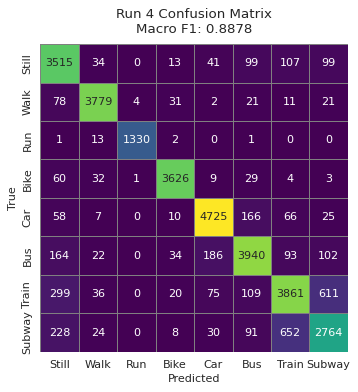


=== Run 5/30 — Params: {'subsample': 1.0, 'reg_lambda': 3, 'reg_alpha': 0.01, 'n_estimators': 200, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9087

Classification Report:
              precision    recall  f1-score   support

       Still     0.8234    0.9184    0.8683      3908
        Walk     0.9665    0.9590    0.9627      3947
         Run     0.9955    0.9881    0.9918      1347
        Bike     0.9741    0.9681    0.9711      3764
         Car     0.9572    0.9516    0.9544      5057
         Bus     0.9135    0.8972    0.9052      4541
       Train     0.8374    0.8100    0.8235      5011
      Subway     0.8046    0.7809    0.7926      3797

    accuracy                         0.9008     31372
   macro avg     0.9090    0.9091    0.9087     31372
weighted avg     0.9014    0.9008    0.9007     31372



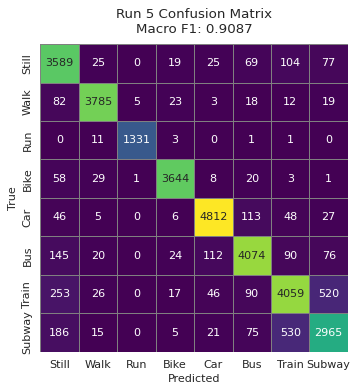


=== Run 6/30 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 200, 'min_child_weight': 7, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0.5, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9086

Classification Report:
              precision    recall  f1-score   support

       Still     0.8258    0.9145    0.8679      3908
        Walk     0.9670    0.9577    0.9623      3947
         Run     0.9963    0.9896    0.9929      1347
        Bike     0.9761    0.9676    0.9718      3764
         Car     0.9584    0.9525    0.9555      5057
         Bus     0.9173    0.8961    0.9065      4541
       Train     0.8323    0.8162    0.8242      5011
      Subway     0.7992    0.7767    0.7878      3797

    accuracy                         0.9006     31372
   macro avg     0.9090    0.9089    0.9086     31372
weighted avg     0.9014    0.9006    0.9006     31372



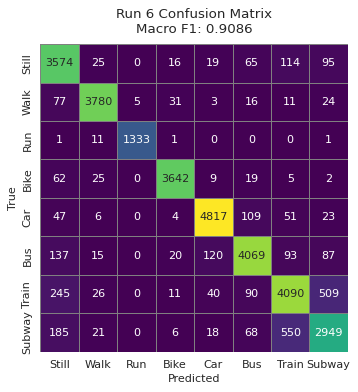


=== Run 7/30 — Params: {'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 150, 'min_child_weight': 5, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.3, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.8875

Classification Report:
              precision    recall  f1-score   support

       Still     0.8011    0.8999    0.8477      3908
        Walk     0.9586    0.9562    0.9574      3947
         Run     0.9955    0.9881    0.9918      1347
        Bike     0.9655    0.9601    0.9628      3764
         Car     0.9338    0.9351    0.9345      5057
         Bus     0.8855    0.8699    0.8776      4541
       Train     0.8021    0.7699    0.7857      5011
      Subway     0.7598    0.7264    0.7427      3797

    accuracy                         0.8776     31372
   macro avg     0.8877    0.8882    0.8875     31372
weighted avg     0.8778    0.8776    0.8772     31372



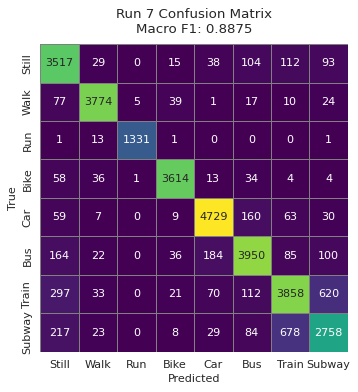


=== Run 8/30 — Params: {'subsample': 0.7, 'reg_lambda': 1.5, 'reg_alpha': 0, 'n_estimators': 250, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.4, 'gamma': 0.5, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.9051

Classification Report:
              precision    recall  f1-score   support

       Still     0.8273    0.9110    0.8671      3908
        Walk     0.9626    0.9587    0.9606      3947
         Run     0.9970    0.9881    0.9925      1347
        Bike     0.9742    0.9644    0.9693      3764
         Car     0.9534    0.9512    0.9523      5057
         Bus     0.9125    0.8912    0.9017      4541
       Train     0.8259    0.8046    0.8151      5011
      Subway     0.7908    0.7738    0.7822      3797

    accuracy                         0.8967     31372
   macro avg     0.9055    0.9054    0.9051     31372
weighted avg     0.8973    0.8967    0.8967     31372



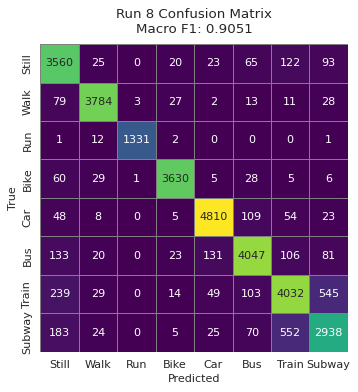


=== Run 9/30 — Params: {'subsample': 0.8, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 150, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9073

Classification Report:
              precision    recall  f1-score   support

       Still     0.8303    0.9127    0.8696      3908
        Walk     0.9640    0.9574    0.9607      3947
         Run     0.9978    0.9881    0.9929      1347
        Bike     0.9702    0.9673    0.9687      3764
         Car     0.9597    0.9514    0.9555      5057
         Bus     0.9144    0.9007    0.9075      4541
       Train     0.8297    0.8098    0.8196      5011
      Subway     0.7947    0.7727    0.7835      3797

    accuracy                         0.8992     31372
   macro avg     0.9076    0.9075    0.9073     31372
weighted avg     0.8997    0.8992    0.8992     31372



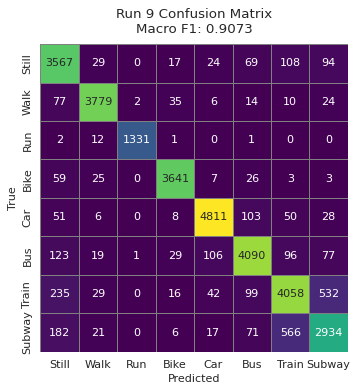


=== Run 10/30 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0, 'n_estimators': 200, 'min_child_weight': 3, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0.3, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9083

Classification Report:
              precision    recall  f1-score   support

       Still     0.8262    0.9199    0.8706      3908
        Walk     0.9690    0.9592    0.9641      3947
         Run     0.9985    0.9866    0.9925      1347
        Bike     0.9753    0.9663    0.9708      3764
         Car     0.9604    0.9494    0.9549      5057
         Bus     0.9139    0.8956    0.9047      4541
       Train     0.8288    0.8126    0.8206      5011
      Subway     0.7993    0.7772    0.7881      3797

    accuracy                         0.9001     31372
   macro avg     0.9089    0.9084    0.9083     31372
weighted avg     0.9010    0.9001    0.9002     31372



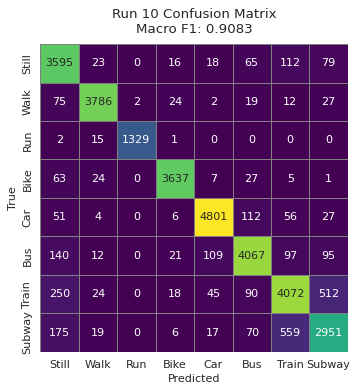


=== Run 11/30 — Params: {'subsample': 0.7, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 3, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.5, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9072

Classification Report:
              precision    recall  f1-score   support

       Still     0.8281    0.9112    0.8677      3908
        Walk     0.9648    0.9592    0.9620      3947
         Run     0.9970    0.9889    0.9929      1347
        Bike     0.9725    0.9679    0.9702      3764
         Car     0.9570    0.9516    0.9543      5057
         Bus     0.9169    0.8939    0.9052      4541
       Train     0.8247    0.8104    0.8175      5011
      Subway     0.7993    0.7761    0.7875      3797

    accuracy                         0.8989     31372
   macro avg     0.9076    0.9074    0.9072     31372
weighted avg     0.8995    0.8989    0.8989     31372



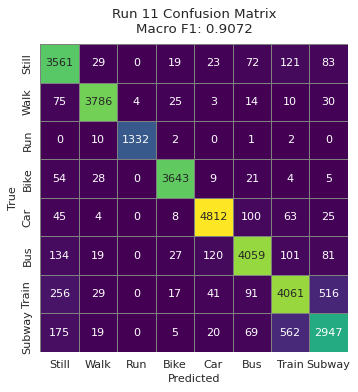


=== Run 12/30 — Params: {'subsample': 0.9, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 200, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.2, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9112

Classification Report:
              precision    recall  f1-score   support

       Still     0.8332    0.9153    0.8723      3908
        Walk     0.9665    0.9582    0.9623      3947
         Run     0.9963    0.9889    0.9925      1347
        Bike     0.9723    0.9684    0.9703      3764
         Car     0.9617    0.9537    0.9577      5057
         Bus     0.9118    0.8969    0.9043      4541
       Train     0.8383    0.8212    0.8296      5011
      Subway     0.8119    0.7888    0.8002      3797

    accuracy                         0.9034     31372
   macro avg     0.9115    0.9114    0.9112     31372
weighted avg     0.9040    0.9034    0.9034     31372



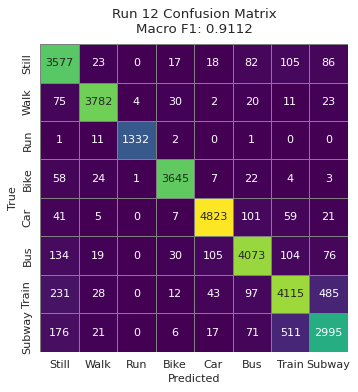


=== Run 13/30 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0, 'n_estimators': 250, 'min_child_weight': 3, 'max_depth': 7, 'learning_rate': 0.4, 'gamma': 0.5, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9072

Classification Report:
              precision    recall  f1-score   support

       Still     0.8325    0.9094    0.8693      3908
        Walk     0.9623    0.9567    0.9595      3947
         Run     0.9970    0.9881    0.9925      1347
        Bike     0.9714    0.9641    0.9677      3764
         Car     0.9567    0.9523    0.9545      5057
         Bus     0.9146    0.8917    0.9030      4541
       Train     0.8334    0.8118    0.8225      5011
      Subway     0.7918    0.7854    0.7886      3797

    accuracy                         0.8991     31372
   macro avg     0.9075    0.9074    0.9072     31372
weighted avg     0.8997    0.8991    0.8991     31372



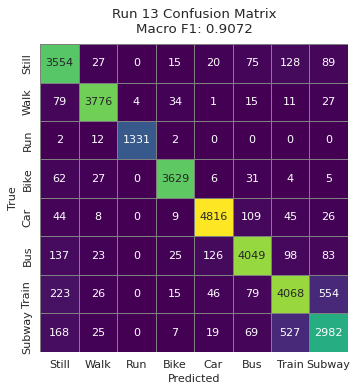


=== Run 14/30 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9114

Classification Report:
              precision    recall  f1-score   support

       Still     0.8357    0.9199    0.8758      3908
        Walk     0.9668    0.9602    0.9635      3947
         Run     0.9970    0.9874    0.9922      1347
        Bike     0.9777    0.9668    0.9722      3764
         Car     0.9612    0.9553    0.9582      5057
         Bus     0.9166    0.9022    0.9093      4541
       Train     0.8370    0.8148    0.8258      5011
      Subway     0.8027    0.7864    0.7945      3797

    accuracy                         0.9037     31372
   macro avg     0.9118    0.9116    0.9114     31372
weighted avg     0.9043    0.9037    0.9037     31372



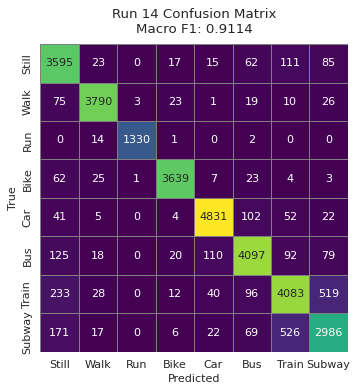


=== Run 15/30 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 150, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9007

Classification Report:
              precision    recall  f1-score   support

       Still     0.8139    0.9122    0.8603      3908
        Walk     0.9620    0.9564    0.9592      3947
         Run     0.9963    0.9866    0.9914      1347
        Bike     0.9720    0.9673    0.9696      3764
         Car     0.9478    0.9442    0.9460      5057
         Bus     0.8987    0.8831    0.8908      4541
       Train     0.8272    0.7958    0.8112      5011
      Subway     0.7908    0.7638    0.7771      3797

    accuracy                         0.8920     31372
   macro avg     0.9011    0.9012    0.9007     31372
weighted avg     0.8925    0.8920    0.8918     31372



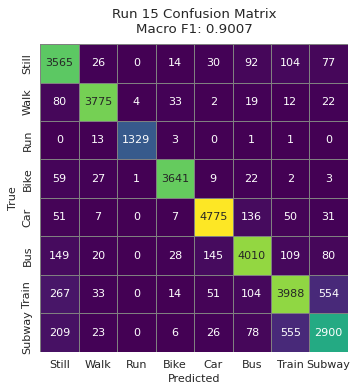


=== Run 16/30 — Params: {'subsample': 0.6, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 150, 'min_child_weight': 3, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9054

Classification Report:
              precision    recall  f1-score   support

       Still     0.8252    0.9110    0.8660      3908
        Walk     0.9665    0.9574    0.9619      3947
         Run     0.9963    0.9889    0.9925      1347
        Bike     0.9769    0.9652    0.9710      3764
         Car     0.9547    0.9498    0.9522      5057
         Bus     0.9099    0.8919    0.9008      4541
       Train     0.8236    0.8040    0.8137      5011
      Subway     0.7932    0.7767    0.7848      3797

    accuracy                         0.8968     31372
   macro avg     0.9058    0.9056    0.9054     31372
weighted avg     0.8975    0.8968    0.8969     31372



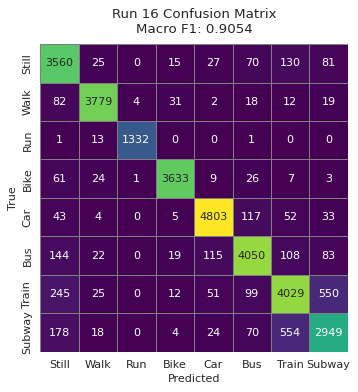


=== Run 17/30 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.9110

Classification Report:
              precision    recall  f1-score   support

       Still     0.8298    0.9168    0.8711      3908
        Walk     0.9668    0.9582    0.9625      3947
         Run     0.9963    0.9874    0.9918      1347
        Bike     0.9783    0.9684    0.9733      3764
         Car     0.9636    0.9529    0.9582      5057
         Bus     0.9150    0.9029    0.9089      4541
       Train     0.8355    0.8160    0.8256      5011
      Subway     0.8065    0.7869    0.7966      3797

    accuracy                         0.9032     31372
   macro avg     0.9115    0.9112    0.9110     31372
weighted avg     0.9040    0.9032    0.9033     31372



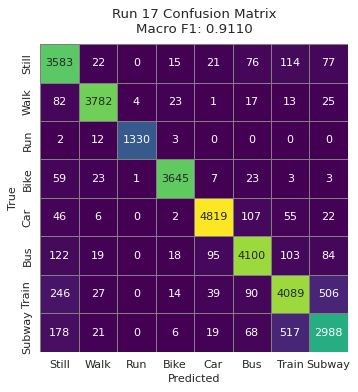


=== Run 18/30 — Params: {'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 150, 'min_child_weight': 7, 'max_depth': 7, 'learning_rate': 0.3, 'gamma': 0.3, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.9027

Classification Report:
              precision    recall  f1-score   support

       Still     0.8275    0.9012    0.8628      3908
        Walk     0.9636    0.9600    0.9618      3947
         Run     0.9963    0.9896    0.9929      1347
        Bike     0.9729    0.9644    0.9686      3764
         Car     0.9519    0.9462    0.9490      5057
         Bus     0.9024    0.8917    0.8970      4541
       Train     0.8188    0.8010    0.8098      5011
      Subway     0.7899    0.7696    0.7796      3797

    accuracy                         0.8939     31372
   macro avg     0.9029    0.9030    0.9027     31372
weighted avg     0.8943    0.8939    0.8939     31372



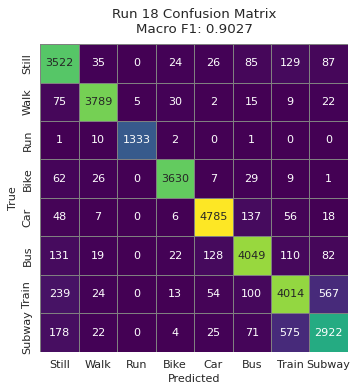


=== Run 19/30 — Params: {'subsample': 0.7, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9044

Classification Report:
              precision    recall  f1-score   support

       Still     0.8261    0.9071    0.8647      3908
        Walk     0.9662    0.9554    0.9608      3947
         Run     0.9970    0.9889    0.9929      1347
        Bike     0.9746    0.9681    0.9713      3764
         Car     0.9577    0.9480    0.9528      5057
         Bus     0.9089    0.8923    0.9005      4541
       Train     0.8230    0.8054    0.8141      5011
      Subway     0.7847    0.7719    0.7783      3797

    accuracy                         0.8959     31372
   macro avg     0.9048    0.9046    0.9044     31372
weighted avg     0.8966    0.8959    0.8959     31372



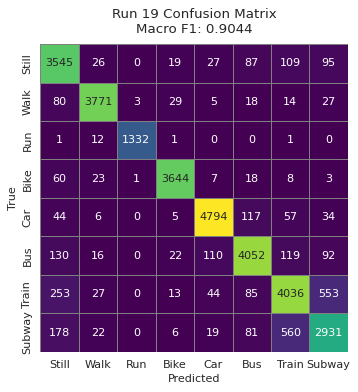


=== Run 20/30 — Params: {'subsample': 0.6, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9040

Classification Report:
              precision    recall  f1-score   support

       Still     0.8296    0.9084    0.8672      3908
        Walk     0.9656    0.9592    0.9624      3947
         Run     0.9963    0.9889    0.9925      1347
        Bike     0.9772    0.9663    0.9717      3764
         Car     0.9602    0.9500    0.9551      5057
         Bus     0.9093    0.8936    0.9014      4541
       Train     0.8172    0.8048    0.8110      5011
      Subway     0.7794    0.7619    0.7705      3797

    accuracy                         0.8955     31372
   macro avg     0.9043    0.9041    0.9040     31372
weighted avg     0.8961    0.8955    0.8955     31372



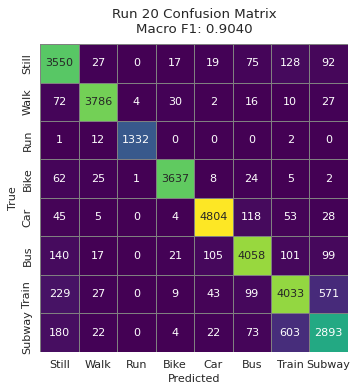


=== Run 21/30 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 150, 'min_child_weight': 7, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.8857

Classification Report:
              precision    recall  f1-score   support

       Still     0.7989    0.8984    0.8457      3908
        Walk     0.9575    0.9579    0.9577      3947
         Run     0.9970    0.9889    0.9929      1347
        Bike     0.9651    0.9623    0.9637      3764
         Car     0.9320    0.9296    0.9308      5057
         Bus     0.8794    0.8659    0.8726      4541
       Train     0.7988    0.7719    0.7851      5011
      Subway     0.7591    0.7161    0.7370      3797

    accuracy                         0.8755     31372
   macro avg     0.8860    0.8864    0.8857     31372
weighted avg     0.8756    0.8755    0.8750     31372



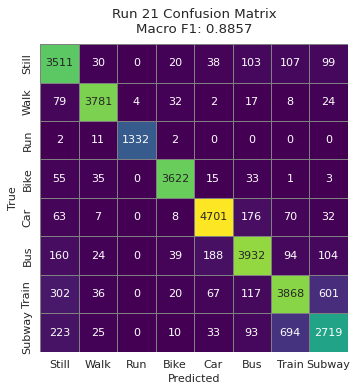


=== Run 22/30 — Params: {'subsample': 0.6, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9072

Classification Report:
              precision    recall  f1-score   support

       Still     0.8201    0.9214    0.8678      3908
        Walk     0.9671    0.9597    0.9634      3947
         Run     0.9978    0.9881    0.9929      1347
        Bike     0.9748    0.9671    0.9709      3764
         Car     0.9565    0.9519    0.9542      5057
         Bus     0.9111    0.8910    0.9009      4541
       Train     0.8311    0.8072    0.8190      5011
      Subway     0.8038    0.7738    0.7885      3797

    accuracy                         0.8990     31372
   macro avg     0.9078    0.9075    0.9072     31372
weighted avg     0.8997    0.8990    0.8989     31372



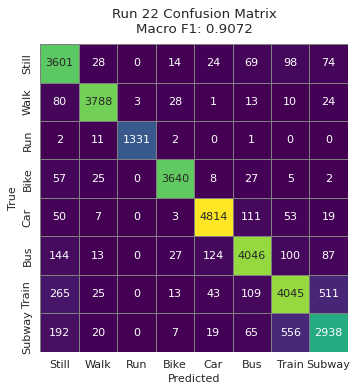


=== Run 23/30 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 200, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9114

Classification Report:
              precision    recall  f1-score   support

       Still     0.8333    0.9184    0.8738      3908
        Walk     0.9655    0.9577    0.9616      3947
         Run     0.9948    0.9889    0.9918      1347
        Bike     0.9734    0.9639    0.9686      3764
         Car     0.9629    0.9555    0.9592      5057
         Bus     0.9150    0.9029    0.9089      4541
       Train     0.8425    0.8146    0.8283      5011
      Subway     0.8053    0.7933    0.7993      3797

    accuracy                         0.9038     31372
   macro avg     0.9116    0.9119    0.9114     31372
weighted avg     0.9045    0.9038    0.9038     31372



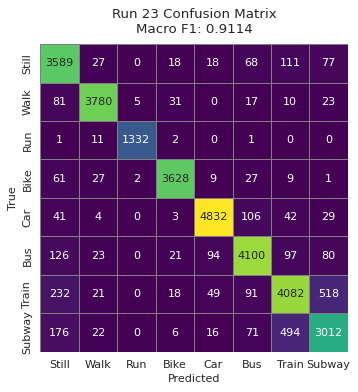


=== Run 24/30 — Params: {'subsample': 0.6, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9095

Classification Report:
              precision    recall  f1-score   support

       Still     0.8300    0.9158    0.8708      3908
        Walk     0.9654    0.9605    0.9629      3947
         Run     0.9970    0.9881    0.9925      1347
        Bike     0.9777    0.9671    0.9724      3764
         Car     0.9572    0.9514    0.9543      5057
         Bus     0.9159    0.8969    0.9063      4541
       Train     0.8366    0.8124    0.8243      5011
      Subway     0.7990    0.7861    0.7925      3797

    accuracy                         0.9015     31372
   macro avg     0.9099    0.9098    0.9095     31372
weighted avg     0.9022    0.9015    0.9015     31372



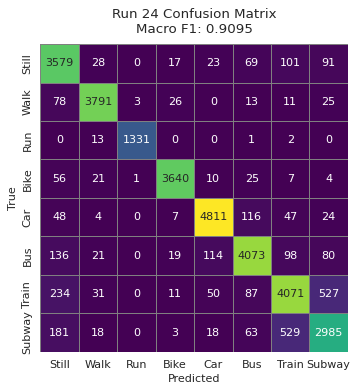


=== Run 25/30 — Params: {'subsample': 0.7, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 200, 'min_child_weight': 3, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9054

Classification Report:
              precision    recall  f1-score   support

       Still     0.8237    0.9158    0.8673      3908
        Walk     0.9695    0.9574    0.9634      3947
         Run     0.9970    0.9881    0.9925      1347
        Bike     0.9717    0.9663    0.9690      3764
         Car     0.9529    0.9490    0.9510      5057
         Bus     0.9110    0.8901    0.9004      4541
       Train     0.8238    0.8050    0.8143      5011
      Subway     0.7976    0.7732    0.7852      3797

    accuracy                         0.8969     31372
   macro avg     0.9059    0.9056    0.9054     31372
weighted avg     0.8976    0.8969    0.8969     31372



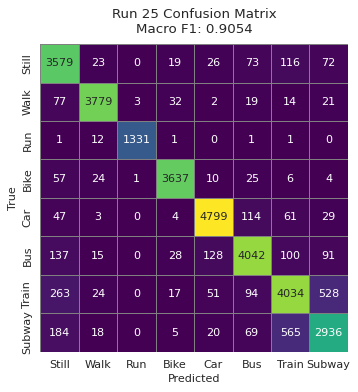


=== Run 26/30 — Params: {'subsample': 0.7, 'reg_lambda': 2, 'reg_alpha': 0.01, 'n_estimators': 150, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.5} ===
Macro-average F1 Score: 0.9055

Classification Report:
              precision    recall  f1-score   support

       Still     0.8258    0.9125    0.8670      3908
        Walk     0.9653    0.9582    0.9617      3947
         Run     0.9963    0.9881    0.9922      1347
        Bike     0.9717    0.9668    0.9692      3764
         Car     0.9561    0.9508    0.9534      5057
         Bus     0.9122    0.8943    0.9031      4541
       Train     0.8251    0.8032    0.8140      5011
      Subway     0.7938    0.7727    0.7831      3797

    accuracy                         0.8972     31372
   macro avg     0.9058    0.9058    0.9055     31372
weighted avg     0.8977    0.8972    0.8971     31372



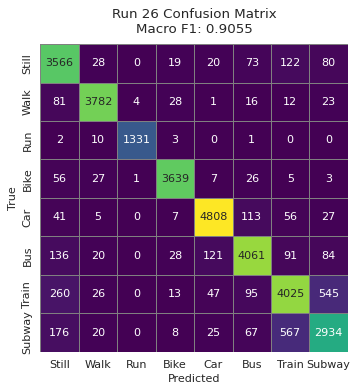


=== Run 27/30 — Params: {'subsample': 0.6, 'reg_lambda': 3, 'reg_alpha': 1, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.3, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9076

Classification Report:
              precision    recall  f1-score   support

       Still     0.8353    0.9122    0.8721      3908
        Walk     0.9609    0.9592    0.9601      3947
         Run     0.9963    0.9881    0.9922      1347
        Bike     0.9727    0.9657    0.9692      3764
         Car     0.9555    0.9502    0.9528      5057
         Bus     0.9062    0.8961    0.9011      4541
       Train     0.8348    0.8126    0.8235      5011
      Subway     0.8010    0.7793    0.7900      3797

    accuracy                         0.8996     31372
   macro avg     0.9078    0.9079    0.9076     31372
weighted avg     0.8999    0.8996    0.8995     31372



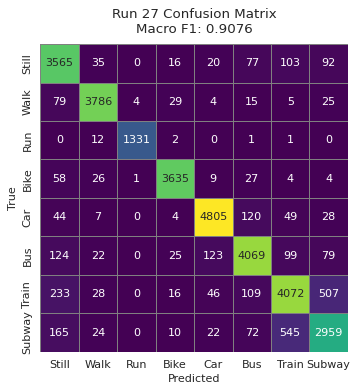


=== Run 28/30 — Params: {'subsample': 0.7, 'reg_lambda': 3, 'reg_alpha': 0, 'n_estimators': 200, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.3, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9095

Classification Report:
              precision    recall  f1-score   support

       Still     0.8305    0.9138    0.8701      3908
        Walk     0.9656    0.9587    0.9621      3947
         Run     0.9978    0.9881    0.9929      1347
        Bike     0.9711    0.9649    0.9680      3764
         Car     0.9575    0.9525    0.9550      5057
         Bus     0.9123    0.8980    0.9051      4541
       Train     0.8381    0.8182    0.8280      5011
      Subway     0.8068    0.7832    0.7949      3797

    accuracy                         0.9017     31372
   macro avg     0.9099    0.9097    0.9095     31372
weighted avg     0.9022    0.9017    0.9016     31372



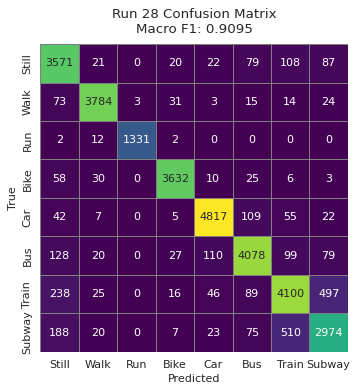


=== Run 29/30 — Params: {'subsample': 1.0, 'reg_lambda': 3, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 3, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9003

Classification Report:
              precision    recall  f1-score   support

       Still     0.8144    0.9117    0.8603      3908
        Walk     0.9618    0.9574    0.9596      3947
         Run     0.9977    0.9874    0.9925      1347
        Bike     0.9709    0.9671    0.9690      3764
         Car     0.9447    0.9460    0.9454      5057
         Bus     0.9000    0.8835    0.8917      4541
       Train     0.8270    0.7984    0.8125      5011
      Subway     0.7896    0.7540    0.7714      3797

    accuracy                         0.8916     31372
   macro avg     0.9008    0.9007    0.9003     31372
weighted avg     0.8920    0.8916    0.8914     31372



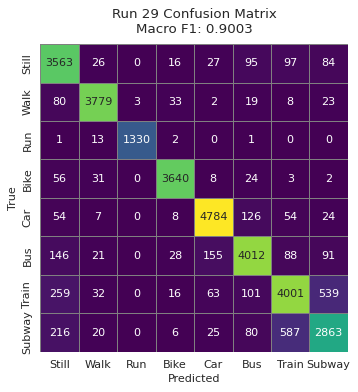


=== Run 30/30 — Params: {'subsample': 0.6, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 200, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.7} ===
Macro-average F1 Score: 0.9075

Classification Report:
              precision    recall  f1-score   support

       Still     0.8283    0.9135    0.8688      3908
        Walk     0.9655    0.9579    0.9617      3947
         Run     0.9963    0.9896    0.9929      1347
        Bike     0.9771    0.9644    0.9707      3764
         Car     0.9617    0.9492    0.9554      5057
         Bus     0.9092    0.8978    0.9035      4541
       Train     0.8309    0.8068    0.8187      5011
      Subway     0.7932    0.7838    0.7884      3797

    accuracy                         0.8992     31372
   macro avg     0.9078    0.9079    0.9075     31372
weighted avg     0.9000    0.8992    0.8993     31372



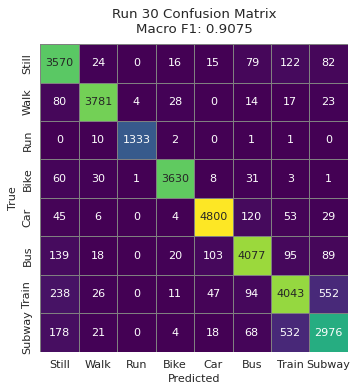


Best hyperparameters (by macro F1):
{'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 200, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 1.0}
Best test-set macro F1: 0.9114


In [12]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 30   # ← set this to however many runs you want
'''
# === 1. Sample your data (20% for speed) ===
df_sample = df_wide.sample(frac=0.2, random_state=42).reset_index(drop=True)
print("Sampled shape (20%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1
'''
# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [150, 200, 250],           # number of boosting rounds 
    "max_depth":        [7, 9, 10],                  # tree complexity
    "learning_rate":    [0.1, 0.2, 0.3, 0.4],       # shrinkage factor
    "subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],          # row sampling
    "colsample_bytree": [0.5, 0.7, 0.8, 1.0],               # feature sampling
    "gamma":            [0, 0.1, 0.2, 0.3, 0.5],            # min loss reduction
    "min_child_weight": [1, 3, 5, 7],                      # minimum leaf instance
    "reg_alpha":        [0, 0.01, 0.1, 1],                  # L1 regularization
    "reg_lambda":       [1, 1.5, 2, 3]                      # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1    = -1.0
best_model = None
best_params= None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# After loop
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)


In [ ]:
#Here are more samples 40% with best from above

Sampled shape (40%): (313715, 3850)
Mode distribution in sample:
 mode
5.0    50750
7.0    49890
6.0    45449
2.0    39362
1.0    39226
8.0    38046
4.0    37644
3.0    13348
Name: count, dtype: int64
Train size: (250972, 3848) | Test size: (62743, 3848)

=== Run 1/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9243

Classification Report:
              precision    recall  f1-score   support

       Still     0.8507    0.9262    0.8869      7845
        Walk     0.9715    0.9560    0.9637      7872
         Run     0.9989    0.9899    0.9944      2670
        Bike     0.9828    0.9705    0.9766      7529
         Car     0.9661    0.9676    0.9668     10150
         Bus     0.9286    0.9182    0.9233      9090
       Train     0.8621    0.8489    0.8554      9978
      Subway     0.8391    0.8155    0.8271      7609



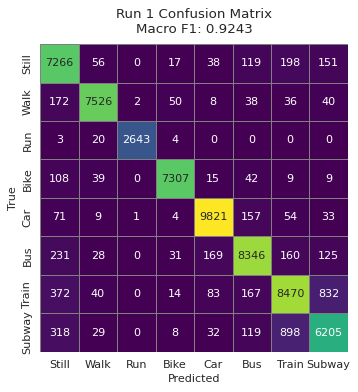


=== Run 2/5 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9221

Classification Report:
              precision    recall  f1-score   support

       Still     0.8487    0.9284    0.8868      7845
        Walk     0.9717    0.9567    0.9642      7872
         Run     0.9981    0.9891    0.9936      2670
        Bike     0.9833    0.9691    0.9761      7529
         Car     0.9635    0.9649    0.9642     10150
         Bus     0.9234    0.9169    0.9202      9090
       Train     0.8587    0.8412    0.8498      9978
      Subway     0.8348    0.8098    0.8221      7609

    accuracy                         0.9154     62743
   macro avg     0.9228    0.9220    0.9221     62743
weighted avg     0.9160    0.9154    0.9154     62743



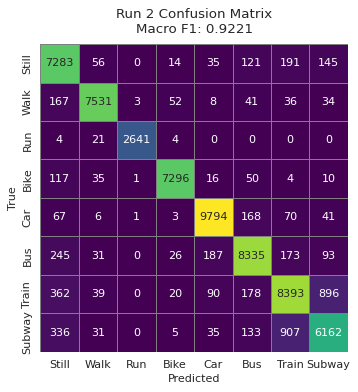


=== Run 3/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9242

Classification Report:
              precision    recall  f1-score   support

       Still     0.8528    0.9276    0.8886      7845
        Walk     0.9692    0.9581    0.9636      7872
         Run     0.9989    0.9888    0.9938      2670
        Bike     0.9820    0.9696    0.9757      7529
         Car     0.9651    0.9688    0.9669     10150
         Bus     0.9283    0.9165    0.9224      9090
       Train     0.8634    0.8506    0.8569      9978
      Subway     0.8396    0.8119    0.8255      7609

    accuracy                         0.9178     62743
   macro avg     0.9249    0.9240    0.9242     62743
weighted avg     0.9183    0.9178    0.9178     62743



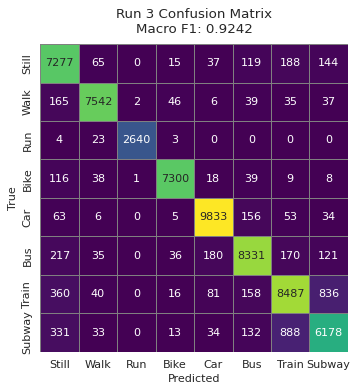


=== Run 4/5 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9252

Classification Report:
              precision    recall  f1-score   support

       Still     0.8516    0.9275    0.8879      7845
        Walk     0.9705    0.9562    0.9633      7872
         Run     0.9985    0.9884    0.9934      2670
        Bike     0.9829    0.9709    0.9769      7529
         Car     0.9669    0.9677    0.9673     10150
         Bus     0.9279    0.9202    0.9241      9090
       Train     0.8647    0.8550    0.8598      9978
      Subway     0.8453    0.8136    0.8292      7609

    accuracy                         0.9190     62743
   macro avg     0.9260    0.9249    0.9252     62743
weighted avg     0.9195    0.9190    0.9190     62743



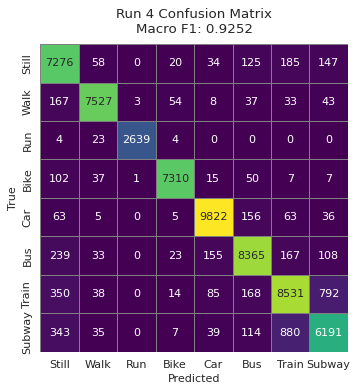


=== Run 5/5 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9247

Classification Report:
              precision    recall  f1-score   support

       Still     0.8544    0.9308    0.8910      7845
        Walk     0.9729    0.9559    0.9643      7872
         Run     0.9985    0.9891    0.9938      2670
        Bike     0.9841    0.9710    0.9775      7529
         Car     0.9660    0.9667    0.9664     10150
         Bus     0.9246    0.9165    0.9206      9090
       Train     0.8630    0.8506    0.8568      9978
      Subway     0.8399    0.8154    0.8274      7609

    accuracy                         0.9182     62743
   macro avg     0.9254    0.9245    0.9247     62743
weighted avg     0.9188    0.9182    0.9183     62743



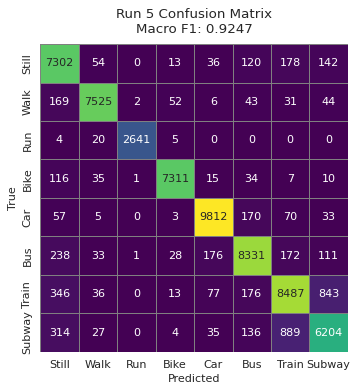


Best hyperparameters (by macro F1):
{'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8}
Best test-set macro F1: 0.9252


In [13]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 5   # ← set this to however many runs you want

# === 1. Sample your data (40% for speed) ===
df_sample = df_wide.sample(frac=0.4, random_state=42).reset_index(drop=True)
print("Sampled shape (40%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [250],           # number of boosting rounds 
    "max_depth":        [9, 10],                  # tree complexity
    "learning_rate":    [0.2, 0.3, 0.4],       # shrinkage factor
    "subsample":        [0.8, 0.9, 1.0],          # row sampling
    "colsample_bytree": [0.8, 1.0],               # feature sampling
    "gamma":            [0.1, 0.2],            # min loss reduction
    "min_child_weight": [5, 7],                      # minimum leaf instance
    "reg_alpha":        [0.01, 0.1],                  # L1 regularization
    "reg_lambda":       [1, 1.5]                      # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1    = -1.0
best_model = None
best_params= None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# After loop
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)


Sampled shape (80%): (627430, 3850)
Mode distribution in sample:
 mode
5.0    101594
7.0    100147
6.0     90659
2.0     78589
1.0     78279
8.0     76014
4.0     75190
3.0     26958
Name: count, dtype: int64
Train size: (501944, 3848) | Test size: (125486, 3848)

=== Run 1/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9358

Classification Report:
              precision    recall  f1-score   support

       Still     0.8716    0.9377    0.9035     15656
        Walk     0.9753    0.9623    0.9687     15718
         Run     0.9987    0.9915    0.9951      5391
        Bike     0.9857    0.9732    0.9794     15038
         Car     0.9749    0.9706    0.9727     20319
         Bus     0.9437    0.9344    0.9390     18132
       Train     0.8782    0.8706    0.8744     20029
      Subway     0.8626    0.8452    0.8538   

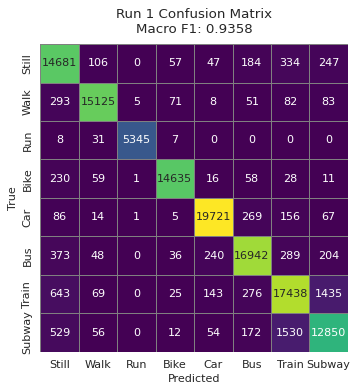


=== Run 2/5 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9331

Classification Report:
              precision    recall  f1-score   support

       Still     0.8634    0.9379    0.8991     15656
        Walk     0.9739    0.9620    0.9679     15718
         Run     0.9993    0.9911    0.9952      5391
        Bike     0.9856    0.9714    0.9785     15038
         Car     0.9739    0.9716    0.9727     20319
         Bus     0.9391    0.9298    0.9344     18132
       Train     0.8748    0.8664    0.8706     20029
      Subway     0.8602    0.8331    0.8464     15203

    accuracy                         0.9274    125486
   macro avg     0.9338    0.9329    0.9331    125486
weighted avg     0.9280    0.9274    0.9274    125486



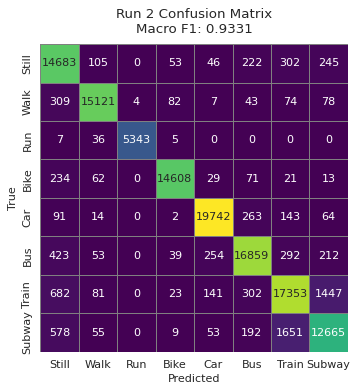


=== Run 3/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9358

Classification Report:
              precision    recall  f1-score   support

       Still     0.8728    0.9374    0.9039     15656
        Walk     0.9727    0.9639    0.9683     15718
         Run     0.9987    0.9907    0.9947      5391
        Bike     0.9841    0.9725    0.9783     15038
         Car     0.9737    0.9738    0.9737     20319
         Bus     0.9430    0.9327    0.9378     18132
       Train     0.8794    0.8710    0.8752     20029
      Subway     0.8667    0.8435    0.8549     15203

    accuracy                         0.9304    125486
   macro avg     0.9364    0.9357    0.9358    125486
weighted avg     0.9309    0.9304    0.9305    125486



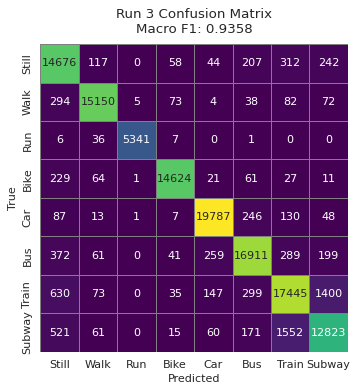


=== Run 4/5 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9361

Classification Report:
              precision    recall  f1-score   support

       Still     0.8727    0.9377    0.9040     15656
        Walk     0.9755    0.9635    0.9694     15718
         Run     0.9989    0.9913    0.9951      5391
        Bike     0.9864    0.9721    0.9792     15038
         Car     0.9752    0.9729    0.9741     20319
         Bus     0.9434    0.9334    0.9384     18132
       Train     0.8776    0.8726    0.8751     20029
      Subway     0.8640    0.8435    0.8536     15203

    accuracy                         0.9306    125486
   macro avg     0.9367    0.9359    0.9361    125486
weighted avg     0.9312    0.9306    0.9307    125486



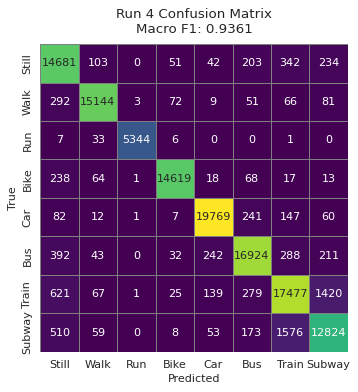


=== Run 5/5 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9359

Classification Report:
              precision    recall  f1-score   support

       Still     0.8684    0.9404    0.9030     15656
        Walk     0.9763    0.9633    0.9697     15718
         Run     0.9985    0.9917    0.9951      5391
        Bike     0.9860    0.9727    0.9793     15038
         Car     0.9749    0.9737    0.9743     20319
         Bus     0.9426    0.9313    0.9369     18132
       Train     0.8778    0.8724    0.8751     20029
      Subway     0.8678    0.8402    0.8538     15203

    accuracy                         0.9304    125486
   macro avg     0.9365    0.9357    0.9359    125486
weighted avg     0.9310    0.9304    0.9305    125486



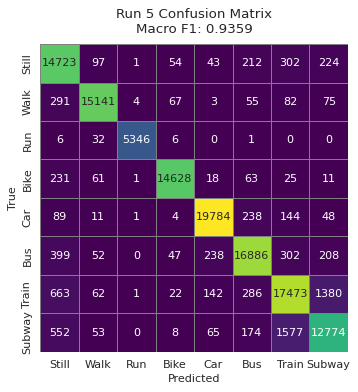


Best hyperparameters (by macro F1):
{'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8}
Best test-set macro F1: 0.9361


In [14]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 5   # ← set this to however many runs you want

# === 1. Sample your data (80% for speed) ===
df_sample = df_wide.sample(frac=0.8, random_state=42).reset_index(drop=True)
print("Sampled shape (80%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [250],           # number of boosting rounds 
    "max_depth":        [9, 10],                  # tree complexity
    "learning_rate":    [0.2, 0.3, 0.4],       # shrinkage factor
    "subsample":        [0.8, 0.9, 1.0],          # row sampling
    "colsample_bytree": [0.8, 1.0],               # feature sampling
    "gamma":            [0.1, 0.2],            # min loss reduction
    "min_child_weight": [5, 7],                      # minimum leaf instance
    "reg_alpha":        [0.01, 0.1],                  # L1 regularization
    "reg_lambda":       [1, 1.5]                      # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1    = -1.0
best_model = None
best_params= None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# After loop
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)


In [11]:
gc.collect()
del model, y_pred

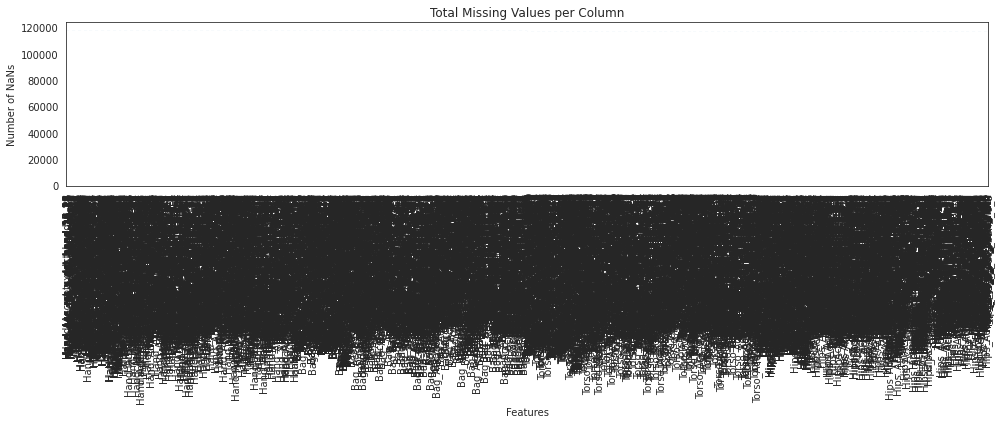

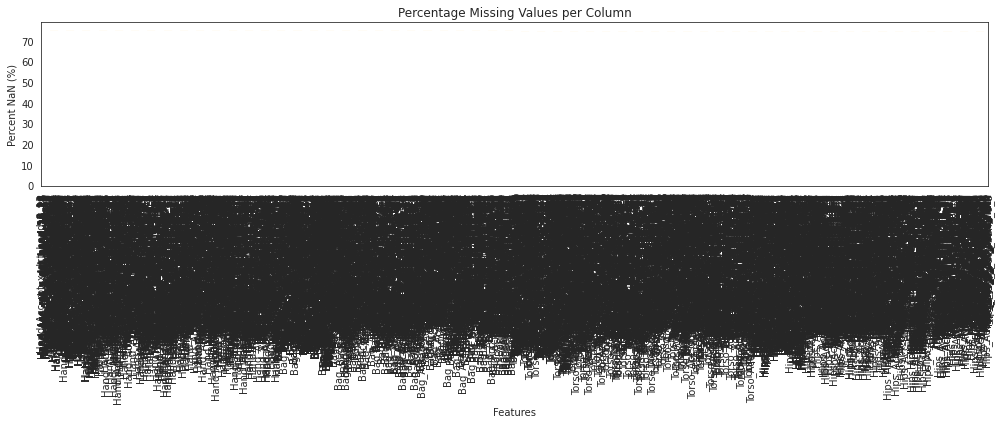

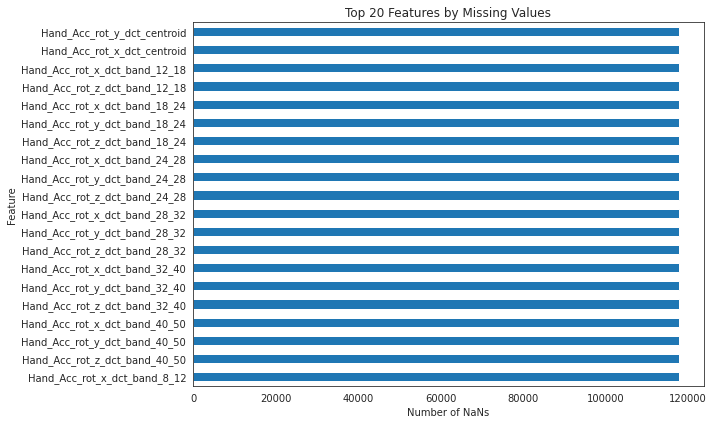

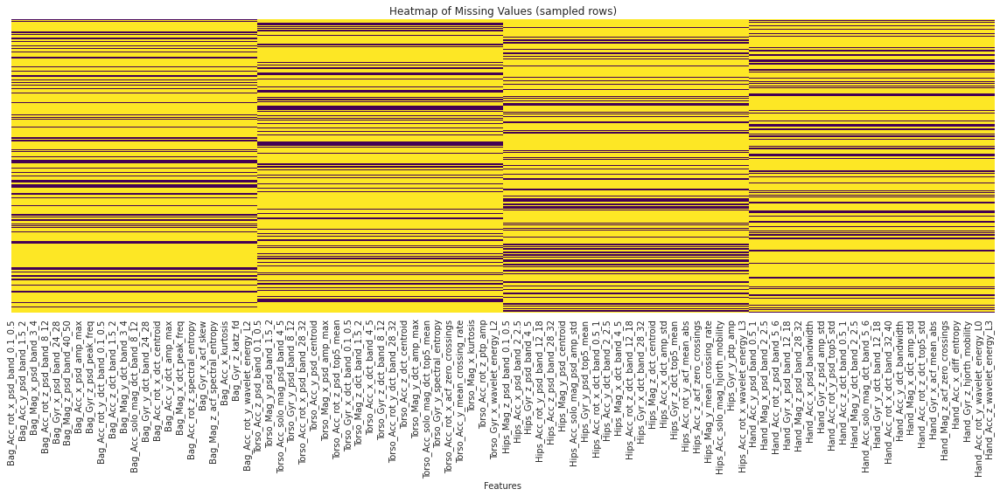

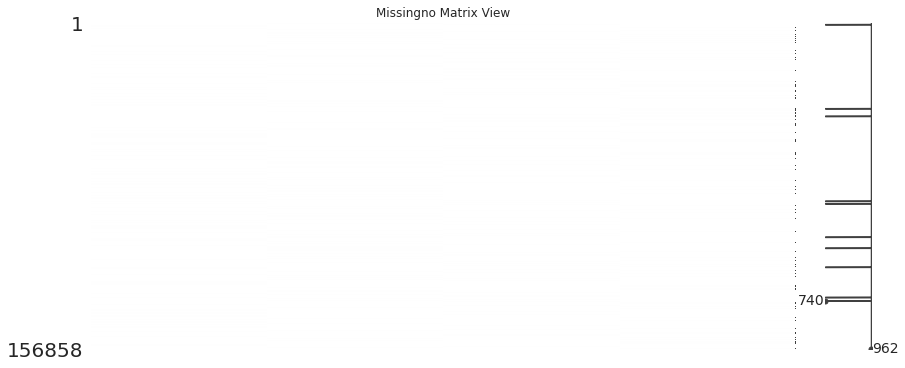

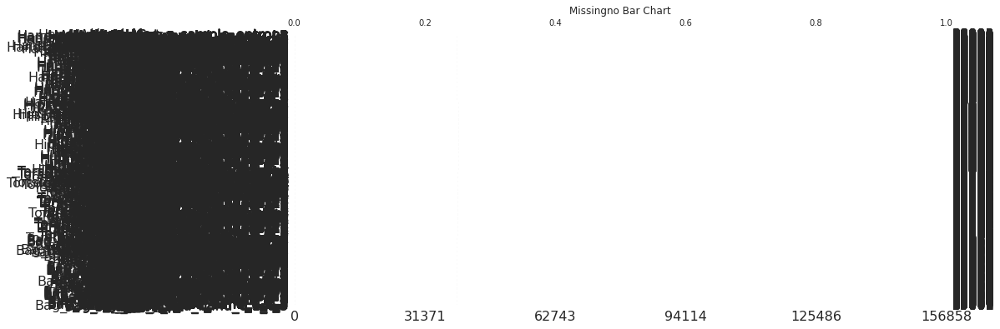

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# -- assume X is your DataFrame
# X = pd.read_csv("your_data.csv")

# 1. BAR CHARTS OF MISSING COUNTS & PERCENTAGES -----------------------------

# Count and percentage of missing values per column
missing_count = X.isna().sum()
missing_pct   = 100 * missing_count / len(X)
missing_df    = pd.DataFrame({
    'n_missing': missing_count,
    'pct_missing': missing_pct
}).sort_values('n_missing', ascending=False)

# Plot total missing per column
plt.figure(figsize=(14, 6))
missing_df['n_missing'].plot.bar()
plt.title("Total Missing Values per Column")
plt.ylabel("Number of NaNs")
plt.xlabel("Features")
plt.tight_layout()
plt.show()

# Plot percentage missing per column
plt.figure(figsize=(14, 6))
missing_df['pct_missing'].plot.bar(color='orange')
plt.title("Percentage Missing Values per Column")
plt.ylabel("Percent NaN (%)")
plt.xlabel("Features")
plt.tight_layout()
plt.show()


# 2. TOP-N HORIZONTAL BAR CHART ----------------------------------------------

# Show only top 20 features by missing count
top_n = 20
plt.figure(figsize=(10, 6))
missing_df['n_missing'].head(top_n).sort_values().plot.barh()
plt.title(f"Top {top_n} Features by Missing Values")
plt.xlabel("Number of NaNs")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


# 3. SEABORN HEATMAP OF MISSING MASK (SAMPLED ROWS) --------------------------

# Sample rows for clarity
sample_frac = 5000 / len(X)
sample_df   = X.sample(frac=sample_frac if sample_frac < 1 else 1.0,
                       random_state=42)

plt.figure(figsize=(16, 8))
sns.heatmap(sample_df.isna(),
            cbar=False,
            yticklabels=False,
            cmap="viridis")
plt.title("Heatmap of Missing Values (sampled rows)")
plt.xlabel("Features")
plt.tight_layout()
plt.show()


# 4. MISSINGNO DIAGNOSTICS --------------------------------------------------

# 4.1. Matrix: nullity sparkline + summary bars
msno.matrix(X, figsize=(14, 6), sparkline=True)
plt.title("Missingno Matrix View")
plt.show()

# 4.2. Bar: count of non-missing values
msno.bar(X, figsize=(14, 6))
plt.title("Missingno Bar Chart")
plt.show()

# 4.3. Heatmap: correlation of missingness
msno.heatmap(X, figsize=(10, 8))
plt.title("Missingno Heatmap (Nullity Correlation)")
plt.show()

# 4.4. Dendrogram: hierarchical clustering of features by missingness
msno.dendrogram(X, figsize=(12, 8))
plt.title("Missingno Dendrogram (Cluster Missing Patterns)")
plt.show()


# 5. PAIRWISE MISSINGNESS CORRELATION HEATMAP -------------------------------

# Compute pairwise correlation of isna() booleans
isna_corr = X.isna().corr()

plt.figure(figsize=(12, 10))
sns.clustermap(isna_corr,
               cmap="mako",
               figsize=(12, 12),
               cbar_kws={'label': 'Missingness Corr.'})
plt.suptitle("Clustered Heatmap of Missingness Correlation", y=1.02)
plt.show()


# 6. CUSTOM CLUSTERMAP ON SUBSET ------------------------------------------------

# You may want to focus on the top-K most missing features
top_feats = missing_df['n_missing'].head(50).index
subset    = X[top_feats].isna()

sns.clustermap(subset,
               figsize=(12, 12),
               metric="jaccard",
               method="average",
               cbar_pos=(0.02, 0.8, 0.05, 0.18))
plt.suptitle("Clustermap of Top 50 Features by Missing Patterns", y=1.02)
plt.show()


In [ ]:
print("d")

In [ ]:
#Train and validation datasets

import complete
Found 52 feature files in /net/tscratch/people/plgdusza/Sussex Dataset/features/train/*
Found 52 feature files in /net/tscratch/people/plgdusza/Sussex Dataset/features/validation/*
Total feature files: 104


Loading feature CSVs:   0%|          | 0/104 [00:00<?, ?file/s]

Read file number 1
Read file number 2
Read file number 3
Read file number 4
Read file number 5
Read file number 6
Read file number 7
Read file number 8
Read file number 9
Read file number 10
Read file number 11
Read file number 12
Read file number 13
Read file number 14
Read file number 15
Read file number 16
Read file number 17
Read file number 18
Read file number 19
Read file number 20
Read file number 21
Read file number 22
Read file number 23
Read file number 24
Read file number 25
Read file number 26
Read file number 27
Read file number 28
Read file number 29
Read file number 30
Read file number 31
Read file number 32
Read file number 33
Read file number 34
Read file number 35
Read file number 36
Read file number 37
Read file number 38
Read file number 39
Read file number 40
Read file number 41
Read file number 42
Read file number 43
Read file number 44
Read file number 45
Read file number 46
Read file number 47
Read file number 48
Read file number 49
Read file number 50
Read file

/net/people/plgrid/plgdusza/.local/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [14:37:21] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



=== XGBoost: Classification Report ===
              precision    recall  f1-score   support

           0     0.7863    0.7480    0.7667       123
           1     0.8919    0.9000    0.8959       110
           2     1.0000    0.8333    0.9091        30
           3     0.9298    0.9725    0.9507       109
           4     0.8165    0.8658    0.8404       149
           5     0.7544    0.7049    0.7288       122
           6     0.6323    0.6806    0.6555       144
           7     0.6226    0.5841    0.6027       113

    accuracy                         0.7789       900
   macro avg     0.8042    0.7861    0.7937       900
weighted avg     0.7792    0.7789    0.7782       900



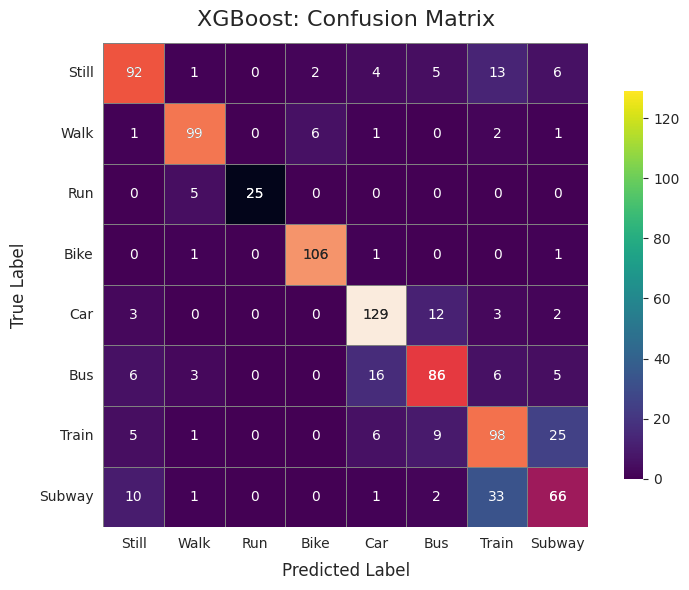


Top 10 Features – XGBoost:
                                    feature  importance
0                  Hips_train_Mag_x_acf_std    0.023069
1         Bag_train_Acc_x_wavelet_energy_L2    0.014523
2              Bag_train_Acc_x_psd_band_4_5    0.010703
3             Hand_train_Mag_z_diff_entropy    0.009381
4             Hips_validation_Mag_z_ptp_amp    0.008530
5            Hips_train_Acc_y_acf_prom_freq    0.008327
6      Hand_validation_Mag_x_psd_band_24_28    0.008069
7  Bag_train_Acc_solo_mag_wavelet_energy_L2    0.006392
8           Hand_train_Acc_solo_mag_acf_std    0.005813
9       Hips_train_Acc_z_mean_crossing_rate    0.005503


/net/tscratch/people/plgdusza/slurm_jobdir/1479949/tmp.t0025/ipykernel_902170/2562970965.py:153: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')


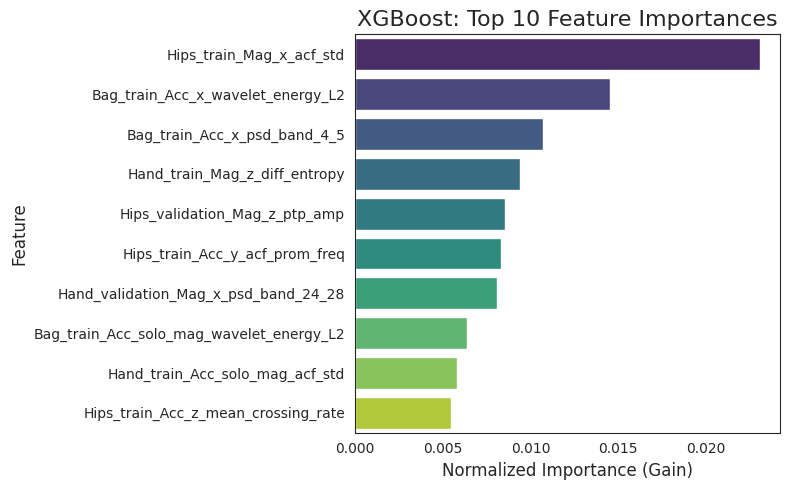

In [2]:
# Cell 1: Imports
import os
import glob
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# Machine Learning Imports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb

# Plotting Imports
import matplotlib.pyplot as plt
import seaborn as sns

print("import complete")

# === Settings ===
DATA_ROOTS    = [
    '/net/tscratch/people/plgdusza/Sussex Dataset/features/train',
    '/net/tscratch/people/plgdusza/Sussex Dataset/features/validation',
]
glob_patterns = [os.path.join(root, '*', '*.csv') for root in DATA_ROOTS]

# === 1. Load + Concatenate All Feature CSVs ===
all_files = []
for pattern in glob_patterns:
    matched = glob.glob(pattern)
    print(f"Found {len(matched)} feature files in {os.path.dirname(pattern)}")
    all_files.extend(matched)
print(f"Total feature files: {len(all_files)}")

dfs = []
number_file = 0
for fp in tqdm(all_files, desc='Loading feature CSVs', unit='file'):
    df = pd.read_csv(fp)
    # ─── TAG “location” WITH split (train vs. validation) ───
    split_name = os.path.basename(os.path.dirname(os.path.dirname(fp)))
    # e.g. 'train' or 'validation'
    df['location'] = df['location'] + '_' + split_name
    dfs.append(df)
    number_file += 1
    print("Read file number", number_file)

df_all = pd.concat(dfs, ignore_index=True)
df_all = df_all.sample(frac=1, random_state=42).reset_index(drop=True)
print("Combined long shape:", df_all.shape)
print("Mode distribution:\n", df_all['mode'].value_counts())

# === 2. Pivot to Wide: one row per (location, window_id) with sensors side by side ===
wide_frames = []
number_folder = 0
for loc in df_all['location'].unique():
    df_loc = df_all[df_all['location'] == loc]
    # mode per window
    mode_map = df_loc[['window_id','mode']].drop_duplicates().set_index('window_id')['mode']
    # pivot so each sensor_axis’s features become their own block of columns
    df_p = (
        df_loc
        .drop(columns=['location','mode'])
        .set_index(['window_id','sensor_axis'])
        .unstack('sensor_axis')
    )
    # flatten columns: e.g. ('mean','Acc_x') → 'Bag_train_Acc_x_mean'
    df_p.columns = [
        f"{loc}_{sensor}_{feat}"
        for feat, sensor in df_p.columns
    ]
    df_p = df_p.reset_index()
    df_p['mode'] = df_p['window_id'].map(mode_map)
    wide_frames.append(df_p)
    number_folder += 1
    print("Combined df folder number", number_folder)
    
df_wide = pd.concat(wide_frames, ignore_index=True)
print("Wide shape (rows=windows, cols=sensors×features + window_id + mode):", df_wide.shape)
print("Mode distribution:\n", df_wide['mode'].value_counts())

# === 3. Take a 5% Random Sample (for speed) ===
df_sample = df_wide.sample(frac=0.005, random_state=42).reset_index(drop=True)
print("Sampled shape (5%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 4. Prepare X and y ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 5. Train/Test Split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Training size:", X_train.shape, "| Testing size:", X_test.shape)

# Plotting style
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 6. XGBoost ===
# XGBoost needs 0–7 labels rather than 1–8
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

xgb_model = xgb.XGBClassifier(
    booster='gbtree',
    n_estimators=80,
    max_depth=8,
    learning_rate=0.3,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
print("\nTraining XGBoost …")
xgb_model.fit(X_train, y_train_enc)

# === 7. XGBoost Evaluation ===
y_pred_xgb_enc = xgb_model.predict(X_test)
print("\n=== XGBoost: Classification Report ===")
print(classification_report(y_test_enc, y_pred_xgb_enc, digits=4))

cm = confusion_matrix(y_test_enc, y_pred_xgb_enc)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

fig, ax = plt.subplots(figsize=(8,6), dpi=100)
sns.heatmap(cm_df, annot=True, fmt="d", cmap=cmap_choice, linewidths=0.5,
            linecolor="gray", square=True, cbar_kws={"shrink":0.8}, ax=ax)
mask = np.ones_like(cm_df, dtype=bool)
np.fill_diagonal(mask, False)
sns.heatmap(cm_df, mask=mask, annot=True, fmt="d", linewidths=0.5,
            linecolor="gray", square=True, cbar=False, ax=ax)
ax.set_title("XGBoost: Confusion Matrix", fontsize=16, pad=12)
ax.set_xlabel("Predicted Label", fontsize=12, labelpad=8)
ax.set_ylabel("True Label", fontsize=12, labelpad=8)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

# === 8. XGBoost Feature Importances ===
imp = xgb_model.feature_importances_
feat_names = X_train.columns.tolist()
imp_df = pd.DataFrame({'feature':feat_names, 'importance':imp})\
            .sort_values('importance', ascending=False).reset_index(drop=True)

print("\nTop 10 Features – XGBoost:")
print(imp_df.head(10))

plt.figure(figsize=(8,5), dpi=100)
sns.barplot(data=imp_df.head(10), x='importance', y='feature', palette='viridis')
plt.title("XGBoost: Top 10 Feature Importances", fontsize=16)
plt.xlabel("Normalized Importance (Gain)", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()

replaced inf
dropped nan columns
Sampled shape (80%): (719555, 7698)
Mode distribution in sample:
 mode
5.0    114681
7.0    114064
1.0     97420
6.0     96492
2.0     95286
8.0     89959
4.0     82929
3.0     28724
Name: count, dtype: int64
Train size: (575644, 7696) | Test size: (143911, 7696)

=== Run 1/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9344

Classification Report:
              precision    recall  f1-score   support

       Still     0.8754    0.9375    0.9054     19484
        Walk     0.9665    0.9593    0.9629     19057
         Run     0.9974    0.9890    0.9932      5745
        Bike     0.9843    0.9689    0.9766     16586
         Car     0.9732    0.9717    0.9725     22936
         Bus     0.9361    0.9270    0.9316     19298
       Train     0.8795    0.8694    0.8744     22813
      Subway 

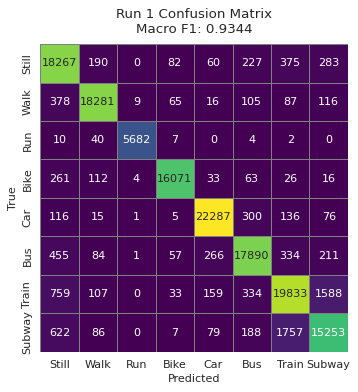


=== Run 2/5 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9305

Classification Report:
              precision    recall  f1-score   support

       Still     0.8681    0.9368    0.9012     19484
        Walk     0.9648    0.9587    0.9617     19057
         Run     0.9974    0.9892    0.9933      5745
        Bike     0.9821    0.9667    0.9743     16586
         Car     0.9673    0.9694    0.9684     22936
         Bus     0.9301    0.9211    0.9256     19298
       Train     0.8782    0.8565    0.8672     22813
      Subway     0.8627    0.8429    0.8527     17992

    accuracy                         0.9239    143911
   macro avg     0.9313    0.9302    0.9305    143911
weighted avg     0.9243    0.9239    0.9238    143911



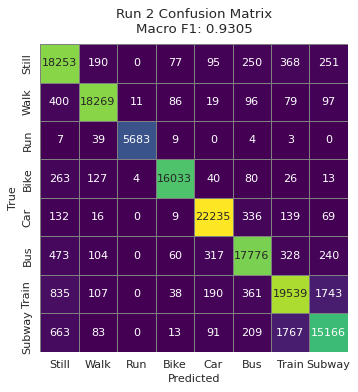


=== Run 3/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9356

Classification Report:
              precision    recall  f1-score   support

       Still     0.8756    0.9368    0.9051     19484
        Walk     0.9662    0.9585    0.9623     19057
         Run     0.9972    0.9889    0.9930      5745
        Bike     0.9837    0.9694    0.9765     16586
         Car     0.9728    0.9734    0.9731     22936
         Bus     0.9385    0.9303    0.9344     19298
       Train     0.8837    0.8707    0.8771     22813
      Subway     0.8737    0.8528    0.8631     17992

    accuracy                         0.9295    143911
   macro avg     0.9364    0.9351    0.9356    143911
weighted avg     0.9299    0.9295    0.9295    143911



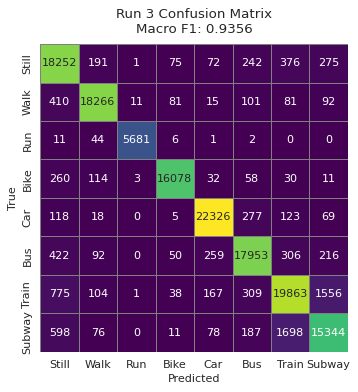


=== Run 4/5 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9354

Classification Report:
              precision    recall  f1-score   support

       Still     0.8781    0.9383    0.9072     19484
        Walk     0.9665    0.9592    0.9628     19057
         Run     0.9968    0.9887    0.9927      5745
        Bike     0.9835    0.9685    0.9759     16586
         Car     0.9734    0.9731    0.9733     22936
         Bus     0.9379    0.9276    0.9327     19298
       Train     0.8837    0.8699    0.8767     22813
      Subway     0.8696    0.8544    0.8620     17992

    accuracy                         0.9293    143911
   macro avg     0.9362    0.9350    0.9354    143911
weighted avg     0.9297    0.9293    0.9294    143911



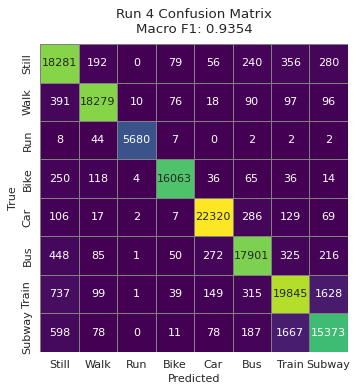


=== Run 5/5 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9350

Classification Report:
              precision    recall  f1-score   support

       Still     0.8760    0.9391    0.9065     19484
        Walk     0.9662    0.9599    0.9630     19057
         Run     0.9965    0.9883    0.9924      5745
        Bike     0.9837    0.9676    0.9756     16586
         Car     0.9704    0.9727    0.9716     22936
         Bus     0.9364    0.9249    0.9306     19298
       Train     0.8837    0.8714    0.8775     22813
      Subway     0.8739    0.8516    0.8626     17992

    accuracy                         0.9289    143911
   macro avg     0.9359    0.9344    0.9350    143911
weighted avg     0.9293    0.9289    0.9289    143911



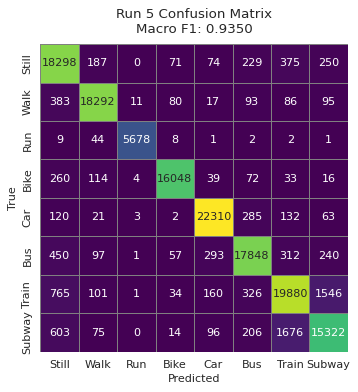


Best hyperparameters (by macro F1):
{'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8}
Best test-set macro F1: 0.9356


In [3]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 5   # ← set this to however many runs you want

# === 0.b CLEAN-UP df_wide: replace infinities & clip outliers ===
# (run this *after* you’ve built df_wide and before sampling)
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
print("replaced inf")
# drop any columns that ended up entirely NaN
df_wide.dropna(axis=1, how='all', inplace=True)
print("dropped nan columns")
'''
# fill remaining NaNs with column medians
medians = df_wide.median()
df_wide.fillna(medians, inplace=True)
'''
# === 1. Sample your data (80% for speed) ===
df_sample = df_wide.sample(frac=0.8, random_state=42).reset_index(drop=True)
print("Sampled shape (80%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
X = df_sample.drop(columns=['window_id','mode'])
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [250],           # number of boosting rounds 
    "max_depth":        [9, 10],         # tree complexity
    "learning_rate":    [0.2, 0.3, 0.4], # shrinkage factor
    "subsample":        [0.8, 0.9, 1.0], # row sampling
    "colsample_bytree": [0.8, 1.0],      # feature sampling
    "gamma":            [0.1, 0.2],      # min loss reduction
    "min_child_weight": [5, 7],          # minimum leaf instance
    "reg_alpha":        [0.01, 0.1],     # L1 regularization
    "reg_lambda":       [1, 1.5]         # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1     = -1.0
best_model  = None
best_params = None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# After loop
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)


In [ ]:
#Traktowanie lokalizacji Bag/Hand etc jako nowych sygnałów (brak podziału w test

import complete

Processing split: train

Processing split: validation

Final combined shape: (899444, 966)
             split subdir  mode
0            train    Bag   4.0
96           train    Bag   7.0
1530         train    Bag   2.0
1581         train    Bag   1.0
1800         train    Bag   8.0
...            ...    ...   ...
872011  validation  Torso   6.0
873382  validation  Torso   4.0
875910  validation  Torso   7.0
876717  validation  Torso   8.0
881206  validation  Torso   5.0

[64 rows x 3 columns]
replaced inf
dropped nan columns
Train: (719, 962) | Test: (180, 962)

Training XGBoost …

=== Classification Report ===
              precision    recall  f1-score   support

           0     0.7241    0.8750    0.7925        24
           1     0.8947    0.8947    0.8947        19
           2     1.0000    1.0000    1.0000         6
           3     0.8947    0.8095    0.8500        21
           4     0.5909    0.7429    0.6582        35
           5     0.6471    0.4583    0.

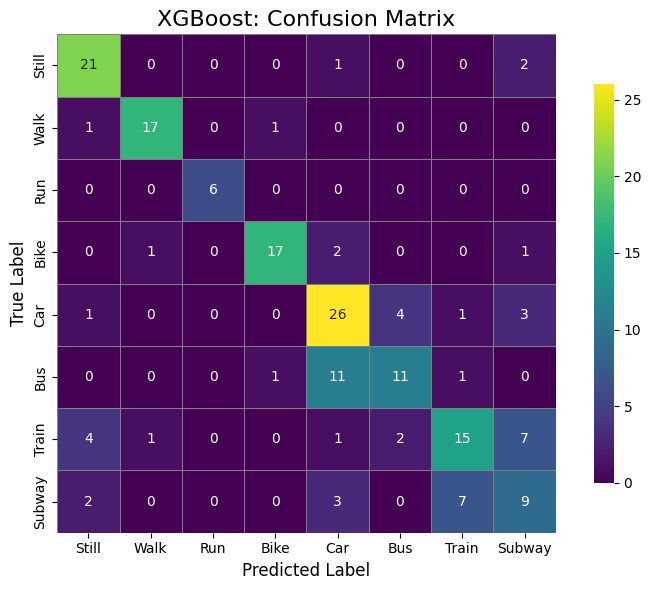


Top 10 Features – XGBoost:
                          feature  importance
0     Acc_rot_y_wavelet_energy_L1    0.017497
1         Acc_x_wavelet_energy_L2    0.017466
2              Acc_z_acf_mean_abs    0.014883
3                   Gyr_y_ptp_amp    0.014772
4  Acc_solo_mag_wavelet_energy_L0    0.013302
5      Mag_y_acf_spectral_entropy    0.012659
6  Acc_solo_mag_wavelet_energy_L3    0.012609
7              Acc_y_diff_entropy    0.011654
8            Acc_z_sample_entropy    0.010956
9              Mag_z_dct_band_3_4    0.010518


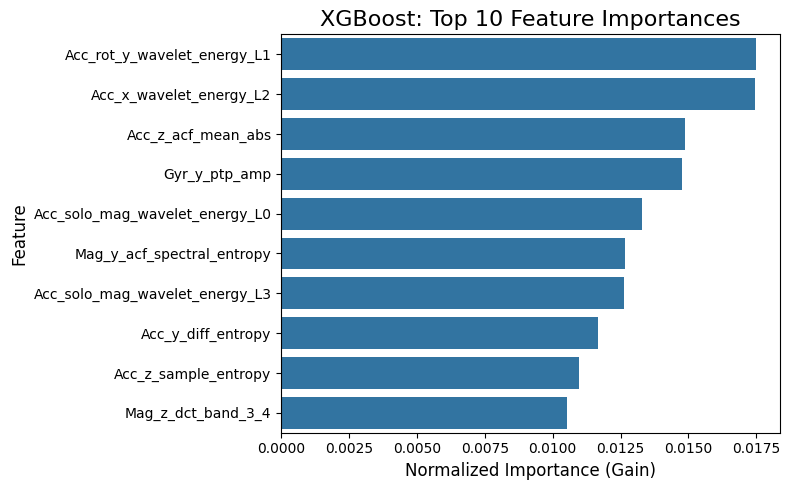

In [8]:
# Cell 1: Imports 
import os
import glob
import pandas as pd
from tqdm.auto import tqdm

# Machine Learning Imports
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb

# Plotting Imports
import matplotlib.pyplot as plt
import seaborn as sns

print("import complete")

# === Settings ===
DATA_ROOTS = [
    '/net/tscratch/people/plgdusza/Sussex Dataset/features/train',
    '/net/tscratch/people/plgdusza/Sussex Dataset/features/validation',
]

# === 1. Read & merge all rows per folder, selecting only numeric features ===
folder_dfs = []

for root in DATA_ROOTS:
    split_name = os.path.basename(root)  # 'train' or 'validation'
    print(f"\nProcessing split: {split_name}")

    for sub in sorted(os.listdir(root)):
        folder_path = os.path.join(root, sub)
        if not os.path.isdir(folder_path):
            continue

        files = sorted(glob.glob(os.path.join(folder_path, '*.csv')))
        if len(files) != 13:
            print(f"Error Expected 13 files in {folder_path}, found {len(files)}")

        merged = None
        mode_series = None

        for fp in files:
            df = pd.read_csv(fp)

            # capture mode per window from the first file only
            if merged is None:
                mode_series = df.set_index('window_id')['mode']

            # select only numeric columns (drops any object columns)
            num_cols = df.select_dtypes(include=['number']).columns.tolist()
            # ensure window_id first
            cols = ['window_id'] + [c for c in num_cols if c not in ('window_id','mode')]

            df_feat = df[cols].copy()
            sensor_name = os.path.splitext(os.path.basename(fp))[0]
            df_feat.columns = ['window_id'] + [
                f"{sensor_name}_{c}" for c in cols if c != 'window_id'
            ]

            # merge horizontally on window_id
            if merged is None:
                merged = df_feat
            else:
                merged = merged.merge(df_feat, on='window_id', how='inner')

        # re-attach mode + labels
        merged['mode']   = merged['window_id'].map(mode_series)
        merged['split']  = split_name
        merged['subdir'] = sub

        folder_dfs.append(merged)

# === 2. Stack all sub-folder DataFrames vertically ===
df_wide = pd.concat(folder_dfs, ignore_index=True)
print("\nFinal combined shape:", df_wide.shape)
print(df_wide[['split','subdir','mode']].drop_duplicates())


# === 0.b CLEAN-UP df_wide: replace infinities & clip outliers ===
# (run this *after* you’ve built df_wide and before sampling)
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
print("replaced inf")
# drop any columns that ended up entirely NaN
df_wide.dropna(axis=1, how='all', inplace=True)
print("dropped nan columns")


# === 3. Shuffle + Train/Test Split ===
df_all = df_wide.sample(frac=0.001, random_state=42).reset_index(drop=True)
X = df_all.drop(columns=['window_id','mode','split','subdir'])
y = df_all['mode']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42,
    stratify=y
)
print("Train:", X_train.shape, "| Test:", X_test.shape)

# === 4. Train XGBoost ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

model = xgb.XGBClassifier(
    booster='gbtree',
    n_estimators=80,
    max_depth=8,
    learning_rate=0.3,
    random_state=42,
    n_jobs=-1,
    verbosity=1
)
print("\nTraining XGBoost …")
model.fit(X_train, y_train_enc)

# === 5. Evaluate ===
y_pred = model.predict(X_test)
print("\n=== Classification Report ===")
print(classification_report(y_test_enc, y_pred, digits=4))

cm = confusion_matrix(y_test_enc, y_pred)
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

plt.figure(figsize=(8,6), dpi=100)
sns.heatmap(cm_df, annot=True, fmt="d", cmap=plt.cm.viridis, square=True,
            linewidths=0.5, linecolor="gray",
            cbar_kws={"shrink":0.8})
plt.title("XGBoost: Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.tight_layout()
plt.show()

# === 6. Feature Importances ===
imp = model.feature_importances_
feat_names = X_train.columns.tolist()
imp_df = pd.DataFrame({'feature':feat_names, 'importance':imp}) \
            .sort_values('importance', ascending=False) \
            .reset_index(drop=True)

print("\nTop 10 Features – XGBoost:")
print(imp_df.head(10))

plt.figure(figsize=(8,5), dpi=100)
sns.barplot(x='importance', y='feature', data=imp_df.head(10))
plt.title("XGBoost: Top 10 Feature Importances", fontsize=16)
plt.xlabel("Normalized Importance (Gain)", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()


In [18]:
# force full console output
pd.set_option('display.max_rows', None)

#Train/Test Split
df_all = df_wide.sample(frac=1, random_state=42).reset_index(drop=True)
X = df_all.drop(columns=['window_id','mode','split','subdir'])
y = df_all['mode']

# after you’ve defined X…
names = sorted(X.columns)

# determine column‐widths based on both header and data
feat_w  = max(len("Feature"), max(len(n) for n in names))
nan_w   = max(len("NaNs"),   max(len(str(X[c].isna().sum()))   for c in names))
zero_w  = max(len("Zeros"),  max(len(str((X[c] == 0).sum()))  for c in names))
count_w = max(len("Count"),  max(len(str(X[c].count()))        for c in names))

# print header and separator
header = (
    f"{'Feature'.ljust(feat_w)}  "
    f"{'NaNs'.rjust(nan_w)}  "
    f"{'Zeros'.rjust(zero_w)}  "
    f"{'Count'.rjust(count_w)}"
)
sep = (
    f"{'-'*feat_w}  "
    f"{'-'*nan_w}  "
    f"{'-'*zero_w}  "
    f"{'-'*count_w}"
)
print(header)
print(sep)

# print each line
for col in names:
    n = X[col].isna().sum()
    z = (X[col] == 0).sum()
    c = X[col].count()
    print(
        f"{col.ljust(feat_w)}  "
        f"{str(n).rjust(nan_w)}  "
        f"{str(z).rjust(zero_w)}  "
        f"{str(c).rjust(count_w)}"
    )


Feature                            NaNs   Zeros   Count
---------------------------------  ----  ------  ------
Acc_rot_x_acf_mean_abs               62       0  899382
Acc_rot_x_acf_prom_freq              62    4990  899382
Acc_rot_x_acf_skew                   62       0  899382
Acc_rot_x_acf_spectral_entropy       62       0  899382
Acc_rot_x_acf_std                    62       0  899382
Acc_rot_x_acf_zero_crossings         62       0  899382
Acc_rot_x_dct_amp_max                62       0  899382
Acc_rot_x_dct_amp_skew               62       0  899382
Acc_rot_x_dct_amp_std                62       0  899382
Acc_rot_x_dct_band_0.1_0.5           62       0  899382
Acc_rot_x_dct_band_0.5_1             62       0  899382
Acc_rot_x_dct_band_1.5_2             62       0  899382
Acc_rot_x_dct_band_12_18             62       0  899382
Acc_rot_x_dct_band_18_24             62       0  899382
Acc_rot_x_dct_band_1_1.5             62       0  899382
Acc_rot_x_dct_band_2.5_3             62       0 

replaced inf
dropped all-NaN columns
dropped split/subdir metadata (if existed)
Sampled shape (100%): (899444, 964)
Mode distribution in sample:
 mode
5.0    143312
7.0    142460
1.0    121692
6.0    120648
2.0    119076
8.0    112704
4.0    103520
3.0     36032
Name: count, dtype: int64
After drop, X dtypes:
 float64    952
int64       10
Name: count, dtype: int64
Train size: (719555, 962) | Test size: (179889, 962)

=== Run 1/50 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9361

Classification Report:
              precision    recall  f1-score   support

       Still     0.8763    0.9451    0.9094     24338
        Walk     0.9704    0.9565    0.9634     23815
         Run     0.9980    0.9906    0.9943      7206
        Bike     0.9821    0.9675    0.9747     20704
         Car     0.9715    0.9676    0.9695     2

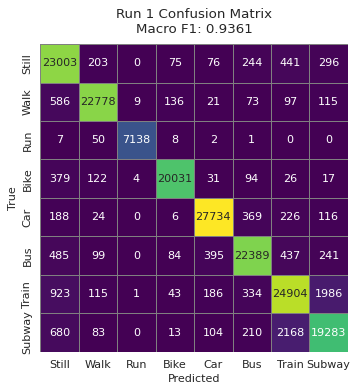


=== Run 2/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9372

Classification Report:
              precision    recall  f1-score   support

       Still     0.8789    0.9465    0.9114     24338
        Walk     0.9707    0.9571    0.9639     23815
         Run     0.9979    0.9904    0.9941      7206
        Bike     0.9825    0.9659    0.9741     20704
         Car     0.9725    0.9688    0.9707     28663
         Bus     0.9462    0.9291    0.9376     24130
       Train     0.8808    0.8775    0.8791     28492
      Subway     0.8761    0.8572    0.8665     22541

    accuracy                         0.9310    179889
   macro avg     0.9382    0.9366    0.9372    179889
weighted avg     0.9316    0.9310    0.9311    179889



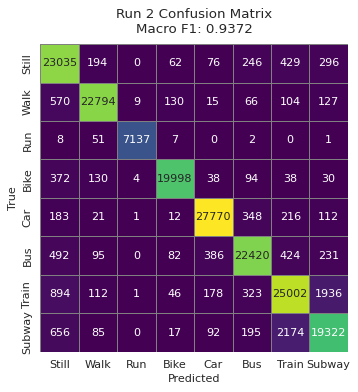


=== Run 3/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9348

Classification Report:
              precision    recall  f1-score   support

       Still     0.8750    0.9453    0.9088     24338
        Walk     0.9725    0.9560    0.9642     23815
         Run     0.9979    0.9907    0.9943      7206
        Bike     0.9843    0.9654    0.9748     20704
         Car     0.9707    0.9659    0.9683     28663
         Bus     0.9445    0.9259    0.9351     24130
       Train     0.8731    0.8735    0.8733     28492
      Subway     0.8699    0.8505    0.8601     22541

    accuracy                         0.9283    179889
   macro avg     0.9360    0.9342    0.9348    179889
weighted avg     0.9290    0.9283    0.9284    179889



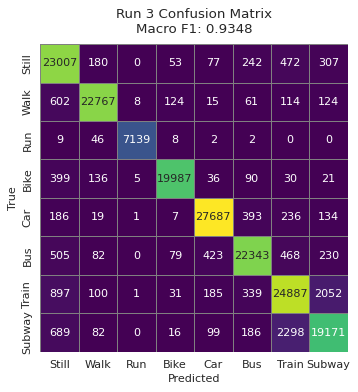


=== Run 4/50 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9357

Classification Report:
              precision    recall  f1-score   support

       Still     0.8756    0.9445    0.9087     24338
        Walk     0.9689    0.9548    0.9618     23815
         Run     0.9979    0.9903    0.9941      7206
        Bike     0.9815    0.9671    0.9742     20704
         Car     0.9707    0.9675    0.9691     28663
         Bus     0.9439    0.9261    0.9349     24130
       Train     0.8795    0.8762    0.8779     28492
      Subway     0.8758    0.8543    0.8649     22541

    accuracy                         0.9294    179889
   macro avg     0.9367    0.9351    0.9357    179889
weighted avg     0.9300    0.9294    0.9295    179889



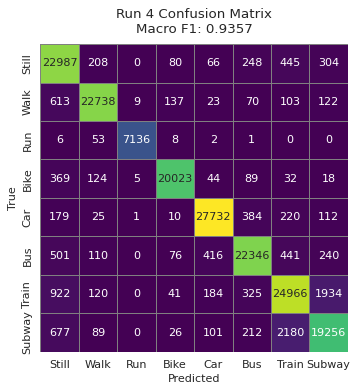


=== Run 5/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9405

Classification Report:
              precision    recall  f1-score   support

       Still     0.8806    0.9495    0.9137     24338
        Walk     0.9705    0.9573    0.9639     23815
         Run     0.9976    0.9910    0.9943      7206
        Bike     0.9818    0.9675    0.9746     20704
         Car     0.9733    0.9705    0.9719     28663
         Bus     0.9492    0.9329    0.9410     24130
       Train     0.8918    0.8820    0.8869     28492
      Subway     0.8860    0.8693    0.8776     22541

    accuracy                         0.9347    179889
   macro avg     0.9413    0.9400    0.9405    179889
weighted avg     0.9352    0.9347    0.9347    179889



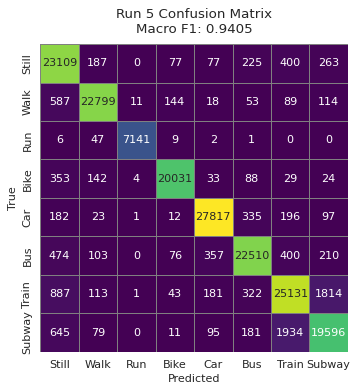


=== Run 6/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9370

Classification Report:
              precision    recall  f1-score   support

       Still     0.8791    0.9439    0.9103     24338
        Walk     0.9718    0.9557    0.9637     23815
         Run     0.9976    0.9906    0.9941      7206
        Bike     0.9826    0.9676    0.9751     20704
         Car     0.9733    0.9680    0.9706     28663
         Bus     0.9462    0.9287    0.9374     24130
       Train     0.8775    0.8791    0.8783     28492
      Subway     0.8760    0.8572    0.8665     22541

    accuracy                         0.9307    179889
   macro avg     0.9380    0.9364    0.9370    179889
weighted avg     0.9314    0.9307    0.9309    179889



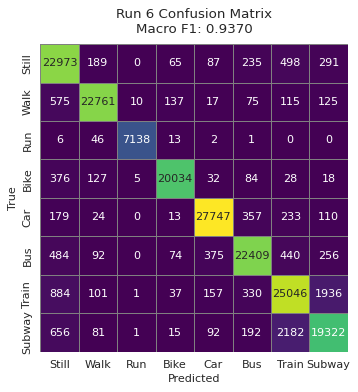


=== Run 7/50 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9363

Classification Report:
              precision    recall  f1-score   support

       Still     0.8765    0.9477    0.9107     24338
        Walk     0.9720    0.9555    0.9637     23815
         Run     0.9982    0.9908    0.9945      7206
        Bike     0.9842    0.9650    0.9745     20704
         Car     0.9709    0.9665    0.9687     28663
         Bus     0.9447    0.9264    0.9355     24130
       Train     0.8756    0.8788    0.8772     28492
      Subway     0.8782    0.8540    0.8659     22541

    accuracy                         0.9299    179889
   macro avg     0.9375    0.9356    0.9363    179889
weighted avg     0.9307    0.9299    0.9301    179889



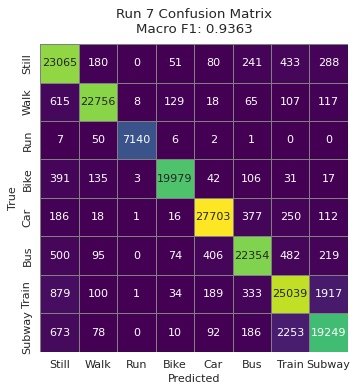


=== Run 8/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9343

Classification Report:
              precision    recall  f1-score   support

       Still     0.8763    0.9434    0.9086     24338
        Walk     0.9687    0.9555    0.9621     23815
         Run     0.9982    0.9910    0.9946      7206
        Bike     0.9811    0.9654    0.9732     20704
         Car     0.9688    0.9655    0.9671     28663
         Bus     0.9398    0.9262    0.9329     24130
       Train     0.8756    0.8727    0.8742     28492
      Subway     0.8738    0.8500    0.8617     22541

    accuracy                         0.9277    179889
   macro avg     0.9353    0.9337    0.9343    179889
weighted avg     0.9283    0.9277    0.9278    179889



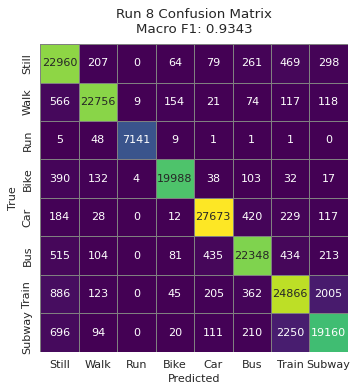


=== Run 9/50 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9393

Classification Report:
              precision    recall  f1-score   support

       Still     0.8773    0.9507    0.9126     24338
        Walk     0.9710    0.9573    0.9641     23815
         Run     0.9983    0.9910    0.9946      7206
        Bike     0.9815    0.9669    0.9741     20704
         Car     0.9720    0.9699    0.9709     28663
         Bus     0.9474    0.9318    0.9395     24130
       Train     0.8892    0.8810    0.8851     28492
      Subway     0.8856    0.8613    0.8733     22541

    accuracy                         0.9333    179889
   macro avg     0.9403    0.9387    0.9393    179889
weighted avg     0.9340    0.9333    0.9334    179889



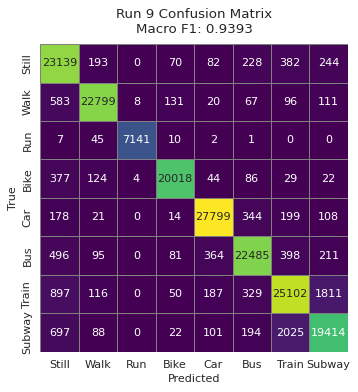


=== Run 10/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9394

Classification Report:
              precision    recall  f1-score   support

       Still     0.8783    0.9491    0.9123     24338
        Walk     0.9705    0.9570    0.9637     23815
         Run     0.9982    0.9908    0.9945      7206
        Bike     0.9826    0.9667    0.9746     20704
         Car     0.9728    0.9691    0.9709     28663
         Bus     0.9495    0.9305    0.9399     24130
       Train     0.8872    0.8812    0.8842     28492
      Subway     0.8844    0.8665    0.8754     22541

    accuracy                         0.9334    179889
   macro avg     0.9404    0.9389    0.9394    179889
weighted avg     0.9341    0.9334    0.9335    179889



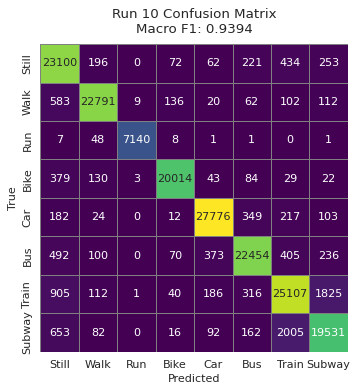


=== Run 11/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9397

Classification Report:
              precision    recall  f1-score   support

       Still     0.8798    0.9480    0.9127     24338
        Walk     0.9693    0.9574    0.9633     23815
         Run     0.9979    0.9906    0.9942      7206
        Bike     0.9820    0.9673    0.9746     20704
         Car     0.9731    0.9698    0.9714     28663
         Bus     0.9489    0.9326    0.9407     24130
       Train     0.8895    0.8820    0.8857     28492
      Subway     0.8843    0.8654    0.8748     22541

    accuracy                         0.9338    179889
   macro avg     0.9406    0.9391    0.9397    179889
weighted avg     0.9344    0.9338    0.9339    179889



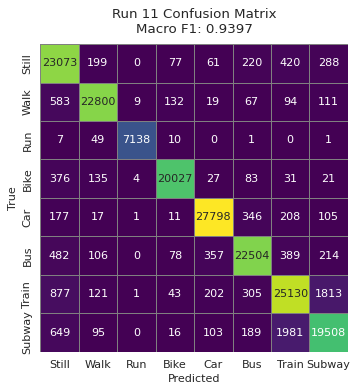


=== Run 12/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9363

Classification Report:
              precision    recall  f1-score   support

       Still     0.8776    0.9463    0.9107     24338
        Walk     0.9718    0.9548    0.9632     23815
         Run     0.9978    0.9908    0.9943      7206
        Bike     0.9819    0.9676    0.9747     20704
         Car     0.9729    0.9673    0.9701     28663
         Bus     0.9455    0.9288    0.9371     24130
       Train     0.8765    0.8740    0.8753     28492
      Subway     0.8740    0.8561    0.8650     22541

    accuracy                         0.9299    179889
   macro avg     0.9373    0.9357    0.9363    179889
weighted avg     0.9306    0.9299    0.9300    179889



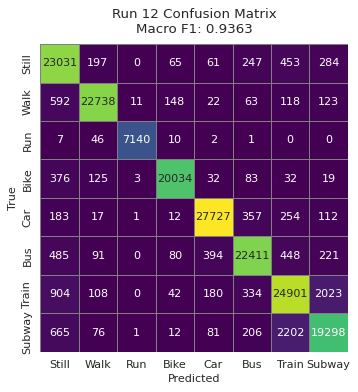


=== Run 13/50 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9387

Classification Report:
              precision    recall  f1-score   support

       Still     0.8762    0.9489    0.9111     24338
        Walk     0.9706    0.9562    0.9633     23815
         Run     0.9980    0.9908    0.9944      7206
        Bike     0.9808    0.9664    0.9736     20704
         Car     0.9722    0.9682    0.9702     28663
         Bus     0.9456    0.9318    0.9386     24130
       Train     0.8901    0.8798    0.8849     28492
      Subway     0.8834    0.8635    0.8733     22541

    accuracy                         0.9327    179889
   macro avg     0.9396    0.9382    0.9387    179889
weighted avg     0.9333    0.9327    0.9328    179889



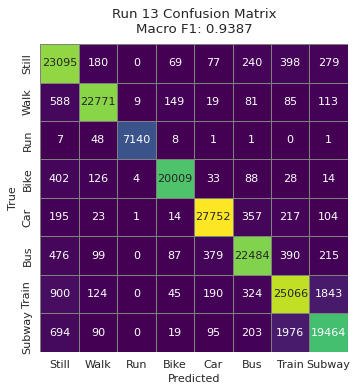


=== Run 14/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9367

Classification Report:
              precision    recall  f1-score   support

       Still     0.8780    0.9441    0.9099     24338
        Walk     0.9694    0.9554    0.9624     23815
         Run     0.9982    0.9908    0.9945      7206
        Bike     0.9821    0.9673    0.9746     20704
         Car     0.9707    0.9684    0.9695     28663
         Bus     0.9452    0.9284    0.9367     24130
       Train     0.8802    0.8775    0.8788     28492
      Subway     0.8778    0.8568    0.8672     22541

    accuracy                         0.9304    179889
   macro avg     0.9377    0.9361    0.9367    179889
weighted avg     0.9310    0.9304    0.9305    179889



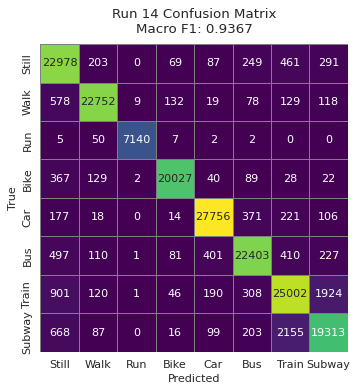


=== Run 15/50 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9349

Classification Report:
              precision    recall  f1-score   support

       Still     0.8720    0.9447    0.9069     24338
        Walk     0.9711    0.9556    0.9633     23815
         Run     0.9983    0.9907    0.9945      7206
        Bike     0.9827    0.9646    0.9736     20704
         Car     0.9705    0.9661    0.9683     28663
         Bus     0.9450    0.9264    0.9356     24130
       Train     0.8770    0.8724    0.8747     28492
      Subway     0.8717    0.8540    0.8627     22541

    accuracy                         0.9284    179889
   macro avg     0.9360    0.9343    0.9349    179889
weighted avg     0.9292    0.9284    0.9285    179889



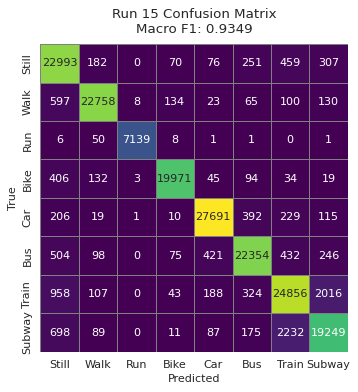


=== Run 16/50 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9364

Classification Report:
              precision    recall  f1-score   support

       Still     0.8759    0.9465    0.9098     24338
        Walk     0.9689    0.9551    0.9619     23815
         Run     0.9980    0.9907    0.9944      7206
        Bike     0.9806    0.9652    0.9728     20704
         Car     0.9681    0.9669    0.9675     28663
         Bus     0.9418    0.9281    0.9349     24130
       Train     0.8860    0.8754    0.8807     28492
      Subway     0.8794    0.8591    0.8691     22541

    accuracy                         0.9301    179889
   macro avg     0.9373    0.9359    0.9364    179889
weighted avg     0.9307    0.9301    0.9302    179889



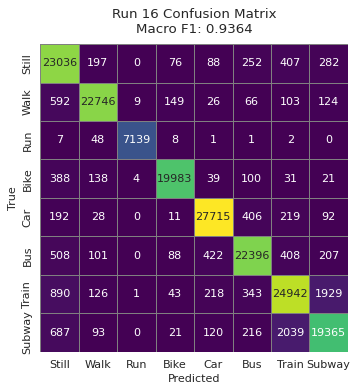


=== Run 17/50 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9365

Classification Report:
              precision    recall  f1-score   support

       Still     0.8788    0.9463    0.9113     24338
        Walk     0.9724    0.9558    0.9640     23815
         Run     0.9982    0.9904    0.9943      7206
        Bike     0.9844    0.9667    0.9755     20704
         Car     0.9719    0.9670    0.9694     28663
         Bus     0.9448    0.9281    0.9364     24130
       Train     0.8747    0.8763    0.8755     28492
      Subway     0.8759    0.8560    0.8658     22541

    accuracy                         0.9301    179889
   macro avg     0.9376    0.9358    0.9365    179889
weighted avg     0.9308    0.9301    0.9303    179889



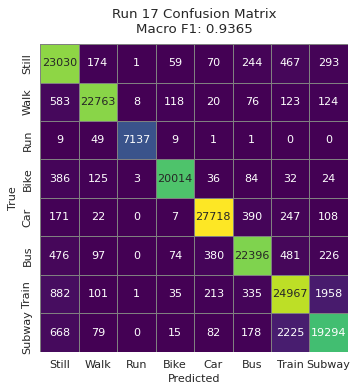


=== Run 18/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9344

Classification Report:
              precision    recall  f1-score   support

       Still     0.8736    0.9461    0.9084     24338
        Walk     0.9717    0.9556    0.9636     23815
         Run     0.9980    0.9904    0.9942      7206
        Bike     0.9843    0.9659    0.9750     20704
         Car     0.9719    0.9659    0.9689     28663
         Bus     0.9429    0.9251    0.9339     24130
       Train     0.8720    0.8706    0.8713     28492
      Subway     0.8697    0.8502    0.8598     22541

    accuracy                         0.9278    179889
   macro avg     0.9355    0.9337    0.9344    179889
weighted avg     0.9285    0.9278    0.9279    179889



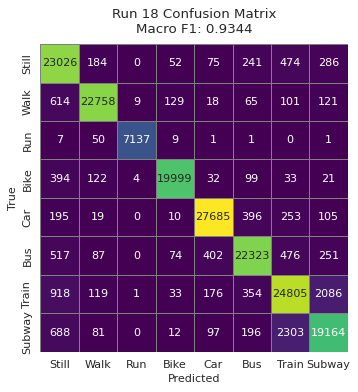


=== Run 19/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9361

Classification Report:
              precision    recall  f1-score   support

       Still     0.8773    0.9440    0.9095     24338
        Walk     0.9714    0.9554    0.9634     23815
         Run     0.9980    0.9910    0.9945      7206
        Bike     0.9819    0.9671    0.9745     20704
         Car     0.9722    0.9674    0.9698     28663
         Bus     0.9442    0.9279    0.9360     24130
       Train     0.8777    0.8749    0.8763     28492
      Subway     0.8738    0.8564    0.8650     22541

    accuracy                         0.9297    179889
   macro avg     0.9371    0.9355    0.9361    179889
weighted avg     0.9303    0.9297    0.9298    179889



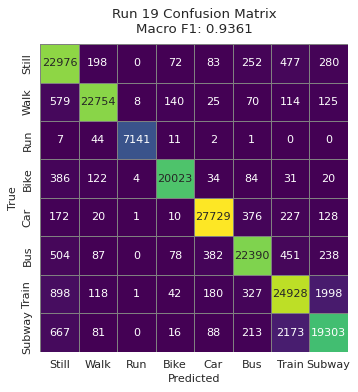


=== Run 20/50 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9355

Classification Report:
              precision    recall  f1-score   support

       Still     0.8760    0.9442    0.9088     24338
        Walk     0.9693    0.9565    0.9629     23815
         Run     0.9989    0.9904    0.9946      7206
        Bike     0.9814    0.9657    0.9735     20704
         Car     0.9707    0.9674    0.9691     28663
         Bus     0.9434    0.9280    0.9356     24130
       Train     0.8785    0.8747    0.8766     28492
      Subway     0.8743    0.8520    0.8630     22541

    accuracy                         0.9291    179889
   macro avg     0.9366    0.9349    0.9355    179889
weighted avg     0.9297    0.9291    0.9292    179889



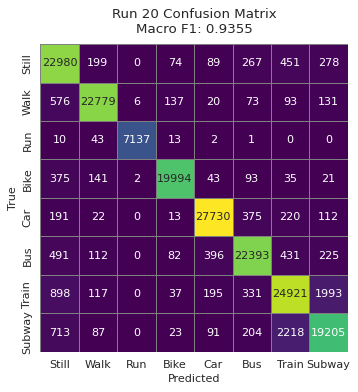


=== Run 21/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9367

Classification Report:
              precision    recall  f1-score   support

       Still     0.8782    0.9456    0.9107     24338
        Walk     0.9690    0.9563    0.9626     23815
         Run     0.9980    0.9903    0.9941      7206
        Bike     0.9813    0.9665    0.9739     20704
         Car     0.9699    0.9671    0.9685     28663
         Bus     0.9450    0.9290    0.9370     24130
       Train     0.8816    0.8766    0.8791     28492
      Subway     0.8783    0.8575    0.8678     22541

    accuracy                         0.9305    179889
   macro avg     0.9377    0.9361    0.9367    179889
weighted avg     0.9310    0.9305    0.9305    179889



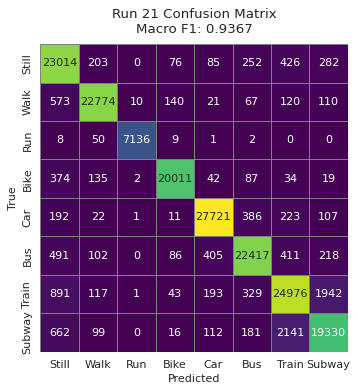


=== Run 22/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9369

Classification Report:
              precision    recall  f1-score   support

       Still     0.8768    0.9483    0.9112     24338
        Walk     0.9717    0.9565    0.9640     23815
         Run     0.9980    0.9907    0.9944      7206
        Bike     0.9845    0.9661    0.9752     20704
         Car     0.9713    0.9665    0.9689     28663
         Bus     0.9475    0.9265    0.9369     24130
       Train     0.8779    0.8781    0.8780     28492
      Subway     0.8765    0.8571    0.8667     22541

    accuracy                         0.9306    179889
   macro avg     0.9380    0.9362    0.9369    179889
weighted avg     0.9313    0.9306    0.9307    179889



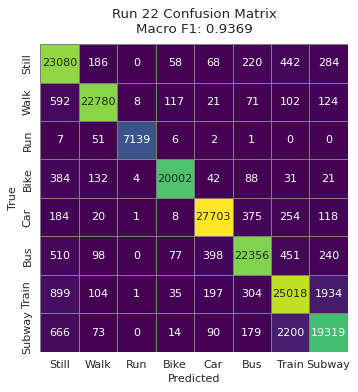


=== Run 23/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9356

Classification Report:
              precision    recall  f1-score   support

       Still     0.8735    0.9472    0.9088     24338
        Walk     0.9711    0.9554    0.9632     23815
         Run     0.9982    0.9911    0.9946      7206
        Bike     0.9821    0.9660    0.9740     20704
         Car     0.9718    0.9662    0.9690     28663
         Bus     0.9458    0.9278    0.9367     24130
       Train     0.8773    0.8721    0.8747     28492
      Subway     0.8736    0.8548    0.8641     22541

    accuracy                         0.9292    179889
   macro avg     0.9367    0.9351    0.9356    179889
weighted avg     0.9299    0.9292    0.9293    179889



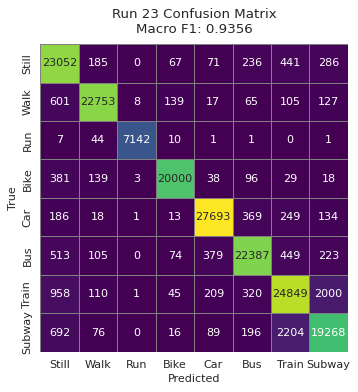


=== Run 24/50 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9350

Classification Report:
              precision    recall  f1-score   support

       Still     0.8720    0.9440    0.9066     24338
        Walk     0.9704    0.9556    0.9630     23815
         Run     0.9980    0.9908    0.9944      7206
        Bike     0.9824    0.9659    0.9741     20704
         Car     0.9705    0.9667    0.9686     28663
         Bus     0.9439    0.9257    0.9347     24130
       Train     0.8780    0.8724    0.8752     28492
      Subway     0.8729    0.8540    0.8634     22541

    accuracy                         0.9285    179889
   macro avg     0.9360    0.9344    0.9350    179889
weighted avg     0.9292    0.9285    0.9286    179889



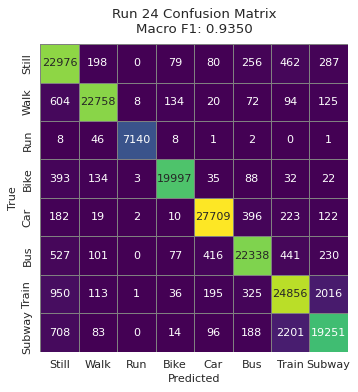


=== Run 25/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9353

Classification Report:
              precision    recall  f1-score   support

       Still     0.8747    0.9469    0.9094     24338
        Walk     0.9704    0.9560    0.9632     23815
         Run     0.9983    0.9907    0.9945      7206
        Bike     0.9830    0.9660    0.9744     20704
         Car     0.9705    0.9671    0.9688     28663
         Bus     0.9441    0.9252    0.9345     24130
       Train     0.8772    0.8728    0.8750     28492
      Subway     0.8732    0.8532    0.8631     22541

    accuracy                         0.9289    179889
   macro avg     0.9364    0.9347    0.9353    179889
weighted avg     0.9296    0.9289    0.9290    179889



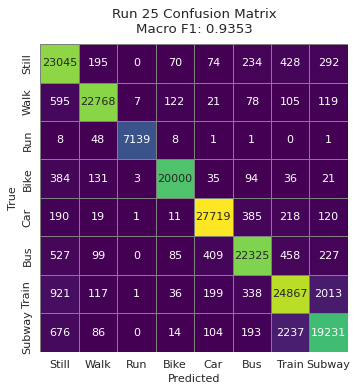


=== Run 26/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9371

Classification Report:
              precision    recall  f1-score   support

       Still     0.8753    0.9490    0.9107     24338
        Walk     0.9709    0.9551    0.9630     23815
         Run     0.9978    0.9906    0.9942      7206
        Bike     0.9820    0.9658    0.9738     20704
         Car     0.9721    0.9680    0.9700     28663
         Bus     0.9481    0.9298    0.9389     24130
       Train     0.8819    0.8761    0.8790     28492
      Subway     0.8771    0.8578    0.8673     22541

    accuracy                         0.9309    179889
   macro avg     0.9381    0.9365    0.9371    179889
weighted avg     0.9316    0.9309    0.9310    179889



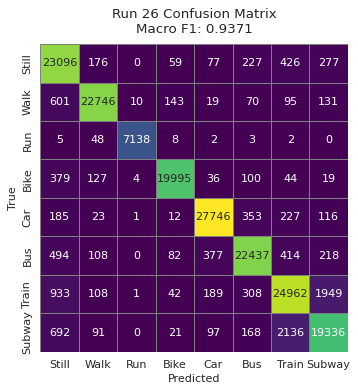


=== Run 27/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9349

Classification Report:
              precision    recall  f1-score   support

       Still     0.8743    0.9448    0.9082     24338
        Walk     0.9723    0.9555    0.9638     23815
         Run     0.9983    0.9908    0.9946      7206
        Bike     0.9840    0.9662    0.9750     20704
         Car     0.9707    0.9657    0.9682     28663
         Bus     0.9437    0.9269    0.9352     24130
       Train     0.8716    0.8730    0.8723     28492
      Subway     0.8733    0.8503    0.8616     22541

    accuracy                         0.9282    179889
   macro avg     0.9360    0.9342    0.9349    179889
weighted avg     0.9290    0.9282    0.9284    179889



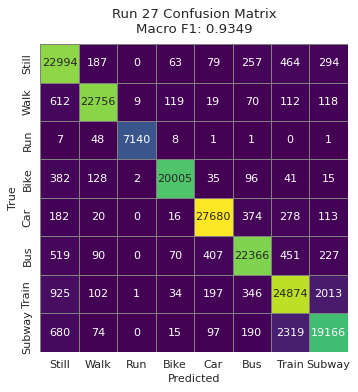


=== Run 28/50 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9361

Classification Report:
              precision    recall  f1-score   support

       Still     0.8773    0.9459    0.9103     24338
        Walk     0.9716    0.9549    0.9632     23815
         Run     0.9983    0.9906    0.9944      7206
        Bike     0.9833    0.9659    0.9746     20704
         Car     0.9717    0.9666    0.9691     28663
         Bus     0.9462    0.9284    0.9372     24130
       Train     0.8737    0.8752    0.8745     28492
      Subway     0.8755    0.8556    0.8655     22541

    accuracy                         0.9296    179889
   macro avg     0.9372    0.9354    0.9361    179889
weighted avg     0.9303    0.9296    0.9298    179889



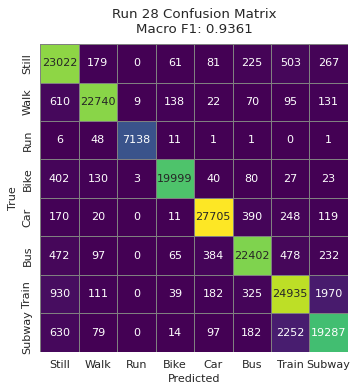


=== Run 29/50 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9349

Classification Report:
              precision    recall  f1-score   support

       Still     0.8729    0.9427    0.9065     24338
        Walk     0.9687    0.9540    0.9613     23815
         Run     0.9973    0.9903    0.9938      7206
        Bike     0.9800    0.9659    0.9729     20704
         Car     0.9686    0.9662    0.9674     28663
         Bus     0.9381    0.9265    0.9323     24130
       Train     0.8843    0.8724    0.8783     28492
      Subway     0.8760    0.8572    0.8665     22541

    accuracy                         0.9285    179889
   macro avg     0.9358    0.9344    0.9349    179889
weighted avg     0.9291    0.9285    0.9286    179889



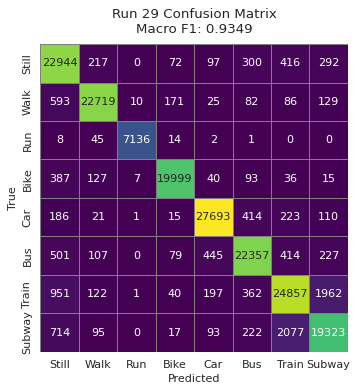


=== Run 30/50 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9389

Classification Report:
              precision    recall  f1-score   support

       Still     0.8768    0.9493    0.9116     24338
        Walk     0.9698    0.9565    0.9631     23815
         Run     0.9980    0.9907    0.9944      7206
        Bike     0.9829    0.9669    0.9748     20704
         Car     0.9722    0.9696    0.9709     28663
         Bus     0.9468    0.9309    0.9388     24130
       Train     0.8888    0.8797    0.8842     28492
      Subway     0.8834    0.8630    0.8731     22541

    accuracy                         0.9329    179889
   macro avg     0.9398    0.9383    0.9389    179889
weighted avg     0.9335    0.9329    0.9329    179889



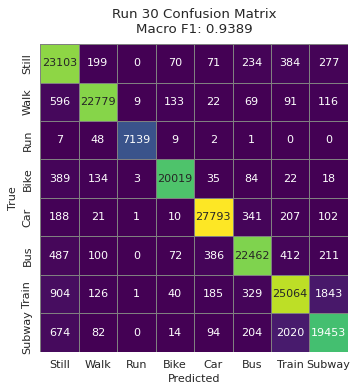


=== Run 31/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9373

Classification Report:
              precision    recall  f1-score   support

       Still     0.8765    0.9466    0.9102     24338
        Walk     0.9698    0.9555    0.9626     23815
         Run     0.9982    0.9904    0.9943      7206
        Bike     0.9826    0.9661    0.9743     20704
         Car     0.9713    0.9672    0.9693     28663
         Bus     0.9460    0.9304    0.9382     24130
       Train     0.8817    0.8782    0.8799     28492
      Subway     0.8808    0.8589    0.8697     22541

    accuracy                         0.9311    179889
   macro avg     0.9384    0.9367    0.9373    179889
weighted avg     0.9317    0.9311    0.9312    179889



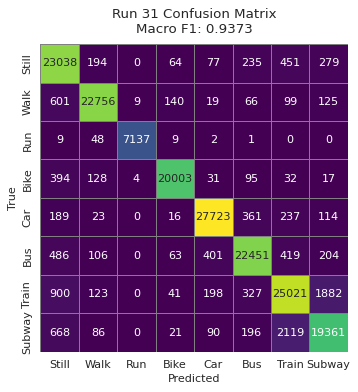


=== Run 32/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9354

Classification Report:
              precision    recall  f1-score   support

       Still     0.8744    0.9460    0.9088     24338
        Walk     0.9711    0.9558    0.9634     23815
         Run     0.9976    0.9907    0.9942      7206
        Bike     0.9842    0.9656    0.9748     20704
         Car     0.9719    0.9667    0.9693     28663
         Bus     0.9452    0.9271    0.9361     24130
       Train     0.8754    0.8736    0.8745     28492
      Subway     0.8725    0.8530    0.8626     22541

    accuracy                         0.9290    179889
   macro avg     0.9365    0.9348    0.9354    179889
weighted avg     0.9297    0.9290    0.9291    179889



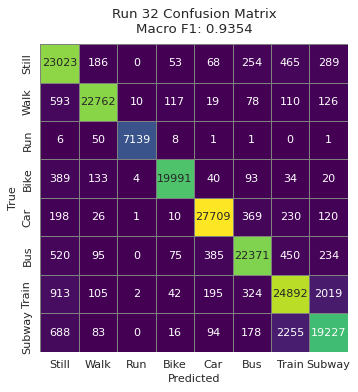


=== Run 33/50 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9351

Classification Report:
              precision    recall  f1-score   support

       Still     0.8711    0.9465    0.9073     24338
        Walk     0.9718    0.9548    0.9632     23815
         Run     0.9982    0.9906    0.9944      7206
        Bike     0.9825    0.9648    0.9736     20704
         Car     0.9717    0.9660    0.9688     28663
         Bus     0.9431    0.9263    0.9346     24130
       Train     0.8758    0.8738    0.8748     28492
      Subway     0.8763    0.8530    0.8645     22541

    accuracy                         0.9286    179889
   macro avg     0.9363    0.9345    0.9351    179889
weighted avg     0.9294    0.9286    0.9288    179889



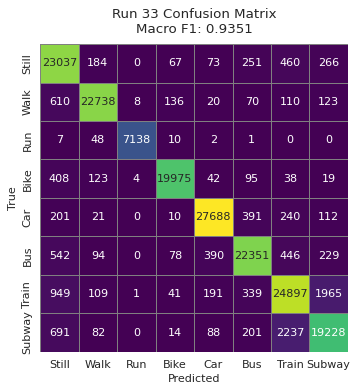


=== Run 34/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9409

Classification Report:
              precision    recall  f1-score   support

       Still     0.8795    0.9502    0.9135     24338
        Walk     0.9728    0.9575    0.9651     23815
         Run     0.9979    0.9910    0.9944      7206
        Bike     0.9830    0.9682    0.9756     20704
         Car     0.9760    0.9703    0.9731     28663
         Bus     0.9522    0.9343    0.9432     24130
       Train     0.8888    0.8839    0.8863     28492
      Subway     0.8844    0.8670    0.8756     22541

    accuracy                         0.9350    179889
   macro avg     0.9418    0.9403    0.9409    179889
weighted avg     0.9357    0.9350    0.9351    179889



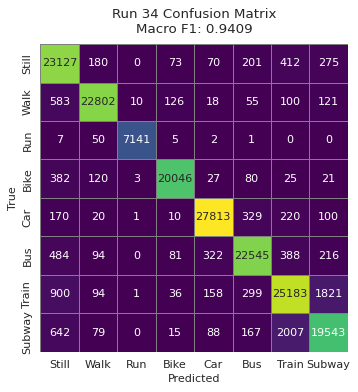


=== Run 35/50 — Params: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9386

Classification Report:
              precision    recall  f1-score   support

       Still     0.8774    0.9486    0.9116     24338
        Walk     0.9694    0.9557    0.9625     23815
         Run     0.9980    0.9906    0.9943      7206
        Bike     0.9826    0.9663    0.9744     20704
         Car     0.9715    0.9685    0.9700     28663
         Bus     0.9469    0.9288    0.9378     24130
       Train     0.8877    0.8815    0.8846     28492
      Subway     0.8833    0.8638    0.8734     22541

    accuracy                         0.9325    179889
   macro avg     0.9396    0.9380    0.9386    179889
weighted avg     0.9332    0.9325    0.9326    179889



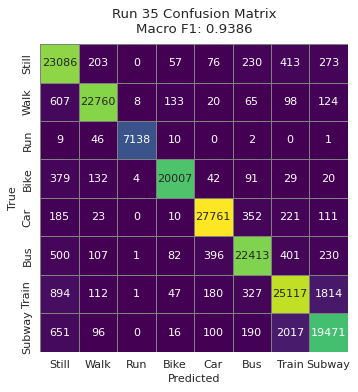


=== Run 36/50 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9366

Classification Report:
              precision    recall  f1-score   support

       Still     0.8757    0.9441    0.9086     24338
        Walk     0.9684    0.9554    0.9619     23815
         Run     0.9983    0.9903    0.9943      7206
        Bike     0.9807    0.9650    0.9728     20704
         Car     0.9708    0.9680    0.9694     28663
         Bus     0.9439    0.9291    0.9364     24130
       Train     0.8847    0.8772    0.8810     28492
      Subway     0.8779    0.8590    0.8684     22541

    accuracy                         0.9304    179889
   macro avg     0.9376    0.9360    0.9366    179889
weighted avg     0.9310    0.9304    0.9305    179889



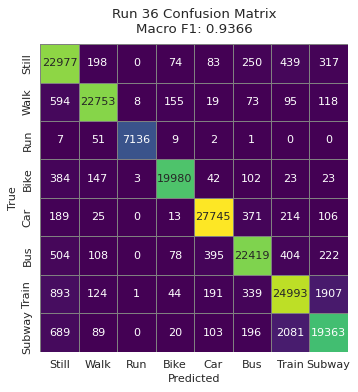


=== Run 37/50 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9382

Classification Report:
              precision    recall  f1-score   support

       Still     0.8775    0.9467    0.9108     24338
        Walk     0.9705    0.9560    0.9632     23815
         Run     0.9980    0.9910    0.9945      7206
        Bike     0.9808    0.9675    0.9741     20704
         Car     0.9716    0.9690    0.9703     28663
         Bus     0.9467    0.9315    0.9390     24130
       Train     0.8891    0.8765    0.8827     28492
      Subway     0.8779    0.8636    0.8707     22541

    accuracy                         0.9321    179889
   macro avg     0.9390    0.9377    0.9382    179889
weighted avg     0.9327    0.9321    0.9322    179889



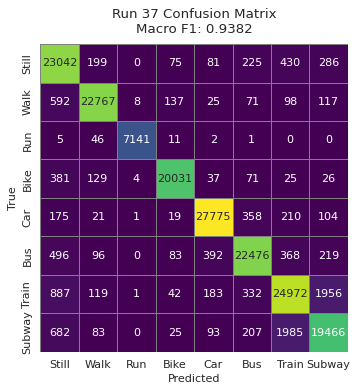


=== Run 38/50 — Params: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9352

Classification Report:
              precision    recall  f1-score   support

       Still     0.8743    0.9442    0.9079     24338
        Walk     0.9688    0.9549    0.9618     23815
         Run     0.9982    0.9908    0.9945      7206
        Bike     0.9811    0.9671    0.9741     20704
         Car     0.9693    0.9671    0.9682     28663
         Bus     0.9440    0.9272    0.9355     24130
       Train     0.8787    0.8724    0.8756     28492
      Subway     0.8746    0.8530    0.8637     22541

    accuracy                         0.9287    179889
   macro avg     0.9361    0.9346    0.9352    179889
weighted avg     0.9293    0.9287    0.9288    179889



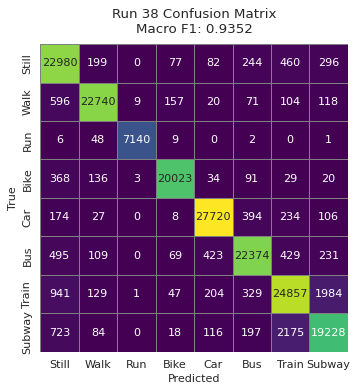


=== Run 39/50 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===


In [ ]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 50   # ← set this to however many runs you want

# === 0.b CLEAN-UP df_wide: replace infinities & clip outliers ===
# (run this *after* you’ve built df_wide and before sampling)
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
print("replaced inf")

# drop any columns that ended up entirely NaN
df_wide.dropna(axis=1, how='all', inplace=True)
print("dropped all-NaN columns")

# **Also** drop any leftover non-numeric metadata columns if present
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)
print("dropped split/subdir metadata (if existed)")

# === 1. Sample your data (100% for speed) ===
df_sample = df_wide.sample(frac=1, random_state=42).reset_index(drop=True)
print("Sampled shape (100%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
# drop window_id, mode, and any other non-feature columns
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

print("After drop, X dtypes:\n", X.dtypes.value_counts())

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.20, 
    random_state=42, 
    stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [250, 500],           # number of boosting rounds 
    "max_depth":        [9, 10],         # tree complexity
    "learning_rate":    [0.2, 0.3, 0.4], # shrinkage factor
    "subsample":        [0.8, 0.9, 1.0], # row sampling
    "colsample_bytree": [0.8, 1.0],      # feature sampling
    "gamma":            [0.1, 0.2],      # min loss reduction
    "min_child_weight": [5, 7],          # minimum leaf instance
    "reg_alpha":        [0.01, 0.1],     # L1 regularization
    "reg_lambda":       [1, 1.5]         # L2 regularization
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1     = -1.0
best_params = None

# === 7. Hyperparameter search loop ===
for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# === 8. Report best ===
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)


replaced inf
dropped all-NaN columns
dropped split/subdir metadata (if existed)
Sampled shape (100%): (899444, 964)
Mode distribution in sample:
 mode
5.0    143312
7.0    142460
1.0    121692
6.0    120648
2.0    119076
8.0    112704
4.0    103520
3.0     36032
Name: count, dtype: int64
After drop, X dtypes:
 float64    952
int64       10
Name: count, dtype: int64
Train size: (719555, 962) | Test size: (179889, 962)

=== Run 1/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9352

Classification Report:
              precision    recall  f1-score   support

       Still     0.8770    0.9433    0.9089     24338
        Walk     0.9712    0.9548    0.9629     23815
         Run     0.9982    0.9908    0.9945      7206
        Bike     0.9816    0.9664    0.9740     20704
         Car     0.9711    0.9668    0.9690     286

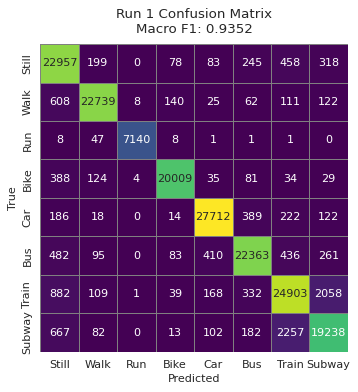


=== Run 2/5 — Params: {'subsample': 0.8, 'reg_lambda': 1.5, 'reg_alpha': 0.01, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0} ===
Macro-average F1 Score: 0.9344

Classification Report:
              precision    recall  f1-score   support

       Still     0.8714    0.9449    0.9066     24338
        Walk     0.9714    0.9549    0.9630     23815
         Run     0.9985    0.9908    0.9946      7206
        Bike     0.9839    0.9646    0.9742     20704
         Car     0.9704    0.9650    0.9677     28663
         Bus     0.9415    0.9264    0.9339     24130
       Train     0.8753    0.8718    0.8735     28492
      Subway     0.8719    0.8516    0.8616     22541

    accuracy                         0.9278    179889
   macro avg     0.9355    0.9337    0.9344    179889
weighted avg     0.9285    0.9278    0.9279    179889



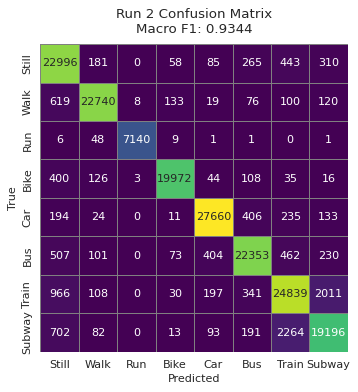


=== Run 3/5 — Params: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.4, 'gamma': 0.2, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9339

Classification Report:
              precision    recall  f1-score   support

       Still     0.8736    0.9420    0.9065     24338
        Walk     0.9675    0.9561    0.9618     23815
         Run     0.9980    0.9901    0.9941      7206
        Bike     0.9808    0.9656    0.9731     20704
         Car     0.9694    0.9658    0.9676     28663
         Bus     0.9393    0.9249    0.9320     24130
       Train     0.8776    0.8703    0.8740     28492
      Subway     0.8722    0.8517    0.8618     22541

    accuracy                         0.9273    179889
   macro avg     0.9348    0.9333    0.9339    179889
weighted avg     0.9279    0.9273    0.9274    179889



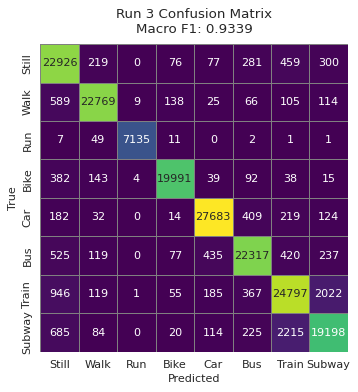


=== Run 4/5 — Params: {'subsample': 0.9, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.4, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9364

Classification Report:
              precision    recall  f1-score   support

       Still     0.8779    0.9431    0.9094     24338
        Walk     0.9700    0.9547    0.9623     23815
         Run     0.9979    0.9901    0.9940      7206
        Bike     0.9815    0.9670    0.9742     20704
         Car     0.9719    0.9681    0.9700     28663
         Bus     0.9446    0.9292    0.9368     24130
       Train     0.8799    0.8760    0.8779     28492
      Subway     0.8749    0.8579    0.8663     22541

    accuracy                         0.9301    179889
   macro avg     0.9373    0.9358    0.9364    179889
weighted avg     0.9307    0.9301    0.9302    179889



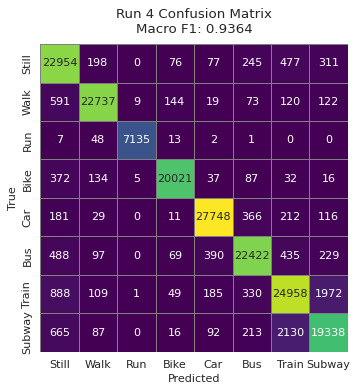


=== Run 5/5 — Params: {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8} ===
Macro-average F1 Score: 0.9370

Classification Report:
              precision    recall  f1-score   support

       Still     0.8776    0.9456    0.9104     24338
        Walk     0.9727    0.9552    0.9639     23815
         Run     0.9985    0.9908    0.9946      7206
        Bike     0.9839    0.9673    0.9755     20704
         Car     0.9725    0.9669    0.9697     28663
         Bus     0.9444    0.9297    0.9370     24130
       Train     0.8788    0.8773    0.8780     28492
      Subway     0.8758    0.8578    0.8667     22541

    accuracy                         0.9306    179889
   macro avg     0.9380    0.9363    0.9370    179889
weighted avg     0.9313    0.9306    0.9308    179889



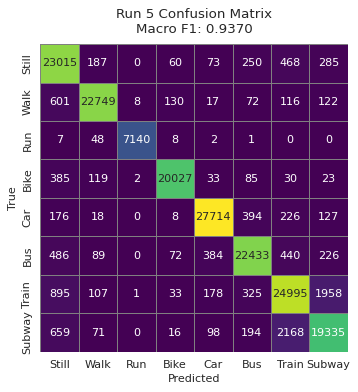


Best hyperparameters (by macro F1):
{'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0.1, 'n_estimators': 250, 'min_child_weight': 7, 'max_depth': 9, 'learning_rate': 0.3, 'gamma': 0.1, 'colsample_bytree': 0.8}
Best test-set macro F1: 0.9370


In [20]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import xgboost as xgb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# === 0. How many random configs to try? ===
n_iter_search = 5   # ← set this to however many runs you want

# === 0.b CLEAN-UP df_wide: replace infinities & clip outliers ===
# (run this *after* you’ve built df_wide and before sampling)
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
print("replaced inf")

# drop any columns that ended up entirely NaN
df_wide.dropna(axis=1, how='all', inplace=True)
print("dropped all-NaN columns")

# **Also** drop any leftover non-numeric metadata columns if present
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)
print("dropped split/subdir metadata (if existed)")

# === 1. Sample your data (100% for speed) ===
df_sample = df_wide.sample(frac=1, random_state=42).reset_index(drop=True)
print("Sampled shape (100%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Prepare features & labels ===
# drop window_id, mode, and any other non-feature columns
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

print("After drop, X dtypes:\n", X.dtypes.value_counts())

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.20, 
    random_state=42, 
    stratify=y
)
print("Train size:", X_train.shape, "| Test size:", X_test.shape)

# === 4. Encode y for XGBoost (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

# plotting defaults
sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Define hyperparameter search space ===
param_dist = {
    "n_estimators":     [250],           
    "max_depth":        [9, 10],                  
    "learning_rate":    [0.2, 0.3, 0.4],       
    "subsample":        [0.8, 0.9, 1.0],          
    "colsample_bytree": [0.8, 1.0],               
    "gamma":            [0.1, 0.2],            
    "min_child_weight": [5, 7],                      
    "reg_alpha":        [0.01, 0.1],                  
    "reg_lambda":       [1, 1.5]                      
}

# === 6. Sample random hyperparameter sets ===
param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

# Prepare to track the best
best_f1     = -1.0
best_params = None

# === 7. Hyperparameter search loop ===
for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    
    model = xgb.XGBClassifier(
        tree_method='hist',
        predictor='gpu_predictor',
        device='cuda:0',
        random_state=42,
        verbosity=0,
        n_jobs=-1,
        **params
    )
    
    model.fit(X_train, y_train_enc)
    y_pred = model.predict(X_test)
    
    # compute macro (un-weighted) F1
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro-average F1 Score: {f1:.4f}")
    
    # classification report
    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))
    
    # plot confusion matrix only
    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nMacro F1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # update best model by macro F1
    if f1 > best_f1:
        best_f1, best_params = f1, params

# === 8. Report best ===
print("\n" + "="*60)
print("Best hyperparameters (by macro F1):")
print(best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*60)


In [ ]:
#Catboost test

In [20]:
!pip install catboost

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 27.8 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 62.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [catboost]3/4 [catboost]



=== Run 1/5 — Params: {'random_strength': 1, 'learning_rate': 0.1, 'l2_leaf_reg': 5, 'iterations': 250, 'depth': 10, 'border_count': 32} ===
Macro F1: 0.8758

Classification Report:
              precision    recall  f1-score   support

       Still     0.7849    0.9150    0.8450      4846
        Walk     0.9391    0.9324    0.9357      4763
         Run     0.9949    0.9799    0.9874      1394
        Bike     0.9519    0.9377    0.9447      4175
         Car     0.9097    0.9092    0.9095      5773
         Bus     0.8618    0.8362    0.8488      4793
       Train     0.8017    0.7551    0.7777      5720
      Subway     0.7761    0.7404    0.7578      4514

    accuracy                         0.8637     35978
   macro avg     0.8775    0.8757    0.8758     35978
weighted avg     0.8647    0.8637    0.8633     35978



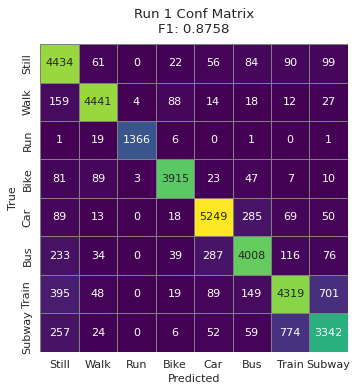


=== Run 2/5 — Params: {'random_strength': 1, 'learning_rate': 0.01, 'l2_leaf_reg': 1, 'iterations': 250, 'depth': 10, 'border_count': 32} ===
Macro F1: 0.7902

Classification Report:
              precision    recall  f1-score   support

       Still     0.7069    0.8770    0.7828      4846
        Walk     0.8618    0.9150    0.8876      4763
         Run     0.9859    0.9498    0.9675      1394
        Bike     0.9035    0.8831    0.8932      4175
         Car     0.8039    0.8342    0.8188      5773
         Bus     0.7689    0.6783    0.7208      4793
       Train     0.6873    0.6323    0.6587      5720
      Subway     0.6305    0.5591    0.5927      4514

    accuracy                         0.7734     35978
   macro avg     0.7936    0.7911    0.7902     35978
weighted avg     0.7721    0.7734    0.7706     35978



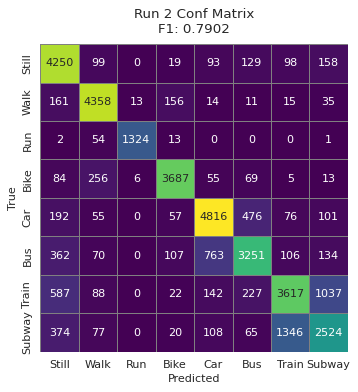


=== Run 3/5 — Params: {'random_strength': 5, 'learning_rate': 0.01, 'l2_leaf_reg': 1, 'iterations': 500, 'depth': 10, 'border_count': 32} ===
Macro F1: 0.8249

Classification Report:
              precision    recall  f1-score   support

       Still     0.7348    0.8927    0.8061      4846
        Walk     0.8967    0.9236    0.9099      4763
         Run     0.9883    0.9663    0.9771      1394
        Bike     0.9255    0.9102    0.9178      4175
         Car     0.8470    0.8677    0.8572      5773
         Bus     0.8113    0.7507    0.7798      4793
       Train     0.7225    0.6710    0.6958      5720
      Subway     0.6925    0.6221    0.6554      4514

    accuracy                         0.8095     35978
   macro avg     0.8273    0.8255    0.8249     35978
weighted avg     0.8091    0.8095    0.8077     35978



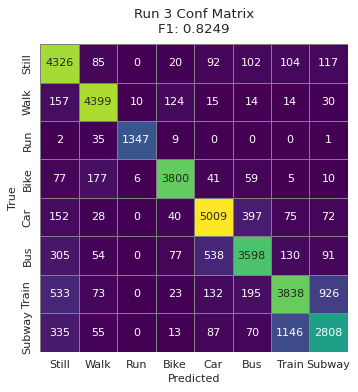


=== Run 4/5 — Params: {'random_strength': 1, 'learning_rate': 0.01, 'l2_leaf_reg': 3, 'iterations': 250, 'depth': 6, 'border_count': 32} ===
Macro F1: 0.7317

Classification Report:
              precision    recall  f1-score   support

       Still     0.6883    0.8345    0.7544      4846
        Walk     0.7856    0.9003    0.8391      4763
         Run     0.9810    0.9268    0.9532      1394
        Bike     0.8652    0.8086    0.8360      4175
         Car     0.7142    0.7883    0.7494      5773
         Bus     0.7022    0.5366    0.6083      4793
       Train     0.6184    0.6170    0.6177      5720
      Subway     0.5516    0.4502    0.4957      4514

    accuracy                         0.7139     35978
   macro avg     0.7383    0.7328    0.7317     35978
weighted avg     0.7108    0.7139    0.7083     35978



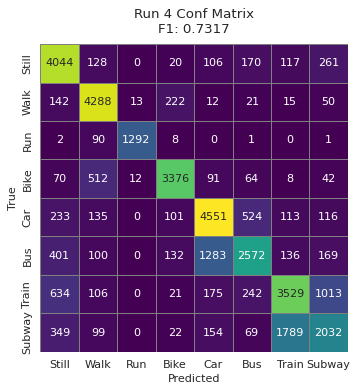


=== Run 5/5 — Params: {'random_strength': 1, 'learning_rate': 0.01, 'l2_leaf_reg': 5, 'iterations': 250, 'depth': 6, 'border_count': 64} ===
Macro F1: 0.7311

Classification Report:
              precision    recall  f1-score   support

       Still     0.6866    0.8372    0.7544      4846
        Walk     0.7794    0.8973    0.8342      4763
         Run     0.9773    0.9283    0.9522      1394
        Bike     0.8653    0.8014    0.8321      4175
         Car     0.7193    0.7897    0.7529      5773
         Bus     0.7018    0.5387    0.6095      4793
       Train     0.6192    0.6129    0.6161      5720
      Subway     0.5507    0.4533    0.4973      4514

    accuracy                         0.7133     35978
   macro avg     0.7375    0.7324    0.7311     35978
weighted avg     0.7104    0.7133    0.7079     35978



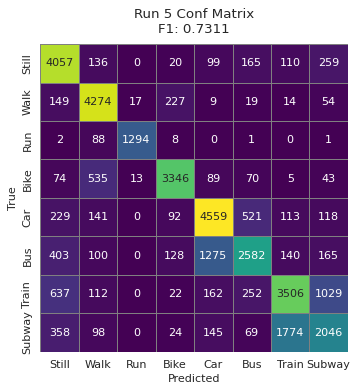


Best CatBoost params: {'random_strength': 1, 'learning_rate': 0.1, 'l2_leaf_reg': 5, 'iterations': 250, 'depth': 10, 'border_count': 32}
Best test-set macro F1: 0.8758


In [22]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# ** New import **
from catboost import CatBoostClassifier  

# === 0. Number of random configs ===
n_iter_search = 5

# === 0.b CLEAN-UP df_wide ===
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
df_wide.dropna(axis=1, how='all', inplace=True)
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)

# === 1. Sample data (20%) ===
df_sample = df_wide.sample(frac=0.20, random_state=42).reset_index(drop=True)
print("Sampled shape (20%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Features & labels ===
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# === 4. Encode y for multiclass (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Hyperparameter space for CatBoost ===
param_dist = {
    'iterations':        [250, 500],
    'depth':             [6, 8, 10],
    'learning_rate':     [0.01, 0.05, 0.1],
    'l2_leaf_reg':       [1, 3, 5],
    'border_count':      [32, 64],
    'random_strength':   [1, 3, 5]
}

param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

best_f1, best_params = -1.0, None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")

    # — Instantiate CatBoost with GPU
    model = CatBoostClassifier(
        task_type='GPU',      # GPU acceleration
        devices='0',
        verbose=0,
        **params
    )

    model.fit(X_train, y_train_enc, 
              eval_set=(X_test, y_test_enc),
              early_stopping_rounds=30)

    y_pred = model.predict(X_test)
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro F1: {f1:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred,
                                target_names=labels, digits=4))

    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Conf Matrix\nF1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.tight_layout(); plt.show()

    if f1 > best_f1:
        best_f1, best_params = f1, params

print("\n" + "="*50)
print("Best CatBoost params:", best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*50)


In [ ]:
#Cat boost 100% dataset

Sampled shape (100%): (899444, 964)
Mode distribution in sample:
 mode
5.0    143312
7.0    142460
1.0    121692
6.0    120648
2.0    119076
8.0    112704
4.0    103520
3.0     36032
Name: count, dtype: int64

=== Run 1/5 — Params: {'random_strength': 1, 'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 500, 'depth': 10, 'border_count': 64} ===
Macro F1: 0.9183

Classification Report:
              precision    recall  f1-score   support

       Still     0.8437    0.9378    0.8883     24338
        Walk     0.9606    0.9498    0.9552     23815
         Run     0.9979    0.9886    0.9932      7206
        Bike     0.9703    0.9584    0.9643     20704
         Car     0.9508    0.9538    0.9523     28663
         Bus     0.9198    0.9016    0.9106     24130
       Train     0.8592    0.8381    0.8485     28492
      Subway     0.8540    0.8146    0.8339     22541

    accuracy                         0.9103    179889
   macro avg     0.9195    0.9178    0.9183    179889
weighted avg

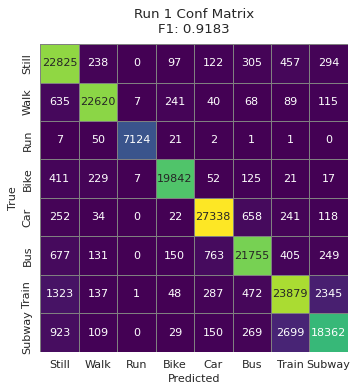


=== Run 2/5 — Params: {'random_strength': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 10, 'border_count': 64} ===
Macro F1: 0.9246

Classification Report:
              precision    recall  f1-score   support

       Still     0.8549    0.9370    0.8941     24338
        Walk     0.9638    0.9521    0.9579     23815
         Run     0.9985    0.9899    0.9941      7206
        Bike     0.9751    0.9619    0.9685     20704
         Car     0.9577    0.9571    0.9574     28663
         Bus     0.9288    0.9123    0.9205     24130
       Train     0.8661    0.8508    0.8584     28492
      Subway     0.8602    0.8316    0.8456     22541

    accuracy                         0.9170    179889
   macro avg     0.9256    0.9241    0.9246    179889
weighted avg     0.9176    0.9170    0.9170    179889



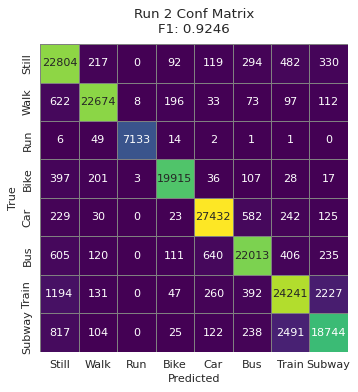


=== Run 3/5 — Params: {'random_strength': 1, 'learning_rate': 0.1, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 6, 'border_count': 64} ===
Macro F1: 0.8851

Classification Report:
              precision    recall  f1-score   support

       Still     0.7971    0.9200    0.8542     24338
        Walk     0.9495    0.9388    0.9441     23815
         Run     0.9965    0.9856    0.9910      7206
        Bike     0.9563    0.9470    0.9516     20704
         Car     0.9157    0.9250    0.9203     28663
         Bus     0.8804    0.8561    0.8681     24130
       Train     0.8029    0.7677    0.7849     28492
      Subway     0.7950    0.7395    0.7662     22541

    accuracy                         0.8737    179889
   macro avg     0.8867    0.8849    0.8851    179889
weighted avg     0.8743    0.8737    0.8732    179889



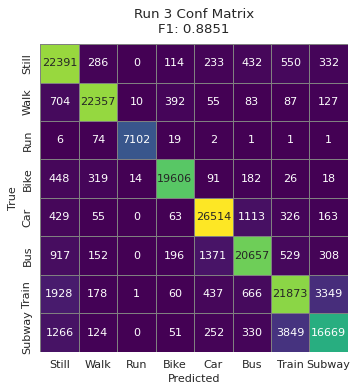


=== Run 4/5 — Params: {'random_strength': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 8, 'border_count': 64} ===
Macro F1: 0.9164

Classification Report:
              precision    recall  f1-score   support

       Still     0.8447    0.9327    0.8865     24338
        Walk     0.9617    0.9497    0.9557     23815
         Run     0.9978    0.9896    0.9937      7206
        Bike     0.9717    0.9602    0.9659     20704
         Car     0.9477    0.9527    0.9502     28663
         Bus     0.9170    0.8992    0.9080     24130
       Train     0.8519    0.8336    0.8427     28492
      Subway     0.8476    0.8099    0.8283     22541

    accuracy                         0.9080    179889
   macro avg     0.9175    0.9159    0.9164    179889
weighted avg     0.9086    0.9080    0.9079    179889



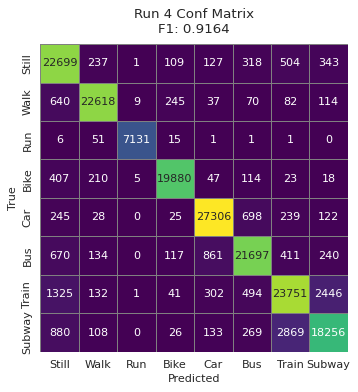


=== Run 5/5 — Params: {'random_strength': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 250, 'depth': 6, 'border_count': 32} ===
Macro F1: 0.8817

Classification Report:
              precision    recall  f1-score   support

       Still     0.7988    0.9165    0.8536     24338
        Walk     0.9456    0.9371    0.9414     23815
         Run     0.9959    0.9847    0.9903      7206
        Bike     0.9554    0.9443    0.9498     20704
         Car     0.9108    0.9209    0.9158     28663
         Bus     0.8757    0.8488    0.8620     24130
       Train     0.7954    0.7666    0.7807     28492
      Subway     0.7887    0.7328    0.7597     22541

    accuracy                         0.8700    179889
   macro avg     0.8833    0.8815    0.8817    179889
weighted avg     0.8705    0.8700    0.8695    179889



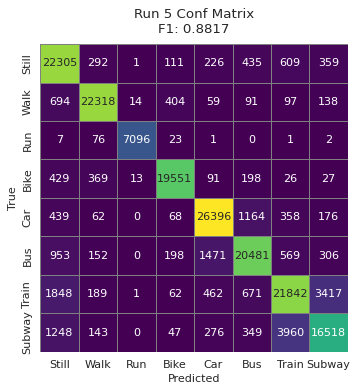


Best CatBoost params: {'random_strength': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 10, 'border_count': 64}
Best test-set macro F1: 0.9246


In [23]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# ** New import **
from catboost import CatBoostClassifier  

# === 0. Number of random configs ===
n_iter_search = 5

# === 0.b CLEAN-UP df_wide ===
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
df_wide.dropna(axis=1, how='all', inplace=True)
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)

# === 1. Sample data (100%) ===
df_sample = df_wide.sample(frac=1, random_state=42).reset_index(drop=True)
print("Sampled shape (100%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Features & labels ===
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# === 4. Encode y for multiclass (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Hyperparameter space for CatBoost ===
param_dist = {
    'iterations':        [250, 500],
    'depth':             [8, 10, 12],
    'learning_rate':     [0.1, 0.2, 0.3],
    'l2_leaf_reg':       [3, 5, 7],
    'border_count':      [32, 64],
    'random_strength':   [1, 3, 5]
}

param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

best_f1, best_params = -1.0, None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")

    # — Instantiate CatBoost with GPU
    model = CatBoostClassifier(
        task_type='GPU',      # GPU acceleration
        devices='0',
        verbose=0,
        **params
    )

    model.fit(X_train, y_train_enc, 
              eval_set=(X_test, y_test_enc),
              early_stopping_rounds=30)

    y_pred = model.predict(X_test)
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro F1: {f1:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred,
                                target_names=labels, digits=4))

    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Conf Matrix\nF1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.tight_layout(); plt.show()

    if f1 > best_f1:
        best_f1, best_params = f1, params

print("\n" + "="*50)
print("Best CatBoost params:", best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*50)


Sampled shape (100%): (89944, 964)
Mode distribution:
 mode
7.0    14452
5.0    14324
1.0    12112
2.0    11927
6.0    11895
8.0    11320
4.0    10424
3.0     3490
Name: count, dtype: int64

=== Run 1/5 — Params: {'random_strength': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 250, 'depth': 12, 'border_count': 64} ===


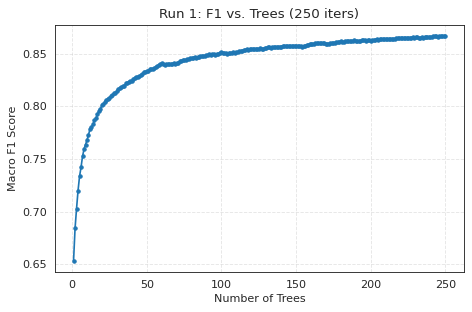

Final Macro F1 (at 250 trees): 0.8670

Classification Report:
              precision    recall  f1-score   support

       Still     0.7890    0.9001    0.8409      2422
        Walk     0.9428    0.9400    0.9414      2385
         Run     0.9985    0.9814    0.9899       698
        Bike     0.9569    0.9376    0.9472      2085
         Car     0.9035    0.9054    0.9045      2865
         Bus     0.8602    0.8222    0.8407      2379
       Train     0.7610    0.7478    0.7544      2891
      Subway     0.7393    0.6966    0.7173      2264

    accuracy                         0.8534     17989
   macro avg     0.8689    0.8664    0.8670     17989
weighted avg     0.8539    0.8534    0.8530     17989



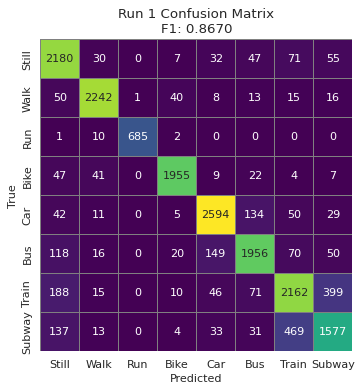


=== Run 2/5 — Params: {'random_strength': 3, 'learning_rate': 0.1, 'l2_leaf_reg': 7, 'iterations': 250, 'depth': 8, 'border_count': 64} ===


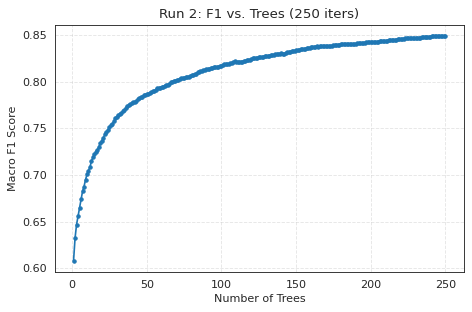

Final Macro F1 (at 250 trees): 0.8494

Classification Report:
              precision    recall  f1-score   support

       Still     0.7672    0.9063    0.8310      2422
        Walk     0.9368    0.9379    0.9374      2385
         Run     0.9985    0.9785    0.9884       698
        Bike     0.9455    0.9319    0.9386      2085
         Car     0.8743    0.8883    0.8812      2865
         Bus     0.8338    0.8033    0.8182      2379
       Train     0.7361    0.7074    0.7215      2891
      Subway     0.7198    0.6422    0.6788      2264

    accuracy                         0.8346     17989
   macro avg     0.8515    0.8495    0.8494     17989
weighted avg     0.8342    0.8346    0.8332     17989



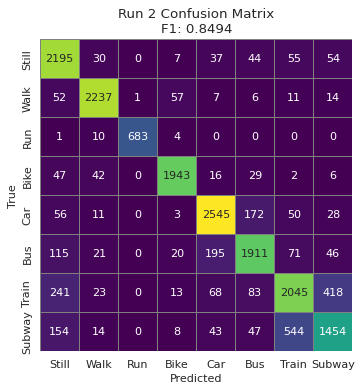


=== Run 3/5 — Params: {'random_strength': 5, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 250, 'depth': 12, 'border_count': 64} ===


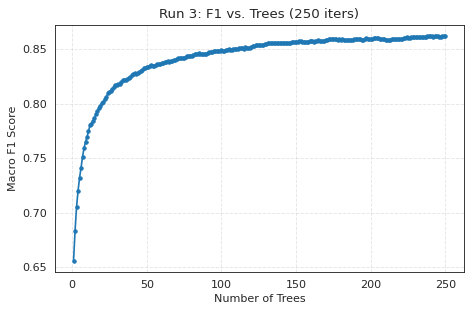

Final Macro F1 (at 250 trees): 0.8618

Classification Report:
              precision    recall  f1-score   support

       Still     0.7857    0.9005    0.8392      2422
        Walk     0.9393    0.9413    0.9403      2385
         Run     1.0000    0.9857    0.9928       698
        Bike     0.9513    0.9362    0.9437      2085
         Car     0.8933    0.9026    0.8979      2865
         Bus     0.8635    0.8188    0.8406      2379
       Train     0.7476    0.7347    0.7411      2891
      Subway     0.7279    0.6723    0.6990      2264

    accuracy                         0.8475     17989
   macro avg     0.8636    0.8615    0.8618     17989
weighted avg     0.8476    0.8475    0.8468     17989



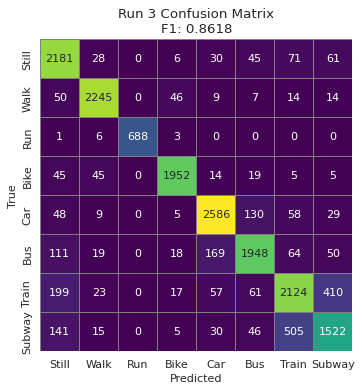


=== Run 4/5 — Params: {'random_strength': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 12, 'border_count': 64} ===


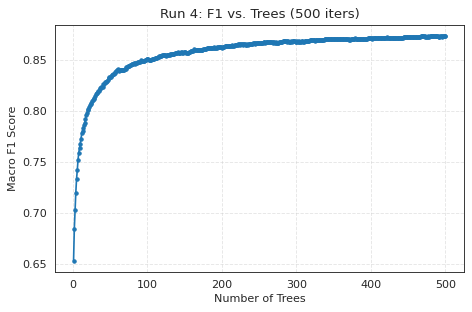

Final Macro F1 (at 500 trees): 0.8735

Classification Report:
              precision    recall  f1-score   support

       Still     0.7882    0.9096    0.8445      2422
        Walk     0.9477    0.9430    0.9454      2385
         Run     1.0000    0.9842    0.9921       698
        Bike     0.9604    0.9424    0.9513      2085
         Car     0.9051    0.9183    0.9116      2865
         Bus     0.8724    0.8306    0.8510      2379
       Train     0.7762    0.7548    0.7653      2891
      Subway     0.7539    0.7010    0.7265      2264

    accuracy                         0.8605     17989
   macro avg     0.8755    0.8730    0.8735     17989
weighted avg     0.8610    0.8605    0.8600     17989



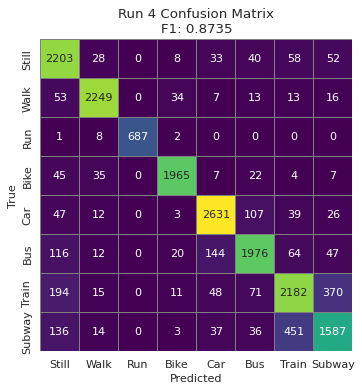


=== Run 5/5 — Params: {'random_strength': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 10, 'border_count': 64} ===


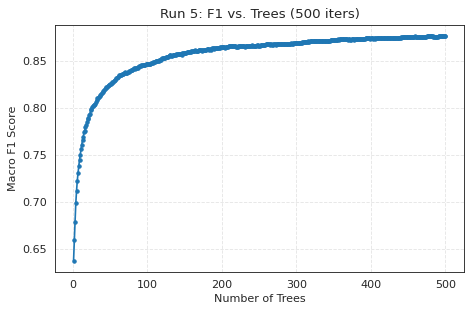

Final Macro F1 (at 500 trees): 0.8772

Classification Report:
              precision    recall  f1-score   support

       Still     0.8008    0.9145    0.8539      2422
        Walk     0.9507    0.9451    0.9479      2385
         Run     1.0000    0.9814    0.9906       698
        Bike     0.9572    0.9429    0.9500      2085
         Car     0.9086    0.9155    0.9120      2865
         Bus     0.8663    0.8310    0.8483      2379
       Train     0.7799    0.7686    0.7742      2891
      Subway     0.7704    0.7129    0.7405      2264

    accuracy                         0.8648     17989
   macro avg     0.8792    0.8765    0.8772     17989
weighted avg     0.8652    0.8648    0.8642     17989



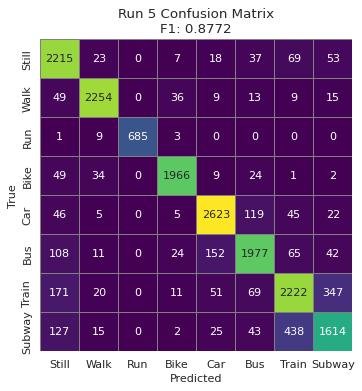


Best CatBoost params: {'random_strength': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'depth': 10, 'border_count': 64}
Best test-set macro F1: 0.8772


In [9]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

from catboost import CatBoostClassifier  

# 0. Number of random configs
n_iter_search = 5

# 0b. Clean up df_wide
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
df_wide.dropna(axis=1, how='all', inplace=True)
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)

# 1. Sample data (10%)
df_sample = df_wide.sample(frac=0.1, random_state=42).reset_index(drop=True)
print("Sampled shape (10%):", df_sample.shape)
print("Mode distribution:\n", df_sample['mode'].value_counts())

# 2. Features & labels
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

# 3. Train/Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# 4. Encode y for multiclass (0–7)
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# 5. Hyperparameter space
param_dist = {
    'iterations':        [250, 500, 750],
    'depth':             [8, 10, 12],
    'learning_rate':     [0.1, 0.2, 0.3],
    'l2_leaf_reg':       [3, 5, 7],
    'border_count':      [32, 64],
    'random_strength':   [1, 3, 5]
}

param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))
best_f1, best_params = -1.0, None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")
    model = CatBoostClassifier(
        task_type='GPU',
        devices='0',
        verbose=0,
        **params
    )

    # fit with early stopping
    model.fit(
        X_train, y_train_enc,
        eval_set=(X_test, y_test_enc),
        early_stopping_rounds=30
    )

    # — Compute F1 vs. number of trees —
    f1_curve = []
    for trees in range(1, params['iterations'] + 1):
        y_pred_i = model.predict(X_test, ntree_end=trees)
        f1_curve.append(f1_score(y_test_enc, y_pred_i, average='macro'))

    # Plot F1 curve
    plt.figure(figsize=(6,4), dpi=80)
    plt.plot(range(1, params['iterations'] + 1), f1_curve, marker='o', markersize=3)
    plt.title(f"Run {idx}: F1 vs. Trees ({params['iterations']} iters)")
    plt.xlabel("Number of Trees")
    plt.ylabel("Macro F1 Score")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # Final predictions & metrics
    y_pred = model.predict(X_test)
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Final Macro F1 (at {model.tree_count_} trees): {f1:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred, target_names=labels, digits=4))

    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d', cmap=cmap_choice,
                linewidths=0.5, linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Confusion Matrix\nF1: {f1:.4f}")
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    if f1 > best_f1:
        best_f1, best_params = f1, params

print("\n" + "="*50)
print("Best CatBoost params:", best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*50)


Sampled shape (10%): (89944, 964)
Mode distribution in sample:
 mode
7.0    14452
5.0    14324
1.0    12112
2.0    11927
6.0    11895
8.0    11320
4.0    10424
3.0     3490
Name: count, dtype: int64

=== Run 1/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8679

Classification Report:
              precision    recall  f1-score   support

       Still     0.7948    0.9067    0.8471      2422
        Walk     0.9415    0.9447    0.9431      2385
         Run     0.9971    0.9857    0.9914       698
        Bike     0.9470    0.9348    0.9409      2085
         Car     0.9022    0.9044    0.9033      2865
         Bus     0.8630    0.8394    0.8511      2379
       Train     0.7708    0.7316    0.7507      2891
      Su

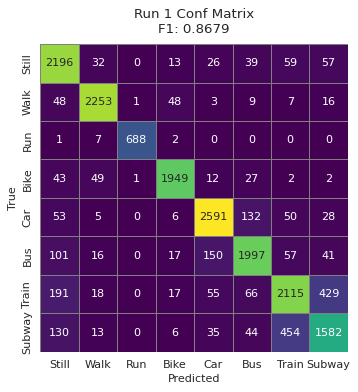


=== Run 2/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8697

Classification Report:
              precision    recall  f1-score   support

       Still     0.7998    0.8972    0.8457      2422
        Walk     0.9414    0.9434    0.9424      2385
         Run     0.9928    0.9857    0.9892       698
        Bike     0.9485    0.9372    0.9428      2085
         Car     0.8951    0.9086    0.9018      2865
         Bus     0.8576    0.8331    0.8452      2379
       Train     0.7735    0.7503    0.7617      2891
      Subway     0.7564    0.7036    0.7291      2264

    accuracy                         0.8567     17989
   macro avg     0.8707    0.8699    0.8697     17989
weighted avg     0.8564    0.8567    0.856

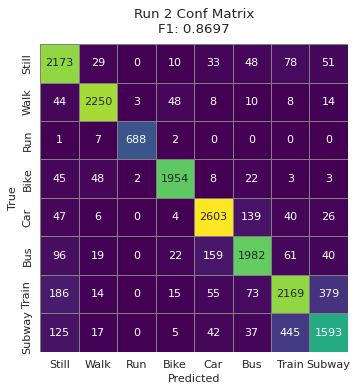


=== Run 3/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8738

Classification Report:
              precision    recall  f1-score   support

       Still     0.8048    0.9088    0.8536      2422
        Walk     0.9413    0.9480    0.9446      2385
         Run     0.9985    0.9857    0.9921       698
        Bike     0.9561    0.9400    0.9480      2085
         Car     0.8989    0.9155    0.9071      2865
         Bus     0.8682    0.8365    0.8521      2379
       Train     0.7706    0.7589    0.7647      2891
      Subway     0.7651    0.6948    0.7282      2264

    accuracy                         0.8611     17989
   macro avg     0.8754    0.8735    0.8738     17989
weighted avg     0.8608    0.8611    0.8602     1

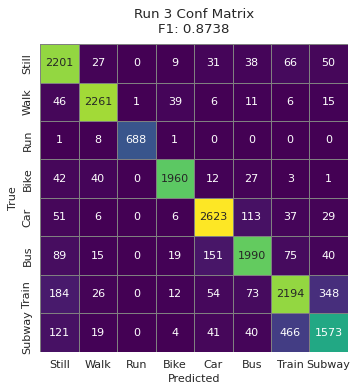


=== Run 4/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8784

Classification Report:
              precision    recall  f1-score   support

       Still     0.8065    0.9121    0.8560      2422
        Walk     0.9512    0.9480    0.9496      2385
         Run     0.9986    0.9885    0.9935       698
        Bike     0.9486    0.9468    0.9477      2085
         Car     0.9023    0.9124    0.9073      2865
         Bus     0.8653    0.8428    0.8539      2379
       Train     0.7903    0.7637    0.7768      2891
      Subway     0.7731    0.7147    0.7427      2264

    accuracy                         0.8660     17989
   macro avg     0.8795    0.8786    0.8784     17989
weighted avg     0.8658    0.8660    0.86

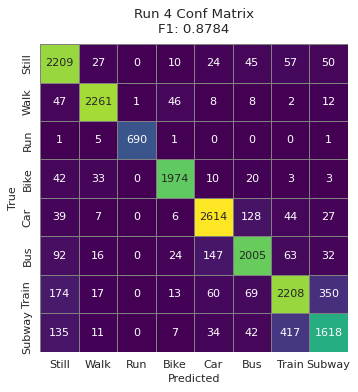


=== Run 5/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8701

Classification Report:
              precision    recall  f1-score   support

       Still     0.8052    0.9030    0.8513      2422
        Walk     0.9403    0.9438    0.9420      2385
         Run     0.9971    0.9885    0.9928       698
        Bike     0.9467    0.9362    0.9414      2085
         Car     0.8969    0.9169    0.9068      2865
         Bus     0.8614    0.8386    0.8498      2379
       Train     0.7659    0.7437    0.7547      2891
      Subway     0.7554    0.6917    0.7222      2264

    accuracy                         0.8571     17989
   macro avg     0.8711    0.8703    0.8701     17989
weighted avg     0.8564    0.8571    0.85

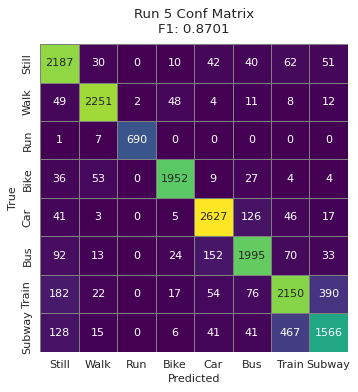


=== Run 6/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8754

Classification Report:
              precision    recall  f1-score   support

       Still     0.8055    0.9116    0.8553      2422
        Walk     0.9452    0.9480    0.9466      2385
         Run     0.9986    0.9871    0.9928       698
        Bike     0.9556    0.9396    0.9475      2085
         Car     0.9063    0.9148    0.9105      2865
         Bus     0.8608    0.8420    0.8513      2379
       Train     0.7789    0.7516    0.7650      2891
      Subway     0.7613    0.7085    0.7339      2264

    accuracy                         0.8626     17989
   macro avg     0.8765    0.8754    0.8754     17989
weighted avg     0.8624    0.8626    0.8619    

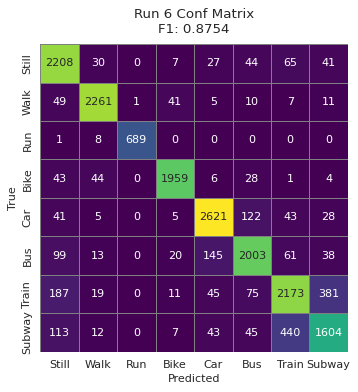


=== Run 7/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8818

Classification Report:
              precision    recall  f1-score   support

       Still     0.8122    0.9162    0.8611      2422
        Walk     0.9501    0.9493    0.9497      2385
         Run     0.9985    0.9857    0.9921       698
        Bike     0.9554    0.9463    0.9508      2085
         Car     0.9097    0.9208    0.9152      2865
         Bus     0.8841    0.8466    0.8649      2379
       Train     0.7889    0.7651    0.7768      2891
      Subway     0.7657    0.7231    0.7438      2264

    accuracy                         0.8697     17989
   macro avg     0.8831    0.8816    0.8818     17989
weighted avg     0.8697    0.8697    0.869

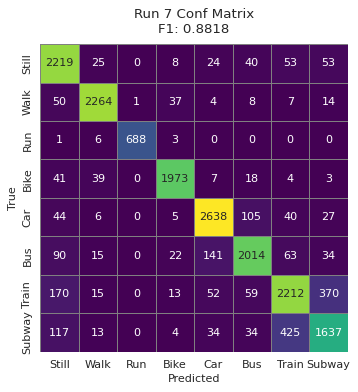


=== Run 8/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8684

Classification Report:
              precision    recall  f1-score   support

       Still     0.8019    0.9092    0.8522      2422
        Walk     0.9467    0.9455    0.9461      2385
         Run     0.9986    0.9885    0.9935       698
        Bike     0.9462    0.9367    0.9414      2085
         Car     0.8950    0.9016    0.8983      2865
         Bus     0.8634    0.8319    0.8474      2379
       Train     0.7544    0.7426    0.7485      2891
      Subway     0.7517    0.6913    0.7202      2264

    accuracy                         0.8546     17989
   macro avg     0.8697    0.8684    0.8684     17989
weighted avg     0.8545    0.8546    0.8539   

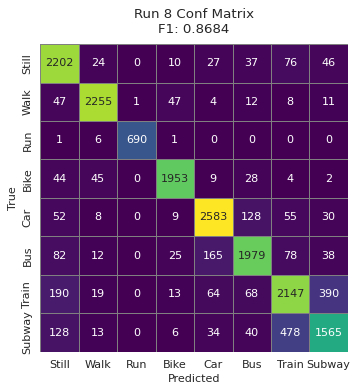


=== Run 9/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8764

Classification Report:
              precision    recall  f1-score   support

       Still     0.8067    0.9112    0.8558      2422
        Walk     0.9421    0.9488    0.9455      2385
         Run     0.9971    0.9885    0.9928       698
        Bike     0.9514    0.9391    0.9452      2085
         Car     0.9044    0.9211    0.9127      2865
         Bus     0.8748    0.8432    0.8587      2379
       Train     0.7785    0.7523    0.7652      2891
      Subway     0.7648    0.7080    0.7353      2264

    accuracy                         0.8639     17989
   macro avg     0.8775    0.8766    0.8764     17989
weighted avg     0.8636    0.8639    0.8631    

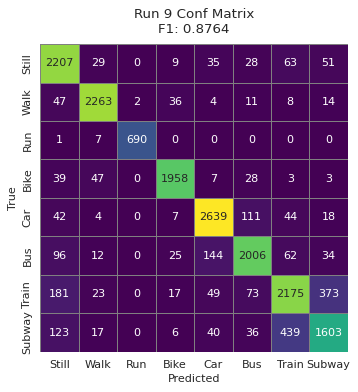


=== Run 10/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8705

Classification Report:
              precision    recall  f1-score   support

       Still     0.8005    0.9096    0.8516      2422
        Walk     0.9439    0.9451    0.9445      2385
         Run     1.0000    0.9857    0.9928       698
        Bike     0.9504    0.9376    0.9440      2085
         Car     0.8936    0.9086    0.9010      2865
         Bus     0.8648    0.8306    0.8473      2379
       Train     0.7731    0.7510    0.7619      2891
      Subway     0.7498    0.6948    0.7212      2264

    accuracy                         0.8574     17989
   macro avg     0.8720    0.8704    0.8705     17989
weighted avg     0.8572    0.8574    0.8566    

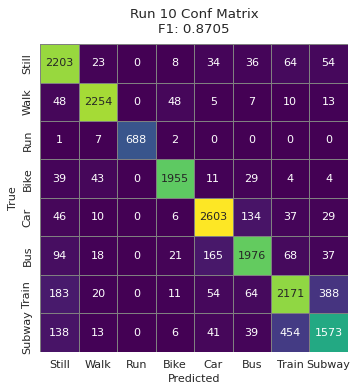


=== Run 11/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8808

Classification Report:
              precision    recall  f1-score   support

       Still     0.8034    0.9096    0.8532      2422
        Walk     0.9505    0.9493    0.9499      2385
         Run     0.9985    0.9842    0.9913       698
        Bike     0.9601    0.9463    0.9531      2085
         Car     0.9101    0.9155    0.9128      2865
         Bus     0.8695    0.8571    0.8633      2379
       Train     0.7869    0.7651    0.7759      2891
      Subway     0.7788    0.7169    0.7466      2264

    accuracy                         0.8685     17989
   macro avg     0.8822    0.8805    0.8808     17989
weighted avg     0.8686    0.8685    0.8679 

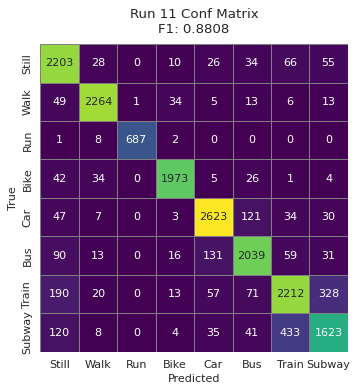


=== Run 12/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8753

Classification Report:
              precision    recall  f1-score   support

       Still     0.8099    0.9079    0.8561      2422
        Walk     0.9465    0.9497    0.9481      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9546    0.9381    0.9463      2085
         Car     0.9075    0.9113    0.9094      2865
         Bus     0.8695    0.8546    0.8620      2379
       Train     0.7654    0.7572    0.7613      2891
      Subway     0.7623    0.6957    0.7275      2264

    accuracy                         0.8626     17989
   macro avg     0.8766    0.8752    0.8753     17989
weighted avg     0.8624    0.8626    0.8619   

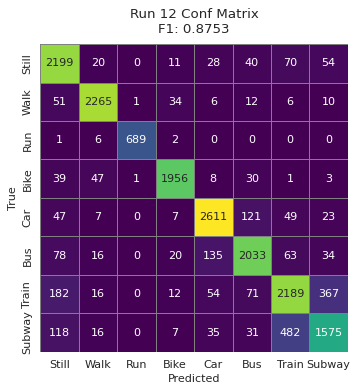


=== Run 13/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8721

Classification Report:
              precision    recall  f1-score   support

       Still     0.8036    0.9038    0.8508      2422
        Walk     0.9457    0.9426    0.9441      2385
         Run     0.9942    0.9871    0.9907       698
        Bike     0.9499    0.9362    0.9430      2085
         Car     0.8941    0.9162    0.9050      2865
         Bus     0.8647    0.8327    0.8484      2379
       Train     0.7713    0.7596    0.7654      2891
      Subway     0.7643    0.6974    0.7293      2264

    accuracy                         0.8594     17989
   macro avg     0.8735    0.8720    0.8721     17989
weighted avg     0.8591    0.8594    0.8586   

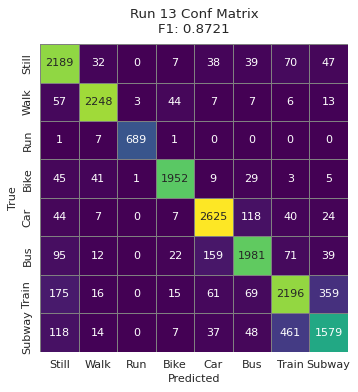


=== Run 14/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8685

Classification Report:
              precision    recall  f1-score   support

       Still     0.7973    0.9046    0.8476      2422
        Walk     0.9451    0.9451    0.9451      2385
         Run     1.0000    0.9842    0.9921       698
        Bike     0.9514    0.9381    0.9447      2085
         Car     0.8925    0.9044    0.8984      2865
         Bus     0.8634    0.8340    0.8484      2379
       Train     0.7646    0.7461    0.7553      2891
      Subway     0.7465    0.6895    0.7169      2264

    accuracy                         0.8550     17989
   macro avg     0.8701    0.8682    0.8685     17989
weighted avg     0.8549    0.8550    0.85

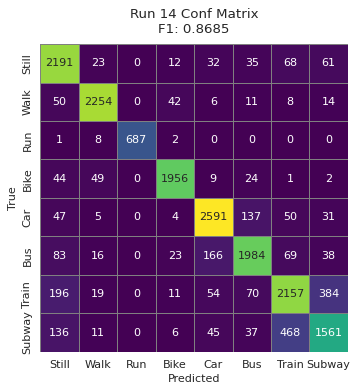


=== Run 15/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8640

Classification Report:
              precision    recall  f1-score   support

       Still     0.8010    0.8960    0.8458      2422
        Walk     0.9398    0.9430    0.9414      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9494    0.9353    0.9423      2085
         Car     0.8825    0.9040    0.8931      2865
         Bus     0.8534    0.8172    0.8349      2379
       Train     0.7534    0.7420    0.7476      2891
      Subway     0.7459    0.6860    0.7147      2264

    accuracy                         0.8500     17989
   macro avg     0.8653    0.8638    0.8640     17989
weighted avg     0.8495    0.8500    0.8491    

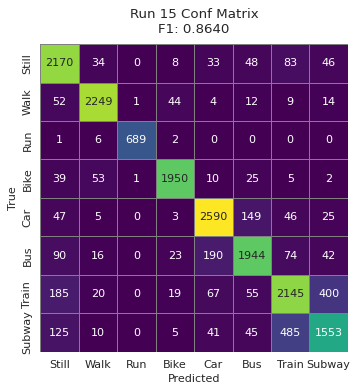


=== Run 16/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8791

Classification Report:
              precision    recall  f1-score   support

       Still     0.7997    0.9149    0.8535      2422
        Walk     0.9477    0.9501    0.9489      2385
         Run     1.0000    0.9857    0.9928       698
        Bike     0.9546    0.9477    0.9511      2085
         Car     0.9114    0.9229    0.9171      2865
         Bus     0.8804    0.8478    0.8638      2379
       Train     0.7829    0.7624    0.7725      2891
      Subway     0.7692    0.7005    0.7332      2264

    accuracy                         0.8670     17989
   macro avg     0.8807    0.8790    0.8791     17989
weighted avg     0.8670    0.8670    0.

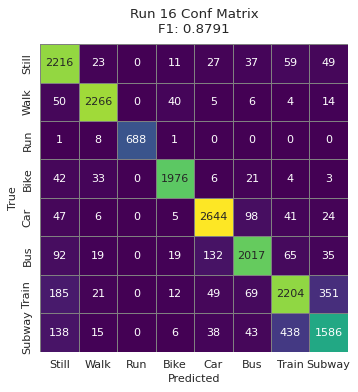


=== Run 17/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8786

Classification Report:
              precision    recall  f1-score   support

       Still     0.8077    0.9017    0.8521      2422
        Walk     0.9472    0.9480    0.9476      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9531    0.9458    0.9494      2085
         Car     0.9094    0.9211    0.9152      2865
         Bus     0.8668    0.8449    0.8557      2379
       Train     0.7834    0.7717    0.7775      2891
      Subway     0.7743    0.7076    0.7394      2264

    accuracy                         0.8665     17989
   macro avg     0.8799    0.8785    0.8786     17989
weighted avg     0.8663    0.8665    0.8658 

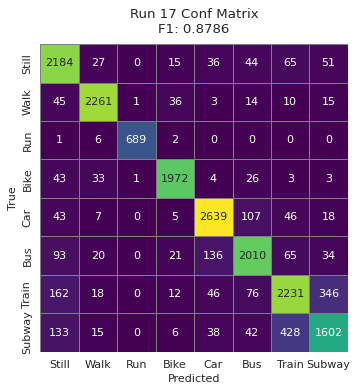


=== Run 18/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8766

Classification Report:
              precision    recall  f1-score   support

       Still     0.8079    0.9013    0.8521      2422
        Walk     0.9432    0.9472    0.9452      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9586    0.9448    0.9517      2085
         Car     0.9080    0.9159    0.9119      2865
         Bus     0.8708    0.8474    0.8590      2379
       Train     0.7782    0.7572    0.7675      2891
      Subway     0.7570    0.7116    0.7336      2264

    accuracy                         0.8639     17989
   macro avg     0.8776    0.8766    0.8766     17989
weighted avg     0.8637    0.8639    0.8

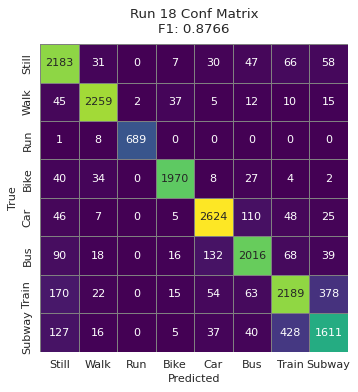


=== Run 19/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8780

Classification Report:
              precision    recall  f1-score   support

       Still     0.8091    0.9100    0.8566      2422
        Walk     0.9499    0.9468    0.9483      2385
         Run     0.9971    0.9857    0.9914       698
        Bike     0.9525    0.9420    0.9472      2085
         Car     0.9074    0.9201    0.9137      2865
         Bus     0.8778    0.8512    0.8643      2379
       Train     0.7804    0.7534    0.7666      2891
      Subway     0.7586    0.7147    0.7360      2264

    accuracy                         0.8656     17989
   macro avg     0.8791    0.8780    0.8780     17989
weighted avg     0.8654    0.8656    0.86

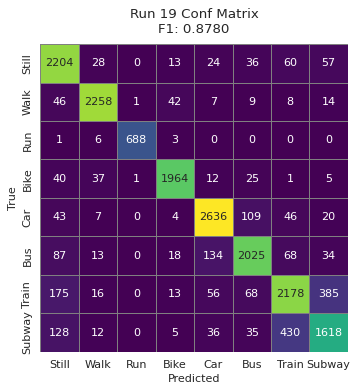


=== Run 20/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8682

Classification Report:
              precision    recall  f1-score   support

       Still     0.8018    0.9067    0.8510      2422
        Walk     0.9417    0.9413    0.9415      2385
         Run     0.9971    0.9828    0.9899       698
        Bike     0.9430    0.9357    0.9393      2085
         Car     0.8922    0.9075    0.8998      2865
         Bus     0.8575    0.8319    0.8445      2379
       Train     0.7665    0.7572    0.7618      2891
      Subway     0.7592    0.6811    0.7180      2264

    accuracy                         0.8554     17989
   macro avg     0.8699    0.8680    0.8682     17989
weighted avg     0.8550    0.8554    0.8

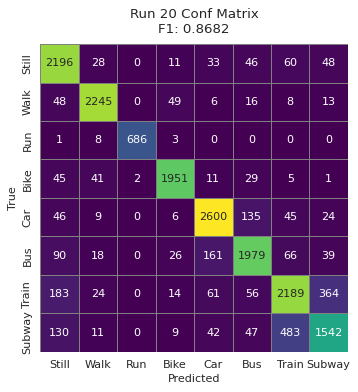


=== Run 21/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8796

Classification Report:
              precision    recall  f1-score   support

       Still     0.8046    0.9182    0.8577      2422
        Walk     0.9456    0.9476    0.9466      2385
         Run     0.9971    0.9900    0.9935       698
        Bike     0.9585    0.9405    0.9494      2085
         Car     0.9034    0.9201    0.9116      2865
         Bus     0.8802    0.8491    0.8644      2379
       Train     0.7859    0.7516    0.7684      2891
      Subway     0.7710    0.7213    0.7453      2264

    accuracy                         0.8671     17989
   macro avg     0.8808    0.8798    0.8796     17989
weighted avg     0.8671    0.8671    0.8

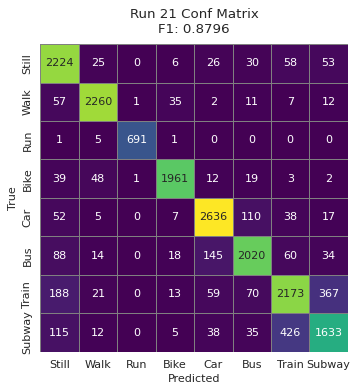


=== Run 22/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8702

Classification Report:
              precision    recall  f1-score   support

       Still     0.8082    0.8976    0.8505      2422
        Walk     0.9445    0.9426    0.9435      2385
         Run     0.9942    0.9857    0.9899       698
        Bike     0.9477    0.9386    0.9431      2085
         Car     0.8915    0.9061    0.8987      2865
         Bus     0.8602    0.8352    0.8475      2379
       Train     0.7653    0.7589    0.7621      2891
      Subway     0.7593    0.6952    0.7258      2264

    accuracy                         0.8571     17989
   macro avg     0.8714    0.8700    0.8702     17989
weighted avg     0.8567    0.8571    0.856

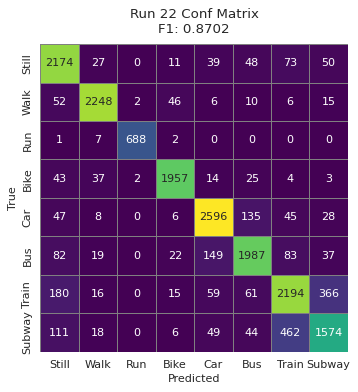


=== Run 23/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8741

Classification Report:
              precision    recall  f1-score   support

       Still     0.8012    0.9083    0.8514      2422
        Walk     0.9444    0.9472    0.9458      2385
         Run     0.9971    0.9857    0.9914       698
        Bike     0.9604    0.9424    0.9513      2085
         Car     0.9052    0.9169    0.9110      2865
         Bus     0.8617    0.8462    0.8539      2379
       Train     0.7786    0.7458    0.7618      2891
      Subway     0.7533    0.7014    0.7264      2264

    accuracy                         0.8614     17989
   macro avg     0.8752    0.8742    0.8741     17989
weighted avg     0.8612    0.8614    0.8606   

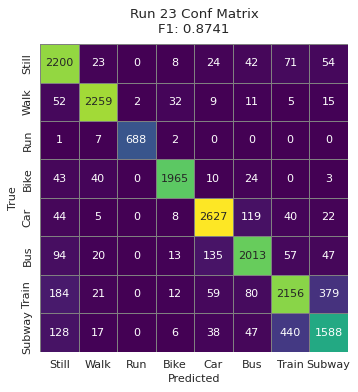


=== Run 24/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8776

Classification Report:
              precision    recall  f1-score   support

       Still     0.8101    0.9071    0.8559      2422
        Walk     0.9469    0.9488    0.9479      2385
         Run     0.9971    0.9900    0.9935       698
        Bike     0.9520    0.9420    0.9470      2085
         Car     0.9029    0.9155    0.9092      2865
         Bus     0.8684    0.8432    0.8556      2379
       Train     0.7844    0.7613    0.7727      2891
      Subway     0.7664    0.7142    0.7394      2264

    accuracy                         0.8651     17989
   macro avg     0.8785    0.8778    0.8776     17989
weighted avg     0.8648    0.8651    0.8644

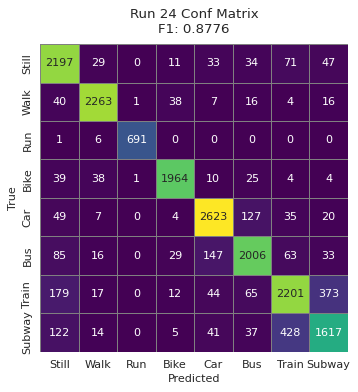


=== Run 25/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8819

Classification Report:
              precision    recall  f1-score   support

       Still     0.8036    0.9174    0.8568      2422
        Walk     0.9486    0.9518    0.9502      2385
         Run     1.0000    0.9857    0.9928       698
        Bike     0.9592    0.9468    0.9529      2085
         Car     0.9162    0.9232    0.9197      2865
         Bus     0.8846    0.8504    0.8671      2379
       Train     0.7843    0.7672    0.7757      2891
      Subway     0.7724    0.7107    0.7403      2264

    accuracy                         0.8699     17989
   macro avg     0.8836    0.8816    0.8819     17989
weighted avg     0.8701    0.8699    0.8693

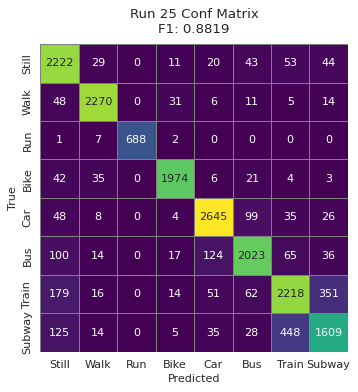


=== Run 26/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8734

Classification Report:
              precision    recall  f1-score   support

       Still     0.8071    0.9071    0.8542      2422
        Walk     0.9432    0.9463    0.9447      2385
         Run     0.9942    0.9871    0.9907       698
        Bike     0.9543    0.9424    0.9484      2085
         Car     0.9021    0.9037    0.9029      2865
         Bus     0.8585    0.8390    0.8486      2379
       Train     0.7749    0.7537    0.7642      2891
      Subway     0.7598    0.7098    0.7340      2264

    accuracy                         0.8605     17989
   macro avg     0.8743    0.8736    0.8734     17989
weighted avg     0.8603    0.8605    0.8598  

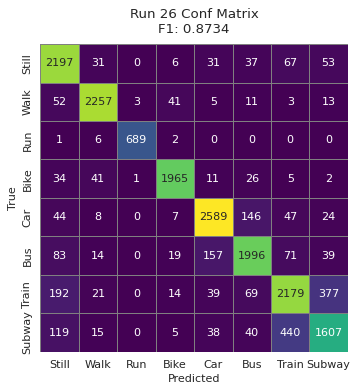


=== Run 27/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8777

Classification Report:
              precision    recall  f1-score   support

       Still     0.8061    0.9199    0.8592      2422
        Walk     0.9481    0.9488    0.9484      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9568    0.9458    0.9513      2085
         Car     0.9081    0.9145    0.9113      2865
         Bus     0.8733    0.8403    0.8565      2379
       Train     0.7796    0.7551    0.7672      2891
      Subway     0.7623    0.7111    0.7358      2264

    accuracy                         0.8652     17989
   macro avg     0.8789    0.8778    0.8777     17989
weighted avg     0.8652    0.8652    0.86

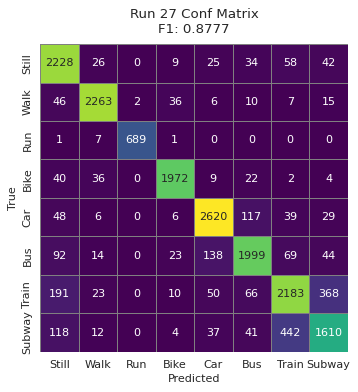


=== Run 28/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8692

Classification Report:
              precision    recall  f1-score   support

       Still     0.8069    0.9059    0.8535      2422
        Walk     0.9418    0.9434    0.9426      2385
         Run     0.9957    0.9900    0.9928       698
        Bike     0.9492    0.9415    0.9453      2085
         Car     0.8968    0.9037    0.9002      2865
         Bus     0.8559    0.8264    0.8409      2379
       Train     0.7632    0.7548    0.7590      2891
      Subway     0.7519    0.6895    0.7194      2264

    accuracy                         0.8559     17989
   macro avg     0.8702    0.8694    0.8692     17989
weighted avg     0.8555    0.8559    0.8551  

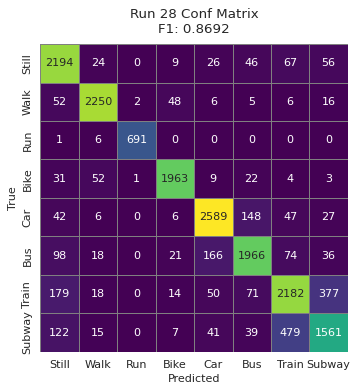


=== Run 29/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8655

Classification Report:
              precision    recall  f1-score   support

       Still     0.8048    0.9005    0.8500      2422
        Walk     0.9435    0.9459    0.9447      2385
         Run     1.0000    0.9871    0.9935       698
        Bike     0.9540    0.9357    0.9448      2085
         Car     0.8851    0.9033    0.8941      2865
         Bus     0.8542    0.8302    0.8420      2379
       Train     0.7570    0.7337    0.7451      2891
      Subway     0.7349    0.6868    0.7100      2264

    accuracy                         0.8514     17989
   macro avg     0.8667    0.8654    0.8655     17989
weighted avg     0.8509    0.8514    0.850

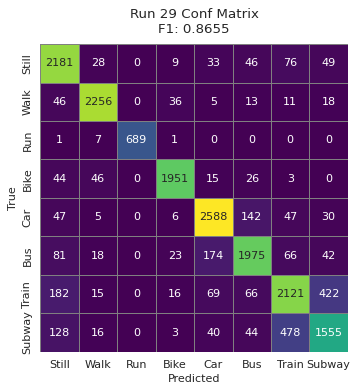


=== Run 30/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8786

Classification Report:
              precision    recall  f1-score   support

       Still     0.8038    0.9187    0.8574      2422
        Walk     0.9540    0.9480    0.9510      2385
         Run     0.9986    0.9871    0.9928       698
        Bike     0.9540    0.9448    0.9494      2085
         Car     0.9048    0.9152    0.9099      2865
         Bus     0.8728    0.8390    0.8556      2379
       Train     0.7815    0.7696    0.7755      2891
      Subway     0.7728    0.7045    0.7371      2264

    accuracy                         0.8663     17989
   macro avg     0.8803    0.8784    0.8786     17989
weighted avg     0.8664    0.8663    0.865

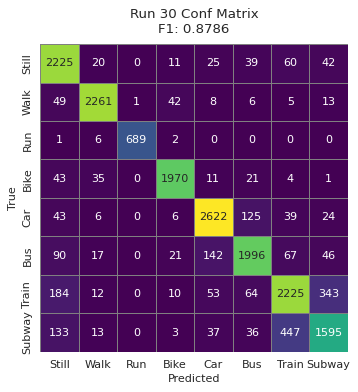


=== Run 31/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8660

Classification Report:
              precision    recall  f1-score   support

       Still     0.7962    0.9063    0.8477      2422
        Walk     0.9444    0.9396    0.9420      2385
         Run     0.9985    0.9814    0.9899       698
        Bike     0.9448    0.9367    0.9408      2085
         Car     0.8903    0.9037    0.8969      2865
         Bus     0.8495    0.8260    0.8376      2379
       Train     0.7621    0.7458    0.7538      2891
      Subway     0.7554    0.6860    0.7190      2264

    accuracy                         0.8526     17989
   macro avg     0.8677    0.8657    0.8660     17989
weighted avg     0.8523    0.8526    0.8517    

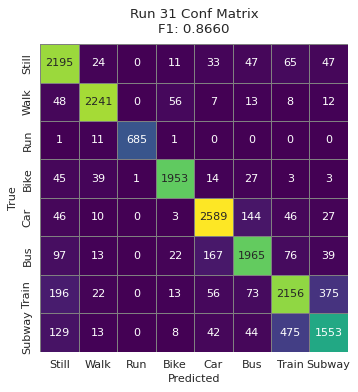


=== Run 32/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8688

Classification Report:
              precision    recall  f1-score   support

       Still     0.8015    0.8988    0.8474      2422
        Walk     0.9413    0.9417    0.9415      2385
         Run     0.9957    0.9857    0.9906       698
        Bike     0.9489    0.9357    0.9423      2085
         Car     0.8951    0.9054    0.9002      2865
         Bus     0.8634    0.8369    0.8499      2379
       Train     0.7609    0.7561    0.7585      2891
      Subway     0.7547    0.6877    0.7197      2264

    accuracy                         0.8555     17989
   macro avg     0.8702    0.8685    0.8688     17989
weighted avg     0.8553    0.8555    0.8548    

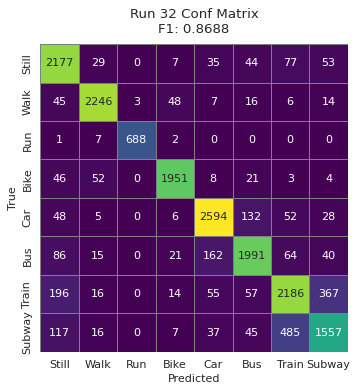


=== Run 33/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8695

Classification Report:
              precision    recall  f1-score   support

       Still     0.8037    0.9030    0.8505      2422
        Walk     0.9447    0.9463    0.9455      2385
         Run     0.9986    0.9871    0.9928       698
        Bike     0.9490    0.9367    0.9428      2085
         Car     0.8956    0.9099    0.9027      2865
         Bus     0.8566    0.8264    0.8412      2379
       Train     0.7695    0.7516    0.7605      2891
      Subway     0.7482    0.6943    0.7203      2264

    accuracy                         0.8563     17989
   macro avg     0.8707    0.8694    0.8695     17989
weighted avg     0.8560    0.8563    0.8555  

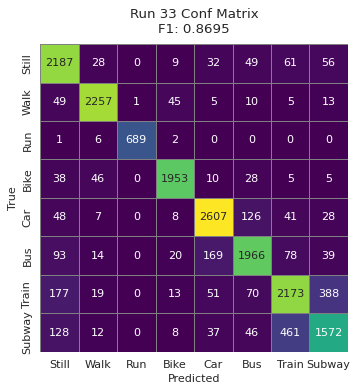


=== Run 34/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8720

Classification Report:
              precision    recall  f1-score   support

       Still     0.8062    0.9067    0.8535      2422
        Walk     0.9444    0.9468    0.9456      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9496    0.9391    0.9443      2085
         Car     0.8944    0.9166    0.9054      2865
         Bus     0.8778    0.8361    0.8564      2379
       Train     0.7645    0.7478    0.7561      2891
      Subway     0.7523    0.6948    0.7224      2264

    accuracy                         0.8589     17989
   macro avg     0.8733    0.8719    0.8720     17989
weighted avg     0.8586    0.8589    0.8581

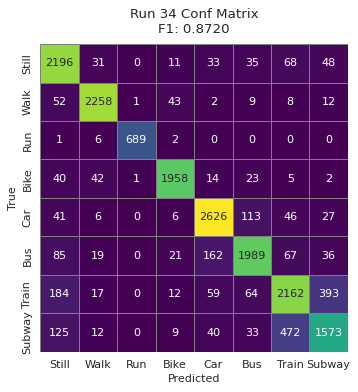


=== Run 35/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8741

Classification Report:
              precision    recall  f1-score   support

       Still     0.8040    0.9042    0.8511      2422
        Walk     0.9476    0.9472    0.9474      2385
         Run     1.0000    0.9857    0.9928       698
        Bike     0.9547    0.9400    0.9473      2085
         Car     0.8982    0.9120    0.9051      2865
         Bus     0.8630    0.8394    0.8511      2379
       Train     0.7747    0.7554    0.7650      2891
      Subway     0.7622    0.7063    0.7331      2264

    accuracy                         0.8611     17989
   macro avg     0.8755    0.8738    0.8741     17989
weighted avg     0.8609    0.8611    0.8604   

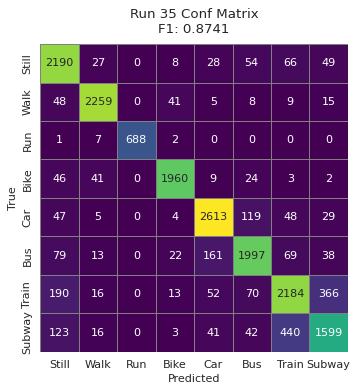


=== Run 36/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8759

Classification Report:
              precision    recall  f1-score   support

       Still     0.8042    0.9104    0.8540      2422
        Walk     0.9436    0.9468    0.9452      2385
         Run     0.9986    0.9871    0.9928       698
        Bike     0.9510    0.9396    0.9452      2085
         Car     0.9075    0.9145    0.9110      2865
         Bus     0.8722    0.8462    0.8590      2379
       Train     0.7796    0.7561    0.7677      2891
      Subway     0.7596    0.7063    0.7320      2264

    accuracy                         0.8632     17989
   macro avg     0.8770    0.8759    0.8759     17989
weighted avg     0.8631    0.8632    0.862

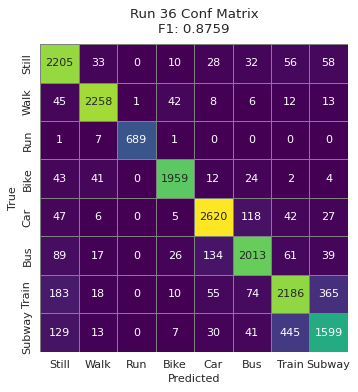


=== Run 37/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8649

Classification Report:
              precision    recall  f1-score   support

       Still     0.8074    0.8898    0.8466      2422
        Walk     0.9347    0.9430    0.9388      2385
         Run     0.9957    0.9842    0.9899       698
        Bike     0.9469    0.9319    0.9393      2085
         Car     0.8912    0.9037    0.8974      2865
         Bus     0.8512    0.8323    0.8417      2379
       Train     0.7603    0.7471    0.7537      2891
      Subway     0.7400    0.6864    0.7122      2264

    accuracy                         0.8515     17989
   macro avg     0.8659    0.8648    0.8649     17989
weighted avg     0.8509    0.8515    0.8507     

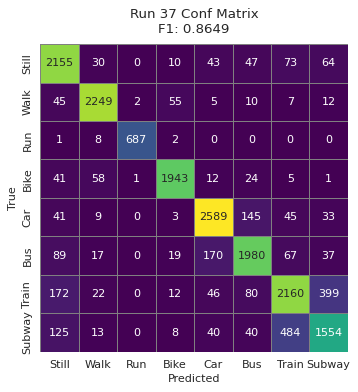


=== Run 38/50 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8728

Classification Report:
              precision    recall  f1-score   support

       Still     0.8027    0.9055    0.8510      2422
        Walk     0.9471    0.9468    0.9469      2385
         Run     0.9986    0.9885    0.9935       698
        Bike     0.9566    0.9420    0.9493      2085
         Car     0.8943    0.9120    0.9031      2865
         Bus     0.8657    0.8369    0.8510      2379
       Train     0.7751    0.7485    0.7616      2891
      Subway     0.7518    0.7023    0.7262      2264

    accuracy                         0.8596     17989
   macro avg     0.8740    0.8728    0.8728     17989
weighted avg     0.8594    0.8596    0.8589 

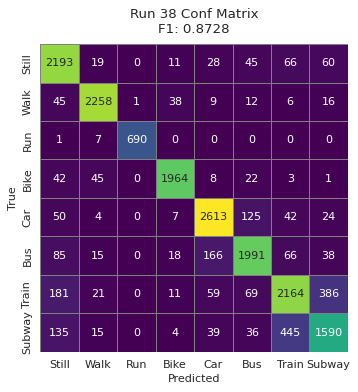


=== Run 39/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8756

Classification Report:
              precision    recall  f1-score   support

       Still     0.8039    0.9071    0.8524      2422
        Walk     0.9425    0.9476    0.9450      2385
         Run     0.9942    0.9857    0.9899       698
        Bike     0.9598    0.9400    0.9498      2085
         Car     0.9012    0.9141    0.9076      2865
         Bus     0.8705    0.8394    0.8547      2379
       Train     0.7751    0.7558    0.7653      2891
      Subway     0.7682    0.7142    0.7402      2264

    accuracy                         0.8629     17989
   macro avg     0.8769    0.8755    0.8756     17989
weighted avg     0.8629    0.8629    0.8623   

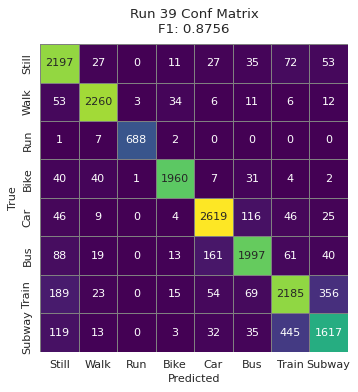


=== Run 40/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8766

Classification Report:
              precision    recall  f1-score   support

       Still     0.7980    0.9088    0.8498      2422
        Walk     0.9481    0.9497    0.9489      2385
         Run     0.9971    0.9885    0.9928       698
        Bike     0.9581    0.9429    0.9504      2085
         Car     0.8988    0.9148    0.9068      2865
         Bus     0.8724    0.8361    0.8538      2379
       Train     0.7801    0.7586    0.7692      2891
      Subway     0.7714    0.7125    0.7408      2264

    accuracy                         0.8638     17989
   macro avg     0.8780    0.8765    0.8766     17989
weighted avg     0.8639    0.8638    0.8631  

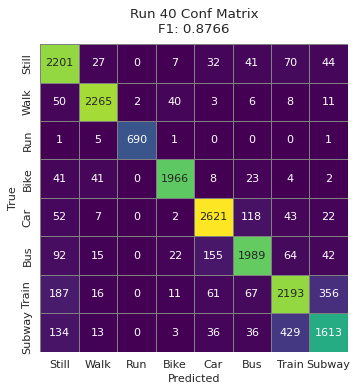


=== Run 41/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8698

Classification Report:
              precision    recall  f1-score   support

       Still     0.8010    0.9059    0.8502      2422
        Walk     0.9401    0.9417    0.9409      2385
         Run     0.9971    0.9857    0.9914       698
        Bike     0.9500    0.9381    0.9440      2085
         Car     0.9018    0.9103    0.9060      2865
         Bus     0.8646    0.8377    0.8510      2379
       Train     0.7709    0.7520    0.7613      2891
      Subway     0.7427    0.6873    0.7139      2264

    accuracy                         0.8569     17989
   macro avg     0.8710    0.8698    0.8698     17989
weighted avg     0.8566    0.8569    0.8561   

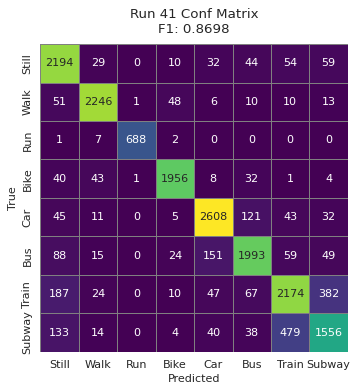


=== Run 42/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8719

Classification Report:
              precision    recall  f1-score   support

       Still     0.8031    0.9112    0.8538      2422
        Walk     0.9436    0.9472    0.9454      2385
         Run     0.9957    0.9842    0.9899       698
        Bike     0.9509    0.9386    0.9447      2085
         Car     0.8993    0.9134    0.9063      2865
         Bus     0.8765    0.8352    0.8554      2379
       Train     0.7705    0.7513    0.7608      2891
      Subway     0.7466    0.6935    0.7190      2264

    accuracy                         0.8592     17989
   macro avg     0.8733    0.8718    0.8719     17989
weighted avg     0.8590    0.8592    0.8584    

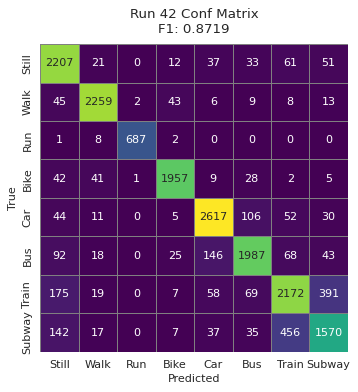


=== Run 43/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8683

Classification Report:
              precision    recall  f1-score   support

       Still     0.8052    0.8976    0.8489      2422
        Walk     0.9441    0.9413    0.9427      2385
         Run     0.9942    0.9842    0.9892       698
        Bike     0.9438    0.9420    0.9429      2085
         Car     0.8961    0.9065    0.9013      2865
         Bus     0.8561    0.8277    0.8416      2379
       Train     0.7651    0.7513    0.7581      2891
      Subway     0.7493    0.6957    0.7215      2264

    accuracy                         0.8551     17989
   macro avg     0.8692    0.8683    0.8683     17989
weighted avg     0.8547    0.8551    0.8544

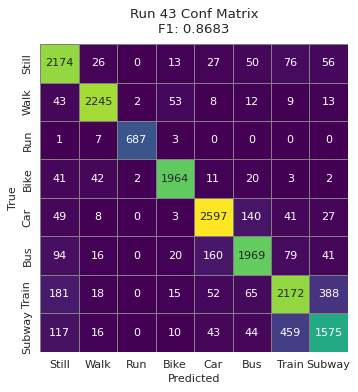


=== Run 44/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8769

Classification Report:
              precision    recall  f1-score   support

       Still     0.8065    0.9050    0.8529      2422
        Walk     0.9454    0.9514    0.9484      2385
         Run     0.9957    0.9871    0.9914       698
        Bike     0.9580    0.9400    0.9489      2085
         Car     0.9115    0.9169    0.9142      2865
         Bus     0.8798    0.8550    0.8672      2379
       Train     0.7739    0.7471    0.7603      2891
      Subway     0.7514    0.7129    0.7316      2264

    accuracy                         0.8641     17989
   macro avg     0.8778    0.8769    0.8769     17989
weighted avg     0.8641    0.8641    0.8636 

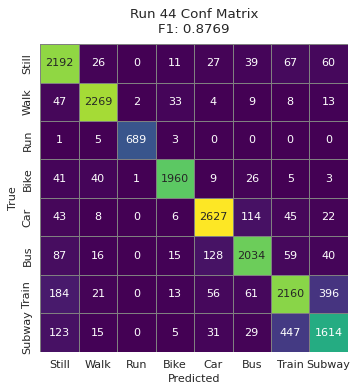


=== Run 45/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8652

Classification Report:
              precision    recall  f1-score   support

       Still     0.8063    0.8972    0.8493      2422
        Walk     0.9406    0.9434    0.9420      2385
         Run     0.9913    0.9799    0.9856       698
        Bike     0.9481    0.9367    0.9423      2085
         Car     0.8958    0.9030    0.8994      2865
         Bus     0.8495    0.8256    0.8373      2379
       Train     0.7562    0.7423    0.7492      2891
      Subway     0.7417    0.6926    0.7163      2264

    accuracy                         0.8519     17989
   macro avg     0.8662    0.8651    0.8652     17989
weighted avg     0.8515    0.8519    0.8512

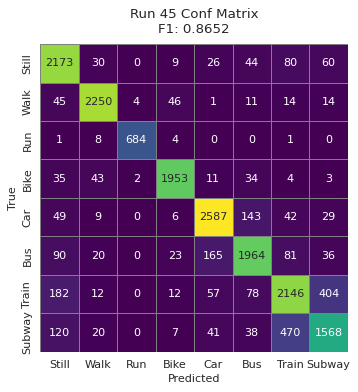


=== Run 46/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8768

Classification Report:
              precision    recall  f1-score   support

       Still     0.8099    0.9075    0.8559      2422
        Walk     0.9500    0.9472    0.9486      2385
         Run     0.9971    0.9871    0.9921       698
        Bike     0.9530    0.9444    0.9487      2085
         Car     0.9087    0.9169    0.9128      2865
         Bus     0.8686    0.8445    0.8564      2379
       Train     0.7745    0.7613    0.7678      2891
      Subway     0.7617    0.7045    0.7320      2264

    accuracy                         0.8643     17989
   macro avg     0.8779    0.8767    0.8768     17989
weighted avg     0.8640    0.8643    0.86

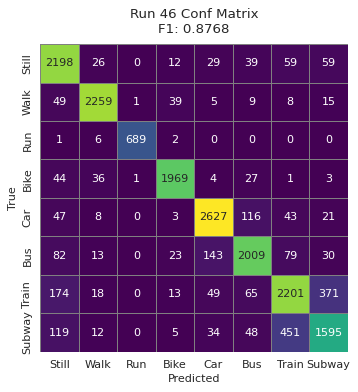


=== Run 47/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8653

Classification Report:
              precision    recall  f1-score   support

       Still     0.8022    0.8993    0.8480      2422
        Walk     0.9412    0.9455    0.9433      2385
         Run     0.9985    0.9828    0.9906       698
        Bike     0.9421    0.9357    0.9389      2085
         Car     0.8897    0.9037    0.8966      2865
         Bus     0.8523    0.8197    0.8357      2379
       Train     0.7623    0.7475    0.7548      2891
      Subway     0.7446    0.6864    0.7143      2264

    accuracy                         0.8519     17989
   macro avg     0.8666    0.8651    0.8653     17989
weighted avg     0.8513    0.8519    0.8510     

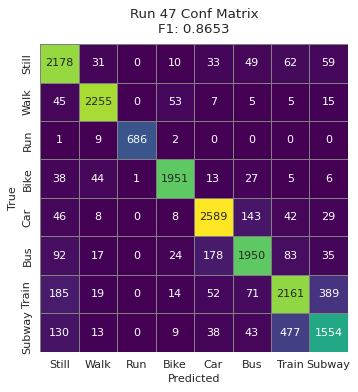


=== Run 48/50 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8712

Classification Report:
              precision    recall  f1-score   support

       Still     0.8068    0.9017    0.8516      2422
        Walk     0.9498    0.9438    0.9468      2385
         Run     0.9928    0.9828    0.9878       698
        Bike     0.9443    0.9434    0.9439      2085
         Car     0.8962    0.9075    0.9018      2865
         Bus     0.8650    0.8377    0.8512      2379
       Train     0.7683    0.7537    0.7610      2891
      Subway     0.7549    0.6992    0.7260      2264

    accuracy                         0.8585     17989
   macro avg     0.8723    0.8712    0.8712     17989
weighted avg     0.8581    0.8585    0.8578

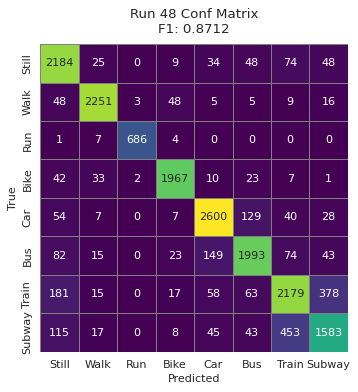


=== Run 49/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8745

Classification Report:
              precision    recall  f1-score   support

       Still     0.8009    0.9100    0.8520      2422
        Walk     0.9460    0.9468    0.9464      2385
         Run     0.9971    0.9885    0.9928       698
        Bike     0.9534    0.9420    0.9476      2085
         Car     0.8975    0.9138    0.9056      2865
         Bus     0.8710    0.8344    0.8523      2379
       Train     0.7753    0.7565    0.7658      2891
      Subway     0.7660    0.7041    0.7337      2264

    accuracy                         0.8616     17989
   macro avg     0.8759    0.8745    0.8745     17989
weighted avg     0.8616    0.8616    0.860

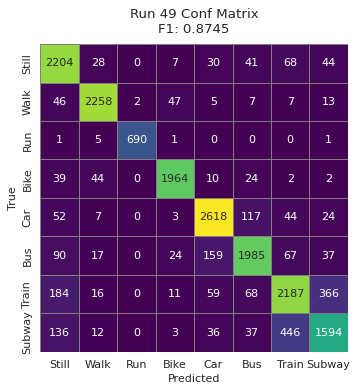


=== Run 50/50 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.8768

Classification Report:
              precision    recall  f1-score   support

       Still     0.8057    0.9108    0.8550      2422
        Walk     0.9487    0.9468    0.9477      2385
         Run     0.9985    0.9857    0.9921       698
        Bike     0.9533    0.9396    0.9464      2085
         Car     0.9066    0.9176    0.9121      2865
         Bus     0.8743    0.8478    0.8609      2379
       Train     0.7830    0.7589    0.7708      2891
      Subway     0.7550    0.7063    0.7298      2264

    accuracy                         0.8644     17989
   macro avg     0.8781    0.8767    0.8768     17989
weighted avg     0.8644    0.8644    0.863

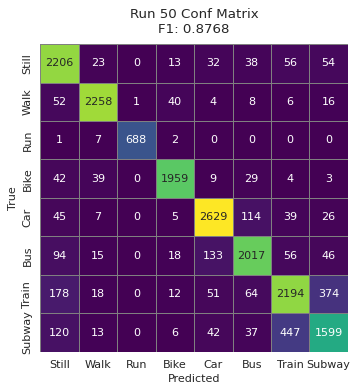


Best CatBoost params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'}
Best test-set macro F1: 0.8819


In [23]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# ** New import **
from catboost import CatBoostClassifier  

# === 0. Number of random configs ===
n_iter_search = 50

# === 0.b CLEAN-UP df_wide ===
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
df_wide.dropna(axis=1, how='all', inplace=True)
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)

# === 1. Sample data (10%) ===
df_sample = df_wide.sample(frac=0.1, random_state=42).reset_index(drop=True)
print("Sampled shape (10%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Features & labels ===
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# === 4. Encode y for multiclass (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Hyperparameter space for CatBoost ===
param_dist = {
    # core parameters
    'iterations':        [500, 750, 1000],
    'learning_rate':     [0.2, 0.3, 0.4],
    'depth':             [6, 8, 10],

    # sampling & bagging
    'bootstrap_type':       ['Bayesian','Bernoulli'],

    # tree growth
    'grow_policy':       ['Lossguide'],
    'min_data_in_leaf':  [1, 5, 10],
    'max_leaves':        [31, 64, 128],

    # regularization
    'l2_leaf_reg':       [1, 3, 5, 7],
    'random_strength':   [1, 5, 10],
    'rsm':               [1],

    # categorical & feature interactions
    'one_hot_max_size':  [2, 10, 20],
    'max_ctr_complexity':[1, 2, 3],

    # overfitting detection
    'od_type':           ['Iter','IncToDec'],
    'od_wait':           [20, 50, 100],
}

param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

best_f1, best_params = -1.0, None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")

    # — Instantiate CatBoost with GPU
    model = CatBoostClassifier(
        task_type='GPU',      # GPU acceleration
        devices='0',
        verbose=0,
        **params
    )

    model.fit(X_train, y_train_enc, 
              eval_set=(X_test, y_test_enc),
              early_stopping_rounds=30)

    y_pred = model.predict(X_test)
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro F1: {f1:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred,
                                target_names=labels, digits=4))

    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Conf Matrix\nF1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.tight_layout(); plt.show()

    if f1 > best_f1:
        best_f1, best_params = f1, params

print("\n" + "="*50)
print("Best CatBoost params:", best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*50)


Sampled shape (100%): (899444, 964)
Mode distribution in sample:
 mode
5.0    143312
7.0    142460
1.0    121692
6.0    120648
2.0    119076
8.0    112704
4.0    103520
3.0     36032
Name: count, dtype: int64

=== Run 1/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9123

Classification Report:
              precision    recall  f1-score   support

       Still     0.8567    0.9168    0.8857     24338
        Walk     0.9569    0.9451    0.9510     23815
         Run     0.9944    0.9876    0.9910      7206
        Bike     0.9625    0.9547    0.9586     20704
         Car     0.9430    0.9454    0.9442     28663
         Bus     0.9029    0.8991    0.9010     24130
       Train     0.8484    0.8351    0.8417     284

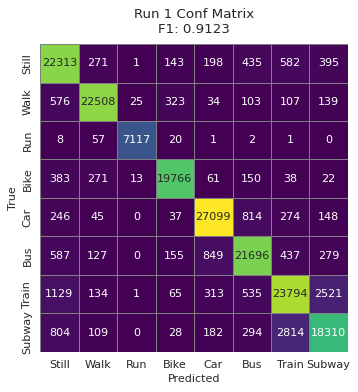


=== Run 2/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9092

Classification Report:
              precision    recall  f1-score   support

       Still     0.8469    0.9201    0.8820     24338
        Walk     0.9548    0.9450    0.9498     23815
         Run     0.9950    0.9875    0.9912      7206
        Bike     0.9607    0.9531    0.9569     20704
         Car     0.9372    0.9419    0.9396     28663
         Bus     0.9012    0.8886    0.8949     24130
       Train     0.8434    0.8300    0.8366     28492
      Subway     0.8412    0.8041    0.8223     22541

    accuracy                         0.9003    179889
   macro avg     0.9100    0.9088    0.9092    179889
weighted avg     0.9006    0.9003    0.90

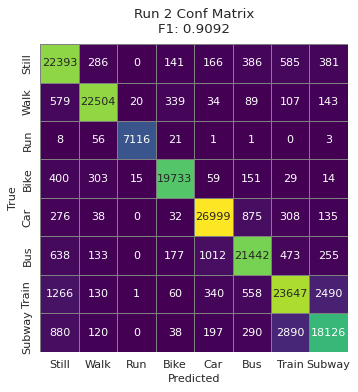


=== Run 3/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9133

Classification Report:
              precision    recall  f1-score   support

       Still     0.8489    0.9268    0.8861     24338
        Walk     0.9589    0.9471    0.9530     23815
         Run     0.9952    0.9876    0.9914      7206
        Bike     0.9646    0.9570    0.9608     20704
         Car     0.9409    0.9456    0.9433     28663
         Bus     0.9081    0.8959    0.9020     24130
       Train     0.8506    0.8335    0.8420     28492
      Subway     0.8461    0.8099    0.8276     22541

    accuracy                         0.9048    179889
   macro avg     0.9142    0.9129    0.9133    179889
weighted avg     0.9052    0.9048    0.9047    1

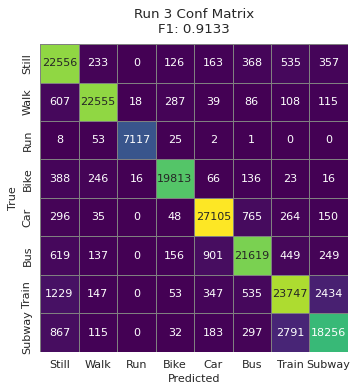


=== Run 4/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9149

Classification Report:
              precision    recall  f1-score   support

       Still     0.8489    0.9283    0.8868     24338
        Walk     0.9571    0.9460    0.9515     23815
         Run     0.9965    0.9872    0.9918      7206
        Bike     0.9634    0.9560    0.9597     20704
         Car     0.9432    0.9497    0.9464     28663
         Bus     0.9117    0.8976    0.9046     24130
       Train     0.8536    0.8376    0.8455     28492
      Subway     0.8534    0.8131    0.8328     22541

    accuracy                         0.9067    179889
   macro avg     0.9160    0.9144    0.9149    179889
weighted avg     0.9071    0.9067    0.9

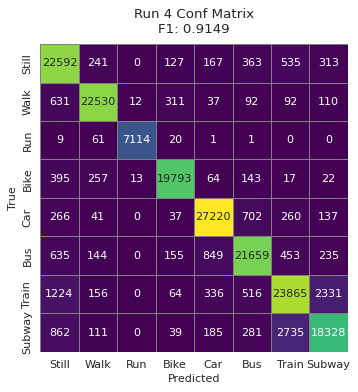


=== Run 5/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9088

Classification Report:
              precision    recall  f1-score   support

       Still     0.8457    0.9209    0.8817     24338
        Walk     0.9557    0.9437    0.9497     23815
         Run     0.9944    0.9871    0.9907      7206
        Bike     0.9602    0.9519    0.9560     20704
         Car     0.9386    0.9418    0.9402     28663
         Bus     0.8996    0.8909    0.8953     24130
       Train     0.8425    0.8280    0.8352     28492
      Subway     0.8406    0.8031    0.8214     22541

    accuracy                         0.9000    179889
   macro avg     0.9097    0.9084    0.9088    179889
weighted avg     0.9003    0.9000    0.8

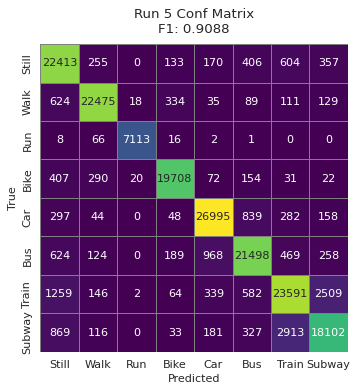


=== Run 6/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9158

Classification Report:
              precision    recall  f1-score   support

       Still     0.8519    0.9271    0.8879     24338
        Walk     0.9574    0.9478    0.9526     23815
         Run     0.9962    0.9881    0.9921      7206
        Bike     0.9655    0.9564    0.9609     20704
         Car     0.9454    0.9471    0.9463     28663
         Bus     0.9087    0.9003    0.9045     24130
       Train     0.8546    0.8403    0.8474     28492
      Subway     0.8540    0.8159    0.8345     22541

    accuracy                         0.9076    179889
   macro avg     0.9167    0.9154    0.9158    179889
weighted avg     0.9079    0.9076    0.9075   

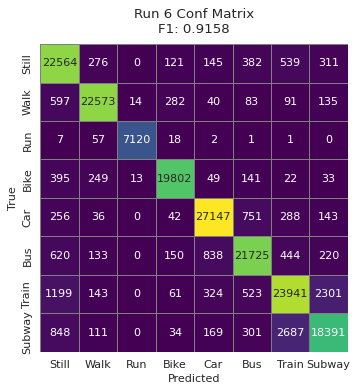


=== Run 7/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9222

Classification Report:
              precision    recall  f1-score   support

       Still     0.8623    0.9263    0.8932     24338
        Walk     0.9617    0.9523    0.9570     23815
         Run     0.9966    0.9892    0.9929      7206
        Bike     0.9688    0.9606    0.9647     20704
         Car     0.9540    0.9560    0.9550     28663
         Bus     0.9221    0.9128    0.9174     24130
       Train     0.8605    0.8505    0.8555     28492
      Subway     0.8576    0.8261    0.8415     22541

    accuracy                         0.9146    179889
   macro avg     0.9230    0.9217    0.9222    179889
weighted avg     0.9149    0.9146    0.91

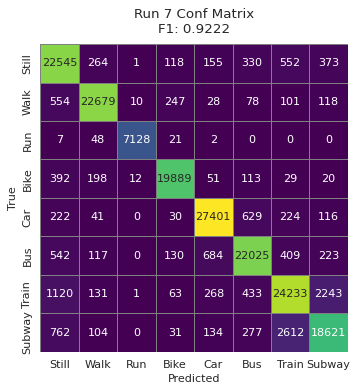


=== Run 8/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9147

Classification Report:
              precision    recall  f1-score   support

       Still     0.8533    0.9233    0.8870     24338
        Walk     0.9574    0.9476    0.9525     23815
         Run     0.9968    0.9881    0.9924      7206
        Bike     0.9651    0.9570    0.9611     20704
         Car     0.9451    0.9479    0.9465     28663
         Bus     0.9105    0.9007    0.9056     24130
       Train     0.8494    0.8370    0.8432     28492
      Subway     0.8473    0.8126    0.8296     22541

    accuracy                         0.9064    179889
   macro avg     0.9156    0.9143    0.9147    179889
weighted avg     0.9067    0.9064    0.9063  

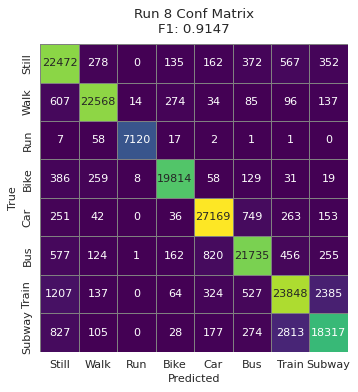


=== Run 9/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9130

Classification Report:
              precision    recall  f1-score   support

       Still     0.8503    0.9237    0.8855     24338
        Walk     0.9571    0.9460    0.9515     23815
         Run     0.9948    0.9885    0.9916      7206
        Bike     0.9638    0.9544    0.9591     20704
         Car     0.9423    0.9460    0.9441     28663
         Bus     0.9068    0.8964    0.9016     24130
       Train     0.8489    0.8352    0.8420     28492
      Subway     0.8470    0.8113    0.8288     22541

    accuracy                         0.9046    179889
   macro avg     0.9139    0.9127    0.9130    179889
weighted avg     0.9049    0.9046    0.9045   

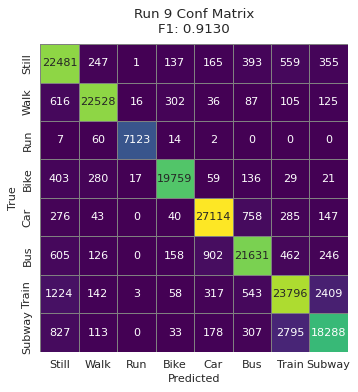


=== Run 10/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9101

Classification Report:
              precision    recall  f1-score   support

       Still     0.8436    0.9255    0.8827     24338
        Walk     0.9564    0.9450    0.9506     23815
         Run     0.9966    0.9874    0.9920      7206
        Bike     0.9637    0.9552    0.9595     20704
         Car     0.9358    0.9435    0.9397     28663
         Bus     0.9045    0.8910    0.8977     24130
       Train     0.8454    0.8283    0.8368     28492
      Subway     0.8439    0.8018    0.8223     22541

    accuracy                         0.9013    179889
   macro avg     0.9113    0.9097    0.9101    179889
weighted avg     0.9017    0.9013    0.9011   

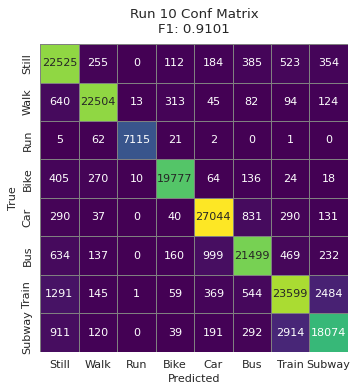


=== Run 11/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9189

Classification Report:
              precision    recall  f1-score   support

       Still     0.8522    0.9285    0.8887     24338
        Walk     0.9608    0.9505    0.9556     23815
         Run     0.9978    0.9889    0.9933      7206
        Bike     0.9682    0.9593    0.9638     20704
         Car     0.9497    0.9522    0.9510     28663
         Bus     0.9176    0.9042    0.9108     24130
       Train     0.8556    0.8443    0.8499     28492
      Subway     0.8576    0.8190    0.8378     22541

    accuracy                         0.9108    179889
   macro avg     0.9199    0.9184    0.9189    179889
weighted avg     0.9113    0.9108    0.9108

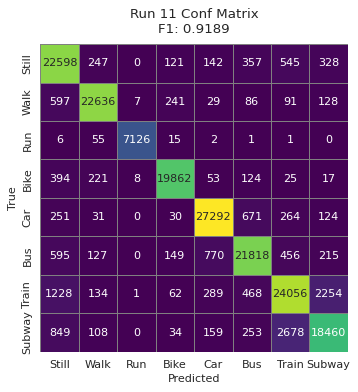


=== Run 12/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9185

Classification Report:
              precision    recall  f1-score   support

       Still     0.8627    0.9210    0.8909     24338
        Walk     0.9597    0.9492    0.9544     23815
         Run     0.9958    0.9876    0.9917      7206
        Bike     0.9658    0.9604    0.9631     20704
         Car     0.9508    0.9509    0.9509     28663
         Bus     0.9141    0.9080    0.9111     24130
       Train     0.8540    0.8438    0.8489     28492
      Subway     0.8505    0.8237    0.8369     22541

    accuracy                         0.9106    179889
   macro avg     0.9192    0.9181    0.9185    179889
weighted avg     0.9108    0.9106    0.9105  

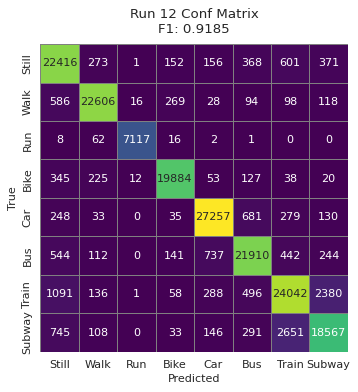


=== Run 13/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9121

Classification Report:
              precision    recall  f1-score   support

       Still     0.8507    0.9211    0.8845     24338
        Walk     0.9578    0.9456    0.9517     23815
         Run     0.9954    0.9863    0.9908      7206
        Bike     0.9623    0.9547    0.9585     20704
         Car     0.9410    0.9442    0.9426     28663
         Bus     0.9023    0.8953    0.8988     24130
       Train     0.8479    0.8350    0.8414     28492
      Subway     0.8468    0.8109    0.8284     22541

    accuracy                         0.9036    179889
   macro avg     0.9130    0.9116    0.9121    179889
weighted avg     0.9039    0.9036    0.9035  

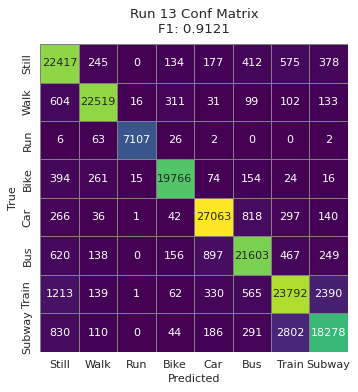


=== Run 14/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9172

Classification Report:
              precision    recall  f1-score   support

       Still     0.8564    0.9241    0.8890     24338
        Walk     0.9575    0.9496    0.9536     23815
         Run     0.9973    0.9885    0.9929      7206
        Bike     0.9672    0.9580    0.9626     20704
         Car     0.9469    0.9497    0.9483     28663
         Bus     0.9130    0.9041    0.9085     24130
       Train     0.8532    0.8433    0.8483     28492
      Subway     0.8540    0.8166    0.8349     22541

    accuracy                         0.9091    179889
   macro avg     0.9182    0.9167    0.9172    179889
weighted avg     0.9094    0.9091    0.9

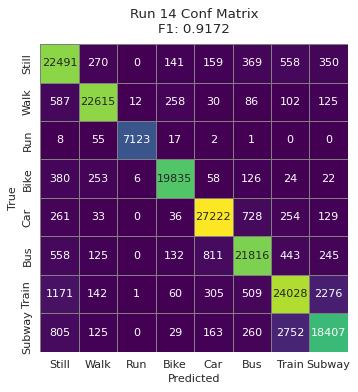


=== Run 15/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9080

Classification Report:
              precision    recall  f1-score   support

       Still     0.8505    0.9159    0.8820     24338
        Walk     0.9551    0.9432    0.9491     23815
         Run     0.9934    0.9875    0.9905      7206
        Bike     0.9594    0.9522    0.9558     20704
         Car     0.9372    0.9411    0.9391     28663
         Bus     0.8996    0.8886    0.8941     24130
       Train     0.8397    0.8265    0.8331     28492
      Subway     0.8346    0.8066    0.8204     22541

    accuracy                         0.8991    179889
   macro avg     0.9087    0.9077    0.9080    179889
weighted avg     0.8993    0.8991    0.8990   

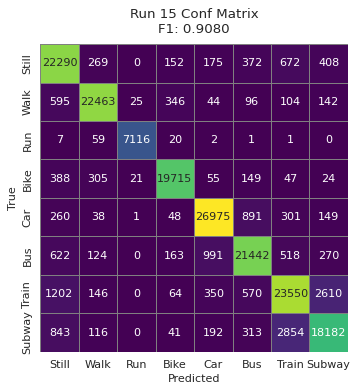


=== Run 16/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9183

Classification Report:
              precision    recall  f1-score   support

       Still     0.8534    0.9306    0.8903     24338
        Walk     0.9583    0.9482    0.9532     23815
         Run     0.9968    0.9878    0.9923      7206
        Bike     0.9672    0.9571    0.9622     20704
         Car     0.9486    0.9510    0.9498     28663
         Bus     0.9154    0.9023    0.9088     24130
       Train     0.8595    0.8453    0.8523     28492
      Subway     0.8551    0.8201    0.8373     22541

    accuracy                         0.9104    179889
   macro avg     0.9193    0.9178    0.9183    179889
weighted avg     0.9108    0.9104    0

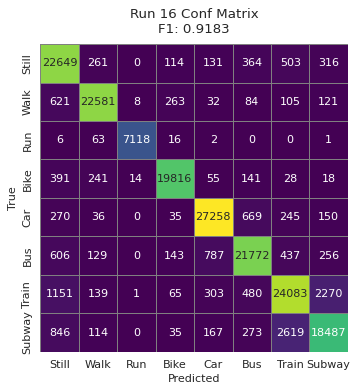


=== Run 17/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9175

Classification Report:
              precision    recall  f1-score   support

       Still     0.8566    0.9249    0.8894     24338
        Walk     0.9601    0.9487    0.9544     23815
         Run     0.9961    0.9890    0.9925      7206
        Bike     0.9656    0.9579    0.9617     20704
         Car     0.9453    0.9503    0.9478     28663
         Bus     0.9138    0.9057    0.9097     24130
       Train     0.8562    0.8417    0.8489     28492
      Subway     0.8526    0.8184    0.8352     22541

    accuracy                         0.9094    179889
   macro avg     0.9183    0.9171    0.9175    179889
weighted avg     0.9097    0.9094    0.9093

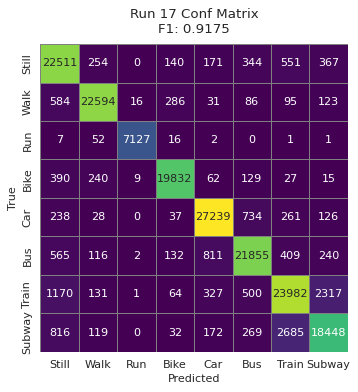


=== Run 18/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9260

Classification Report:
              precision    recall  f1-score   support

       Still     0.8685    0.9286    0.8975     24338
        Walk     0.9617    0.9520    0.9568     23815
         Run     0.9972    0.9893    0.9932      7206
        Bike     0.9699    0.9629    0.9664     20704
         Car     0.9573    0.9588    0.9580     28663
         Bus     0.9263    0.9183    0.9223     24130
       Train     0.8700    0.8573    0.8636     28492
      Subway     0.8631    0.8379    0.8503     22541

    accuracy                         0.9188    179889
   macro avg     0.9267    0.9256    0.9260    179889
weighted avg     0.9191    0.9188    0.

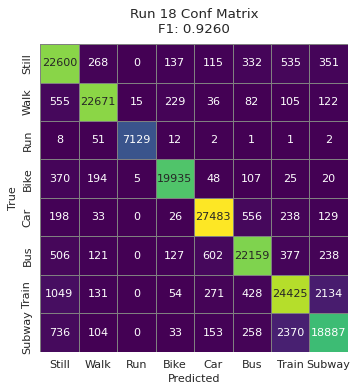


=== Run 19/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9227

Classification Report:
              precision    recall  f1-score   support

       Still     0.8632    0.9274    0.8942     24338
        Walk     0.9604    0.9523    0.9564     23815
         Run     0.9978    0.9885    0.9931      7206
        Bike     0.9700    0.9614    0.9657     20704
         Car     0.9536    0.9551    0.9544     28663
         Bus     0.9212    0.9120    0.9166     24130
       Train     0.8637    0.8516    0.8576     28492
      Subway     0.8586    0.8294    0.8438     22541

    accuracy                         0.9151    179889
   macro avg     0.9236    0.9222    0.9227    179889
weighted avg     0.9154    0.9151    0.9

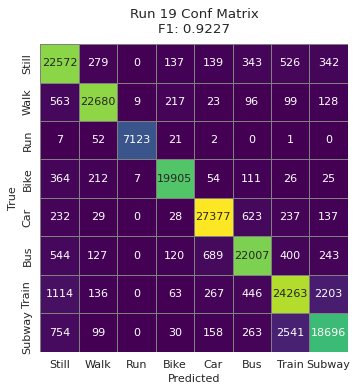


=== Run 20/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9039

Classification Report:
              precision    recall  f1-score   support

       Still     0.8336    0.9221    0.8756     24338
        Walk     0.9534    0.9417    0.9475     23815
         Run     0.9962    0.9871    0.9916      7206
        Bike     0.9580    0.9503    0.9541     20704
         Car     0.9308    0.9393    0.9350     28663
         Bus     0.8959    0.8799    0.8878     24130
       Train     0.8372    0.8179    0.8274     28492
      Subway     0.8354    0.7896    0.8118     22541

    accuracy                         0.8945    179889
   macro avg     0.9050    0.9035    0.9039    179889
weighted avg     0.8949    0.8945    0.

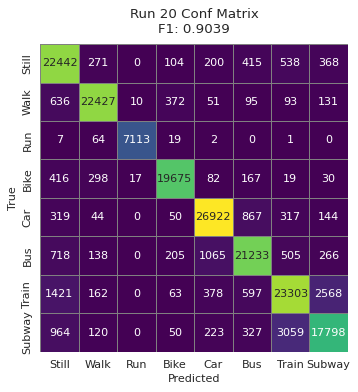


=== Run 21/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9185

Classification Report:
              precision    recall  f1-score   support

       Still     0.8584    0.9269    0.8913     24338
        Walk     0.9583    0.9496    0.9539     23815
         Run     0.9959    0.9882    0.9921      7206
        Bike     0.9671    0.9585    0.9628     20704
         Car     0.9483    0.9499    0.9491     28663
         Bus     0.9156    0.9032    0.9094     24130
       Train     0.8587    0.8458    0.8522     28492
      Subway     0.8523    0.8227    0.8372     22541

    accuracy                         0.9106    179889
   macro avg     0.9193    0.9181    0.9185    179889
weighted avg     0.9109    0.9106    0.

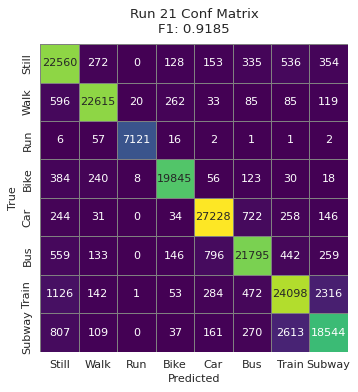


=== Run 22/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9100

Classification Report:
              precision    recall  f1-score   support

       Still     0.8512    0.9185    0.8836     24338
        Walk     0.9528    0.9451    0.9489     23815
         Run     0.9950    0.9868    0.9909      7206
        Bike     0.9606    0.9521    0.9563     20704
         Car     0.9392    0.9430    0.9411     28663
         Bus     0.9012    0.8920    0.8966     24130
       Train     0.8445    0.8329    0.8387     28492
      Subway     0.8421    0.8061    0.8237     22541

    accuracy                         0.9013    179889
   macro avg     0.9108    0.9096    0.9100    179889
weighted avg     0.9015    0.9013    0.90

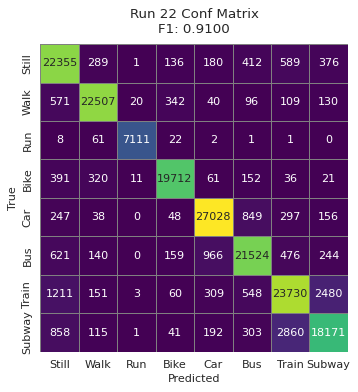


=== Run 23/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9173

Classification Report:
              precision    recall  f1-score   support

       Still     0.8608    0.9203    0.8896     24338
        Walk     0.9581    0.9497    0.9539     23815
         Run     0.9964    0.9878    0.9921      7206
        Bike     0.9655    0.9576    0.9615     20704
         Car     0.9488    0.9504    0.9496     28663
         Bus     0.9132    0.9064    0.9098     24130
       Train     0.8541    0.8443    0.8492     28492
      Subway     0.8477    0.8182    0.8327     22541

    accuracy                         0.9093    179889
   macro avg     0.9181    0.9168    0.9173    179889
weighted avg     0.9095    0.9093    0.9092  

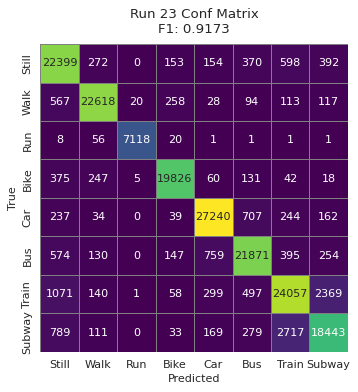


=== Run 24/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9119

Classification Report:
              precision    recall  f1-score   support

       Still     0.8439    0.9243    0.8823     24338
        Walk     0.9562    0.9468    0.9515     23815
         Run     0.9968    0.9883    0.9925      7206
        Bike     0.9631    0.9551    0.9591     20704
         Car     0.9403    0.9457    0.9430     28663
         Bus     0.9069    0.8925    0.8996     24130
       Train     0.8475    0.8327    0.8401     28492
      Subway     0.8494    0.8065    0.8274     22541

    accuracy                         0.9033    179889
   macro avg     0.9130    0.9115    0.9119    179889
weighted avg     0.9037    0.9033    0.903

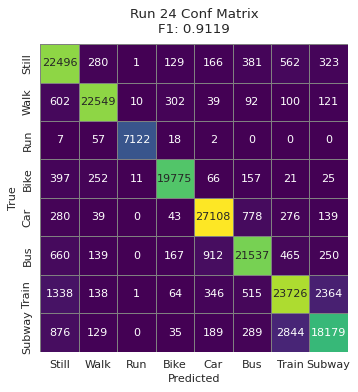


=== Run 25/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9216

Classification Report:
              precision    recall  f1-score   support

       Still     0.8580    0.9295    0.8924     24338
        Walk     0.9611    0.9507    0.9559     23815
         Run     0.9964    0.9883    0.9923      7206
        Bike     0.9681    0.9595    0.9638     20704
         Car     0.9505    0.9525    0.9515     28663
         Bus     0.9200    0.9081    0.9140     24130
       Train     0.8625    0.8524    0.8574     28492
      Subway     0.8643    0.8281    0.8458     22541

    accuracy                         0.9140    179889
   macro avg     0.9226    0.9212    0.9216    179889
weighted avg     0.9144    0.9140    0.914

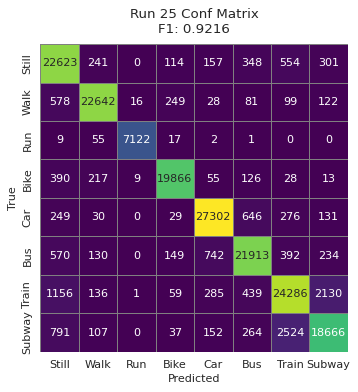


=== Run 26/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9144

Classification Report:
              precision    recall  f1-score   support

       Still     0.8595    0.9202    0.8888     24338
        Walk     0.9542    0.9462    0.9502     23815
         Run     0.9944    0.9876    0.9910      7206
        Bike     0.9632    0.9543    0.9587     20704
         Car     0.9430    0.9479    0.9455     28663
         Bus     0.9080    0.9003    0.9041     24130
       Train     0.8508    0.8403    0.8455     28492
      Subway     0.8480    0.8152    0.8313     22541

    accuracy                         0.9062    179889
   macro avg     0.9151    0.9140    0.9144    179889
weighted avg     0.9064    0.9062    0.9061 

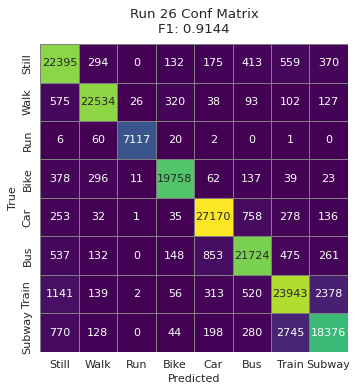


=== Run 27/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9166

Classification Report:
              precision    recall  f1-score   support

       Still     0.8526    0.9293    0.8893     24338
        Walk     0.9599    0.9479    0.9539     23815
         Run     0.9959    0.9875    0.9917      7206
        Bike     0.9665    0.9574    0.9619     20704
         Car     0.9441    0.9483    0.9462     28663
         Bus     0.9127    0.9015    0.9071     24130
       Train     0.8553    0.8412    0.8482     28492
      Subway     0.8543    0.8164    0.8349     22541

    accuracy                         0.9085    179889
   macro avg     0.9177    0.9162    0.9166    179889
weighted avg     0.9089    0.9085    0.9

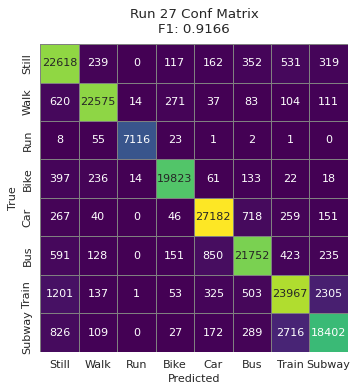


=== Run 28/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9102

Classification Report:
              precision    recall  f1-score   support

       Still     0.8538    0.9163    0.8839     24338
        Walk     0.9536    0.9452    0.9493     23815
         Run     0.9941    0.9874    0.9907      7206
        Bike     0.9596    0.9536    0.9566     20704
         Car     0.9403    0.9439    0.9421     28663
         Bus     0.9033    0.8957    0.8995     24130
       Train     0.8434    0.8312    0.8373     28492
      Subway     0.8386    0.8056    0.8218     22541

    accuracy                         0.9015    179889
   macro avg     0.9108    0.9098    0.9102    179889
weighted avg     0.9017    0.9015    0.9014 

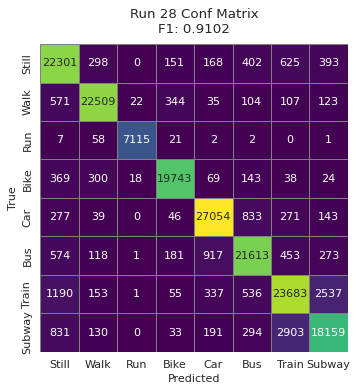


=== Run 29/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9089

Classification Report:
              precision    recall  f1-score   support

       Still     0.8465    0.9189    0.8812     24338
        Walk     0.9547    0.9456    0.9501     23815
         Run     0.9961    0.9882    0.9921      7206
        Bike     0.9621    0.9538    0.9579     20704
         Car     0.9387    0.9413    0.9400     28663
         Bus     0.9028    0.8915    0.8972     24130
       Train     0.8400    0.8265    0.8332     28492
      Subway     0.8371    0.8020    0.8192     22541

    accuracy                         0.8999    179889
   macro avg     0.9097    0.9085    0.9089    179889
weighted avg     0.9001    0.8999    0.89

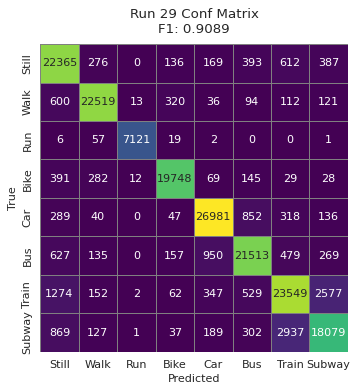


=== Run 30/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9196

Classification Report:
              precision    recall  f1-score   support

       Still     0.8542    0.9311    0.8910     24338
        Walk     0.9584    0.9490    0.9537     23815
         Run     0.9971    0.9882    0.9926      7206
        Bike     0.9672    0.9597    0.9634     20704
         Car     0.9496    0.9533    0.9515     28663
         Bus     0.9198    0.9047    0.9122     24130
       Train     0.8599    0.8449    0.8523     28492
      Subway     0.8588    0.8225    0.8402     22541

    accuracy                         0.9118    179889
   macro avg     0.9206    0.9192    0.9196    179889
weighted avg     0.9122    0.9118    0.91

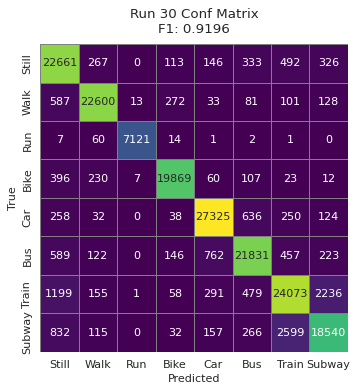


=== Run 31/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9017

Classification Report:
              precision    recall  f1-score   support

       Still     0.8295    0.9222    0.8734     24338
        Walk     0.9505    0.9418    0.9462     23815
         Run     0.9958    0.9849    0.9903      7206
        Bike     0.9574    0.9502    0.9538     20704
         Car     0.9293    0.9344    0.9318     28663
         Bus     0.8934    0.8784    0.8858     24130
       Train     0.8330    0.8148    0.8238     28492
      Subway     0.8348    0.7832    0.8081     22541

    accuracy                         0.8922    179889
   macro avg     0.9030    0.9012    0.9017    179889
weighted avg     0.8926    0.8922    0.8919   

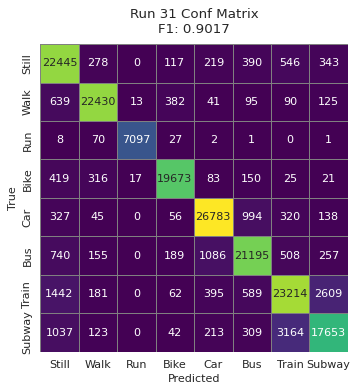


=== Run 32/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9101

Classification Report:
              precision    recall  f1-score   support

       Still     0.8530    0.9175    0.8841     24338
        Walk     0.9545    0.9438    0.9491     23815
         Run     0.9950    0.9886    0.9918      7206
        Bike     0.9608    0.9543    0.9575     20704
         Car     0.9390    0.9422    0.9406     28663
         Bus     0.8999    0.8915    0.8957     24130
       Train     0.8436    0.8344    0.8390     28492
      Subway     0.8412    0.8058    0.8231     22541

    accuracy                         0.9014    179889
   macro avg     0.9109    0.9098    0.9101    179889
weighted avg     0.9016    0.9014    0.9012   

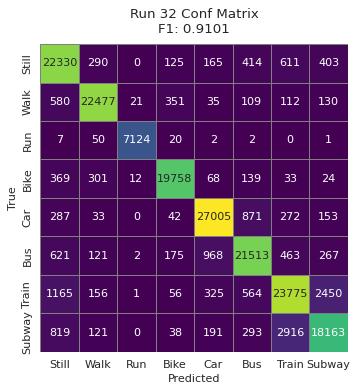


=== Run 33/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9074

Classification Report:
              precision    recall  f1-score   support

       Still     0.8424    0.9203    0.8796     24338
        Walk     0.9552    0.9429    0.9490     23815
         Run     0.9950    0.9876    0.9913      7206
        Bike     0.9587    0.9530    0.9558     20704
         Car     0.9362    0.9400    0.9381     28663
         Bus     0.8988    0.8866    0.8927     24130
       Train     0.8400    0.8280    0.8339     28492
      Subway     0.8408    0.7978    0.8187     22541

    accuracy                         0.8984    179889
   macro avg     0.9084    0.9070    0.9074    179889
weighted avg     0.8987    0.8984    0.8982 

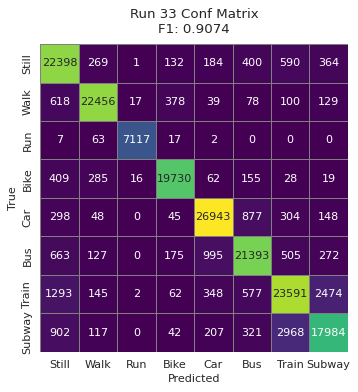


=== Run 34/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9161

Classification Report:
              precision    recall  f1-score   support

       Still     0.8569    0.9235    0.8889     24338
        Walk     0.9583    0.9481    0.9532     23815
         Run     0.9964    0.9879    0.9921      7206
        Bike     0.9651    0.9579    0.9615     20704
         Car     0.9458    0.9474    0.9466     28663
         Bus     0.9104    0.8996    0.9050     24130
       Train     0.8522    0.8429    0.8475     28492
      Subway     0.8504    0.8174    0.8336     22541

    accuracy                         0.9078    179889
   macro avg     0.9169    0.9156    0.9161    179889
weighted avg     0.9081    0.9078    0.907

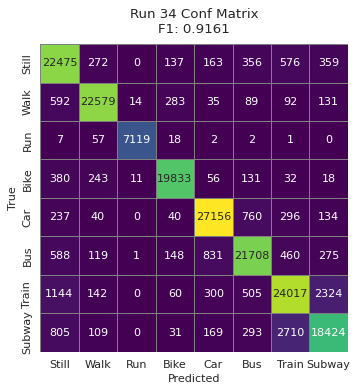


=== Run 35/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9139

Classification Report:
              precision    recall  f1-score   support

       Still     0.8450    0.9247    0.8831     24338
        Walk     0.9589    0.9491    0.9540     23815
         Run     0.9972    0.9875    0.9923      7206
        Bike     0.9663    0.9576    0.9619     20704
         Car     0.9428    0.9463    0.9446     28663
         Bus     0.9093    0.8973    0.9033     24130
       Train     0.8502    0.8355    0.8428     28492
      Subway     0.8507    0.8095    0.8296     22541

    accuracy                         0.9054    179889
   macro avg     0.9151    0.9134    0.9139    179889
weighted avg     0.9059    0.9054    0.9053  

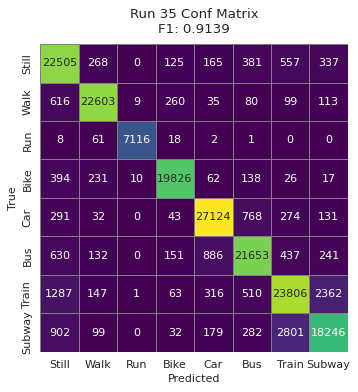


=== Run 36/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9182

Classification Report:
              precision    recall  f1-score   support

       Still     0.8580    0.9258    0.8907     24338
        Walk     0.9588    0.9489    0.9538     23815
         Run     0.9966    0.9881    0.9923      7206
        Bike     0.9650    0.9589    0.9620     20704
         Car     0.9499    0.9515    0.9507     28663
         Bus     0.9141    0.9070    0.9106     24130
       Train     0.8558    0.8440    0.8499     28492
      Subway     0.8541    0.8180    0.8357     22541

    accuracy                         0.9103    179889
   macro avg     0.9191    0.9178    0.9182    179889
weighted avg     0.9106    0.9103    0.91

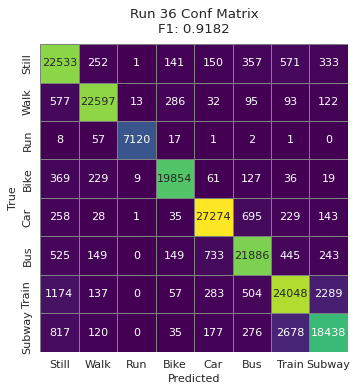


=== Run 37/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9015

Classification Report:
              precision    recall  f1-score   support

       Still     0.8431    0.9124    0.8764     24338
        Walk     0.9520    0.9411    0.9466     23815
         Run     0.9940    0.9865    0.9902      7206
        Bike     0.9556    0.9504    0.9530     20704
         Car     0.9278    0.9364    0.9321     28663
         Bus     0.8914    0.8786    0.8849     24130
       Train     0.8276    0.8168    0.8221     28492
      Subway     0.8274    0.7867    0.8065     22541

    accuracy                         0.8919    179889
   macro avg     0.9024    0.9011    0.9015    179889
weighted avg     0.8921    0.8919    0.8917    

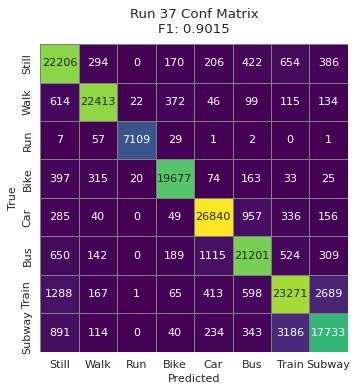


=== Run 38/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9167

Classification Report:
              precision    recall  f1-score   support

       Still     0.8583    0.9240    0.8899     24338
        Walk     0.9580    0.9492    0.9536     23815
         Run     0.9978    0.9883    0.9930      7206
        Bike     0.9667    0.9577    0.9622     20704
         Car     0.9461    0.9506    0.9483     28663
         Bus     0.9122    0.9018    0.9070     24130
       Train     0.8527    0.8392    0.8459     28492
      Subway     0.8491    0.8192    0.8339     22541

    accuracy                         0.9085    179889
   macro avg     0.9176    0.9163    0.9167    179889
weighted avg     0.9087    0.9085    0.9084

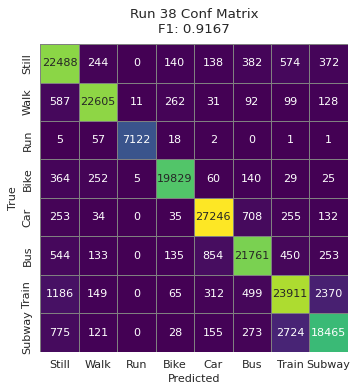


=== Run 39/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9194

Classification Report:
              precision    recall  f1-score   support

       Still     0.8606    0.9222    0.8904     24338
        Walk     0.9579    0.9487    0.9533     23815
         Run     0.9964    0.9883    0.9923      7206
        Bike     0.9653    0.9596    0.9624     20704
         Car     0.9510    0.9531    0.9520     28663
         Bus     0.9171    0.9087    0.9129     24130
       Train     0.8591    0.8470    0.8530     28492
      Subway     0.8534    0.8240    0.8385     22541

    accuracy                         0.9116    179889
   macro avg     0.9201    0.9190    0.9194    179889
weighted avg     0.9118    0.9116    0.9115  

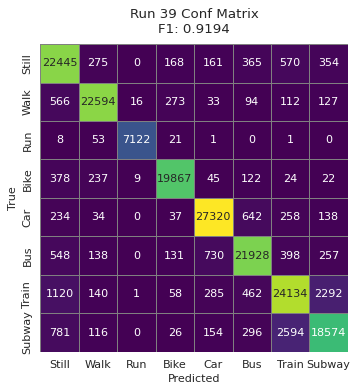


=== Run 40/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9158

Classification Report:
              precision    recall  f1-score   support

       Still     0.8563    0.9249    0.8893     24338
        Walk     0.9587    0.9476    0.9531     23815
         Run     0.9965    0.9885    0.9925      7206
        Bike     0.9645    0.9571    0.9608     20704
         Car     0.9460    0.9491    0.9476     28663
         Bus     0.9111    0.9005    0.9058     24130
       Train     0.8500    0.8406    0.8453     28492
      Subway     0.8502    0.8143    0.8318     22541

    accuracy                         0.9075    179889
   macro avg     0.9167    0.9153    0.9158    179889
weighted avg     0.9078    0.9075    0.9074 

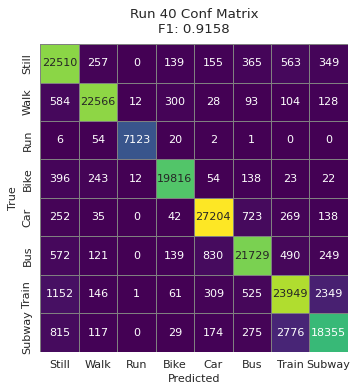


=== Run 41/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9096

Classification Report:
              precision    recall  f1-score   support

       Still     0.8544    0.9173    0.8847     24338
        Walk     0.9541    0.9466    0.9503     23815
         Run     0.9940    0.9867    0.9903      7206
        Bike     0.9592    0.9534    0.9563     20704
         Car     0.9386    0.9429    0.9407     28663
         Bus     0.9009    0.8913    0.8961     24130
       Train     0.8427    0.8295    0.8361     28492
      Subway     0.8382    0.8065    0.8221     22541

    accuracy                         0.9009    179889
   macro avg     0.9103    0.9093    0.9096    179889
weighted avg     0.9010    0.9009    0.9008  

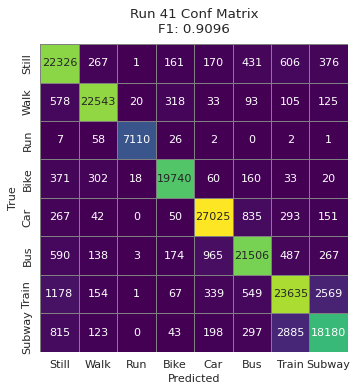


=== Run 42/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9225

Classification Report:
              precision    recall  f1-score   support

       Still     0.8679    0.9263    0.8962     24338
        Walk     0.9596    0.9518    0.9557     23815
         Run     0.9958    0.9885    0.9921      7206
        Bike     0.9681    0.9611    0.9646     20704
         Car     0.9546    0.9565    0.9556     28663
         Bus     0.9219    0.9128    0.9174     24130
       Train     0.8610    0.8519    0.8564     28492
      Subway     0.8564    0.8276    0.8418     22541

    accuracy                         0.9150    179889
   macro avg     0.9232    0.9221    0.9225    179889
weighted avg     0.9152    0.9150    0.9150   

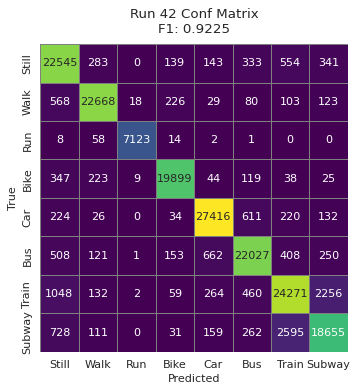


=== Run 43/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9098

Classification Report:
              precision    recall  f1-score   support

       Still     0.8523    0.9190    0.8844     24338
        Walk     0.9538    0.9437    0.9487     23815
         Run     0.9944    0.9874    0.9909      7206
        Bike     0.9587    0.9521    0.9554     20704
         Car     0.9388    0.9428    0.9408     28663
         Bus     0.9018    0.8927    0.8973     24130
       Train     0.8454    0.8309    0.8381     28492
      Subway     0.8393    0.8077    0.8232     22541

    accuracy                         0.9012    179889
   macro avg     0.9106    0.9095    0.9098    179889
weighted avg     0.9014    0.9012    0.901

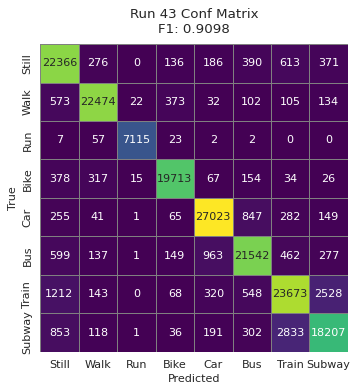


=== Run 44/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9212

Classification Report:
              precision    recall  f1-score   support

       Still     0.8648    0.9238    0.8933     24338
        Walk     0.9593    0.9520    0.9556     23815
         Run     0.9961    0.9885    0.9923      7206
        Bike     0.9687    0.9604    0.9645     20704
         Car     0.9531    0.9539    0.9535     28663
         Bus     0.9180    0.9108    0.9144     24130
       Train     0.8610    0.8480    0.8545     28492
      Subway     0.8538    0.8291    0.8412     22541

    accuracy                         0.9135    179889
   macro avg     0.9218    0.9208    0.9212    179889
weighted avg     0.9138    0.9135    0.9135

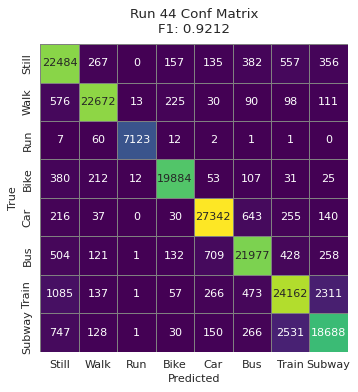


=== Run 45/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9067

Classification Report:
              precision    recall  f1-score   support

       Still     0.8491    0.9163    0.8814     24338
        Walk     0.9551    0.9442    0.9496     23815
         Run     0.9945    0.9874    0.9909      7206
        Bike     0.9596    0.9524    0.9560     20704
         Car     0.9348    0.9384    0.9366     28663
         Bus     0.8973    0.8883    0.8928     24130
       Train     0.8368    0.8248    0.8307     28492
      Subway     0.8327    0.7993    0.8157     22541

    accuracy                         0.8976    179889
   macro avg     0.9075    0.9064    0.9067    179889
weighted avg     0.8978    0.8976    0.897

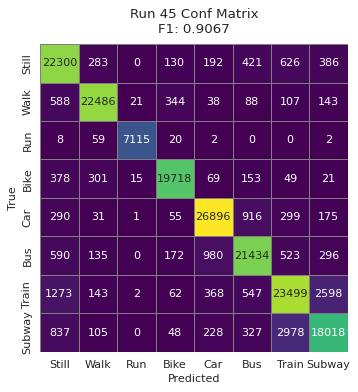


=== Run 46/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9169

Classification Report:
              precision    recall  f1-score   support

       Still     0.8562    0.9242    0.8889     24338
        Walk     0.9585    0.9478    0.9531     23815
         Run     0.9964    0.9897    0.9930      7206
        Bike     0.9658    0.9575    0.9616     20704
         Car     0.9457    0.9493    0.9475     28663
         Bus     0.9109    0.9017    0.9063     24130
       Train     0.8540    0.8418    0.8478     28492
      Subway     0.8542    0.8201    0.8368     22541

    accuracy                         0.9087    179889
   macro avg     0.9177    0.9165    0.9169    179889
weighted avg     0.9090    0.9087    0.9

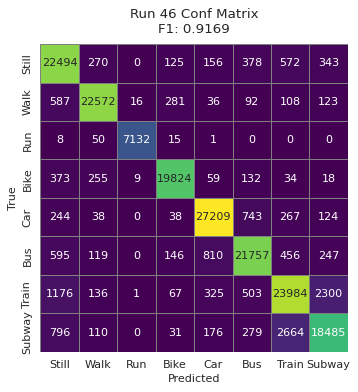


=== Run 47/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9023

Classification Report:
              precision    recall  f1-score   support

       Still     0.8366    0.9164    0.8747     24338
        Walk     0.9530    0.9421    0.9475     23815
         Run     0.9955    0.9861    0.9908      7206
        Bike     0.9564    0.9494    0.9529     20704
         Car     0.9286    0.9355    0.9320     28663
         Bus     0.8931    0.8785    0.8857     24130
       Train     0.8324    0.8191    0.8257     28492
      Subway     0.8315    0.7875    0.8089     22541

    accuracy                         0.8928    179889
   macro avg     0.9034    0.9018    0.9023    179889
weighted avg     0.8931    0.8928    0.8926    

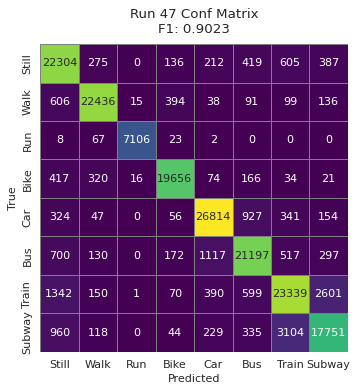


=== Run 48/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9138

Classification Report:
              precision    recall  f1-score   support

       Still     0.8554    0.9190    0.8861     24338
        Walk     0.9552    0.9463    0.9507     23815
         Run     0.9961    0.9870    0.9915      7206
        Bike     0.9623    0.9560    0.9592     20704
         Car     0.9440    0.9467    0.9454     28663
         Bus     0.9057    0.8986    0.9021     24130
       Train     0.8518    0.8378    0.8447     28492
      Subway     0.8467    0.8160    0.8311     22541

    accuracy                         0.9055    179889
   macro avg     0.9146    0.9134    0.9138    179889
weighted avg     0.9057    0.9055    0.905

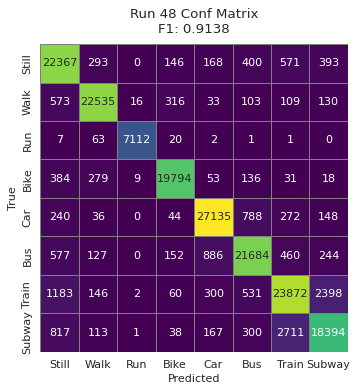


=== Run 49/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9125

Classification Report:
              precision    recall  f1-score   support

       Still     0.8506    0.9232    0.8854     24338
        Walk     0.9576    0.9458    0.9517     23815
         Run     0.9939    0.9872    0.9905      7206
        Bike     0.9629    0.9554    0.9591     20704
         Car     0.9419    0.9467    0.9443     28663
         Bus     0.9091    0.8969    0.9030     24130
       Train     0.8465    0.8343    0.8404     28492
      Subway     0.8445    0.8074    0.8255     22541

    accuracy                         0.9041    179889
   macro avg     0.9134    0.9121    0.9125    179889
weighted avg     0.9044    0.9041    0.90

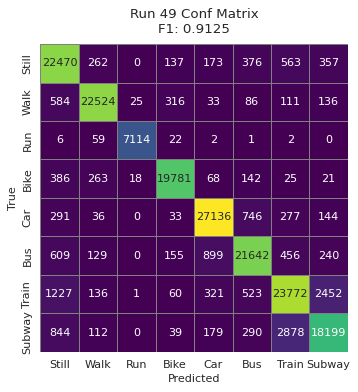


=== Run 50/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9223

Classification Report:
              precision    recall  f1-score   support

       Still     0.8635    0.9281    0.8946     24338
        Walk     0.9598    0.9513    0.9555     23815
         Run     0.9964    0.9889    0.9926      7206
        Bike     0.9684    0.9596    0.9640     20704
         Car     0.9520    0.9551    0.9535     28663
         Bus     0.9195    0.9106    0.9150     24130
       Train     0.8650    0.8520    0.8585     28492
      Subway     0.8605    0.8300    0.8450     22541

    accuracy                         0.9148    179889
   macro avg     0.9231    0.9219    0.9223    179889
weighted avg     0.9151    0.9148    0.91

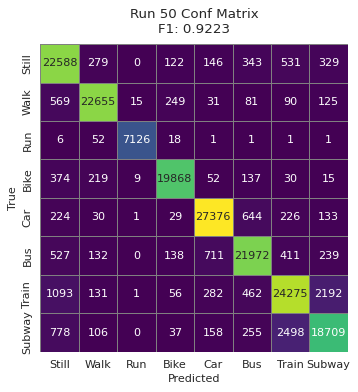


=== Run 51/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9102

Classification Report:
              precision    recall  f1-score   support

       Still     0.8462    0.9209    0.8820     24338
        Walk     0.9557    0.9439    0.9498     23815
         Run     0.9955    0.9879    0.9917      7206
        Bike     0.9597    0.9535    0.9566     20704
         Car     0.9381    0.9437    0.9409     28663
         Bus     0.9036    0.8911    0.8973     24130
       Train     0.8463    0.8316    0.8389     28492
      Subway     0.8439    0.8062    0.8246     22541

    accuracy                         0.9015    179889
   macro avg     0.9111    0.9099    0.9102    179889
weighted avg     0.9018    0.9015    0.9014  

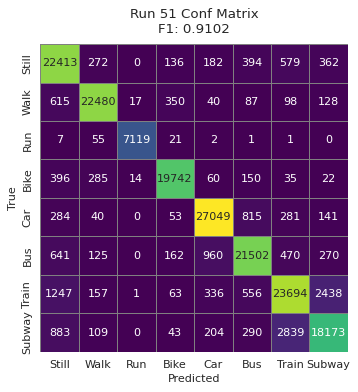


=== Run 52/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9176

Classification Report:
              precision    recall  f1-score   support

       Still     0.8509    0.9262    0.8870     24338
        Walk     0.9598    0.9502    0.9550     23815
         Run     0.9973    0.9881    0.9927      7206
        Bike     0.9682    0.9590    0.9636     20704
         Car     0.9468    0.9506    0.9487     28663
         Bus     0.9152    0.9032    0.9092     24130
       Train     0.8549    0.8421    0.8485     28492
      Subway     0.8558    0.8169    0.8359     22541

    accuracy                         0.9094    179889
   macro avg     0.9186    0.9170    0.9176    179889
weighted avg     0.9098    0.9094    0.9093  

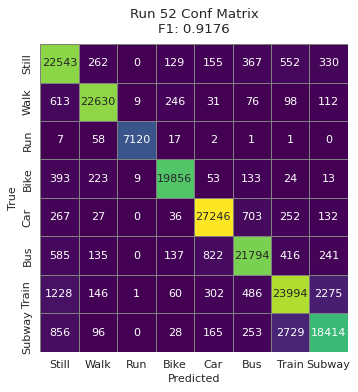


=== Run 53/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9276

Classification Report:
              precision    recall  f1-score   support

       Still     0.8670    0.9324    0.8985     24338
        Walk     0.9627    0.9536    0.9581     23815
         Run     0.9975    0.9888    0.9931      7206
        Bike     0.9700    0.9630    0.9665     20704
         Car     0.9604    0.9601    0.9603     28663
         Bus     0.9270    0.9184    0.9227     24130
       Train     0.8765    0.8575    0.8669     28492
      Subway     0.8658    0.8445    0.8550     22541

    accuracy                         0.9207    179889
   macro avg     0.9283    0.9273    0.9276    179889
weighted avg     0.9210    0.9207    0.9206

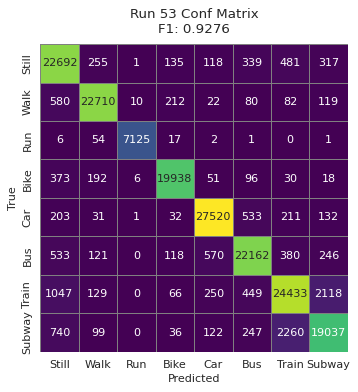


=== Run 54/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9148

Classification Report:
              precision    recall  f1-score   support

       Still     0.8589    0.9189    0.8879     24338
        Walk     0.9574    0.9474    0.9523     23815
         Run     0.9948    0.9874    0.9911      7206
        Bike     0.9631    0.9569    0.9600     20704
         Car     0.9446    0.9470    0.9458     28663
         Bus     0.9064    0.9000    0.9032     24130
       Train     0.8512    0.8396    0.8453     28492
      Subway     0.8474    0.8182    0.8325     22541

    accuracy                         0.9065    179889
   macro avg     0.9155    0.9144    0.9148    179889
weighted avg     0.9067    0.9065    0.9065 

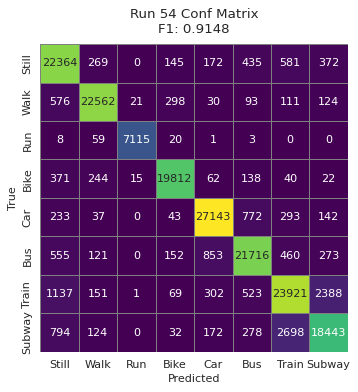


=== Run 55/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9015

Classification Report:
              precision    recall  f1-score   support

       Still     0.8365    0.9168    0.8748     24338
        Walk     0.9496    0.9420    0.9458     23815
         Run     0.9948    0.9860    0.9904      7206
        Bike     0.9575    0.9482    0.9528     20704
         Car     0.9267    0.9339    0.9303     28663
         Bus     0.8927    0.8796    0.8861     24130
       Train     0.8323    0.8154    0.8238     28492
      Subway     0.8305    0.7873    0.8083     22541

    accuracy                         0.8920    179889
   macro avg     0.9026    0.9012    0.9015    179889
weighted avg     0.8922    0.8920    0.891

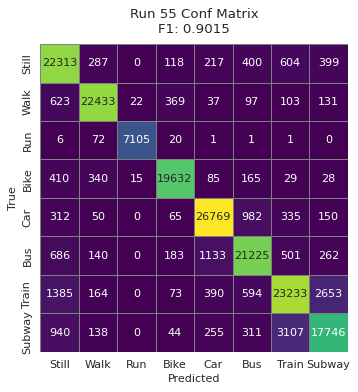


=== Run 56/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9201

Classification Report:
              precision    recall  f1-score   support

       Still     0.8543    0.9291    0.8901     24338
        Walk     0.9598    0.9506    0.9552     23815
         Run     0.9973    0.9881    0.9927      7206
        Bike     0.9687    0.9594    0.9640     20704
         Car     0.9510    0.9533    0.9521     28663
         Bus     0.9179    0.9078    0.9128     24130
       Train     0.8594    0.8473    0.8533     28492
      Subway     0.8606    0.8210    0.8403     22541

    accuracy                         0.9123    179889
   macro avg     0.9211    0.9196    0.9201    179889
weighted avg     0.9127    0.9123    0.91

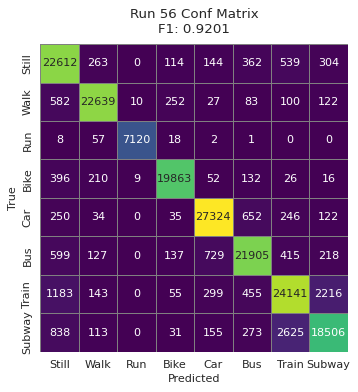


=== Run 57/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9133

Classification Report:
              precision    recall  f1-score   support

       Still     0.8470    0.9265    0.8849     24338
        Walk     0.9567    0.9467    0.9517     23815
         Run     0.9972    0.9874    0.9923      7206
        Bike     0.9633    0.9560    0.9596     20704
         Car     0.9414    0.9476    0.9445     28663
         Bus     0.9101    0.8960    0.9030     24130
       Train     0.8501    0.8329    0.8414     28492
      Subway     0.8491    0.8095    0.8288     22541

    accuracy                         0.9048    179889
   macro avg     0.9144    0.9128    0.9133    179889
weighted avg     0.9052    0.9048    0.

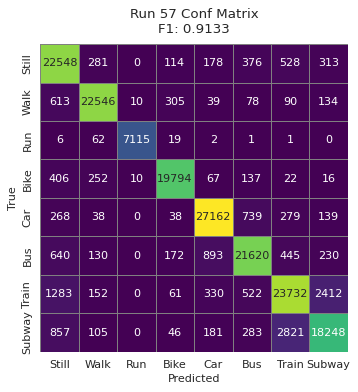


=== Run 58/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9213

Classification Report:
              precision    recall  f1-score   support

       Still     0.8654    0.9209    0.8923     24338
        Walk     0.9603    0.9500    0.9551     23815
         Run     0.9958    0.9895    0.9926      7206
        Bike     0.9684    0.9600    0.9642     20704
         Car     0.9535    0.9549    0.9542     28663
         Bus     0.9194    0.9111    0.9152     24130
       Train     0.8597    0.8512    0.8554     28492
      Subway     0.8535    0.8300    0.8416     22541

    accuracy                         0.9137    179889
   macro avg     0.9220    0.9209    0.9213    179889
weighted avg     0.9139    0.9137    0.

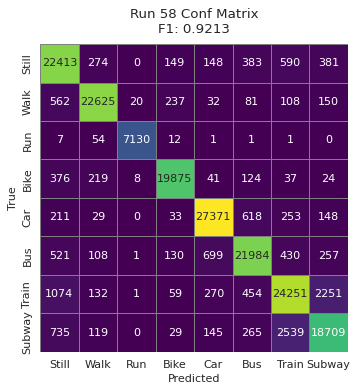


=== Run 59/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9166

Classification Report:
              precision    recall  f1-score   support

       Still     0.8564    0.9266    0.8901     24338
        Walk     0.9579    0.9484    0.9531     23815
         Run     0.9962    0.9881    0.9921      7206
        Bike     0.9631    0.9574    0.9602     20704
         Car     0.9469    0.9503    0.9486     28663
         Bus     0.9134    0.9013    0.9073     24130
       Train     0.8550    0.8406    0.8477     28492
      Subway     0.8503    0.8172    0.8334     22541

    accuracy                         0.9085    179889
   macro avg     0.9174    0.9162    0.9166    179889
weighted avg     0.9088    0.9085    0.90

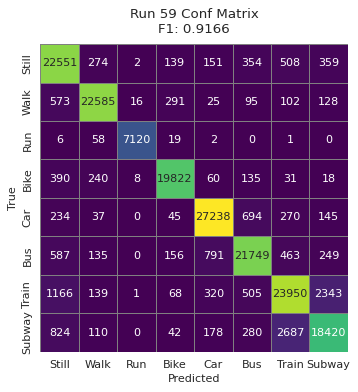


=== Run 60/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9233

Classification Report:
              precision    recall  f1-score   support

       Still     0.8626    0.9281    0.8941     24338
        Walk     0.9600    0.9511    0.9555     23815
         Run     0.9972    0.9897    0.9935      7206
        Bike     0.9687    0.9609    0.9648     20704
         Car     0.9535    0.9569    0.9552     28663
         Bus     0.9231    0.9114    0.9172     24130
       Train     0.8657    0.8510    0.8583     28492
      Subway     0.8617    0.8341    0.8477     22541

    accuracy                         0.9158    179889
   macro avg     0.9241    0.9229    0.9233    179889
weighted avg     0.9161    0.9158    0.915

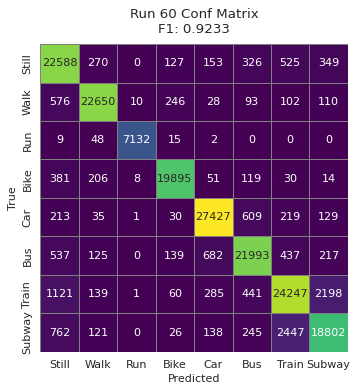


=== Run 61/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9098

Classification Report:
              precision    recall  f1-score   support

       Still     0.8523    0.9190    0.8844     24338
        Walk     0.9538    0.9437    0.9487     23815
         Run     0.9944    0.9874    0.9909      7206
        Bike     0.9587    0.9521    0.9554     20704
         Car     0.9388    0.9428    0.9408     28663
         Bus     0.9018    0.8927    0.8973     24130
       Train     0.8454    0.8309    0.8381     28492
      Subway     0.8393    0.8077    0.8232     22541

    accuracy                         0.9012    179889
   macro avg     0.9106    0.9095    0.9098    179889
weighted avg     0.9014    0.9012    0.901

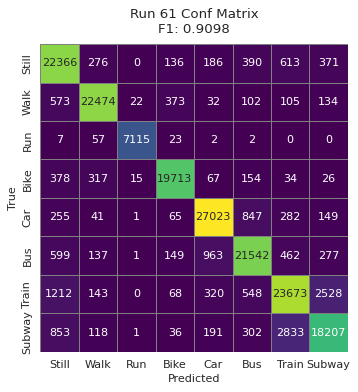


=== Run 62/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9112

Classification Report:
              precision    recall  f1-score   support

       Still     0.8434    0.9230    0.8814     24338
        Walk     0.9575    0.9457    0.9516     23815
         Run     0.9966    0.9883    0.9925      7206
        Bike     0.9641    0.9546    0.9593     20704
         Car     0.9412    0.9458    0.9435     28663
         Bus     0.9058    0.8930    0.8994     24130
       Train     0.8448    0.8305    0.8376     28492
      Subway     0.8445    0.8049    0.8242     22541

    accuracy                         0.9024    179889
   macro avg     0.9122    0.9107    0.9112    179889
weighted avg     0.9029    0.9024    0.9023   

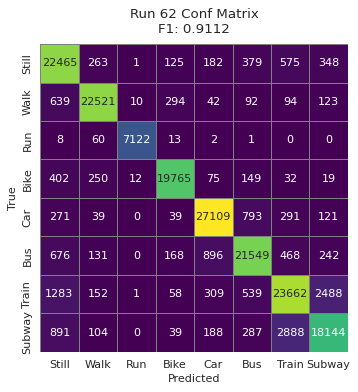


=== Run 63/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9131

Classification Report:
              precision    recall  f1-score   support

       Still     0.8465    0.9283    0.8855     24338
        Walk     0.9578    0.9465    0.9521     23815
         Run     0.9964    0.9871    0.9917      7206
        Bike     0.9636    0.9547    0.9592     20704
         Car     0.9420    0.9462    0.9441     28663
         Bus     0.9078    0.8931    0.9004     24130
       Train     0.8504    0.8376    0.8440     28492
      Subway     0.8497    0.8075    0.8281     22541

    accuracy                         0.9047    179889
   macro avg     0.9143    0.9126    0.9131    179889
weighted avg     0.9052    0.9047    0.9046   

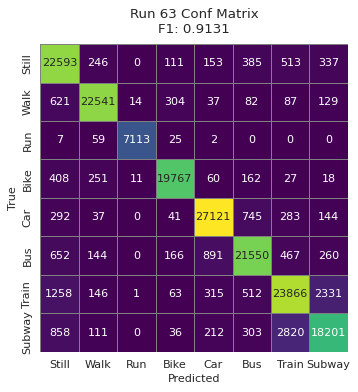


=== Run 64/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9160

Classification Report:
              precision    recall  f1-score   support

       Still     0.8502    0.9269    0.8869     24338
        Walk     0.9579    0.9485    0.9532     23815
         Run     0.9972    0.9888    0.9930      7206
        Bike     0.9658    0.9573    0.9615     20704
         Car     0.9445    0.9493    0.9469     28663
         Bus     0.9127    0.8988    0.9057     24130
       Train     0.8529    0.8396    0.8462     28492
      Subway     0.8553    0.8154    0.8349     22541

    accuracy                         0.9077    179889
   macro avg     0.9171    0.9156    0.9160    179889
weighted avg     0.9081    0.9077    0.

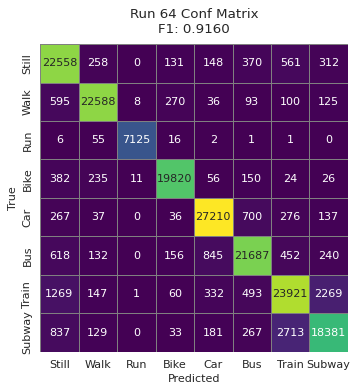


=== Run 65/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9206

Classification Report:
              precision    recall  f1-score   support

       Still     0.8643    0.9200    0.8913     24338
        Walk     0.9586    0.9500    0.9543     23815
         Run     0.9965    0.9886    0.9925      7206
        Bike     0.9679    0.9598    0.9638     20704
         Car     0.9535    0.9538    0.9537     28663
         Bus     0.9176    0.9123    0.9149     24130
       Train     0.8579    0.8490    0.8534     28492
      Subway     0.8541    0.8275    0.8406     22541

    accuracy                         0.9128    179889
   macro avg     0.9213    0.9201    0.9206    179889
weighted avg     0.9131    0.9128    0.

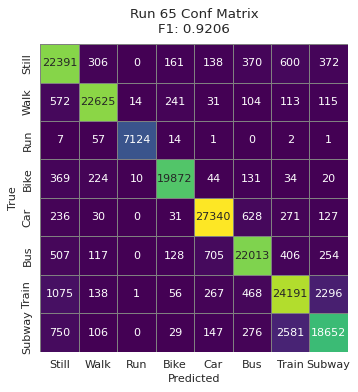


=== Run 66/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9131

Classification Report:
              precision    recall  f1-score   support

       Still     0.8508    0.9225    0.8852     24338
        Walk     0.9574    0.9479    0.9526     23815
         Run     0.9966    0.9882    0.9924      7206
        Bike     0.9640    0.9568    0.9604     20704
         Car     0.9406    0.9460    0.9433     28663
         Bus     0.9073    0.8945    0.9009     24130
       Train     0.8487    0.8340    0.8412     28492
      Subway     0.8460    0.8114    0.8283     22541

    accuracy                         0.9045    179889
   macro avg     0.9140    0.9126    0.9131    179889
weighted avg     0.9048    0.9045    0.9044 

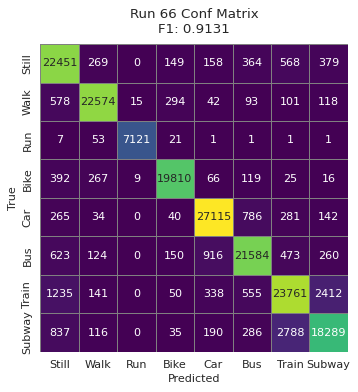


=== Run 67/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9043

Classification Report:
              precision    recall  f1-score   support

       Still     0.8330    0.9218    0.8751     24338
        Walk     0.9539    0.9429    0.9483     23815
         Run     0.9955    0.9850    0.9902      7206
        Bike     0.9591    0.9514    0.9552     20704
         Car     0.9320    0.9396    0.9358     28663
         Bus     0.8967    0.8823    0.8894     24130
       Train     0.8368    0.8177    0.8271     28492
      Subway     0.8376    0.7903    0.8133     22541

    accuracy                         0.8951    179889
   macro avg     0.9056    0.9039    0.9043    179889
weighted avg     0.8955    0.8951    0.8949

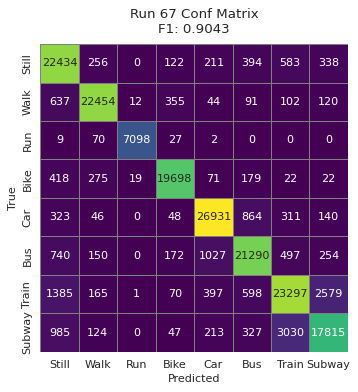


=== Run 68/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9093

Classification Report:
              precision    recall  f1-score   support

       Still     0.8495    0.9178    0.8823     24338
        Walk     0.9547    0.9450    0.9499     23815
         Run     0.9959    0.9868    0.9914      7206
        Bike     0.9606    0.9538    0.9572     20704
         Car     0.9371    0.9423    0.9397     28663
         Bus     0.9030    0.8909    0.8969     24130
       Train     0.8405    0.8284    0.8344     28492
      Subway     0.8401    0.8055    0.8224     22541

    accuracy                         0.9004    179889
   macro avg     0.9102    0.9088    0.9093    179889
weighted avg     0.9006    0.9004    0.9

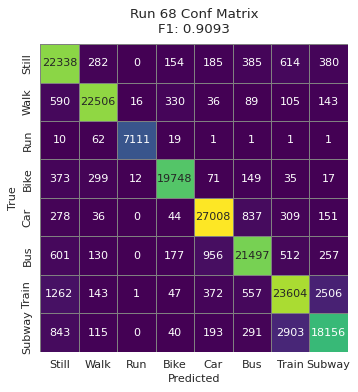


=== Run 69/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9081

Classification Report:
              precision    recall  f1-score   support

       Still     0.8447    0.9165    0.8791     24338
        Walk     0.9556    0.9457    0.9506     23815
         Run     0.9955    0.9881    0.9918      7206
        Bike     0.9622    0.9536    0.9579     20704
         Car     0.9357    0.9410    0.9384     28663
         Bus     0.8994    0.8903    0.8948     24130
       Train     0.8384    0.8276    0.8330     28492
      Subway     0.8406    0.7982    0.8188     22541

    accuracy                         0.8990    179889
   macro avg     0.9090    0.9076    0.9081    179889
weighted avg     0.8993    0.8990    0.89

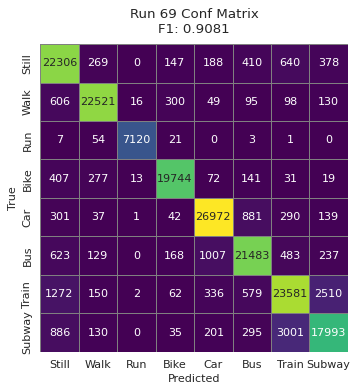


=== Run 70/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9132

Classification Report:
              precision    recall  f1-score   support

       Still     0.8457    0.9245    0.8833     24338
        Walk     0.9576    0.9476    0.9526     23815
         Run     0.9968    0.9881    0.9924      7206
        Bike     0.9653    0.9560    0.9606     20704
         Car     0.9433    0.9462    0.9447     28663
         Bus     0.9068    0.8964    0.9016     24130
       Train     0.8491    0.8359    0.8424     28492
      Subway     0.8493    0.8069    0.8276     22541

    accuracy                         0.9046    179889
   macro avg     0.9142    0.9127    0.9132    179889
weighted avg     0.9051    0.9046    0.9045  

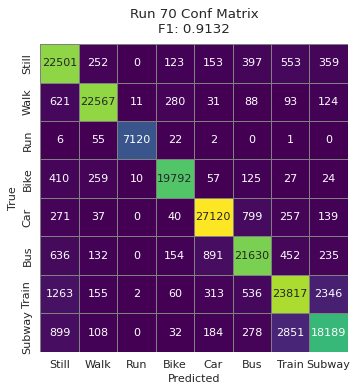


=== Run 71/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9195

Classification Report:
              precision    recall  f1-score   support

       Still     0.8625    0.9221    0.8913     24338
        Walk     0.9576    0.9485    0.9530     23815
         Run     0.9962    0.9888    0.9925      7206
        Bike     0.9654    0.9603    0.9629     20704
         Car     0.9499    0.9534    0.9516     28663
         Bus     0.9164    0.9082    0.9123     24130
       Train     0.8604    0.8474    0.8539     28492
      Subway     0.8529    0.8245    0.8385     22541

    accuracy                         0.9117    179889
   macro avg     0.9202    0.9192    0.9195    179889
weighted avg     0.9119    0.9117    0.9116 

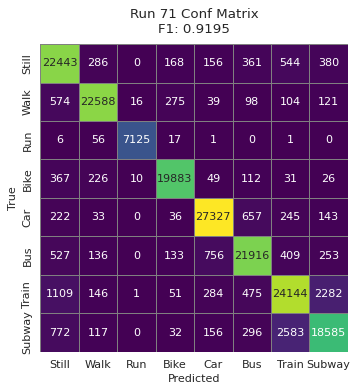


=== Run 72/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9129

Classification Report:
              precision    recall  f1-score   support

       Still     0.8464    0.9285    0.8856     24338
        Walk     0.9573    0.9464    0.9518     23815
         Run     0.9959    0.9875    0.9917      7206
        Bike     0.9618    0.9542    0.9580     20704
         Car     0.9419    0.9444    0.9431     28663
         Bus     0.9059    0.8933    0.8996     24130
       Train     0.8510    0.8371    0.8440     28492
      Subway     0.8519    0.8086    0.8297     22541

    accuracy                         0.9045    179889
   macro avg     0.9140    0.9125    0.9129    179889
weighted avg     0.9050    0.9045    0.9044  

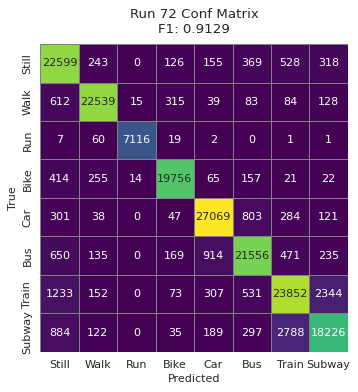


=== Run 73/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9075

Classification Report:
              precision    recall  f1-score   support

       Still     0.8499    0.9139    0.8807     24338
        Walk     0.9538    0.9442    0.9490     23815
         Run     0.9947    0.9876    0.9912      7206
        Bike     0.9602    0.9525    0.9563     20704
         Car     0.9363    0.9414    0.9389     28663
         Bus     0.8978    0.8886    0.8932     24130
       Train     0.8369    0.8280    0.8324     28492
      Subway     0.8366    0.8002    0.8180     22541

    accuracy                         0.8984    179889
   macro avg     0.9083    0.9070    0.9075    179889
weighted avg     0.8986    0.8984    0.8983   

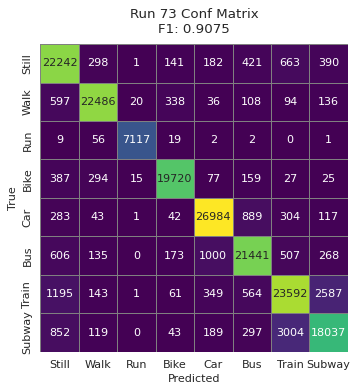


=== Run 74/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9125

Classification Report:
              precision    recall  f1-score   support

       Still     0.8525    0.9212    0.8855     24338
        Walk     0.9564    0.9479    0.9521     23815
         Run     0.9952    0.9876    0.9914      7206
        Bike     0.9634    0.9557    0.9595     20704
         Car     0.9426    0.9465    0.9446     28663
         Bus     0.9049    0.8956    0.9003     24130
       Train     0.8470    0.8325    0.8397     28492
      Subway     0.8441    0.8099    0.8266     22541

    accuracy                         0.9040    179889
   macro avg     0.9133    0.9121    0.9125    179889
weighted avg     0.9042    0.9040    0.9038  

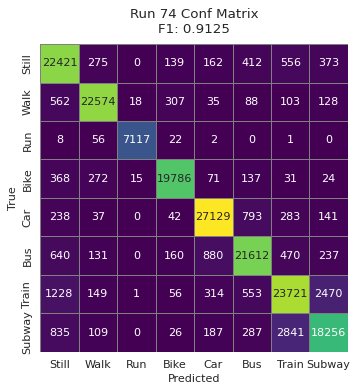


=== Run 75/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9126

Classification Report:
              precision    recall  f1-score   support

       Still     0.8468    0.9258    0.8845     24338
        Walk     0.9575    0.9477    0.9526     23815
         Run     0.9966    0.9890    0.9928      7206
        Bike     0.9654    0.9561    0.9607     20704
         Car     0.9411    0.9456    0.9434     28663
         Bus     0.9081    0.8943    0.9011     24130
       Train     0.8478    0.8310    0.8393     28492
      Subway     0.8452    0.8084    0.8264     22541

    accuracy                         0.9039    179889
   macro avg     0.9136    0.9122    0.9126    179889
weighted avg     0.9043    0.9039    0.9038

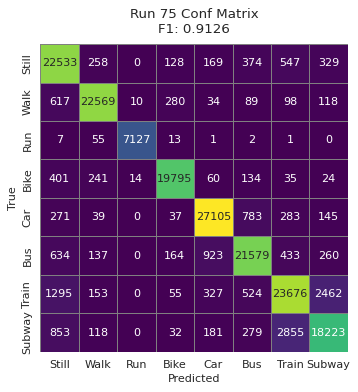


=== Run 76/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9083

Classification Report:
              precision    recall  f1-score   support

       Still     0.8451    0.9198    0.8809     24338
        Walk     0.9559    0.9456    0.9507     23815
         Run     0.9961    0.9879    0.9920      7206
        Bike     0.9608    0.9549    0.9578     20704
         Car     0.9363    0.9416    0.9389     28663
         Bus     0.9038    0.8907    0.8972     24130
       Train     0.8387    0.8245    0.8315     28492
      Subway     0.8369    0.7982    0.8171     22541

    accuracy                         0.8992    179889
   macro avg     0.9092    0.9079    0.9083    179889
weighted avg     0.8995    0.8992    0.8991    1

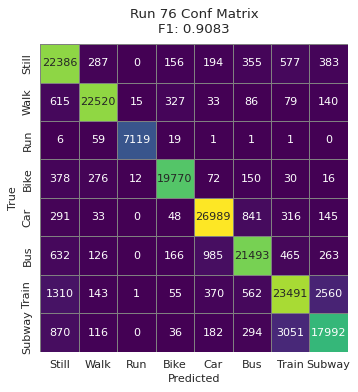


=== Run 77/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9122

Classification Report:
              precision    recall  f1-score   support

       Still     0.8554    0.9170    0.8851     24338
        Walk     0.9570    0.9446    0.9507     23815
         Run     0.9950    0.9882    0.9916      7206
        Bike     0.9629    0.9555    0.9592     20704
         Car     0.9421    0.9462    0.9442     28663
         Bus     0.9051    0.8977    0.9014     24130
       Train     0.8460    0.8323    0.8391     28492
      Subway     0.8397    0.8136    0.8265     22541

    accuracy                         0.9036    179889
   macro avg     0.9129    0.9119    0.9122    179889
weighted avg     0.9038    0.9036    0.9035    

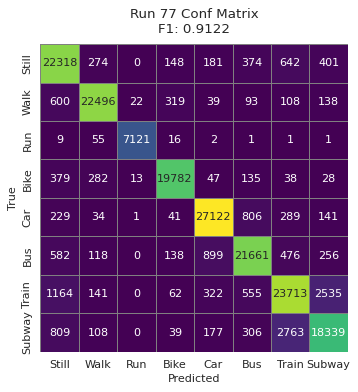


=== Run 78/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9018

Classification Report:
              precision    recall  f1-score   support

       Still     0.8332    0.9195    0.8742     24338
        Walk     0.9510    0.9421    0.9465     23815
         Run     0.9964    0.9868    0.9916      7206
        Bike     0.9583    0.9513    0.9548     20704
         Car     0.9309    0.9345    0.9327     28663
         Bus     0.8932    0.8799    0.8865     24130
       Train     0.8299    0.8132    0.8215     28492
      Subway     0.8306    0.7841    0.8067     22541

    accuracy                         0.8921    179889
   macro avg     0.9029    0.9014    0.9018    179889
weighted avg     0.8925    0.8921    0.8919

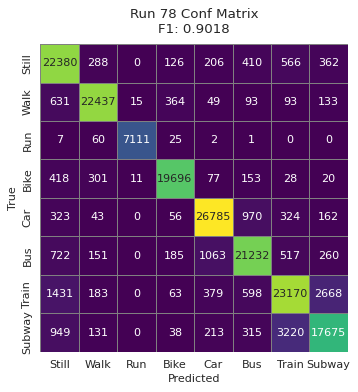


=== Run 79/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9105

Classification Report:
              precision    recall  f1-score   support

       Still     0.8555    0.9169    0.8851     24338
        Walk     0.9538    0.9449    0.9493     23815
         Run     0.9937    0.9864    0.9900      7206
        Bike     0.9610    0.9534    0.9572     20704
         Car     0.9381    0.9436    0.9408     28663
         Bus     0.9015    0.8946    0.8980     24130
       Train     0.8455    0.8337    0.8396     28492
      Subway     0.8406    0.8074    0.8237     22541

    accuracy                         0.9019    179889
   macro avg     0.9112    0.9101    0.9105    179889
weighted avg     0.9021    0.9019    0.9018   

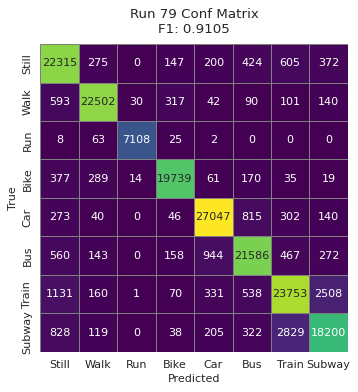


=== Run 80/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9224

Classification Report:
              precision    recall  f1-score   support

       Still     0.8620    0.9257    0.8927     24338
        Walk     0.9591    0.9523    0.9557     23815
         Run     0.9973    0.9896    0.9935      7206
        Bike     0.9692    0.9605    0.9648     20704
         Car     0.9540    0.9554    0.9547     28663
         Bus     0.9220    0.9123    0.9171     24130
       Train     0.8650    0.8501    0.8575     28492
      Subway     0.8567    0.8305    0.8434     22541

    accuracy                         0.9148    179889
   macro avg     0.9232    0.9221    0.9224    179889
weighted avg     0.9151    0.9148    0.

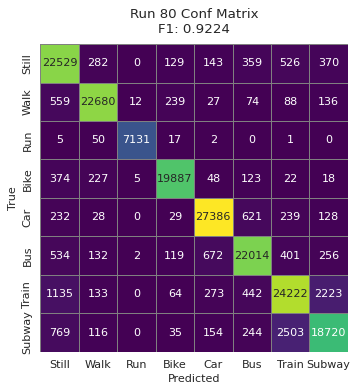


=== Run 81/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9044

Classification Report:
              precision    recall  f1-score   support

       Still     0.8470    0.9144    0.8794     24338
        Walk     0.9516    0.9423    0.9469     23815
         Run     0.9947    0.9861    0.9904      7206
        Bike     0.9561    0.9503    0.9532     20704
         Car     0.9329    0.9372    0.9351     28663
         Bus     0.8936    0.8847    0.8891     24130
       Train     0.8345    0.8216    0.8280     28492
      Subway     0.8314    0.7958    0.8132     22541

    accuracy                         0.8952    179889
   macro avg     0.9052    0.9040    0.9044    179889
weighted avg     0.8953    0.8952    0.8950  

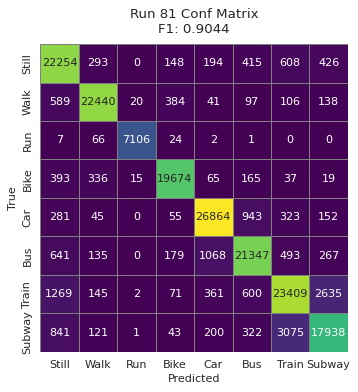


=== Run 82/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9247

Classification Report:
              precision    recall  f1-score   support

       Still     0.8603    0.9320    0.8947     24338
        Walk     0.9619    0.9522    0.9570     23815
         Run     0.9975    0.9886    0.9930      7206
        Bike     0.9695    0.9601    0.9647     20704
         Car     0.9542    0.9579    0.9561     28663
         Bus     0.9266    0.9130    0.9197     24130
       Train     0.8684    0.8552    0.8618     28492
      Subway     0.8670    0.8344    0.8504     22541

    accuracy                         0.9174    179889
   macro avg     0.9257    0.9242    0.9247    179889
weighted avg     0.9178    0.9174    0.9173   

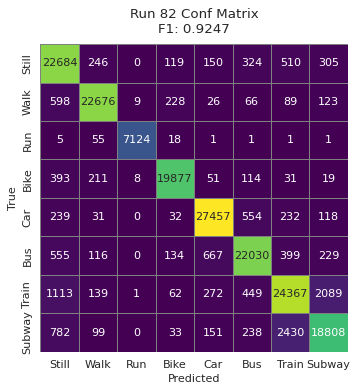


=== Run 83/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9116

Classification Report:
              precision    recall  f1-score   support

       Still     0.8558    0.9177    0.8857     24338
        Walk     0.9554    0.9462    0.9507     23815
         Run     0.9952    0.9876    0.9914      7206
        Bike     0.9621    0.9552    0.9586     20704
         Car     0.9394    0.9445    0.9420     28663
         Bus     0.9058    0.8959    0.9008     24130
       Train     0.8430    0.8348    0.8389     28492
      Subway     0.8427    0.8075    0.8247     22541

    accuracy                         0.9030    179889
   macro avg     0.9124    0.9112    0.9116    179889
weighted avg     0.9032    0.9030    0.902

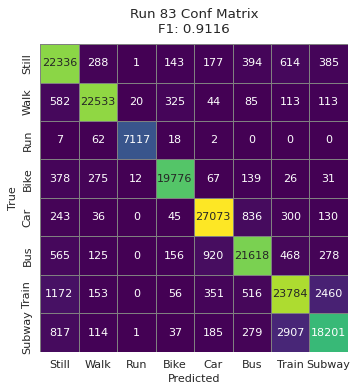


=== Run 84/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9257

Classification Report:
              precision    recall  f1-score   support

       Still     0.8653    0.9329    0.8978     24338
        Walk     0.9626    0.9520    0.9572     23815
         Run     0.9969    0.9889    0.9929      7206
        Bike     0.9696    0.9622    0.9659     20704
         Car     0.9555    0.9574    0.9564     28663
         Bus     0.9252    0.9163    0.9207     24130
       Train     0.8709    0.8560    0.8634     28492
      Subway     0.8661    0.8370    0.8513     22541

    accuracy                         0.9185    179889
   macro avg     0.9265    0.9253    0.9257    179889
weighted avg     0.9189    0.9185    

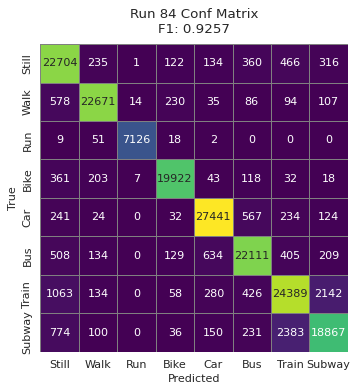


=== Run 85/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9178

Classification Report:
              precision    recall  f1-score   support

       Still     0.8520    0.9276    0.8882     24338
        Walk     0.9604    0.9498    0.9551     23815
         Run     0.9975    0.9886    0.9930      7206
        Bike     0.9674    0.9583    0.9629     20704
         Car     0.9475    0.9498    0.9487     28663
         Bus     0.9150    0.9029    0.9089     24130
       Train     0.8548    0.8423    0.8485     28492
      Subway     0.8560    0.8191    0.8371     22541

    accuracy                         0.9096    179889
   macro avg     0.9188    0.9173    0.9178    179889
weighted avg     0.9101    0.9096    0.9096  

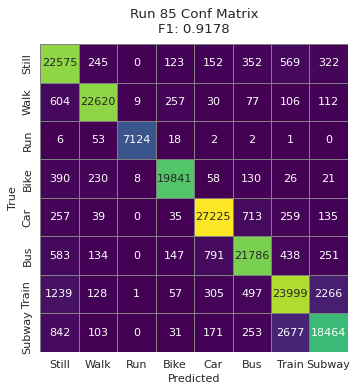


=== Run 86/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9145

Classification Report:
              precision    recall  f1-score   support

       Still     0.8464    0.9284    0.8855     24338
        Walk     0.9574    0.9461    0.9517     23815
         Run     0.9966    0.9882    0.9924      7206
        Bike     0.9634    0.9557    0.9595     20704
         Car     0.9430    0.9479    0.9455     28663
         Bus     0.9112    0.8969    0.9040     24130
       Train     0.8548    0.8360    0.8453     28492
      Subway     0.8510    0.8134    0.8318     22541

    accuracy                         0.9061    179889
   macro avg     0.9155    0.9141    0.9145    179889
weighted avg     0.9066    0.9061    0

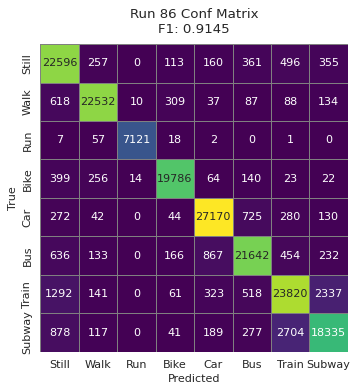


=== Run 87/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9177

Classification Report:
              precision    recall  f1-score   support

       Still     0.8570    0.9258    0.8900     24338
        Walk     0.9580    0.9478    0.9529     23815
         Run     0.9961    0.9876    0.9918      7206
        Bike     0.9640    0.9575    0.9607     20704
         Car     0.9502    0.9501    0.9502     28663
         Bus     0.9133    0.9056    0.9094     24130
       Train     0.8569    0.8442    0.8505     28492
      Subway     0.8525    0.8195    0.8357     22541

    accuracy                         0.9098    179889
   macro avg     0.9185    0.9173    0.9177    179889
weighted avg     0.9101    0.9098    0.9097 

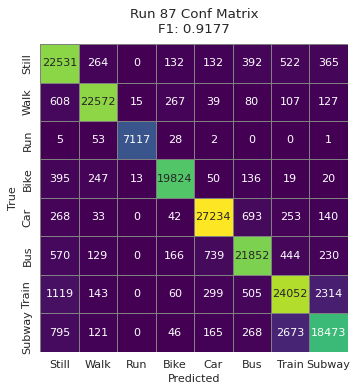


=== Run 88/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9024

Classification Report:
              precision    recall  f1-score   support

       Still     0.8367    0.9190    0.8759     24338
        Walk     0.9523    0.9404    0.9463     23815
         Run     0.9945    0.9870    0.9907      7206
        Bike     0.9557    0.9496    0.9526     20704
         Car     0.9282    0.9356    0.9319     28663
         Bus     0.8946    0.8803    0.8874     24130
       Train     0.8335    0.8170    0.8252     28492
      Subway     0.8321    0.7882    0.8096     22541

    accuracy                         0.8930    179889
   macro avg     0.9035    0.9021    0.9024    179889
weighted avg     0.8933    0.8930    0.8928   

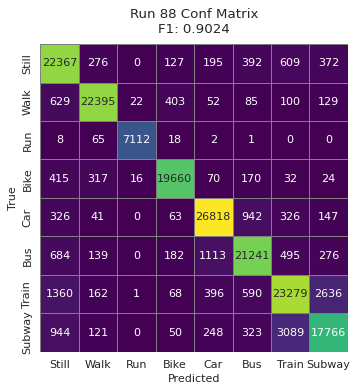


=== Run 89/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9064

Classification Report:
              precision    recall  f1-score   support

       Still     0.8433    0.9194    0.8797     24338
        Walk     0.9535    0.9433    0.9484     23815
         Run     0.9945    0.9867    0.9906      7206
        Bike     0.9599    0.9519    0.9559     20704
         Car     0.9328    0.9411    0.9369     28663
         Bus     0.8994    0.8852    0.8922     24130
       Train     0.8340    0.8278    0.8309     28492
      Subway     0.8427    0.7913    0.8162     22541

    accuracy                         0.8973    179889
   macro avg     0.9075    0.9058    0.9064    179889
weighted avg     0.8976    0.8973    0.8971   

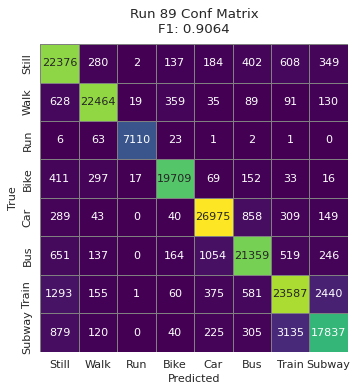


=== Run 90/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9195

Classification Report:
              precision    recall  f1-score   support

       Still     0.8579    0.9275    0.8913     24338
        Walk     0.9590    0.9479    0.9534     23815
         Run     0.9968    0.9879    0.9923      7206
        Bike     0.9669    0.9586    0.9627     20704
         Car     0.9508    0.9530    0.9519     28663
         Bus     0.9182    0.9072    0.9127     24130
       Train     0.8579    0.8473    0.8526     28492
      Subway     0.8558    0.8223    0.8387     22541

    accuracy                         0.9117    179889
   macro avg     0.9204    0.9190    0.9195    179889
weighted avg     0.9120    0.9117    0.9116 

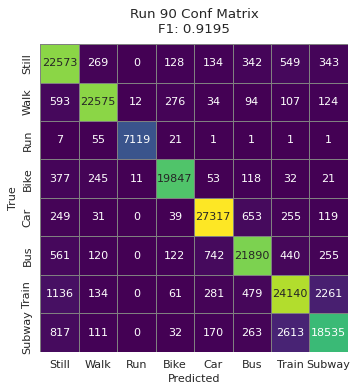


=== Run 91/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9171

Classification Report:
              precision    recall  f1-score   support

       Still     0.8617    0.9185    0.8892     24338
        Walk     0.9568    0.9477    0.9523     23815
         Run     0.9957    0.9879    0.9918      7206
        Bike     0.9657    0.9576    0.9616     20704
         Car     0.9493    0.9512    0.9503     28663
         Bus     0.9122    0.9059    0.9090     24130
       Train     0.8529    0.8438    0.8483     28492
      Subway     0.8487    0.8210    0.8346     22541

    accuracy                         0.9091    179889
   macro avg     0.9179    0.9167    0.9171    179889
weighted avg     0.9093    0.9091    0.909

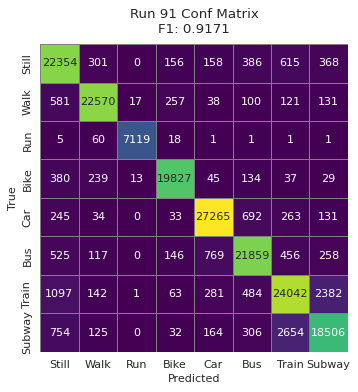


=== Run 92/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9131

Classification Report:
              precision    recall  f1-score   support

       Still     0.8463    0.9271    0.8849     24338
        Walk     0.9580    0.9470    0.9524     23815
         Run     0.9959    0.9876    0.9918      7206
        Bike     0.9631    0.9549    0.9590     20704
         Car     0.9415    0.9449    0.9432     28663
         Bus     0.9077    0.8957    0.9017     24130
       Train     0.8511    0.8338    0.8424     28492
      Subway     0.8495    0.8111    0.8298     22541

    accuracy                         0.9047    179889
   macro avg     0.9141    0.9128    0.9131    179889
weighted avg     0.9051    0.9047    0.904

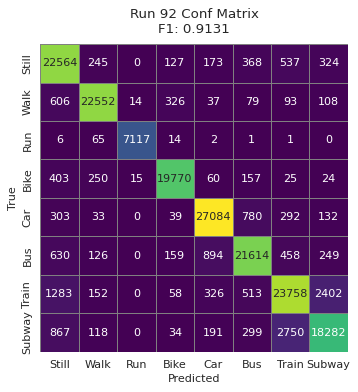


=== Run 93/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9232

Classification Report:
              precision    recall  f1-score   support

       Still     0.8654    0.9260    0.8947     24338
        Walk     0.9597    0.9515    0.9556     23815
         Run     0.9968    0.9889    0.9928      7206
        Bike     0.9696    0.9625    0.9660     20704
         Car     0.9535    0.9567    0.9551     28663
         Bus     0.9225    0.9126    0.9175     24130
       Train     0.8653    0.8508    0.8580     28492
      Subway     0.8583    0.8334    0.8457     22541

    accuracy                         0.9157    179889
   macro avg     0.9239    0.9228    0.9232    179889
weighted avg     0.9159    0.9157    0.9156

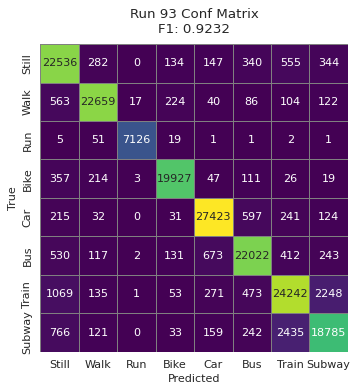


=== Run 94/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9138

Classification Report:
              precision    recall  f1-score   support

       Still     0.8506    0.9214    0.8846     24338
        Walk     0.9571    0.9489    0.9530     23815
         Run     0.9962    0.9879    0.9921      7206
        Bike     0.9638    0.9555    0.9596     20704
         Car     0.9434    0.9474    0.9454     28663
         Bus     0.9082    0.8971    0.9026     24130
       Train     0.8502    0.8363    0.8432     28492
      Subway     0.8480    0.8123    0.8297     22541

    accuracy                         0.9054    179889
   macro avg     0.9147    0.9134    0.9138    179889
weighted avg     0.9057    0.9054    0.9053

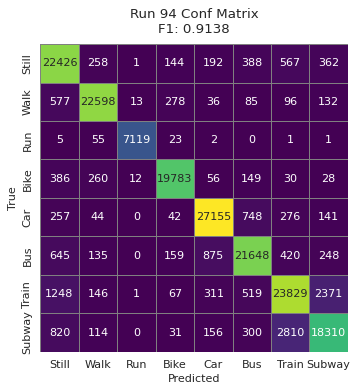


=== Run 95/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9078

Classification Report:
              precision    recall  f1-score   support

       Still     0.8366    0.9235    0.8779     24338
        Walk     0.9577    0.9460    0.9518     23815
         Run     0.9966    0.9878    0.9922      7206
        Bike     0.9633    0.9543    0.9588     20704
         Car     0.9362    0.9418    0.9390     28663
         Bus     0.9014    0.8874    0.8944     24130
       Train     0.8392    0.8231    0.8311     28492
      Subway     0.8405    0.7948    0.8170     22541

    accuracy                         0.8986    179889
   macro avg     0.9090    0.9073    0.9078    179889
weighted avg     0.8991    0.8986    0.8985    

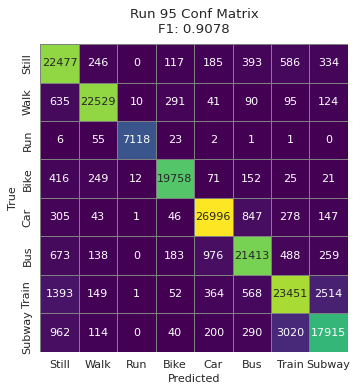


=== Run 96/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9012

Classification Report:
              precision    recall  f1-score   support

       Still     0.8303    0.9190    0.8724     24338
        Walk     0.9530    0.9415    0.9472     23815
         Run     0.9959    0.9850    0.9904      7206
        Bike     0.9574    0.9512    0.9543     20704
         Car     0.9287    0.9343    0.9315     28663
         Bus     0.8919    0.8777    0.8847     24130
       Train     0.8305    0.8125    0.8214     28492
      Subway     0.8314    0.7846    0.8073     22541

    accuracy                         0.8915    179889
   macro avg     0.9024    0.9007    0.9012    179889
weighted avg     0.8919    0.8915    0.8913

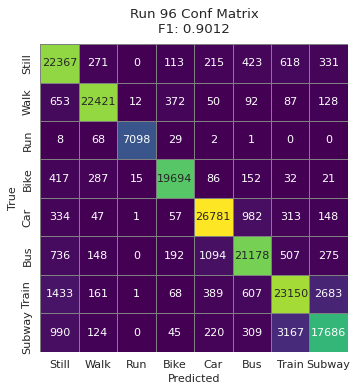


=== Run 97/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9058

Classification Report:
              precision    recall  f1-score   support

       Still     0.8428    0.9181    0.8788     24338
        Walk     0.9532    0.9432    0.9482     23815
         Run     0.9950    0.9875    0.9912      7206
        Bike     0.9590    0.9501    0.9545     20704
         Car     0.9330    0.9387    0.9358     28663
         Bus     0.8961    0.8835    0.8897     24130
       Train     0.8384    0.8242    0.8313     28492
      Subway     0.8365    0.7983    0.8169     22541

    accuracy                         0.8966    179889
   macro avg     0.9067    0.9054    0.9058    179889
weighted avg     0.8969    0.8966    0.8965

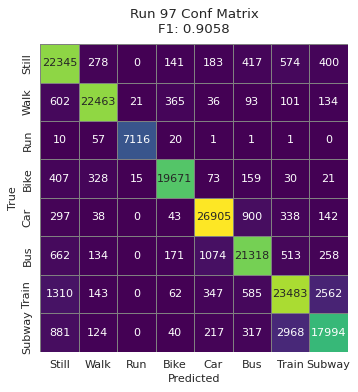


=== Run 98/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9028

Classification Report:
              precision    recall  f1-score   support

       Still     0.8438    0.9142    0.8776     24338
        Walk     0.9518    0.9426    0.9472     23815
         Run     0.9951    0.9874    0.9912      7206
        Bike     0.9581    0.9500    0.9540     20704
         Car     0.9301    0.9361    0.9331     28663
         Bus     0.8924    0.8803    0.8863     24130
       Train     0.8294    0.8195    0.8244     28492
      Subway     0.8287    0.7887    0.8082     22541

    accuracy                         0.8932    179889
   macro avg     0.9037    0.9024    0.9028    179889
weighted avg     0.8934    0.8932    0.8931

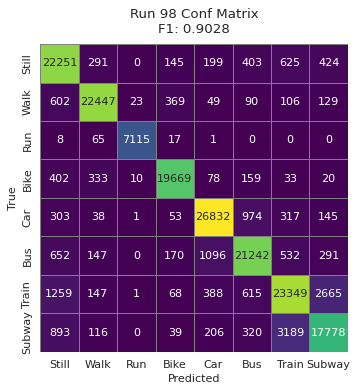


=== Run 99/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9245

Classification Report:
              precision    recall  f1-score   support

       Still     0.8646    0.9277    0.8950     24338
        Walk     0.9598    0.9523    0.9560     23815
         Run     0.9978    0.9895    0.9936      7206
        Bike     0.9709    0.9618    0.9663     20704
         Car     0.9552    0.9575    0.9564     28663
         Bus     0.9220    0.9141    0.9180     24130
       Train     0.8702    0.8547    0.8624     28492
      Subway     0.8619    0.8354    0.8484     22541

    accuracy                         0.9171    179889
   macro avg     0.9253    0.9241    0.9245    179889
weighted avg     0.9174    0.9171    0.91

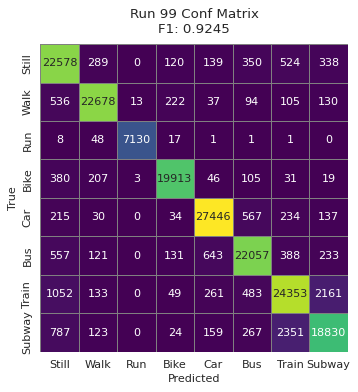


=== Run 100/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9047

Classification Report:
              precision    recall  f1-score   support

       Still     0.8445    0.9154    0.8785     24338
        Walk     0.9512    0.9415    0.9463     23815
         Run     0.9937    0.9854    0.9895      7206
        Bike     0.9561    0.9489    0.9525     20704
         Car     0.9323    0.9391    0.9357     28663
         Bus     0.8957    0.8835    0.8895     24130
       Train     0.8359    0.8263    0.8310     28492
      Subway     0.8361    0.7939    0.8145     22541

    accuracy                         0.8957    179889
   macro avg     0.9057    0.9042    0.9047    179889
weighted avg     0.8959    0.8957    0.8955  

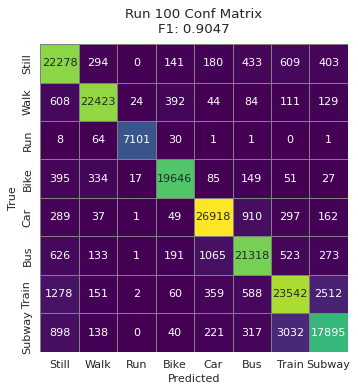


=== Run 101/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9182

Classification Report:
              precision    recall  f1-score   support

       Still     0.8531    0.9312    0.8905     24338
        Walk     0.9592    0.9487    0.9540     23815
         Run     0.9965    0.9878    0.9921      7206
        Bike     0.9670    0.9569    0.9619     20704
         Car     0.9465    0.9496    0.9480     28663
         Bus     0.9144    0.9016    0.9080     24130
       Train     0.8601    0.8459    0.8529     28492
      Subway     0.8573    0.8201    0.8383     22541

    accuracy                         0.9103    179889
   macro avg     0.9193    0.9177    0.9182    179889
weighted avg     0.9107    0.9103    0

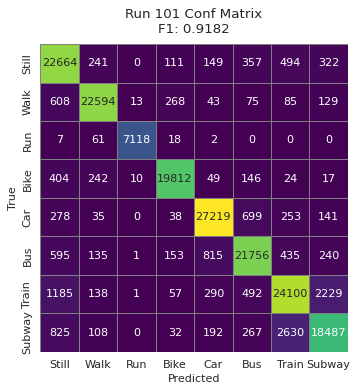


=== Run 102/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9199

Classification Report:
              precision    recall  f1-score   support

       Still     0.8628    0.9222    0.8915     24338
        Walk     0.9590    0.9499    0.9544     23815
         Run     0.9968    0.9882    0.9925      7206
        Bike     0.9667    0.9596    0.9632     20704
         Car     0.9518    0.9531    0.9525     28663
         Bus     0.9170    0.9080    0.9125     24130
       Train     0.8585    0.8487    0.8536     28492
      Subway     0.8532    0.8261    0.8394     22541

    accuracy                         0.9122    179889
   macro avg     0.9207    0.9195    0.9199    179889
weighted avg     0.9124    0.9122    0

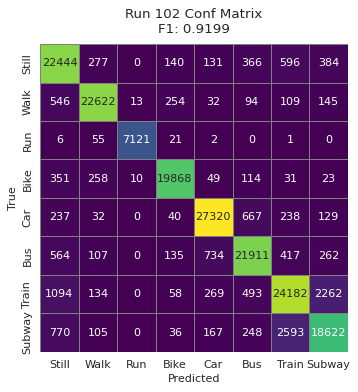


=== Run 103/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9124

Classification Report:
              precision    recall  f1-score   support

       Still     0.8544    0.9172    0.8847     24338
        Walk     0.9566    0.9451    0.9508     23815
         Run     0.9968    0.9876    0.9922      7206
        Bike     0.9608    0.9556    0.9582     20704
         Car     0.9435    0.9459    0.9447     28663
         Bus     0.9057    0.8979    0.9018     24130
       Train     0.8457    0.8364    0.8410     28492
      Subway     0.8424    0.8094    0.8256     22541

    accuracy                         0.9038    179889
   macro avg     0.9132    0.9119    0.9124    179889
weighted avg     0.9041    0.9038    0.9

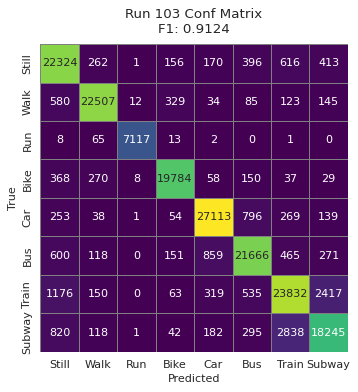


=== Run 104/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9104

Classification Report:
              precision    recall  f1-score   support

       Still     0.8410    0.9262    0.8816     24338
        Walk     0.9560    0.9445    0.9502     23815
         Run     0.9964    0.9878    0.9921      7206
        Bike     0.9610    0.9538    0.9574     20704
         Car     0.9390    0.9451    0.9420     28663
         Bus     0.9057    0.8897    0.8976     24130
       Train     0.8473    0.8297    0.8384     28492
      Subway     0.8461    0.8036    0.8243     22541

    accuracy                         0.9017    179889
   macro avg     0.9116    0.9101    0.9104    179889
weighted avg     0.9022    0.9017    0.9016  

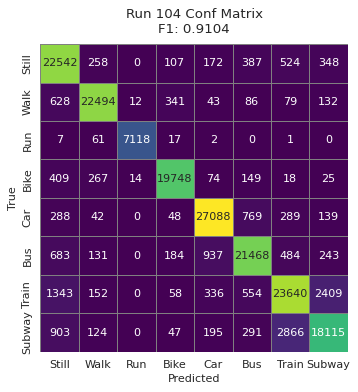


=== Run 105/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9100

Classification Report:
              precision    recall  f1-score   support

       Still     0.8536    0.9183    0.8848     24338
        Walk     0.9545    0.9461    0.9503     23815
         Run     0.9948    0.9868    0.9908      7206
        Bike     0.9590    0.9546    0.9568     20704
         Car     0.9384    0.9423    0.9404     28663
         Bus     0.9010    0.8927    0.8968     24130
       Train     0.8431    0.8306    0.8368     28492
      Subway     0.8415    0.8056    0.8232     22541

    accuracy                         0.9013    179889
   macro avg     0.9107    0.9096    0.9100    179889
weighted avg     0.9014    0.9013    

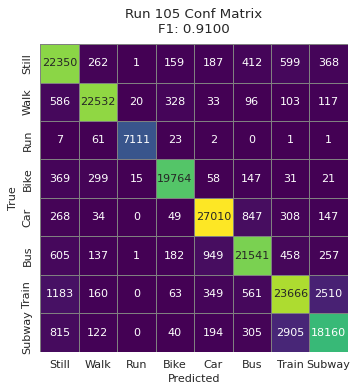


=== Run 106/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9120

Classification Report:
              precision    recall  f1-score   support

       Still     0.8543    0.9152    0.8837     24338
        Walk     0.9560    0.9469    0.9514     23815
         Run     0.9961    0.9885    0.9923      7206
        Bike     0.9634    0.9561    0.9597     20704
         Car     0.9422    0.9435    0.9429     28663
         Bus     0.9037    0.8983    0.9010     24130
       Train     0.8459    0.8333    0.8396     28492
      Subway     0.8405    0.8117    0.8259     22541

    accuracy                         0.9034    179889
   macro avg     0.9127    0.9117    0.9120    179889
weighted avg     0.9036    0.9034    0.9033 

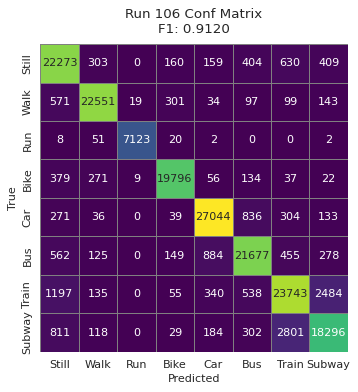


=== Run 107/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9227

Classification Report:
              precision    recall  f1-score   support

       Still     0.8641    0.9272    0.8945     24338
        Walk     0.9603    0.9507    0.9555     23815
         Run     0.9964    0.9883    0.9923      7206
        Bike     0.9677    0.9614    0.9645     20704
         Car     0.9533    0.9550    0.9542     28663
         Bus     0.9193    0.9126    0.9159     24130
       Train     0.8680    0.8504    0.8591     28492
      Subway     0.8582    0.8338    0.8458     22541

    accuracy                         0.9153    179889
   macro avg     0.9234    0.9224    0.9227    179889
weighted avg     0.9155    0.9153    0.91

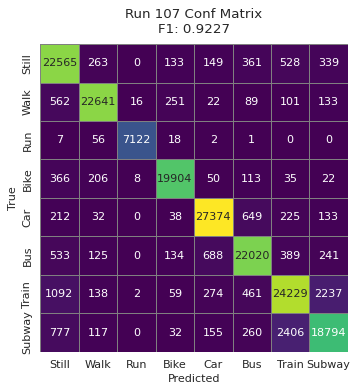


=== Run 108/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9196

Classification Report:
              precision    recall  f1-score   support

       Still     0.8644    0.9229    0.8927     24338
        Walk     0.9583    0.9497    0.9539     23815
         Run     0.9959    0.9879    0.9919      7206
        Bike     0.9651    0.9595    0.9623     20704
         Car     0.9487    0.9526    0.9506     28663
         Bus     0.9153    0.9061    0.9107     24130
       Train     0.8606    0.8469    0.8537     28492
      Subway     0.8539    0.8284    0.8409     22541

    accuracy                         0.9118    179889
   macro avg     0.9203    0.9192    0.9196    179889
weighted avg     0.9120    0.9118    0.

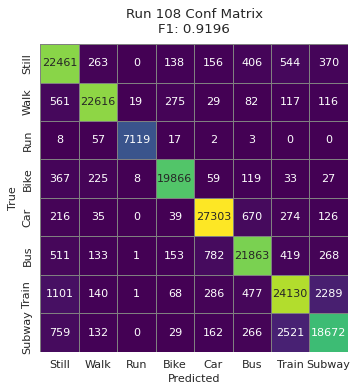


=== Run 109/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9064

Classification Report:
              precision    recall  f1-score   support

       Still     0.8489    0.9159    0.8811     24338
        Walk     0.9540    0.9425    0.9482     23815
         Run     0.9945    0.9870    0.9907      7206
        Bike     0.9580    0.9526    0.9553     20704
         Car     0.9323    0.9401    0.9362     28663
         Bus     0.8957    0.8851    0.8904     24130
       Train     0.8377    0.8249    0.8312     28492
      Subway     0.8365    0.8000    0.8178     22541

    accuracy                         0.8973    179889
   macro avg     0.9072    0.9060    0.9064    179889
weighted avg     0.8974    0.8973    0.897

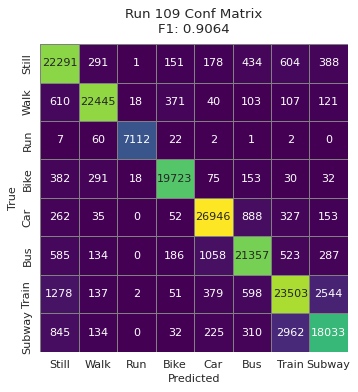


=== Run 110/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9119

Classification Report:
              precision    recall  f1-score   support

       Still     0.8451    0.9267    0.8840     24338
        Walk     0.9571    0.9467    0.9519     23815
         Run     0.9959    0.9875    0.9917      7206
        Bike     0.9653    0.9549    0.9601     20704
         Car     0.9413    0.9448    0.9430     28663
         Bus     0.9060    0.8924    0.8991     24130
       Train     0.8473    0.8324    0.8398     28492
      Subway     0.8459    0.8064    0.8257     22541

    accuracy                         0.9033    179889
   macro avg     0.9130    0.9115    0.9119    179889
weighted avg     0.9037    0.9033    0.9032 

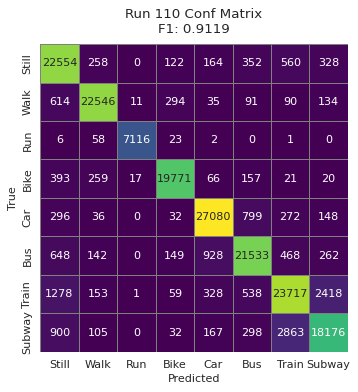


=== Run 111/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9181

Classification Report:
              precision    recall  f1-score   support

       Still     0.8590    0.9242    0.8904     24338
        Walk     0.9582    0.9496    0.9539     23815
         Run     0.9957    0.9881    0.9919      7206
        Bike     0.9655    0.9586    0.9620     20704
         Car     0.9489    0.9517    0.9503     28663
         Bus     0.9125    0.9061    0.9093     24130
       Train     0.8569    0.8438    0.8503     28492
      Subway     0.8542    0.8198    0.8367     22541

    accuracy                         0.9102    179889
   macro avg     0.9189    0.9177    0.9181    179889
weighted avg     0.9104    0.9102    0

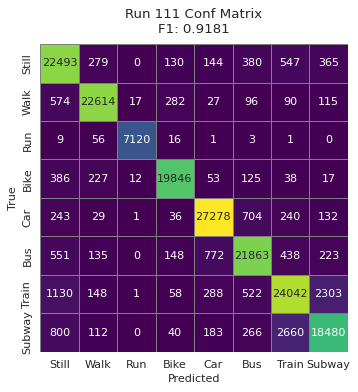


=== Run 112/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9138

Classification Report:
              precision    recall  f1-score   support

       Still     0.8524    0.9223    0.8860     24338
        Walk     0.9568    0.9481    0.9525     23815
         Run     0.9971    0.9881    0.9925      7206
        Bike     0.9652    0.9565    0.9608     20704
         Car     0.9428    0.9466    0.9447     28663
         Bus     0.9089    0.8988    0.9038     24130
       Train     0.8476    0.8367    0.8421     28492
      Subway     0.8474    0.8095    0.8280     22541

    accuracy                         0.9053    179889
   macro avg     0.9148    0.9133    0.9138    179889
weighted avg     0.9056    0.9053    0.9052  

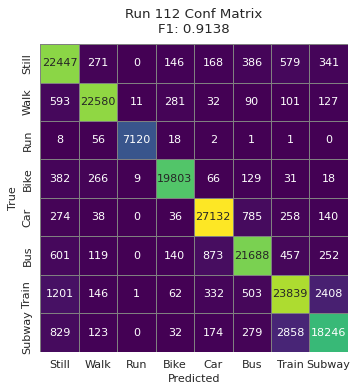


=== Run 113/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9229

Classification Report:
              precision    recall  f1-score   support

       Still     0.8585    0.9302    0.8929     24338
        Walk     0.9616    0.9522    0.9569     23815
         Run     0.9978    0.9889    0.9933      7206
        Bike     0.9693    0.9604    0.9648     20704
         Car     0.9543    0.9559    0.9551     28663
         Bus     0.9206    0.9115    0.9160     24130
       Train     0.8653    0.8517    0.8585     28492
      Subway     0.8636    0.8287    0.8458     22541

    accuracy                         0.9154    179889
   macro avg     0.9239    0.9224    0.9229    179889
weighted avg     0.9158    0.9154    0.

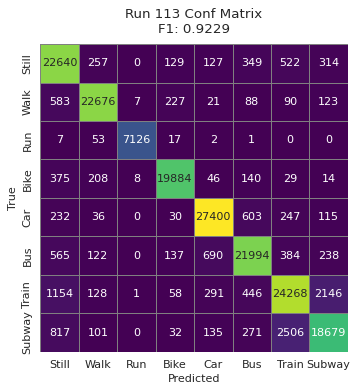


=== Run 114/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9108

Classification Report:
              precision    recall  f1-score   support

       Still     0.8541    0.9184    0.8851     24338
        Walk     0.9535    0.9452    0.9493     23815
         Run     0.9947    0.9860    0.9903      7206
        Bike     0.9612    0.9525    0.9569     20704
         Car     0.9397    0.9439    0.9418     28663
         Bus     0.9026    0.8956    0.8991     24130
       Train     0.8454    0.8333    0.8393     28492
      Subway     0.8416    0.8076    0.8242     22541

    accuracy                         0.9022    179889
   macro avg     0.9116    0.9103    0.9108    179889
weighted avg     0.9024    0.9022    0.9021 

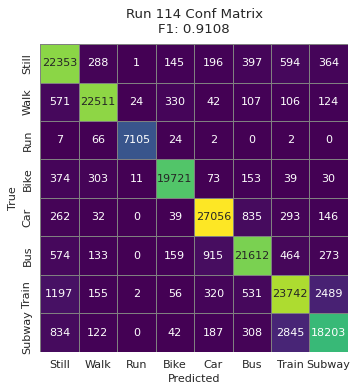


=== Run 115/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9119

Classification Report:
              precision    recall  f1-score   support

       Still     0.8423    0.9237    0.8811     24338
        Walk     0.9584    0.9475    0.9529     23815
         Run     0.9972    0.9881    0.9926      7206
        Bike     0.9655    0.9566    0.9610     20704
         Car     0.9432    0.9467    0.9449     28663
         Bus     0.9080    0.8949    0.9014     24130
       Train     0.8438    0.8302    0.8369     28492
      Subway     0.8458    0.8037    0.8242     22541

    accuracy                         0.9032    179889
   macro avg     0.9130    0.9114    0.9119    179889
weighted avg     0.9036    0.9032    0.9030  

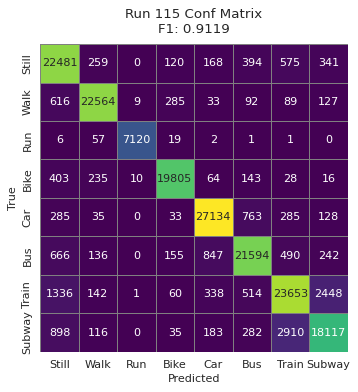


=== Run 116/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9192

Classification Report:
              precision    recall  f1-score   support

       Still     0.8539    0.9281    0.8894     24338
        Walk     0.9607    0.9504    0.9555     23815
         Run     0.9979    0.9881    0.9930      7206
        Bike     0.9674    0.9587    0.9631     20704
         Car     0.9489    0.9531    0.9510     28663
         Bus     0.9185    0.9046    0.9115     24130
       Train     0.8580    0.8451    0.8515     28492
      Subway     0.8565    0.8209    0.8383     22541

    accuracy                         0.9112    179889
   macro avg     0.9202    0.9186    0.9192    179889
weighted avg     0.9116    0.9112    0.

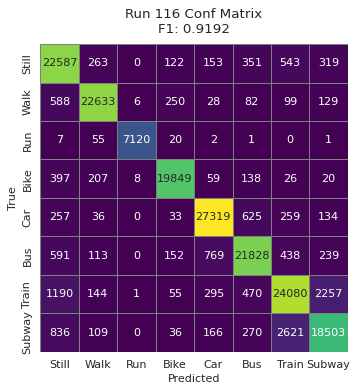


=== Run 117/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9115

Classification Report:
              precision    recall  f1-score   support

       Still     0.8556    0.9198    0.8865     24338
        Walk     0.9564    0.9455    0.9509     23815
         Run     0.9940    0.9879    0.9910      7206
        Bike     0.9612    0.9557    0.9585     20704
         Car     0.9409    0.9440    0.9425     28663
         Bus     0.9055    0.8974    0.9014     24130
       Train     0.8433    0.8353    0.8393     28492
      Subway     0.8408    0.8037    0.8218     22541

    accuracy                         0.9030    179889
   macro avg     0.9122    0.9112    0.9115    179889
weighted avg     0.9031    0.9030    0.9028  

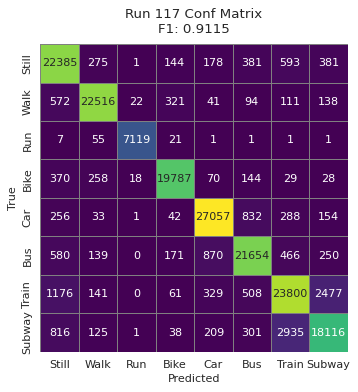


=== Run 118/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9101

Classification Report:
              precision    recall  f1-score   support

       Still     0.8477    0.9205    0.8826     24338
        Walk     0.9552    0.9455    0.9503     23815
         Run     0.9955    0.9874    0.9914      7206
        Bike     0.9619    0.9535    0.9577     20704
         Car     0.9385    0.9445    0.9415     28663
         Bus     0.9042    0.8909    0.8975     24130
       Train     0.8435    0.8308    0.8371     28492
      Subway     0.8419    0.8041    0.8226     22541

    accuracy                         0.9014    179889
   macro avg     0.9110    0.9097    0.9101    179889
weighted avg     0.9016    0.9014    0.9

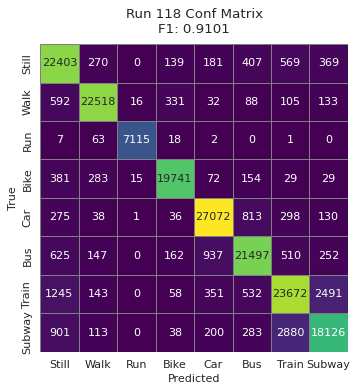


=== Run 119/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9093

Classification Report:
              precision    recall  f1-score   support

       Still     0.8529    0.9182    0.8843     24338
        Walk     0.9526    0.9445    0.9486     23815
         Run     0.9946    0.9890    0.9918      7206
        Bike     0.9590    0.9534    0.9562     20704
         Car     0.9370    0.9415    0.9393     28663
         Bus     0.9002    0.8906    0.8954     24130
       Train     0.8437    0.8311    0.8374     28492
      Subway     0.8395    0.8038    0.8213     22541

    accuracy                         0.9005    179889
   macro avg     0.9099    0.9090    0.9093    179889
weighted avg     0.9006    0.9005    0.90

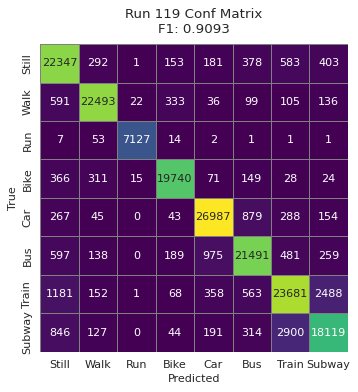


=== Run 120/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9009

Classification Report:
              precision    recall  f1-score   support

       Still     0.8391    0.9136    0.8748     24338
        Walk     0.9500    0.9403    0.9451     23815
         Run     0.9934    0.9849    0.9891      7206
        Bike     0.9547    0.9471    0.9509     20704
         Car     0.9284    0.9344    0.9314     28663
         Bus     0.8892    0.8760    0.8826     24130
       Train     0.8302    0.8164    0.8232     28492
      Subway     0.8295    0.7910    0.8098     22541

    accuracy                         0.8914    179889
   macro avg     0.9018    0.9005    0.9009    179889
weighted avg     0.8916    0.8914    0.8912 

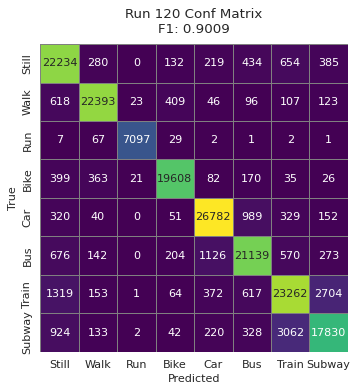


=== Run 121/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9013

Classification Report:
              precision    recall  f1-score   support

       Still     0.8291    0.9198    0.8721     24338
        Walk     0.9511    0.9415    0.9463     23815
         Run     0.9957    0.9857    0.9907      7206
        Bike     0.9567    0.9496    0.9531     20704
         Car     0.9286    0.9352    0.9319     28663
         Bus     0.8920    0.8793    0.8856     24130
       Train     0.8331    0.8155    0.8242     28492
      Subway     0.8345    0.7809    0.8068     22541

    accuracy                         0.8918    179889
   macro avg     0.9026    0.9009    0.9013    179889
weighted avg     0.8922    0.8918    0.8

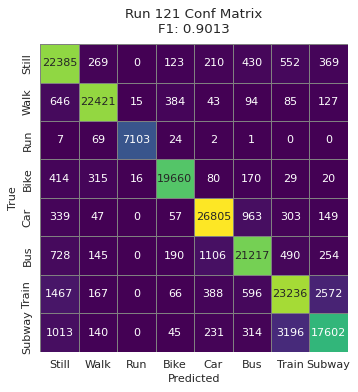


=== Run 122/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9173

Classification Report:
              precision    recall  f1-score   support

       Still     0.8606    0.9200    0.8893     24338
        Walk     0.9573    0.9490    0.9531     23815
         Run     0.9953    0.9886    0.9919      7206
        Bike     0.9656    0.9583    0.9620     20704
         Car     0.9506    0.9501    0.9503     28663
         Bus     0.9117    0.9063    0.9090     24130
       Train     0.8536    0.8424    0.8479     28492
      Subway     0.8488    0.8211    0.8348     22541

    accuracy                         0.9093    179889
   macro avg     0.9179    0.9170    0.9173    179889
weighted avg     0.9095    0.9093    0.9092

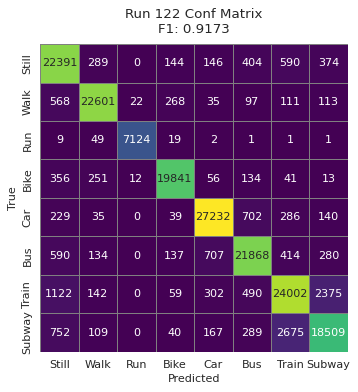


=== Run 123/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9130

Classification Report:
              precision    recall  f1-score   support

       Still     0.8450    0.9258    0.8836     24338
        Walk     0.9581    0.9469    0.9525     23815
         Run     0.9957    0.9868    0.9912      7206
        Bike     0.9646    0.9555    0.9601     20704
         Car     0.9422    0.9467    0.9444     28663
         Bus     0.9074    0.8947    0.9010     24130
       Train     0.8507    0.8339    0.8422     28492
      Subway     0.8492    0.8104    0.8293     22541

    accuracy                         0.9046    179889
   macro avg     0.9141    0.9126    0.9130    179889
weighted avg     0.9051    0.9046    0.

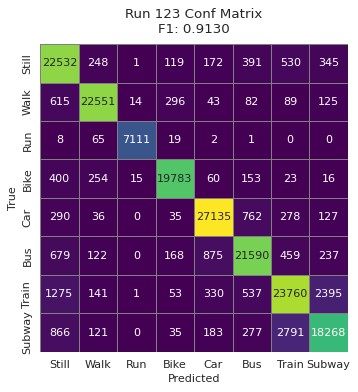


=== Run 124/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9122

Classification Report:
              precision    recall  f1-score   support

       Still     0.8581    0.9178    0.8869     24338
        Walk     0.9552    0.9453    0.9502     23815
         Run     0.9948    0.9875    0.9912      7206
        Bike     0.9616    0.9563    0.9590     20704
         Car     0.9425    0.9451    0.9438     28663
         Bus     0.9031    0.8981    0.9006     24130
       Train     0.8462    0.8367    0.8414     28492
      Subway     0.8418    0.8080    0.8246     22541

    accuracy                         0.9038    179889
   macro avg     0.9129    0.9119    0.9122    179889
weighted avg     0.9039    0.9038    0.9

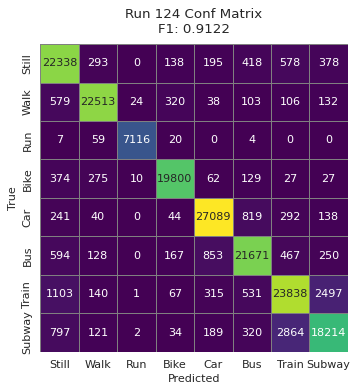


=== Run 125/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9090

Classification Report:
              precision    recall  f1-score   support

       Still     0.8477    0.9193    0.8821     24338
        Walk     0.9551    0.9459    0.9505     23815
         Run     0.9959    0.9876    0.9918      7206
        Bike     0.9615    0.9541    0.9578     20704
         Car     0.9372    0.9426    0.9399     28663
         Bus     0.9038    0.8920    0.8979     24130
       Train     0.8386    0.8269    0.8327     28492
      Subway     0.8398    0.8001    0.8195     22541

    accuracy                         0.9001    179889
   macro avg     0.9099    0.9086    0.9090    179889
weighted avg     0.9003    0.9001    0.8999

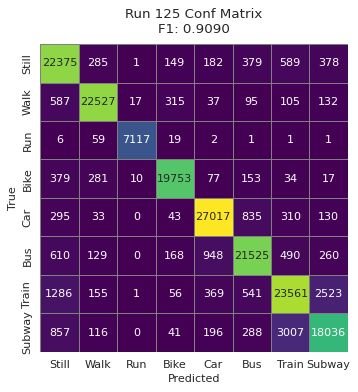


=== Run 126/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9255

Classification Report:
              precision    recall  f1-score   support

       Still     0.8656    0.9284    0.8959     24338
        Walk     0.9604    0.9525    0.9564     23815
         Run     0.9969    0.9892    0.9930      7206
        Bike     0.9705    0.9627    0.9666     20704
         Car     0.9581    0.9596    0.9588     28663
         Bus     0.9262    0.9157    0.9209     24130
       Train     0.8683    0.8570    0.8626     28492
      Subway     0.8645    0.8358    0.8499     22541

    accuracy                         0.9183    179889
   macro avg     0.9263    0.9251    0.9255    179889
weighted avg     0.9186    0.9183    0.

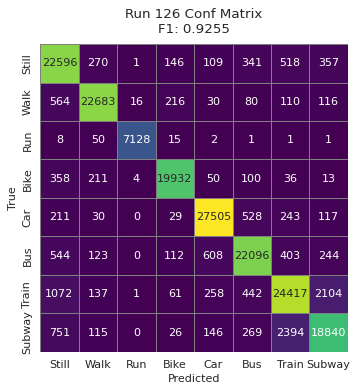


=== Run 127/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9283

Classification Report:
              precision    recall  f1-score   support

       Still     0.8650    0.9355    0.8989     24338
        Walk     0.9630    0.9531    0.9580     23815
         Run     0.9980    0.9889    0.9934      7206
        Bike     0.9714    0.9632    0.9673     20704
         Car     0.9590    0.9605    0.9598     28663
         Bus     0.9302    0.9172    0.9237     24130
       Train     0.8761    0.8612    0.8686     28492
      Subway     0.8713    0.8434    0.8571     22541

    accuracy                         0.9214    179889
   macro avg     0.9293    0.9279    0.9283    179889
weighted avg     0.9218    0.9214    0.

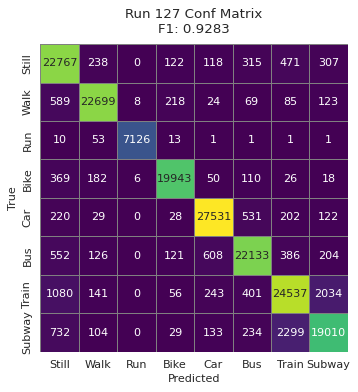


=== Run 128/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9179

Classification Report:
              precision    recall  f1-score   support

       Still     0.8585    0.9243    0.8902     24338
        Walk     0.9587    0.9503    0.9545     23815
         Run     0.9965    0.9892    0.9928      7206
        Bike     0.9674    0.9592    0.9633     20704
         Car     0.9474    0.9490    0.9482     28663
         Bus     0.9133    0.9036    0.9084     24130
       Train     0.8557    0.8428    0.8492     28492
      Subway     0.8517    0.8218    0.8365     22541

    accuracy                         0.9098    179889
   macro avg     0.9186    0.9175    0.9179    179889
weighted avg     0.9100    0.9098    0.9097

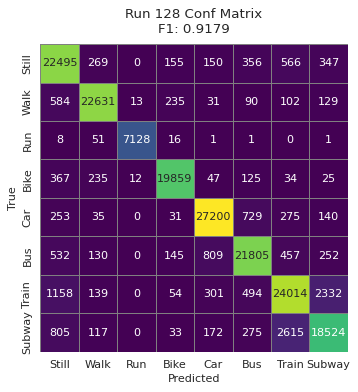


=== Run 129/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9197

Classification Report:
              precision    recall  f1-score   support

       Still     0.8632    0.9267    0.8938     24338
        Walk     0.9592    0.9498    0.9545     23815
         Run     0.9962    0.9886    0.9924      7206
        Bike     0.9660    0.9601    0.9631     20704
         Car     0.9504    0.9532    0.9518     28663
         Bus     0.9179    0.9082    0.9130     24130
       Train     0.8591    0.8448    0.8519     28492
      Subway     0.8513    0.8237    0.8373     22541

    accuracy                         0.9119    179889
   macro avg     0.9204    0.9194    0.9197    179889
weighted avg     0.9122    0.9119    0.9

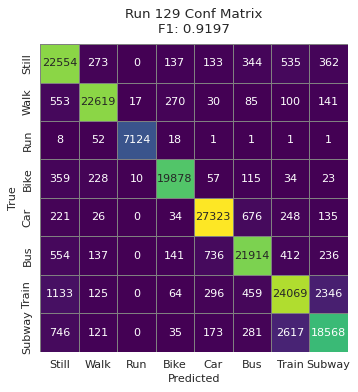


=== Run 130/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9009

Classification Report:
              precision    recall  f1-score   support

       Still     0.8404    0.9134    0.8754     24338
        Walk     0.9497    0.9404    0.9451     23815
         Run     0.9936    0.9852    0.9893      7206
        Bike     0.9551    0.9467    0.9509     20704
         Car     0.9277    0.9342    0.9309     28663
         Bus     0.8877    0.8759    0.8818     24130
       Train     0.8301    0.8169    0.8235     28492
      Subway     0.8303    0.7910    0.8102     22541

    accuracy                         0.8913    179889
   macro avg     0.9018    0.9005    0.9009    179889
weighted avg     0.8916    0.8913    0.8912 

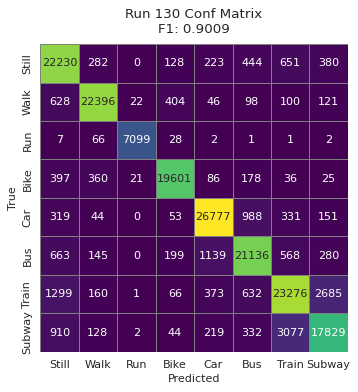


=== Run 131/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9006

Classification Report:
              precision    recall  f1-score   support

       Still     0.8360    0.9170    0.8746     24338
        Walk     0.9503    0.9404    0.9453     23815
         Run     0.9940    0.9861    0.9900      7206
        Bike     0.9574    0.9474    0.9524     20704
         Car     0.9268    0.9343    0.9306     28663
         Bus     0.8900    0.8773    0.8836     24130
       Train     0.8294    0.8142    0.8217     28492
      Subway     0.8291    0.7851    0.8065     22541

    accuracy                         0.8910    179889
   macro avg     0.9016    0.9002    0.9006    179889
weighted avg     0.8913    0.8910    0.8

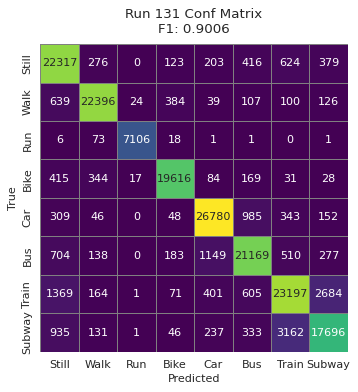


=== Run 132/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9198

Classification Report:
              precision    recall  f1-score   support

       Still     0.8609    0.9253    0.8919     24338
        Walk     0.9601    0.9512    0.9556     23815
         Run     0.9969    0.9888    0.9928      7206
        Bike     0.9679    0.9595    0.9637     20704
         Car     0.9488    0.9542    0.9515     28663
         Bus     0.9188    0.9059    0.9123     24130
       Train     0.8580    0.8445    0.8512     28492
      Subway     0.8533    0.8254    0.8391     22541

    accuracy                         0.9119    179889
   macro avg     0.9206    0.9193    0.9198    179889
weighted avg     0.9122    0.9119    0.9118  

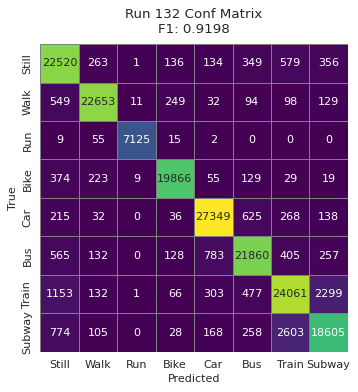


=== Run 133/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9154

Classification Report:
              precision    recall  f1-score   support

       Still     0.8511    0.9261    0.8870     24338
        Walk     0.9578    0.9483    0.9530     23815
         Run     0.9961    0.9875    0.9918      7206
        Bike     0.9658    0.9557    0.9607     20704
         Car     0.9439    0.9483    0.9461     28663
         Bus     0.9103    0.8995    0.9049     24130
       Train     0.8537    0.8388    0.8462     28492
      Subway     0.8523    0.8152    0.8333     22541

    accuracy                         0.9072    179889
   macro avg     0.9164    0.9149    0.9154    179889
weighted avg     0.9075    0.9072    0.

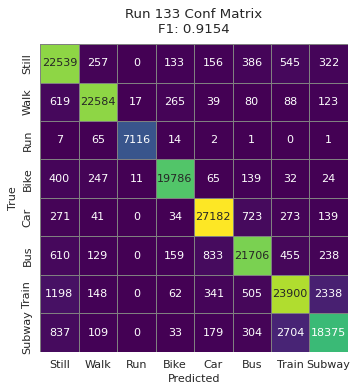


=== Run 134/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9059

Classification Report:
              precision    recall  f1-score   support

       Still     0.8446    0.9176    0.8796     24338
        Walk     0.9538    0.9430    0.9483     23815
         Run     0.9950    0.9858    0.9904      7206
        Bike     0.9573    0.9517    0.9545     20704
         Car     0.9329    0.9403    0.9366     28663
         Bus     0.8992    0.8837    0.8914     24130
       Train     0.8361    0.8251    0.8306     28492
      Subway     0.8363    0.7960    0.8157     22541

    accuracy                         0.8968    179889
   macro avg     0.9069    0.9054    0.9059    179889
weighted avg     0.8971    0.8968    0.8966  

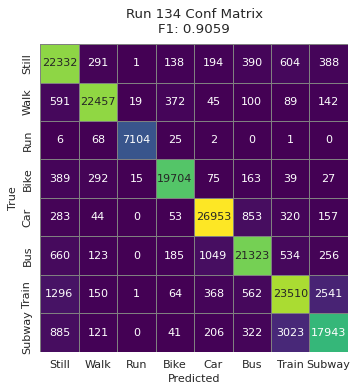


=== Run 135/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9152

Classification Report:
              precision    recall  f1-score   support

       Still     0.8491    0.9288    0.8871     24338
        Walk     0.9564    0.9472    0.9518     23815
         Run     0.9964    0.9875    0.9919      7206
        Bike     0.9647    0.9573    0.9609     20704
         Car     0.9442    0.9484    0.9463     28663
         Bus     0.9127    0.8977    0.9052     24130
       Train     0.8534    0.8376    0.8454     28492
      Subway     0.8533    0.8141    0.8332     22541

    accuracy                         0.9070    179889
   macro avg     0.9163    0.9148    0.9152    179889
weighted avg     0.9074    0.9070    0.9

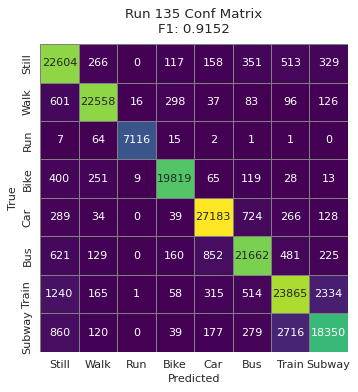


=== Run 136/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9234

Classification Report:
              precision    recall  f1-score   support

       Still     0.8655    0.9292    0.8962     24338
        Walk     0.9620    0.9526    0.9573     23815
         Run     0.9976    0.9892    0.9934      7206
        Bike     0.9697    0.9614    0.9655     20704
         Car     0.9525    0.9559    0.9542     28663
         Bus     0.9217    0.9109    0.9163     24130
       Train     0.8630    0.8534    0.8582     28492
      Subway     0.8623    0.8307    0.8462     22541

    accuracy                         0.9159    179889
   macro avg     0.9243    0.9229    0.9234    179889
weighted avg     0.9162    0.9159    

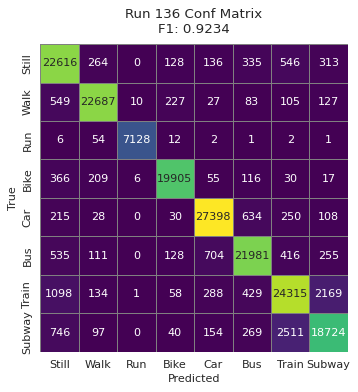


=== Run 137/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9229

Classification Report:
              precision    recall  f1-score   support

       Still     0.8591    0.9293    0.8928     24338
        Walk     0.9623    0.9512    0.9567     23815
         Run     0.9972    0.9895    0.9933      7206
        Bike     0.9702    0.9608    0.9655     20704
         Car     0.9541    0.9558    0.9549     28663
         Bus     0.9222    0.9117    0.9169     24130
       Train     0.8646    0.8504    0.8574     28492
      Subway     0.8608    0.8315    0.8459     22541

    accuracy                         0.9153    179889
   macro avg     0.9238    0.9225    0.9229    179889
weighted avg     0.9158    0.9153    

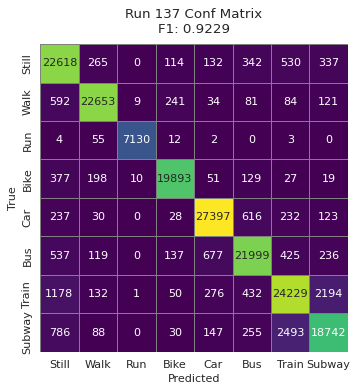


=== Run 138/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9197

Classification Report:
              precision    recall  f1-score   support

       Still     0.8632    0.9267    0.8938     24338
        Walk     0.9592    0.9498    0.9545     23815
         Run     0.9962    0.9886    0.9924      7206
        Bike     0.9660    0.9601    0.9631     20704
         Car     0.9504    0.9532    0.9518     28663
         Bus     0.9179    0.9082    0.9130     24130
       Train     0.8591    0.8448    0.8519     28492
      Subway     0.8513    0.8237    0.8373     22541

    accuracy                         0.9119    179889
   macro avg     0.9204    0.9194    0.9197    179889
weighted avg     0.9122    0.9119    0.9119

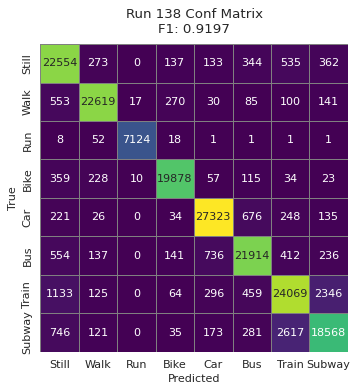


=== Run 139/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9150

Classification Report:
              precision    recall  f1-score   support

       Still     0.8469    0.9268    0.8851     24338
        Walk     0.9580    0.9468    0.9524     23815
         Run     0.9962    0.9878    0.9920      7206
        Bike     0.9647    0.9572    0.9609     20704
         Car     0.9428    0.9485    0.9456     28663
         Bus     0.9120    0.8979    0.9049     24130
       Train     0.8539    0.8382    0.8460     28492
      Subway     0.8543    0.8135    0.8334     22541

    accuracy                         0.9068    179889
   macro avg     0.9161    0.9146    0.9150    179889
weighted avg     0.9072    0.9068    0.

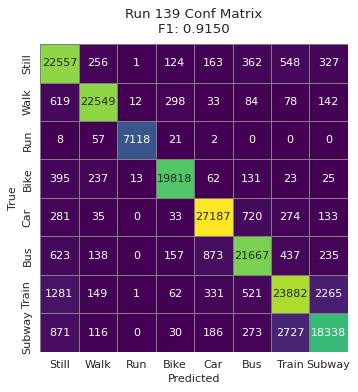


=== Run 140/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9056

Classification Report:
              precision    recall  f1-score   support

       Still     0.8458    0.9138    0.8785     24338
        Walk     0.9543    0.9409    0.9476     23815
         Run     0.9943    0.9870    0.9906      7206
        Bike     0.9582    0.9524    0.9553     20704
         Car     0.9350    0.9403    0.9376     28663
         Bus     0.8973    0.8874    0.8923     24130
       Train     0.8337    0.8222    0.8279     28492
      Subway     0.8327    0.7977    0.8148     22541

    accuracy                         0.8964    179889
   macro avg     0.9064    0.9052    0.9056    179889
weighted avg     0.8966    0.8964    0.89

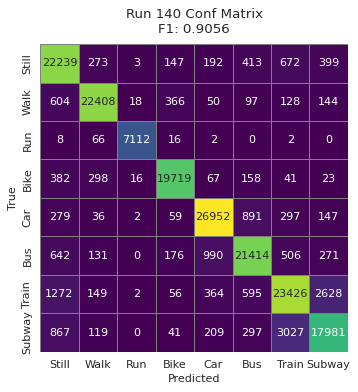


=== Run 141/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9150

Classification Report:
              precision    recall  f1-score   support

       Still     0.8590    0.9191    0.8880     24338
        Walk     0.9568    0.9483    0.9525     23815
         Run     0.9959    0.9881    0.9920      7206
        Bike     0.9649    0.9568    0.9609     20704
         Car     0.9442    0.9473    0.9458     28663
         Bus     0.9076    0.8993    0.9035     24130
       Train     0.8494    0.8387    0.8440     28492
      Subway     0.8481    0.8190    0.8333     22541

    accuracy                         0.9066    179889
   macro avg     0.9158    0.9146    0.9150    179889
weighted avg     0.9068    0.9066    0.9066 

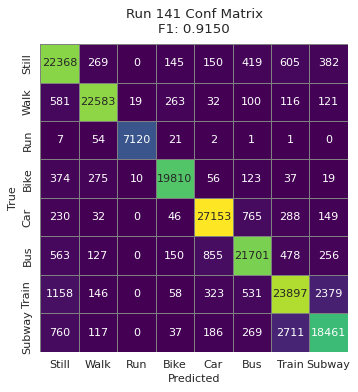


=== Run 142/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9146

Classification Report:
              precision    recall  f1-score   support

       Still     0.8541    0.9230    0.8872     24338
        Walk     0.9573    0.9473    0.9522     23815
         Run     0.9966    0.9872    0.9919      7206
        Bike     0.9636    0.9565    0.9601     20704
         Car     0.9450    0.9480    0.9465     28663
         Bus     0.9068    0.8989    0.9028     24130
       Train     0.8518    0.8389    0.8453     28492
      Subway     0.8491    0.8136    0.8310     22541

    accuracy                         0.9064    179889
   macro avg     0.9155    0.9142    0.9146    179889
weighted avg     0.9066    0.9064    0.9062   

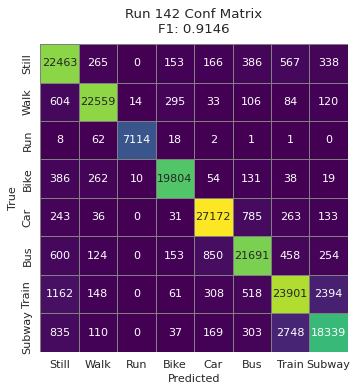


=== Run 143/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9088

Classification Report:
              precision    recall  f1-score   support

       Still     0.8415    0.9253    0.8814     24338
        Walk     0.9548    0.9445    0.9496     23815
         Run     0.9962    0.9872    0.9917      7206
        Bike     0.9612    0.9526    0.9569     20704
         Car     0.9367    0.9419    0.9393     28663
         Bus     0.9005    0.8877    0.8941     24130
       Train     0.8440    0.8286    0.8362     28492
      Subway     0.8443    0.7989    0.8209     22541

    accuracy                         0.8999    179889
   macro avg     0.9099    0.9083    0.9088    179889
weighted avg     0.9003    0.8999    0.8

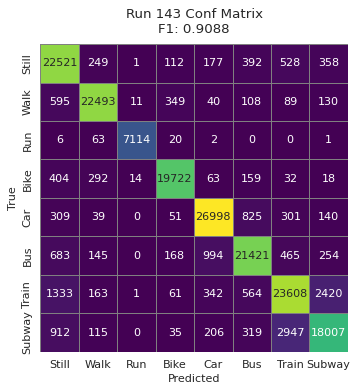


=== Run 144/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9090

Classification Report:
              precision    recall  f1-score   support

       Still     0.8453    0.9194    0.8808     24338
        Walk     0.9545    0.9458    0.9501     23815
         Run     0.9964    0.9865    0.9914      7206
        Bike     0.9621    0.9535    0.9578     20704
         Car     0.9380    0.9423    0.9402     28663
         Bus     0.9037    0.8915    0.8975     24130
       Train     0.8408    0.8284    0.8345     28492
      Subway     0.8397    0.8008    0.8198     22541

    accuracy                         0.9001    179889
   macro avg     0.9101    0.9085    0.9090    179889
weighted avg     0.9004    0.9001    0.90

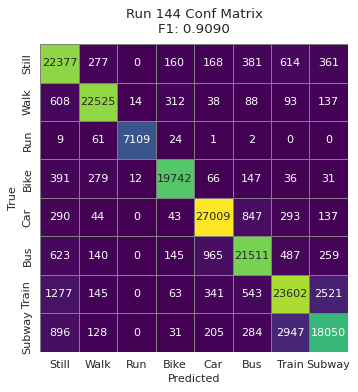


=== Run 145/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9187

Classification Report:
              precision    recall  f1-score   support

       Still     0.8603    0.9266    0.8922     24338
        Walk     0.9595    0.9497    0.9546     23815
         Run     0.9948    0.9876    0.9912      7206
        Bike     0.9664    0.9574    0.9618     20704
         Car     0.9500    0.9522    0.9511     28663
         Bus     0.9142    0.9058    0.9099     24130
       Train     0.8553    0.8449    0.8500     28492
      Subway     0.8555    0.8218    0.8383     22541

    accuracy                         0.9109    179889
   macro avg     0.9195    0.9182    0.9187    179889
weighted avg     0.9111    0.9109    0.91

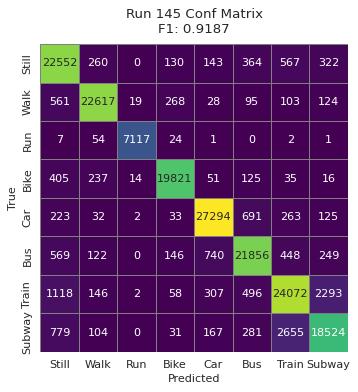


=== Run 146/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9154

Classification Report:
              precision    recall  f1-score   support

       Still     0.8575    0.9184    0.8869     24338
        Walk     0.9577    0.9464    0.9520     23815
         Run     0.9971    0.9886    0.9928      7206
        Bike     0.9624    0.9574    0.9599     20704
         Car     0.9470    0.9491    0.9480     28663
         Bus     0.9100    0.9021    0.9061     24130
       Train     0.8507    0.8420    0.8463     28492
      Subway     0.8471    0.8156    0.8310     22541

    accuracy                         0.9071    179889
   macro avg     0.9162    0.9149    0.9154    179889
weighted avg     0.9074    0.9071    0.9071 

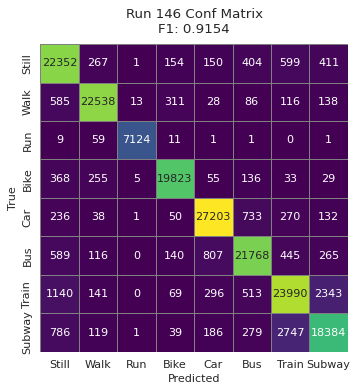


=== Run 147/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9118

Classification Report:
              precision    recall  f1-score   support

       Still     0.8539    0.9157    0.8837     24338
        Walk     0.9563    0.9473    0.9518     23815
         Run     0.9966    0.9890    0.9928      7206
        Bike     0.9617    0.9559    0.9587     20704
         Car     0.9423    0.9443    0.9433     28663
         Bus     0.9071    0.8962    0.9016     24130
       Train     0.8415    0.8334    0.8374     28492
      Subway     0.8411    0.8091    0.8248     22541

    accuracy                         0.9030    179889
   macro avg     0.9125    0.9114    0.9118    179889
weighted avg     0.9032    0.9030    0.9029   

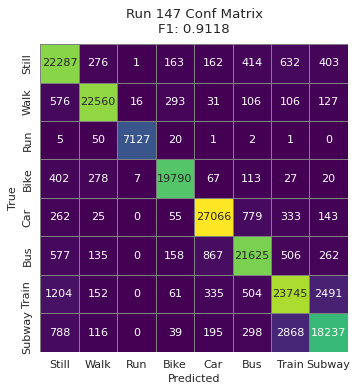


=== Run 148/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9136

Classification Report:
              precision    recall  f1-score   support

       Still     0.8573    0.9202    0.8876     24338
        Walk     0.9555    0.9469    0.9512     23815
         Run     0.9946    0.9879    0.9912      7206
        Bike     0.9629    0.9558    0.9593     20704
         Car     0.9429    0.9479    0.9454     28663
         Bus     0.9086    0.8975    0.9030     24130
       Train     0.8497    0.8375    0.8436     28492
      Subway     0.8429    0.8125    0.8274     22541

    accuracy                         0.9053    179889
   macro avg     0.9143    0.9133    0.9136    179889
weighted avg     0.9055    0.9053    0

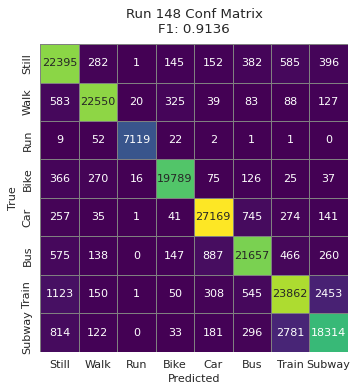


=== Run 149/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9078

Classification Report:
              precision    recall  f1-score   support

       Still     0.8386    0.9233    0.8789     24338
        Walk     0.9554    0.9455    0.9505     23815
         Run     0.9969    0.9876    0.9923      7206
        Bike     0.9631    0.9550    0.9590     20704
         Car     0.9361    0.9415    0.9388     28663
         Bus     0.9027    0.8898    0.8962     24130
       Train     0.8390    0.8222    0.8305     28492
      Subway     0.8396    0.7942    0.8163     22541

    accuracy                         0.8987    179889
   macro avg     0.9089    0.9074    0.9078    179889
weighted avg     0.8991    0.8987    0.8985   

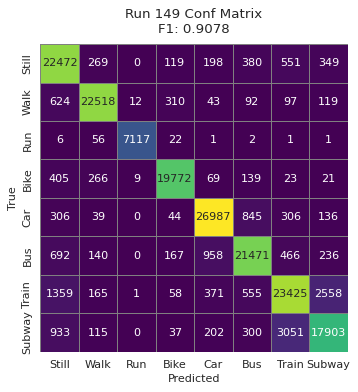


=== Run 150/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9100

Classification Report:
              precision    recall  f1-score   support

       Still     0.8523    0.9187    0.8842     24338
        Walk     0.9532    0.9440    0.9486     23815
         Run     0.9945    0.9870    0.9907      7206
        Bike     0.9587    0.9530    0.9559     20704
         Car     0.9371    0.9419    0.9395     28663
         Bus     0.8994    0.8919    0.8957     24130
       Train     0.8465    0.8319    0.8391     28492
      Subway     0.8442    0.8089    0.8262     22541

    accuracy                         0.9013    179889
   macro avg     0.9108    0.9097    0.9100    179889
weighted avg     0.9015    0.9013    0.

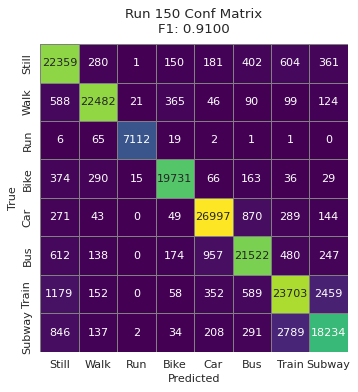


=== Run 151/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9204

Classification Report:
              precision    recall  f1-score   support

       Still     0.8567    0.9297    0.8917     24338
        Walk     0.9606    0.9508    0.9557     23815
         Run     0.9982    0.9895    0.9938      7206
        Bike     0.9687    0.9598    0.9642     20704
         Car     0.9495    0.9541    0.9518     28663
         Bus     0.9183    0.9068    0.9125     24130
       Train     0.8600    0.8446    0.8523     28492
      Subway     0.8588    0.8244    0.8412     22541

    accuracy                         0.9125    179889
   macro avg     0.9213    0.9200    0.9204    179889
weighted avg     0.9129    0.9125    0.9124 

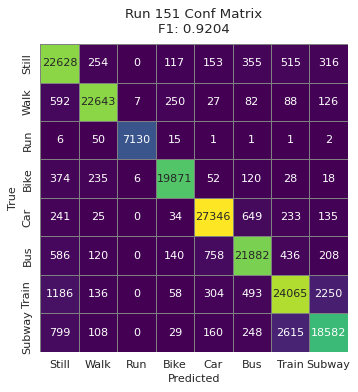


=== Run 152/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9122

Classification Report:
              precision    recall  f1-score   support

       Still     0.8460    0.9265    0.8844     24338
        Walk     0.9587    0.9472    0.9529     23815
         Run     0.9966    0.9883    0.9925      7206
        Bike     0.9656    0.9564    0.9610     20704
         Car     0.9413    0.9439    0.9426     28663
         Bus     0.9063    0.8937    0.9000     24130
       Train     0.8460    0.8302    0.8380     28492
      Subway     0.8453    0.8084    0.8265     22541

    accuracy                         0.9035    179889
   macro avg     0.9132    0.9118    0.9122    179889
weighted avg     0.9039    0.9035    0.903

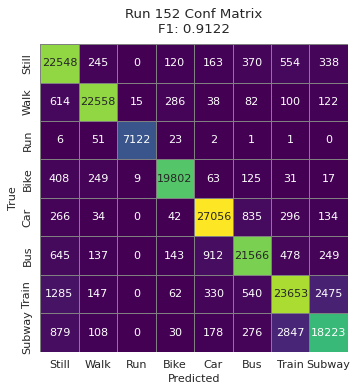


=== Run 153/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9109

Classification Report:
              precision    recall  f1-score   support

       Still     0.8496    0.9239    0.8852     24338
        Walk     0.9554    0.9447    0.9500     23815
         Run     0.9957    0.9874    0.9915      7206
        Bike     0.9607    0.9537    0.9572     20704
         Car     0.9379    0.9432    0.9405     28663
         Bus     0.9037    0.8915    0.8976     24130
       Train     0.8471    0.8318    0.8394     28492
      Subway     0.8440    0.8077    0.8255     22541

    accuracy                         0.9022    179889
   macro avg     0.9118    0.9105    0.9109    179889
weighted avg     0.9025    0.9022    0

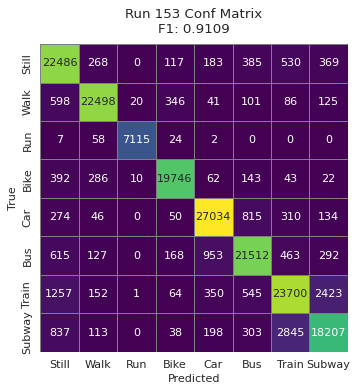


=== Run 154/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9136

Classification Report:
              precision    recall  f1-score   support

       Still     0.8558    0.9163    0.8850     24338
        Walk     0.9558    0.9456    0.9507     23815
         Run     0.9955    0.9878    0.9916      7206
        Bike     0.9634    0.9571    0.9602     20704
         Car     0.9456    0.9464    0.9460     28663
         Bus     0.9059    0.9002    0.9031     24130
       Train     0.8482    0.8374    0.8427     28492
      Subway     0.8443    0.8149    0.8293     22541

    accuracy                         0.9052    179889
   macro avg     0.9143    0.9132    0.9136    179889
weighted avg     0.9054    0.9052    0.9051 

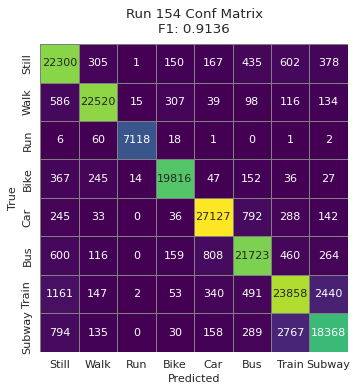


=== Run 155/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9060

Classification Report:
              precision    recall  f1-score   support

       Still     0.8423    0.9180    0.8785     24338
        Walk     0.9535    0.9438    0.9486     23815
         Run     0.9950    0.9875    0.9912      7206
        Bike     0.9584    0.9507    0.9546     20704
         Car     0.9331    0.9382    0.9357     28663
         Bus     0.8963    0.8831    0.8896     24130
       Train     0.8380    0.8258    0.8319     28492
      Subway     0.8390    0.7977    0.8178     22541

    accuracy                         0.8968    179889
   macro avg     0.9070    0.9056    0.9060    179889
weighted avg     0.8971    0.8968    0.8967  

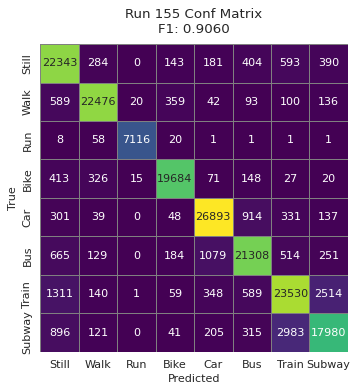


=== Run 156/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9130

Classification Report:
              precision    recall  f1-score   support

       Still     0.8503    0.9237    0.8855     24338
        Walk     0.9571    0.9460    0.9515     23815
         Run     0.9948    0.9885    0.9916      7206
        Bike     0.9638    0.9544    0.9591     20704
         Car     0.9423    0.9460    0.9441     28663
         Bus     0.9068    0.8964    0.9016     24130
       Train     0.8489    0.8352    0.8420     28492
      Subway     0.8470    0.8113    0.8288     22541

    accuracy                         0.9046    179889
   macro avg     0.9139    0.9127    0.9130    179889
weighted avg     0.9049    0.9046    0.9

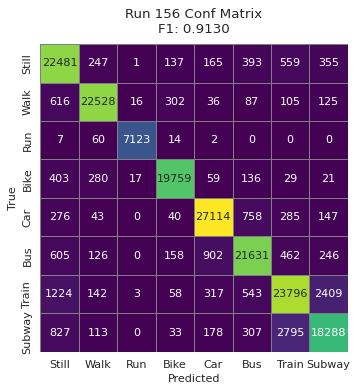


=== Run 157/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9235

Classification Report:
              precision    recall  f1-score   support

       Still     0.8600    0.9315    0.8943     24338
        Walk     0.9618    0.9509    0.9563     23815
         Run     0.9980    0.9892    0.9936      7206
        Bike     0.9695    0.9610    0.9653     20704
         Car     0.9537    0.9563    0.9550     28663
         Bus     0.9230    0.9126    0.9178     24130
       Train     0.8658    0.8509    0.8583     28492
      Subway     0.8635    0.8318    0.8473     22541

    accuracy                         0.9159    179889
   macro avg     0.9244    0.9230    0.9235    179889
weighted avg     0.9163    0.9159    0.9159

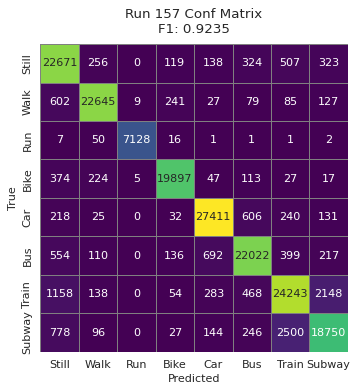


=== Run 158/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9056

Classification Report:
              precision    recall  f1-score   support

       Still     0.8360    0.9225    0.8771     24338
        Walk     0.9542    0.9429    0.9486     23815
         Run     0.9952    0.9871    0.9912      7206
        Bike     0.9581    0.9510    0.9546     20704
         Car     0.9322    0.9402    0.9362     28663
         Bus     0.8989    0.8829    0.8908     24130
       Train     0.8386    0.8230    0.8307     28492
      Subway     0.8410    0.7921    0.8158     22541

    accuracy                         0.8965    179889
   macro avg     0.9068    0.9052    0.9056    179889
weighted avg     0.8969    0.8965    0.8963

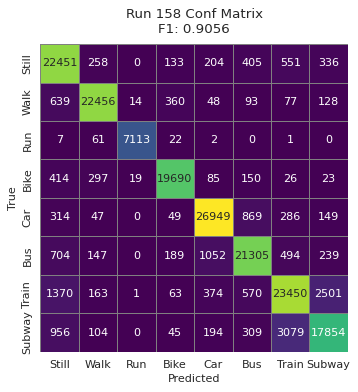


=== Run 159/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9016

Classification Report:
              precision    recall  f1-score   support

       Still     0.8372    0.9160    0.8748     24338
        Walk     0.9507    0.9414    0.9460     23815
         Run     0.9951    0.9852    0.9901      7206
        Bike     0.9570    0.9504    0.9537     20704
         Car     0.9294    0.9351    0.9322     28663
         Bus     0.8917    0.8796    0.8856     24130
       Train     0.8287    0.8167    0.8226     28492
      Subway     0.8320    0.7848    0.8077     22541

    accuracy                         0.8921    179889
   macro avg     0.9027    0.9011    0.9016    179889
weighted avg     0.8923    0.8921    0.89

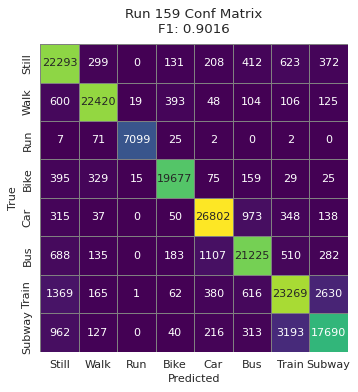


=== Run 160/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9090

Classification Report:
              precision    recall  f1-score   support

       Still     0.8408    0.9221    0.8796     24338
        Walk     0.9553    0.9458    0.9505     23815
         Run     0.9968    0.9878    0.9923      7206
        Bike     0.9634    0.9543    0.9588     20704
         Car     0.9387    0.9424    0.9405     28663
         Bus     0.9019    0.8908    0.8963     24130
       Train     0.8411    0.8277    0.8343     28492
      Subway     0.8429    0.7974    0.8195     22541

    accuracy                         0.9000    179889
   macro avg     0.9101    0.9085    0.9090    179889
weighted avg     0.9004    0.9000    0.89

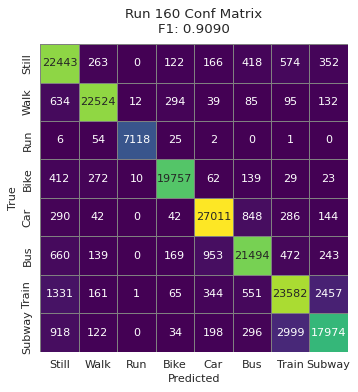


=== Run 161/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9071

Classification Report:
              precision    recall  f1-score   support

       Still     0.8361    0.9220    0.8770     24338
        Walk     0.9532    0.9434    0.9483     23815
         Run     0.9962    0.9867    0.9914      7206
        Bike     0.9596    0.9519    0.9558     20704
         Car     0.9342    0.9399    0.9370     28663
         Bus     0.8989    0.8864    0.8926     24130
       Train     0.8430    0.8251    0.8339     28492
      Subway     0.8448    0.7978    0.8207     22541

    accuracy                         0.8980    179889
   macro avg     0.9083    0.9067    0.9071    179889
weighted avg     0.8985    0.8980    0.897

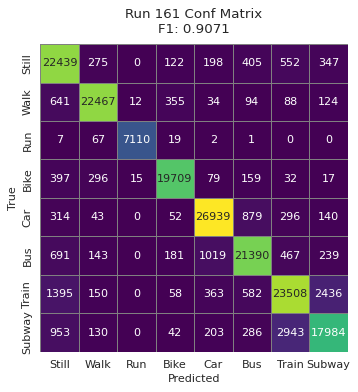


=== Run 162/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9194

Classification Report:
              precision    recall  f1-score   support

       Still     0.8591    0.9256    0.8911     24338
        Walk     0.9599    0.9496    0.9547     23815
         Run     0.9966    0.9879    0.9923      7206
        Bike     0.9663    0.9591    0.9627     20704
         Car     0.9508    0.9539    0.9524     28663
         Bus     0.9175    0.9056    0.9115     24130
       Train     0.8597    0.8445    0.8520     28492
      Subway     0.8520    0.8260    0.8388     22541

    accuracy                         0.9116    179889
   macro avg     0.9202    0.9190    0.9194    179889
weighted avg     0.9119    0.9116    0.9

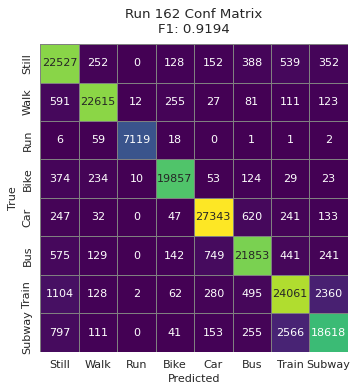


=== Run 163/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9045

Classification Report:
              precision    recall  f1-score   support

       Still     0.8436    0.9142    0.8775     24338
        Walk     0.9518    0.9410    0.9464     23815
         Run     0.9941    0.9867    0.9904      7206
        Bike     0.9548    0.9491    0.9519     20704
         Car     0.9314    0.9381    0.9347     28663
         Bus     0.8948    0.8818    0.8882     24130
       Train     0.8372    0.8234    0.8303     28492
      Subway     0.8348    0.7987    0.8164     22541

    accuracy                         0.8953    179889
   macro avg     0.9053    0.9041    0.9045    179889
weighted avg     0.8955    0.8953    0

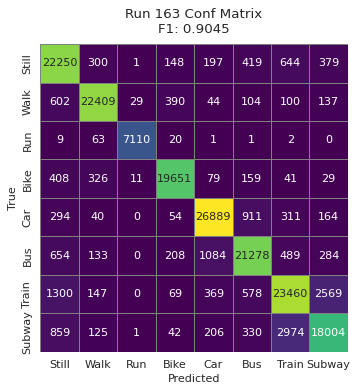


=== Run 164/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9110

Classification Report:
              precision    recall  f1-score   support

       Still     0.8439    0.9246    0.8824     24338
        Walk     0.9566    0.9448    0.9507     23815
         Run     0.9964    0.9881    0.9922      7206
        Bike     0.9621    0.9545    0.9583     20704
         Car     0.9390    0.9429    0.9409     28663
         Bus     0.9043    0.8932    0.8987     24130
       Train     0.8491    0.8302    0.8396     28492
      Subway     0.8442    0.8068    0.8251     22541

    accuracy                         0.9023    179889
   macro avg     0.9120    0.9106    0.9110    179889
weighted avg     0.9027    0.9023    0.

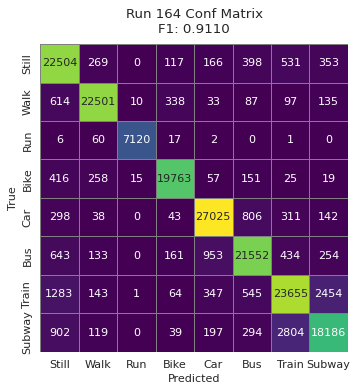


=== Run 165/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9078

Classification Report:
              precision    recall  f1-score   support

       Still     0.8366    0.9235    0.8779     24338
        Walk     0.9577    0.9460    0.9518     23815
         Run     0.9966    0.9878    0.9922      7206
        Bike     0.9633    0.9543    0.9588     20704
         Car     0.9362    0.9418    0.9390     28663
         Bus     0.9014    0.8874    0.8944     24130
       Train     0.8392    0.8231    0.8311     28492
      Subway     0.8405    0.7948    0.8170     22541

    accuracy                         0.8986    179889
   macro avg     0.9090    0.9073    0.9078    179889
weighted avg     0.8991    0.8986    0.89

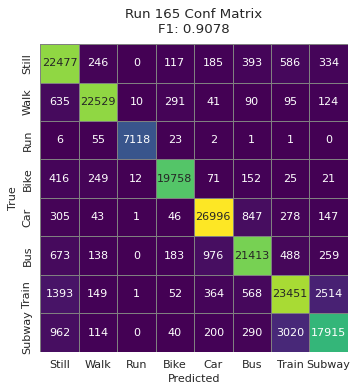


=== Run 166/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9056

Classification Report:
              precision    recall  f1-score   support

       Still     0.8458    0.9138    0.8785     24338
        Walk     0.9543    0.9409    0.9476     23815
         Run     0.9943    0.9870    0.9906      7206
        Bike     0.9582    0.9524    0.9553     20704
         Car     0.9350    0.9403    0.9376     28663
         Bus     0.8973    0.8874    0.8923     24130
       Train     0.8337    0.8222    0.8279     28492
      Subway     0.8327    0.7977    0.8148     22541

    accuracy                         0.8964    179889
   macro avg     0.9064    0.9052    0.9056    179889
weighted avg     0.8966    0.8964    0.8963 

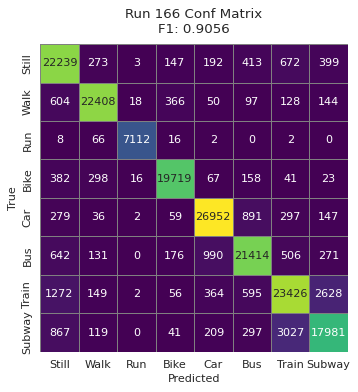


=== Run 167/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9110

Classification Report:
              precision    recall  f1-score   support

       Still     0.8559    0.9148    0.8844     24338
        Walk     0.9559    0.9463    0.9511     23815
         Run     0.9965    0.9886    0.9925      7206
        Bike     0.9622    0.9553    0.9587     20704
         Car     0.9441    0.9429    0.9435     28663
         Bus     0.9020    0.8964    0.8992     24130
       Train     0.8403    0.8333    0.8368     28492
      Subway     0.8373    0.8072    0.8220     22541

    accuracy                         0.9022    179889
   macro avg     0.9118    0.9106    0.9110    179889
weighted avg     0.9024    0.9022    0.9022  

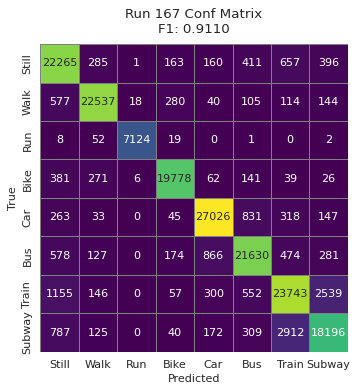


=== Run 168/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9077

Classification Report:
              precision    recall  f1-score   support

       Still     0.8497    0.9137    0.8805     24338
        Walk     0.9536    0.9427    0.9481     23815
         Run     0.9947    0.9860    0.9903      7206
        Bike     0.9589    0.9522    0.9555     20704
         Car     0.9369    0.9412    0.9390     28663
         Bus     0.8974    0.8898    0.8936     24130
       Train     0.8407    0.8280    0.8343     28492
      Subway     0.8359    0.8044    0.8199     22541

    accuracy                         0.8988    179889
   macro avg     0.9085    0.9072    0.9077    179889
weighted avg     0.8990    0.8988    0.8

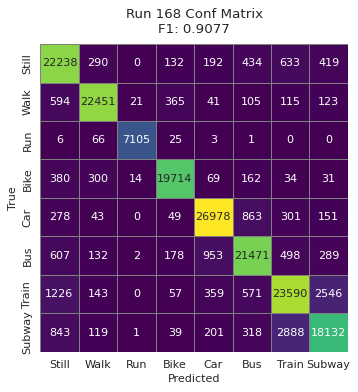


=== Run 169/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9150

Classification Report:
              precision    recall  f1-score   support

       Still     0.8512    0.9262    0.8871     24338
        Walk     0.9582    0.9480    0.9531     23815
         Run     0.9957    0.9879    0.9918      7206
        Bike     0.9667    0.9560    0.9613     20704
         Car     0.9438    0.9482    0.9460     28663
         Bus     0.9094    0.8984    0.9039     24130
       Train     0.8510    0.8398    0.8454     28492
      Subway     0.8522    0.8116    0.8314     22541

    accuracy                         0.9067    179889
   macro avg     0.9160    0.9145    0.9150    179889
weighted avg     0.9071    0.9067    0.9

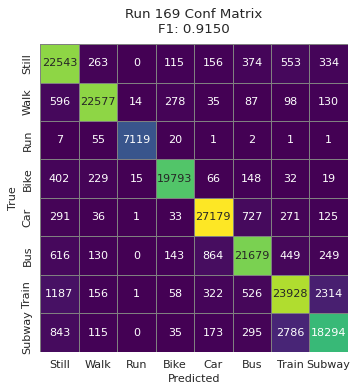


=== Run 170/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9207

Classification Report:
              precision    recall  f1-score   support

       Still     0.8606    0.9281    0.8931     24338
        Walk     0.9609    0.9485    0.9547     23815
         Run     0.9961    0.9882    0.9921      7206
        Bike     0.9669    0.9590    0.9630     20704
         Car     0.9499    0.9537    0.9518     28663
         Bus     0.9173    0.9080    0.9126     24130
       Train     0.8621    0.8483    0.8552     28492
      Subway     0.8584    0.8283    0.8431     22541

    accuracy                         0.9130    179889
   macro avg     0.9215    0.9203    0.9207    179889
weighted avg     0.9133    0.9130    0.9129

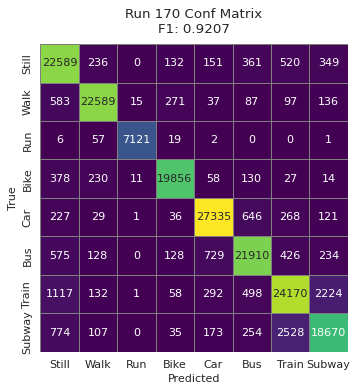


=== Run 171/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9139

Classification Report:
              precision    recall  f1-score   support

       Still     0.8572    0.9148    0.8851     24338
        Walk     0.9564    0.9481    0.9522     23815
         Run     0.9973    0.9889    0.9931      7206
        Bike     0.9643    0.9580    0.9611     20704
         Car     0.9443    0.9461    0.9452     28663
         Bus     0.9065    0.8996    0.9030     24130
       Train     0.8457    0.8379    0.8418     28492
      Subway     0.8460    0.8146    0.8300     22541

    accuracy                         0.9053    179889
   macro avg     0.9147    0.9135    0.9139    179889
weighted avg     0.9055    0.9053    0

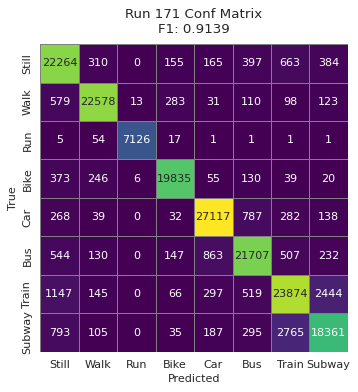


=== Run 172/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9156

Classification Report:
              precision    recall  f1-score   support

       Still     0.8485    0.9264    0.8857     24338
        Walk     0.9590    0.9492    0.9541     23815
         Run     0.9973    0.9882    0.9928      7206
        Bike     0.9653    0.9572    0.9612     20704
         Car     0.9446    0.9483    0.9465     28663
         Bus     0.9126    0.9004    0.9065     24130
       Train     0.8524    0.8385    0.8454     28492
      Subway     0.8534    0.8127    0.8326     22541

    accuracy                         0.9073    179889
   macro avg     0.9167    0.9151    0.9156    179889
weighted avg     0.9077    0.9073    0.907

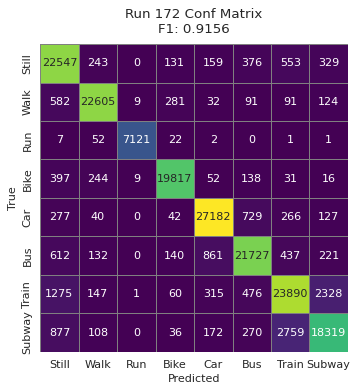


=== Run 173/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9175

Classification Report:
              precision    recall  f1-score   support

       Still     0.8611    0.9211    0.8901     24338
        Walk     0.9581    0.9506    0.9543     23815
         Run     0.9955    0.9876    0.9916      7206
        Bike     0.9664    0.9583    0.9623     20704
         Car     0.9491    0.9502    0.9496     28663
         Bus     0.9127    0.9047    0.9087     24130
       Train     0.8546    0.8441    0.8493     28492
      Subway     0.8483    0.8201    0.8340     22541

    accuracy                         0.9095    179889
   macro avg     0.9182    0.9171    0.9175    179889
weighted avg     0.9097    0.9095    0.9095

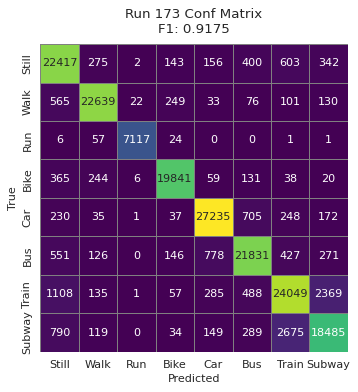


=== Run 174/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9232

Classification Report:
              precision    recall  f1-score   support

       Still     0.8637    0.9274    0.8944     24338
        Walk     0.9609    0.9510    0.9559     23815
         Run     0.9966    0.9890    0.9928      7206
        Bike     0.9678    0.9618    0.9648     20704
         Car     0.9544    0.9558    0.9551     28663
         Bus     0.9203    0.9137    0.9170     24130
       Train     0.8679    0.8507    0.8592     28492
      Subway     0.8590    0.8335    0.8461     22541

    accuracy                         0.9157    179889
   macro avg     0.9238    0.9229    0.9232    179889
weighted avg     0.9160    0.9157    0.91

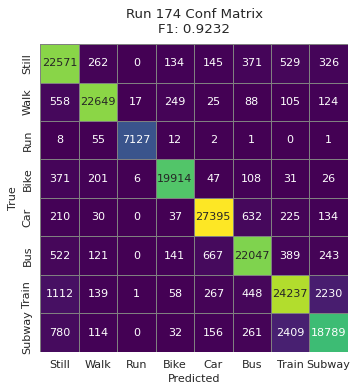


=== Run 175/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9080

Classification Report:
              precision    recall  f1-score   support

       Still     0.8505    0.9159    0.8820     24338
        Walk     0.9551    0.9432    0.9491     23815
         Run     0.9934    0.9875    0.9905      7206
        Bike     0.9594    0.9522    0.9558     20704
         Car     0.9372    0.9411    0.9391     28663
         Bus     0.8996    0.8886    0.8941     24130
       Train     0.8397    0.8265    0.8331     28492
      Subway     0.8346    0.8066    0.8204     22541

    accuracy                         0.8991    179889
   macro avg     0.9087    0.9077    0.9080    179889
weighted avg     0.8993    0.8991    0.89

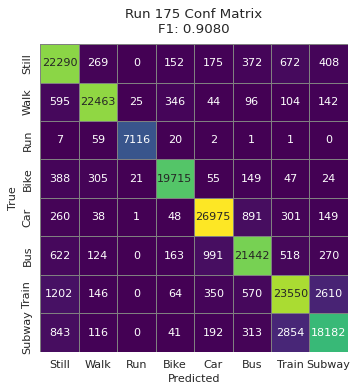


=== Run 176/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 7, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9247

Classification Report:
              precision    recall  f1-score   support

       Still     0.8607    0.9336    0.8957     24338
        Walk     0.9614    0.9512    0.9563     23815
         Run     0.9972    0.9889    0.9930      7206
        Bike     0.9697    0.9603    0.9650     20704
         Car     0.9553    0.9578    0.9565     28663
         Bus     0.9235    0.9125    0.9180     24130
       Train     0.8711    0.8539    0.8624     28492
      Subway     0.8658    0.8362    0.8507     22541

    accuracy                         0.9174    179889
   macro avg     0.9256    0.9243    0.9247    179889
weighted avg     0.9178    0.9174    0.91

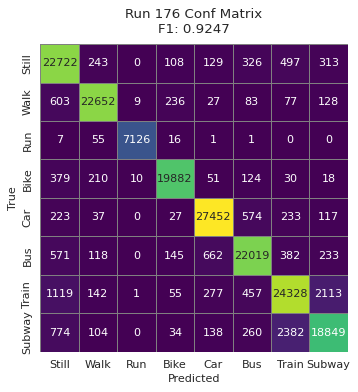


=== Run 177/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9023

Classification Report:
              precision    recall  f1-score   support

       Still     0.8364    0.9170    0.8748     24338
        Walk     0.9526    0.9413    0.9469     23815
         Run     0.9948    0.9863    0.9905      7206
        Bike     0.9566    0.9506    0.9536     20704
         Car     0.9300    0.9361    0.9330     28663
         Bus     0.8926    0.8793    0.8859     24130
       Train     0.8319    0.8192    0.8255     28492
      Subway     0.8324    0.7856    0.8083     22541

    accuracy                         0.8929    179889
   macro avg     0.9034    0.9019    0.9023    179889
weighted avg     0.8932    0.8929    0.8

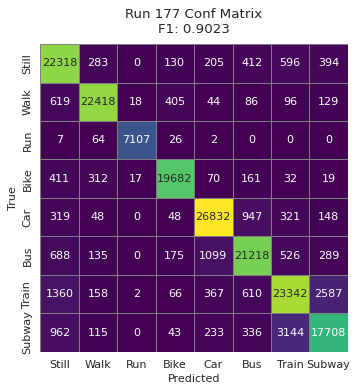


=== Run 178/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9189

Classification Report:
              precision    recall  f1-score   support

       Still     0.8585    0.9238    0.8900     24338
        Walk     0.9594    0.9487    0.9540     23815
         Run     0.9961    0.9876    0.9918      7206
        Bike     0.9669    0.9590    0.9629     20704
         Car     0.9503    0.9532    0.9518     28663
         Bus     0.9170    0.9068    0.9118     24130
       Train     0.8564    0.8450    0.8507     28492
      Subway     0.8533    0.8232    0.8380     22541

    accuracy                         0.9110    179889
   macro avg     0.9197    0.9184    0.9189    179889
weighted avg     0.9113    0.9110    0.9

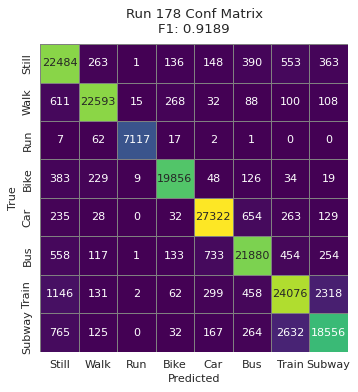


=== Run 179/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9254

Classification Report:
              precision    recall  f1-score   support

       Still     0.8705    0.9295    0.8991     24338
        Walk     0.9616    0.9531    0.9573     23815
         Run     0.9971    0.9889    0.9930      7206
        Bike     0.9692    0.9624    0.9658     20704
         Car     0.9561    0.9594    0.9578     28663
         Bus     0.9261    0.9164    0.9212     24130
       Train     0.8670    0.8560    0.8615     28492
      Subway     0.8618    0.8343    0.8478     22541

    accuracy                         0.9182    179889
   macro avg     0.9262    0.9250    0.9254    179889
weighted avg     0.9184    0.9182    0.9182

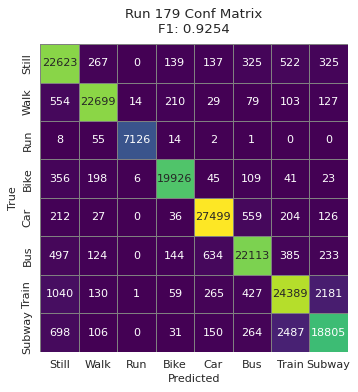


=== Run 180/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9235

Classification Report:
              precision    recall  f1-score   support

       Still     0.8600    0.9315    0.8943     24338
        Walk     0.9618    0.9509    0.9563     23815
         Run     0.9980    0.9892    0.9936      7206
        Bike     0.9695    0.9610    0.9653     20704
         Car     0.9536    0.9563    0.9550     28663
         Bus     0.9230    0.9126    0.9178     24130
       Train     0.8657    0.8509    0.8582     28492
      Subway     0.8635    0.8318    0.8473     22541

    accuracy                         0.9159    179889
   macro avg     0.9244    0.9230    0.9235    179889
weighted avg     0.9163    0.9159    0.9159

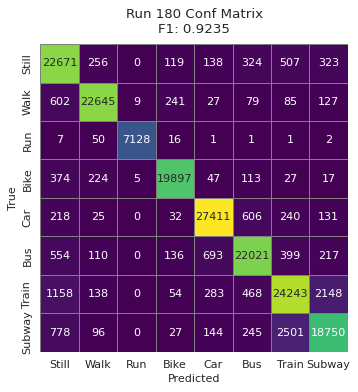


=== Run 181/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9154

Classification Report:
              precision    recall  f1-score   support

       Still     0.8559    0.9242    0.8888     24338
        Walk     0.9574    0.9455    0.9514     23815
         Run     0.9961    0.9876    0.9918      7206
        Bike     0.9621    0.9564    0.9592     20704
         Car     0.9426    0.9490    0.9458     28663
         Bus     0.9127    0.8985    0.9055     24130
       Train     0.8524    0.8408    0.8466     28492
      Subway     0.8513    0.8174    0.8340     22541

    accuracy                         0.9072    179889
   macro avg     0.9163    0.9149    0.9154    179889
weighted avg     0.9075    0.9072    0.9071 

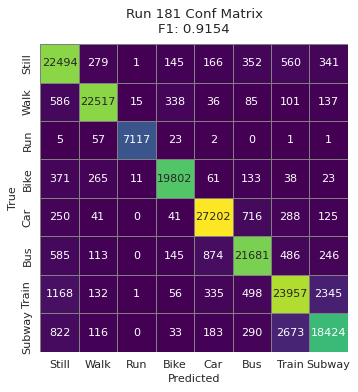


=== Run 182/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9180

Classification Report:
              precision    recall  f1-score   support

       Still     0.8521    0.9313    0.8900     24338
        Walk     0.9594    0.9489    0.9541     23815
         Run     0.9962    0.9876    0.9919      7206
        Bike     0.9668    0.9568    0.9618     20704
         Car     0.9464    0.9498    0.9481     28663
         Bus     0.9145    0.9019    0.9081     24130
       Train     0.8603    0.8444    0.8523     28492
      Subway     0.8563    0.8193    0.8374     22541

    accuracy                         0.9100    179889
   macro avg     0.9190    0.9175    0.9180    179889
weighted avg     0.9105    0.9100    0.9

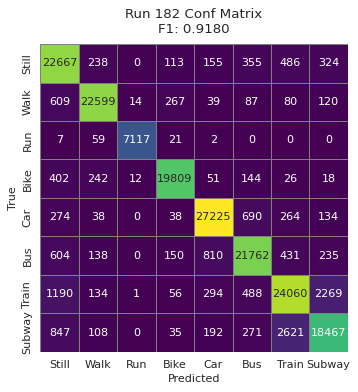


=== Run 183/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9138

Classification Report:
              precision    recall  f1-score   support

       Still     0.8546    0.9237    0.8878     24338
        Walk     0.9584    0.9476    0.9530     23815
         Run     0.9941    0.9874    0.9907      7206
        Bike     0.9643    0.9559    0.9601     20704
         Car     0.9443    0.9471    0.9457     28663
         Bus     0.9058    0.8981    0.9019     24130
       Train     0.8469    0.8370    0.8419     28492
      Subway     0.8488    0.8103    0.8291     22541

    accuracy                         0.9055    179889
   macro avg     0.9146    0.9134    0.9138    179889
weighted avg     0.9058    0.9055    0.9

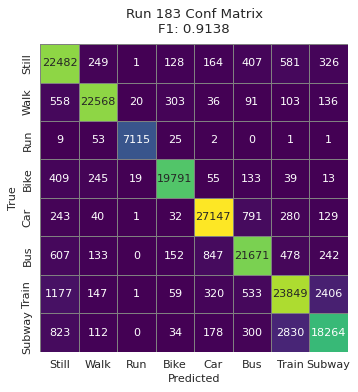


=== Run 184/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.8997

Classification Report:
              precision    recall  f1-score   support

       Still     0.8391    0.9141    0.8750     24338
        Walk     0.9488    0.9407    0.9447     23815
         Run     0.9929    0.9857    0.9893      7206
        Bike     0.9543    0.9459    0.9501     20704
         Car     0.9249    0.9318    0.9283     28663
         Bus     0.8902    0.8763    0.8832     24130
       Train     0.8283    0.8165    0.8223     28492
      Subway     0.8266    0.7838    0.8046     22541

    accuracy                         0.8901    179889
   macro avg     0.9006    0.8993    0.8997    179889
weighted avg     0.8903    0.8901    0.

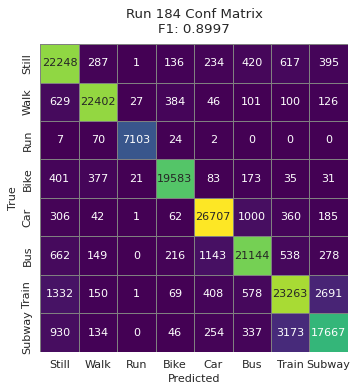


=== Run 185/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 64, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9125

Classification Report:
              precision    recall  f1-score   support

       Still     0.8505    0.9234    0.8854     24338
        Walk     0.9580    0.9462    0.9521     23815
         Run     0.9948    0.9865    0.9907      7206
        Bike     0.9625    0.9548    0.9586     20704
         Car     0.9411    0.9453    0.9432     28663
         Bus     0.9034    0.8947    0.8990     24130
       Train     0.8496    0.8352    0.8423     28492
      Subway     0.8475    0.8106    0.8286     22541

    accuracy                         0.9041    179889
   macro avg     0.9134    0.9121    0.9125    179889
weighted avg     0.9044    0.9041    0.904

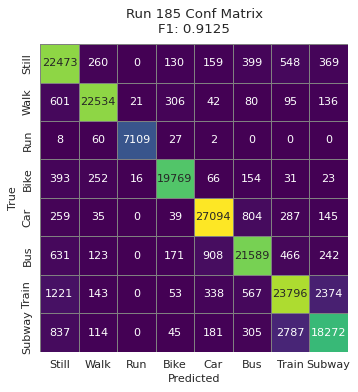


=== Run 186/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9256

Classification Report:
              precision    recall  f1-score   support

       Still     0.8698    0.9300    0.8989     24338
        Walk     0.9613    0.9528    0.9570     23815
         Run     0.9968    0.9885    0.9926      7206
        Bike     0.9699    0.9627    0.9663     20704
         Car     0.9576    0.9586    0.9581     28663
         Bus     0.9253    0.9167    0.9210     24130
       Train     0.8684    0.8570    0.8627     28492
      Subway     0.8619    0.8354    0.8484     22541

    accuracy                         0.9185    179889
   macro avg     0.9264    0.9252    0.9256    179889
weighted avg     0.9187    0.9185    0.918

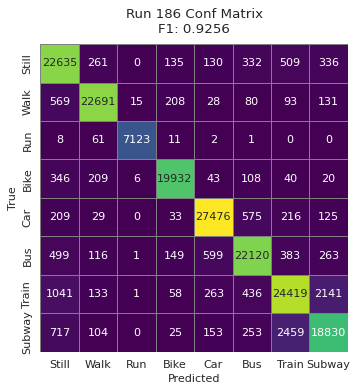


=== Run 187/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9186

Classification Report:
              precision    recall  f1-score   support

       Still     0.8607    0.9226    0.8906     24338
        Walk     0.9590    0.9499    0.9545     23815
         Run     0.9968    0.9886    0.9927      7206
        Bike     0.9655    0.9593    0.9624     20704
         Car     0.9483    0.9509    0.9496     28663
         Bus     0.9161    0.9053    0.9107     24130
       Train     0.8545    0.8464    0.8504     28492
      Subway     0.8543    0.8217    0.8377     22541

    accuracy                         0.9106    179889
   macro avg     0.9194    0.9181    0.9186    179889
weighted avg     0.9108    0.9106    0.9105

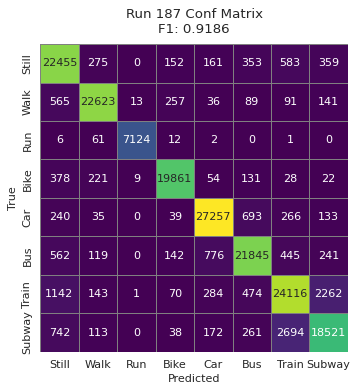


=== Run 188/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 10, 'od_wait': 20, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9182

Classification Report:
              precision    recall  f1-score   support

       Still     0.8635    0.9200    0.8909     24338
        Walk     0.9575    0.9495    0.9535     23815
         Run     0.9962    0.9885    0.9923      7206
        Bike     0.9662    0.9583    0.9622     20704
         Car     0.9492    0.9508    0.9500     28663
         Bus     0.9129    0.9077    0.9103     24130
       Train     0.8554    0.8451    0.8502     28492
      Subway     0.8502    0.8224    0.8361     22541

    accuracy                         0.9102    179889
   macro avg     0.9189    0.9178    0.9182    179889
weighted avg     0.9104    0.9102    0.9102

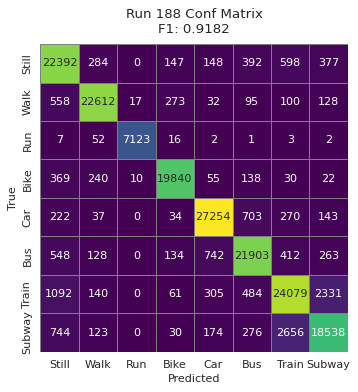


=== Run 189/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.3, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9158

Classification Report:
              precision    recall  f1-score   support

       Still     0.8553    0.9261    0.8893     24338
        Walk     0.9571    0.9464    0.9517     23815
         Run     0.9962    0.9885    0.9923      7206
        Bike     0.9630    0.9562    0.9596     20704
         Car     0.9439    0.9484    0.9461     28663
         Bus     0.9093    0.8990    0.9041     24130
       Train     0.8564    0.8393    0.8477     28492
      Subway     0.8515    0.8199    0.8354     22541

    accuracy                         0.9076    179889
   macro avg     0.9166    0.9155    0.9158    179889
weighted avg     0.9079    0.9076    0.9075

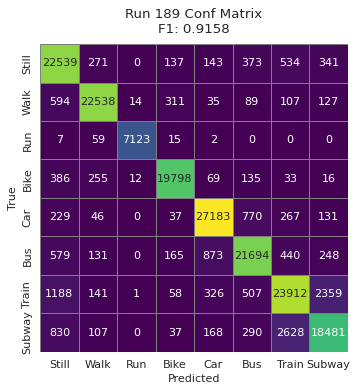


=== Run 190/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9100

Classification Report:
              precision    recall  f1-score   support

       Still     0.8554    0.9157    0.8845     24338
        Walk     0.9531    0.9443    0.9487     23815
         Run     0.9930    0.9871    0.9900      7206
        Bike     0.9599    0.9545    0.9572     20704
         Car     0.9406    0.9437    0.9421     28663
         Bus     0.8997    0.8939    0.8968     24130
       Train     0.8425    0.8323    0.8374     28492
      Subway     0.8409    0.8061    0.8231     22541

    accuracy                         0.9014    179889
   macro avg     0.9106    0.9097    0.9100    179889
weighted avg     0.9015    0.9014    0.

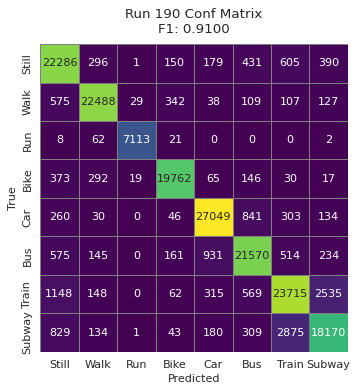


=== Run 191/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9226

Classification Report:
              precision    recall  f1-score   support

       Still     0.8661    0.9238    0.8940     24338
        Walk     0.9597    0.9516    0.9556     23815
         Run     0.9966    0.9889    0.9928      7206
        Bike     0.9686    0.9616    0.9651     20704
         Car     0.9549    0.9558    0.9554     28663
         Bus     0.9219    0.9137    0.9178     24130
       Train     0.8618    0.8524    0.8571     28492
      Subway     0.8566    0.8293    0.8427     22541

    accuracy                         0.9150    179889
   macro avg     0.9233    0.9221    0.9226    179889
weighted avg     0.9153    0.9150    0.

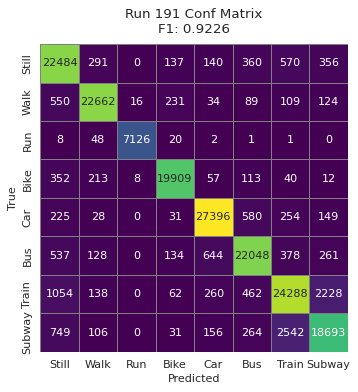


=== Run 192/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 3, 'learning_rate': 0.4, 'l2_leaf_reg': 7, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9202

Classification Report:
              precision    recall  f1-score   support

       Still     0.8648    0.9236    0.8932     24338
        Walk     0.9596    0.9486    0.9541     23815
         Run     0.9958    0.9882    0.9920      7206
        Bike     0.9671    0.9604    0.9638     20704
         Car     0.9506    0.9540    0.9523     28663
         Bus     0.9162    0.9093    0.9127     24130
       Train     0.8591    0.8487    0.8538     28492
      Subway     0.8543    0.8255    0.8397     22541

    accuracy                         0.9125    179889
   macro avg     0.9209    0.9198    0.9202    179889
weighted avg     0.9127    0.9125    0.912

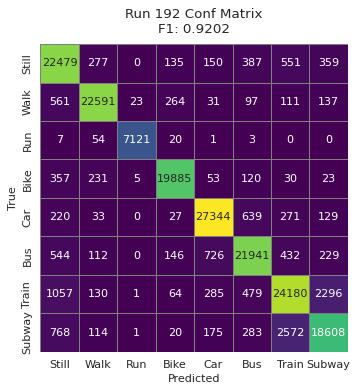


=== Run 193/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 20, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9223

Classification Report:
              precision    recall  f1-score   support

       Still     0.8644    0.9256    0.8940     24338
        Walk     0.9602    0.9509    0.9555     23815
         Run     0.9973    0.9893    0.9933      7206
        Bike     0.9672    0.9611    0.9641     20704
         Car     0.9532    0.9550    0.9541     28663
         Bus     0.9204    0.9114    0.9159     24130
       Train     0.8625    0.8515    0.8569     28492
      Subway     0.8592    0.8304    0.8446     22541

    accuracy                         0.9147    179889
   macro avg     0.9231    0.9219    0.9223    179889
weighted avg     0.9150    0.9147    0.9

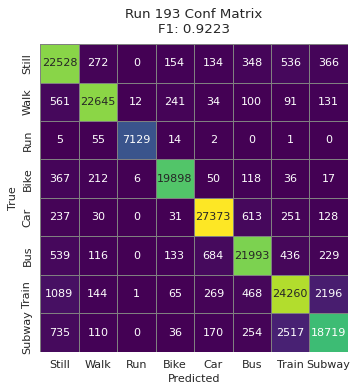


=== Run 194/200 — Params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'IncToDec', 'min_data_in_leaf': 10, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9201

Classification Report:
              precision    recall  f1-score   support

       Still     0.8548    0.9285    0.8901     24338
        Walk     0.9624    0.9500    0.9561     23815
         Run     0.9976    0.9883    0.9930      7206
        Bike     0.9682    0.9602    0.9642     20704
         Car     0.9496    0.9523    0.9509     28663
         Bus     0.9197    0.9070    0.9133     24130
       Train     0.8581    0.8472    0.8526     28492
      Subway     0.8588    0.8229    0.8405     22541

    accuracy                         0.9122    179889
   macro avg     0.9211    0.9195    0.9201    179889
weighted avg     0.9126    0.9122    0.

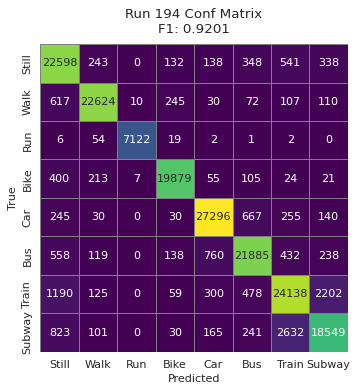


=== Run 195/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 31, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 5, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9119

Classification Report:
              precision    recall  f1-score   support

       Still     0.8439    0.9243    0.8823     24338
        Walk     0.9562    0.9468    0.9515     23815
         Run     0.9968    0.9883    0.9925      7206
        Bike     0.9631    0.9551    0.9591     20704
         Car     0.9403    0.9457    0.9430     28663
         Bus     0.9069    0.8925    0.8996     24130
       Train     0.8475    0.8327    0.8401     28492
      Subway     0.8494    0.8065    0.8274     22541

    accuracy                         0.9033    179889
   macro avg     0.9130    0.9115    0.9119    179889
weighted avg     0.9037    0.9033    0.9031

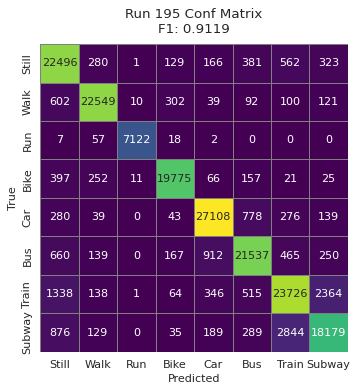


=== Run 196/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 50, 'od_type': 'Iter', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9221

Classification Report:
              precision    recall  f1-score   support

       Still     0.8632    0.9278    0.8944     24338
        Walk     0.9603    0.9510    0.9556     23815
         Run     0.9978    0.9889    0.9933      7206
        Bike     0.9689    0.9605    0.9647     20704
         Car     0.9521    0.9540    0.9531     28663
         Bus     0.9181    0.9120    0.9150     24130
       Train     0.8643    0.8516    0.8579     28492
      Subway     0.8588    0.8272    0.8427     22541

    accuracy                         0.9145    179889
   macro avg     0.9229    0.9216    0.9221    179889
weighted avg     0.9147    0.9145    0.9144  

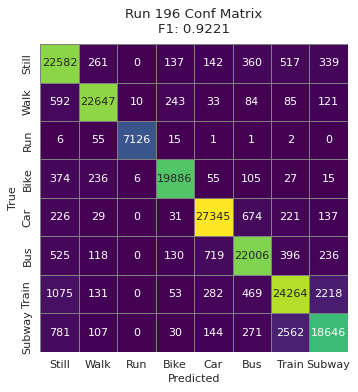


=== Run 197/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 10, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9153

Classification Report:
              precision    recall  f1-score   support

       Still     0.8499    0.9261    0.8864     24338
        Walk     0.9581    0.9481    0.9531     23815
         Run     0.9964    0.9882    0.9923      7206
        Bike     0.9665    0.9568    0.9616     20704
         Car     0.9451    0.9483    0.9467     28663
         Bus     0.9099    0.8990    0.9044     24130
       Train     0.8523    0.8393    0.8457     28492
      Subway     0.8525    0.8133    0.8324     22541

    accuracy                         0.9070    179889
   macro avg     0.9163    0.9149    0.9153    179889
weighted avg     0.9074    0.9070    0.906

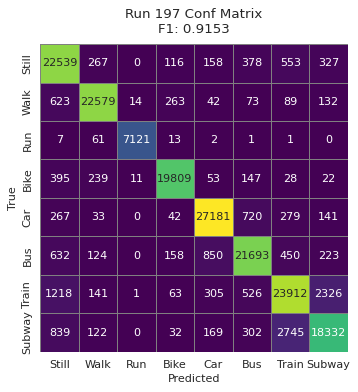


=== Run 198/200 — Params: {'rsm': 1, 'random_strength': 10, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 5, 'max_leaves': 64, 'max_ctr_complexity': 1, 'learning_rate': 0.4, 'l2_leaf_reg': 3, 'iterations': 750, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9141

Classification Report:
              precision    recall  f1-score   support

       Still     0.8569    0.9204    0.8875     24338
        Walk     0.9570    0.9481    0.9525     23815
         Run     0.9950    0.9882    0.9916      7206
        Bike     0.9631    0.9570    0.9600     20704
         Car     0.9429    0.9469    0.9449     28663
         Bus     0.9095    0.8986    0.9040     24130
       Train     0.8501    0.8383    0.8441     28492
      Subway     0.8441    0.8126    0.8280     22541

    accuracy                         0.9058    179889
   macro avg     0.9148    0.9138    0.9141    179889
weighted avg     0.9060    0.9058    0.

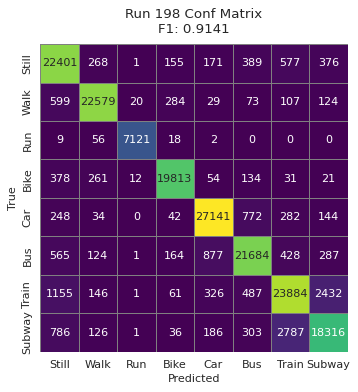


=== Run 199/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 2, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 5, 'max_leaves': 31, 'max_ctr_complexity': 2, 'learning_rate': 0.3, 'l2_leaf_reg': 5, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 6, 'bootstrap_type': 'Bernoulli'} ===
Macro F1: 0.9067

Classification Report:
              precision    recall  f1-score   support

       Still     0.8418    0.9180    0.8782     24338
        Walk     0.9544    0.9432    0.9488     23815
         Run     0.9954    0.9881    0.9917      7206
        Bike     0.9590    0.9532    0.9561     20704
         Car     0.9360    0.9390    0.9375     28663
         Bus     0.8975    0.8886    0.8930     24130
       Train     0.8379    0.8225    0.8301     28492
      Subway     0.8386    0.7987    0.8182     22541

    accuracy                         0.8975    179889
   macro avg     0.9076    0.9064    0.9067    179889
weighted avg     0.8978    0.8975    0.8974  

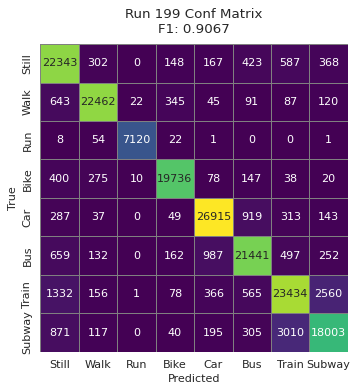


=== Run 200/200 — Params: {'rsm': 1, 'random_strength': 5, 'one_hot_max_size': 20, 'od_wait': 100, 'od_type': 'Iter', 'min_data_in_leaf': 10, 'max_leaves': 31, 'max_ctr_complexity': 3, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 500, 'grow_policy': 'Lossguide', 'depth': 10, 'bootstrap_type': 'Bayesian'} ===
Macro F1: 0.9005

Classification Report:
              precision    recall  f1-score   support

       Still     0.8296    0.9201    0.8725     24338
        Walk     0.9524    0.9419    0.9472     23815
         Run     0.9954    0.9857    0.9905      7206
        Bike     0.9569    0.9492    0.9530     20704
         Car     0.9272    0.9346    0.9309     28663
         Bus     0.8909    0.8768    0.8838     24130
       Train     0.8311    0.8125    0.8217     28492
      Subway     0.8302    0.7798    0.8042     22541

    accuracy                         0.8908    179889
   macro avg     0.9017    0.9001    0.9005    179889
weighted avg     0.8912    0.8908    0.8906

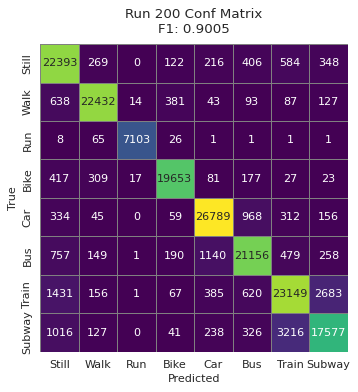


Best CatBoost params: {'rsm': 1, 'random_strength': 1, 'one_hot_max_size': 20, 'od_wait': 50, 'od_type': 'IncToDec', 'min_data_in_leaf': 1, 'max_leaves': 128, 'max_ctr_complexity': 1, 'learning_rate': 0.2, 'l2_leaf_reg': 1, 'iterations': 1000, 'grow_policy': 'Lossguide', 'depth': 8, 'bootstrap_type': 'Bernoulli'}
Best test-set macro F1: 0.9283


In [9]:
import gc
from numba import cuda
from tqdm.auto import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# ** New import **
from catboost import CatBoostClassifier  

# === 0. Number of random configs ===
n_iter_search = 200

# === 0.b CLEAN-UP df_wide ===
df_wide.replace([np.inf, -np.inf], np.nan, inplace=True)
df_wide.dropna(axis=1, how='all', inplace=True)
for meta in ['split','subdir']:
    if meta in df_wide.columns:
        df_wide.drop(columns=[meta], inplace=True)

# === 1. Sample data (100%) ===
df_sample = df_wide.sample(frac=1, random_state=42).reset_index(drop=True)
print("Sampled shape (100%):", df_sample.shape)
print("Mode distribution in sample:\n", df_sample['mode'].value_counts())

# === 2. Features & labels ===
X = df_sample.drop(columns=['window_id','mode'], errors='ignore')
y = df_sample['mode']

# === 3. Train/Test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# === 4. Encode y for multiclass (0–7) ===
y_train_enc = y_train.astype(int) - 1
y_test_enc  = y_test.astype(int)  - 1

sns.set_style("white")
cmap_choice = plt.cm.viridis
labels = ["Still","Walk","Run","Bike","Car","Bus","Train","Subway"]

# === 5. Hyperparameter space for CatBoost ===
param_dist = {
    # core parameters
    'iterations':        [500, 750, 1000],
    'learning_rate':     [0.2, 0.3, 0.4],
    'depth':             [6, 8, 10],

    # sampling & bagging
    'bootstrap_type':       ['Bayesian','Bernoulli'],

    # tree growth
    'grow_policy':       ['Lossguide'],
    'min_data_in_leaf':  [1, 5, 10],
    'max_leaves':        [31, 64, 128],

    # regularization
    'l2_leaf_reg':       [1, 3, 5, 7],
    'random_strength':   [1, 5, 10],
    'rsm':               [1],

    # categorical & feature interactions
    'one_hot_max_size':  [2, 10, 20],
    'max_ctr_complexity':[1, 2, 3],

    # overfitting detection
    'od_type':           ['Iter','IncToDec'],
    'od_wait':           [20, 50, 100],
}

param_list = list(ParameterSampler(param_dist, n_iter_search, random_state=42))

best_f1, best_params = -1.0, None

for idx, params in enumerate(param_list, start=1):
    print(f"\n=== Run {idx}/{n_iter_search} — Params: {params} ===")

    # — Instantiate CatBoost with GPU
    model = CatBoostClassifier(
        task_type='GPU',      # GPU acceleration
        devices='0',
        verbose=0,
        **params
    )

    model.fit(X_train, y_train_enc, 
              eval_set=(X_test, y_test_enc),
              early_stopping_rounds=30)

    y_pred = model.predict(X_test)
    f1 = f1_score(y_test_enc, y_pred, average='macro')
    print(f"Macro F1: {f1:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred,
                                target_names=labels, digits=4))

    cm = confusion_matrix(y_test_enc, y_pred)
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    plt.figure(figsize=(6,5), dpi=80)
    sns.heatmap(cm_df, annot=True, fmt='d',
                cmap=cmap_choice, linewidths=0.5,
                linecolor='gray', square=True, cbar=False)
    plt.title(f"Run {idx} Conf Matrix\nF1: {f1:.4f}", pad=10)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.tight_layout(); plt.show()

    if f1 > best_f1:
        best_f1, best_params = f1, params

print("\n" + "="*50)
print("Best CatBoost params:", best_params)
print(f"Best test-set macro F1: {best_f1:.4f}")
print("="*50)
